In [1]:
%matplotlib notebook
import numpy as np
import matplotlib.pyplot as plt
from lcls_beamline_toolbox.xraybeamline2d import beam1d as beam, optics1d as optics, beamline1d as beamline

### Beam parameters

In [15]:
# number of sampling points
N = 2048
# photon energy in eV
E0 = 9000

# parameter dictionary. z_source is in LCLS coordinates (20 meters upstream of undulator exit)
beam_params = {
    'photonEnergy': E0,
    'N': N,
    'sigma_x': 15e-6,
    'sigma_y': 15e-6,
    'rangeFactor': 5,
    'scaleFactor': 10,
    'z_source': 630
}

### Define beamline

In [16]:
# crystal asymmetry angle
alphaAsym = 19.88*np.pi/180

# distance between crystal 2 and 1st CRL, 2nd CRL and crystal 4 
f1 = 2.884
# distance between CRLs and focus
f2 = 3

# crystal reflection hkl index
hkl = [3,1,1]

# initialize the beam
b1 = beam.Beam(beam_params=beam_params)

# viewing point upstream of monochromator
im0 = optics.PPM('im0', z=870, FOV=2e-3, N=256)
crl0 = optics.CRL('crl0', z=830, roc=1700e-6, diameter=2e-3)

# first crystal: symmetric reflection
crystal1 = optics.Crystal('c1', hkl=hkl, length=10e-2, width=20e-3, z=880, E0=E0,
                          alphaAsym=0, orientation=0, pol='s')

# second crystal: asymmetric reflection, orientation flipped relative to crystal1
crystal2 = optics.Crystal('c2', hkl=hkl, length=10e-2, width=20e-3, z=crystal1.z+.2, E0=E0,alphaAsym=alphaAsym, 
                          orientation=2,pol='s')
# printing crystal incidence and reflection angles for confirmation
print('crystal 2 incidence angle: {:.2f} degrees'.format(crystal2.alpha*180/np.pi))
print('crystal 2 exit angle: {:.2f} degrees'.format(crystal2.beta0*180/np.pi))

im_upstream = optics.PPM('im_upstream', z=crystal2.z + f1 - .1, FOV=2e-3, N=256)

# CRL with ~1 meter focal length (modeled as single element for now)
crl1 = optics.CRL('crl1', z=crystal2.z+f1, roc=25.25e-6, diameter=5e-3)

# viewing point downstream of first crl
im1 = optics.PPM('im1', z=crl1.z+.1,N=256,FOV=2e-3)

# viewing point at focus
focus = optics.PPM('focus', z=crl1.z+f2+.03, FOV=100e-6, N=256)

# slit at focus
slit = optics.Slit('slit', z=crl1.z+f2 + 1e-3+.03, x_width=4e-6, y_width=2e-3)

# second CRL with ~1 meter focal length, for collimation
# crl2 = optics.CRL('crl2', z=crl1.z+2*f2, roc=25.25e-6, diameter=5e-3)
m2 = optics.CurvedMirror('m2', z=crl1.z+2*f2, p=3, q=300, length=10e-2, alpha=3e-3, orientation=2)

# third crystal, symmetric reflection, same orientation as crystal2
crystal3 = optics.Crystal('c3', hkl=hkl, length=10e-2, width=10e-3, z=m2.z+2, E0=E0,alphaAsym=0, orientation=2,
                         asym_type='emergence',pol='s')

# fourth crystal, asymmetric reflection, same orientation as crystal1
crystal4 = optics.Crystal('c4', hkl=hkl, length=10e-2, width=10e-3, z=m2.z+2 + (f1-2)*np.cos(crystal1.beta0*2), E0=E0,alphaAsym=-alphaAsym, 
                          asym_type='emergence', orientation=0,pol='s')

# viewing point just downstream of monochromator
im2 = optics.PPM('im2', z=crystal4.z+.1, FOV=2e-3, N=256)

# list of devices to propagate through
devices = [crl0,im0,crystal1,crystal2,im_upstream, im1, crl1, focus, slit, m2, crystal3, crystal4, im2]
# devices = [im0,crystal1,crystal2,im_upstream, im1, crl1, focus, crl2, crystal3, crystal4, im2]

# initialize beamline
mono_beamline = beamline.Beamline(devices)

FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131251107855566
5.131251107855566
x is focused
y is focused
b 1.00
b 8.07
crystal 2 incidence angle: 44.76 degrees
crystal 2 exit angle: 5.01 degrees
b 1.00
b 0.12
after c1: 0.87
after c2: -0.00
after m2: -0.01
after c3: -0.87
after c4: -0.01


In [17]:
(f1-.15)*np.cos(crystal1.beta0*2)+.15

1.916356413806226

In [18]:
print(crl2.orientation)

NameError: name 'crl2' is not defined

In [19]:
for item in mono_beamline.full_list:
    print(item)
print(mono_beamline.full_list[7].dz)
print(mono_beamline.full_list[9].dz)
print(mono_beamline.full_list[10].global_x)
print(mono_beamline.full_list[19].dz)
print(mono_beamline.full_list[21].dz)
print(1/np.cos(crystal1.beta0*2))
print(crystal1.beta0)

2.78400003569794
0.10000000128227662
0.2358213420670883
2.0000379479347536
0.8904976192876357
1.5478189897749182
0.4341857651913606


In [20]:
print('crystal 1 incidence angle: {:.2f} degrees'.format(crystal1.alpha*180/np.pi))
print('crystal 1 exit angle: {:.2f} degrees'.format(crystal1.beta0*180/np.pi))

crystal 1 incidence angle: 24.88 degrees
crystal 1 exit angle: 24.88 degrees


### Propagation through monochromator at central photon energy

FWHM in x: 690.1172491474713 microns
FWHM in y: 690.1172491474713 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131251107855566
5.131251107855566
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19749.062506
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 718887063567.65 microns
zRy: 73727191.59 microns
remaining distance: 40000000.00 microns
goal for zx: 19789062506.26 microns
current zx: 19749062506.26 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19789.062506
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19789.062506
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 718887063567.65 microns
zRy: 73727191.59 microns
remaining distance: 10000000.00 microns
goal for zx: 19799062506.26 microns
current zx: 19789062506.26 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x 

<IPython.core.display.Javascript object>


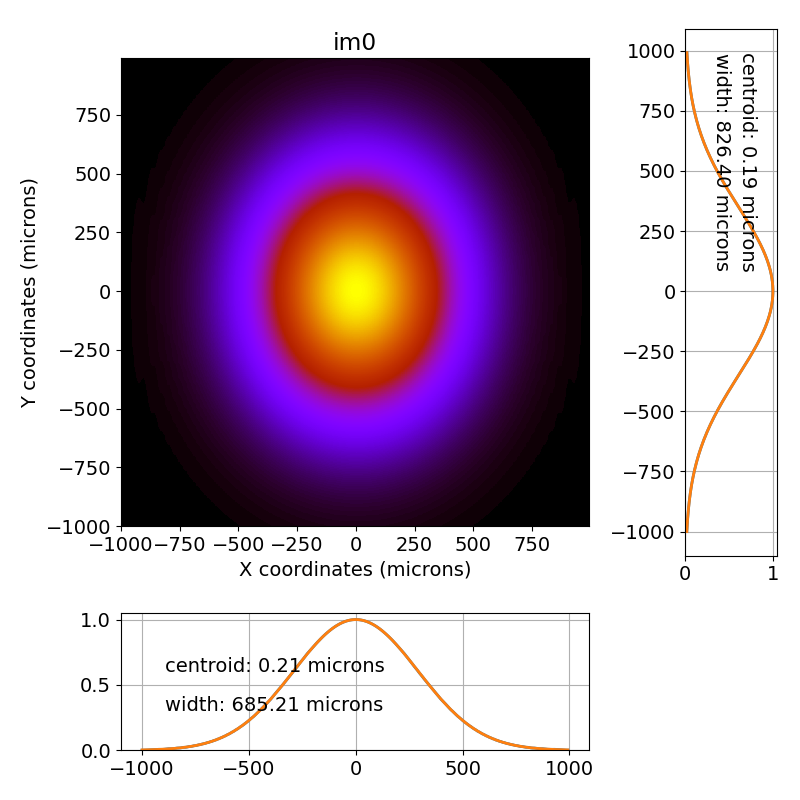

<IPython.core.display.Javascript object>


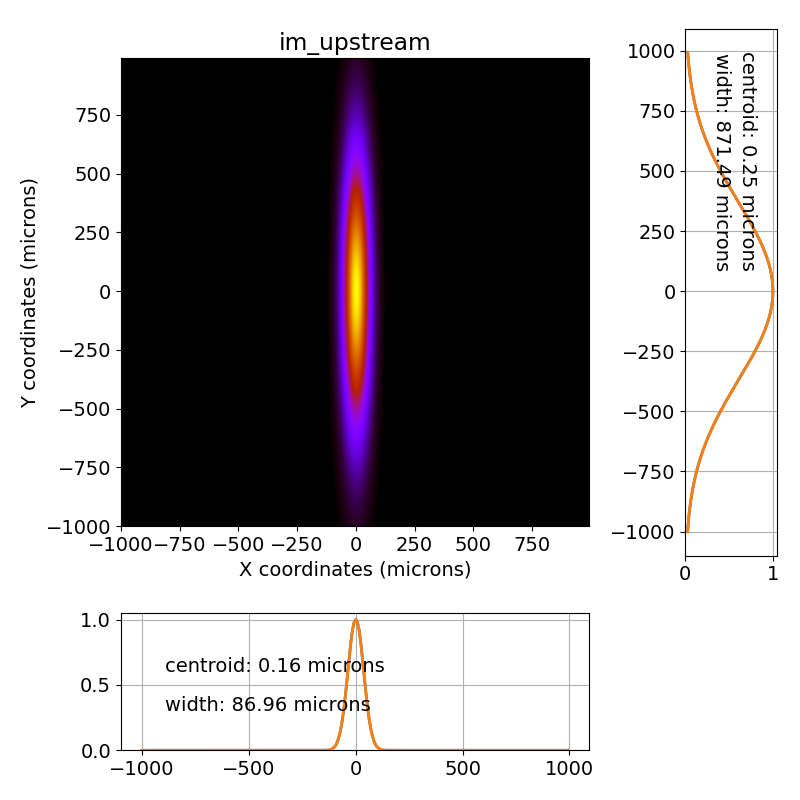

<IPython.core.display.Javascript object>


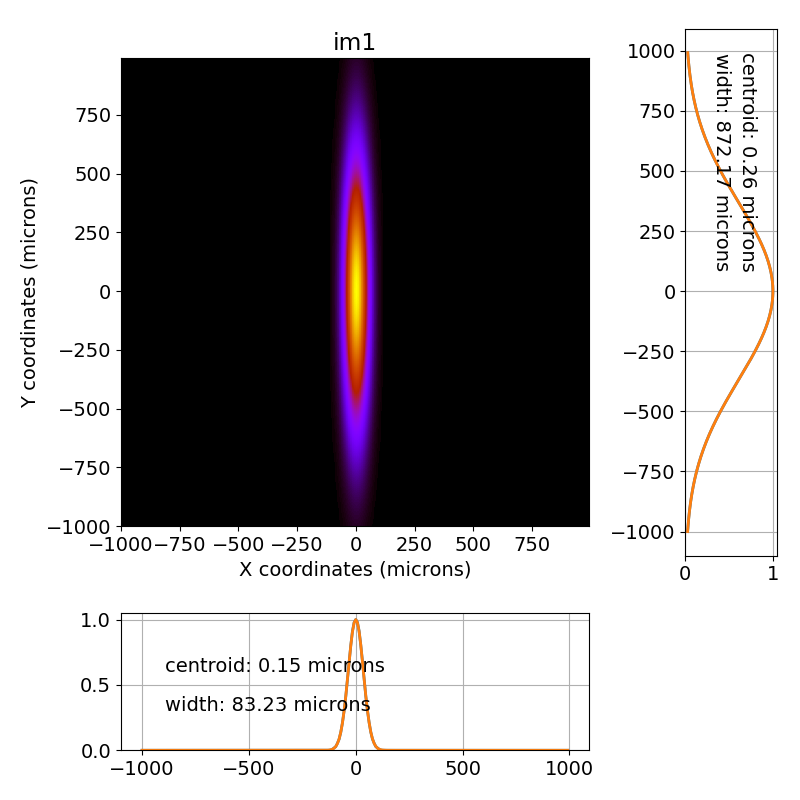

<IPython.core.display.Javascript object>


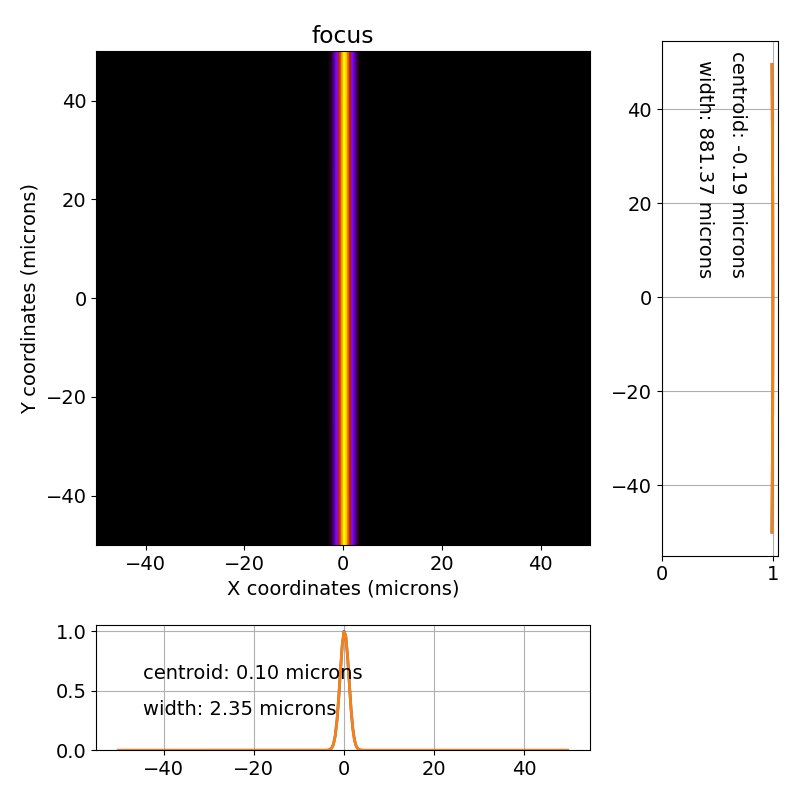

<IPython.core.display.Javascript object>


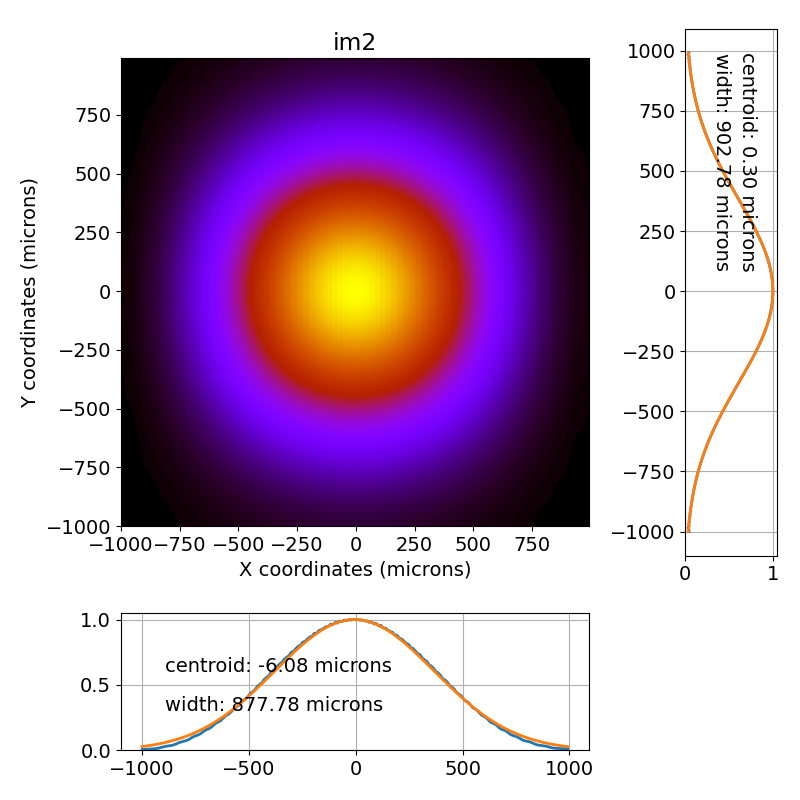

In [21]:
# propagate
b2 = mono_beamline.propagate_beamline(b1)

# view beam at various locations
mono_beamline.im0.view_beam()
mono_beamline.im_upstream.view_beam()
mono_beamline.im1.view_beam()
mono_beamline.focus.view_beam()
mono_beamline.im2.view_beam()

<IPython.core.display.Javascript object>


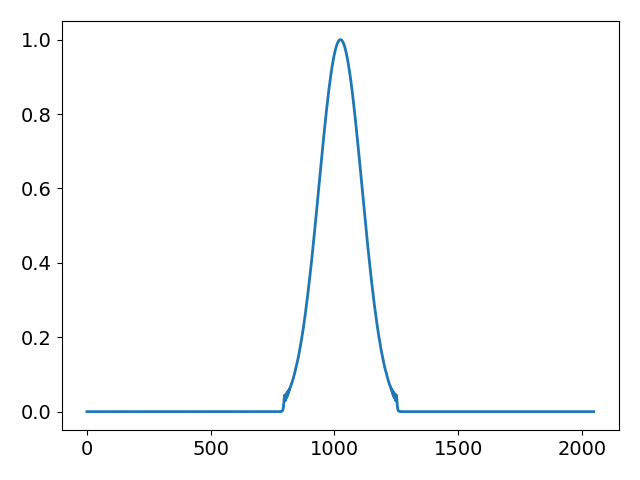

In [63]:
plt.figure()
plt.plot(np.abs(b2.wavey)**2)

## Time-domain propagation

In [22]:
# reset central photon energy
beam_params['photonEnergy'] = 9000

# initialize pulse. tau sets transform-limited pulse duration in fs (FWHM). Time window is in fs.
pulse = beam.Pulse(beam_params=beam_params, tau=40, time_window=4000)

print('Number of spectral components: {:d}'.format(pulse.N))

Number of spectral components: 224


In [23]:
# propagate pulse through beamline. This will take a minute or so (depends on number of spectral 
# components which is proportional to the ratio time_window/tau).
pulse.propagate(beamline=mono_beamline, screen_names=['im0','focus','im2'])

FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131184831651854
5.131184831651854
x is focused
y is focused
FWHM in x: 690.1261570831465 microns
FWHM in y: 690.1261570831465 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131184831651854
5.131184831651854
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19795.960159
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 722296050019.03 microns
zRy: 73726240.57 microns
remaining distance: 40000000.00 microns
goal for zx: 19835960158.84 microns
current zx: 19795960158.84 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19835.960159
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19835.960159
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 722296050019.03 microns
zRy: 73726240.57 microns
remaining distance: 1

Calculated distance to focus: 214.529644
zRx: 5.61e+03
zRy: 7.37e+01
zx: -214.509628
zy: 261.193691
azimuth -874.58 mrad
drift11
delta z: 1.00
zRx: 5610058483.85 microns
zRy: 73726249.10 microns
remaining distance: 890440.59 microns
goal for zx: -213619187.07 microns
current zx: -214509627.66 microns
goal for zy: 262084132.07 microns
current zy: 261193691.48 microns
current step size: 890440.59 microns
x remains focused
y stays unfocused
zx: -213.619187
zy: 262.084132
azimuth -874.58 mrad
c4
Calculated distance to focus: 13939.945731
zRx: 8.53e+01
zRy: 7.37e+01
x becomes unfocused
zx: -13926.254174
zy: 262.084132
azimuth -6.11 mrad
drift12
delta z: -0.20
zRx: 362629148613.96 microns
zRy: 73726249.10 microns
remaining distance: 99978.78 microns
goal for zx: -13926154195.36 microns
current zx: -13926254174.14 microns
goal for zy: 262184110.85 microns
current zy: 262084132.07 microns
current step size: 99978.78 microns
x becomes focused
y stays unfocused
zx: -13926.154195
zy: 262.184111
a

zx: 19845.004987
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -304.872996
zRx: 4.71e+07
zRy: 7.37e+01
zx: 304.729508
zy: 250.309564
azimuth -0.12 mrad
drift4
delta z: 0.00
zRx: 47103394648492.00 microns
zRy: 73726266.16 microns
remaining distance: 2784000.02 microns
goal for zx: 307513508.06 microns
current zx: 304729508.04 microns
goal for zy: 253093563.82 microns
current zy: 250309563.80 microns
current step size: 2784000.02 microns
x remains focused
y stays unfocused
zx: 307.513508
zy: 253.093564
azimuth -0.12 mrad
im_upstream
zx: 307.513508
zy: 253.093564
azimuth -0.12 mrad
drift5
delta z: 0.00
zRx: 47103394648492.00 microns
zRy: 73726266.16 microns
remaining distance: 100000.00 microns
goal for zx: 307613508.06 microns
current zx: 307513508.06 microns
goal for zy: 253193563.82 microns
current zy: 253093563.82 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.613508
zy: 253.193564
azimuth -0.12 mrad
crl1
zRx: 1.13e+04
zR

im2
zx: -14337.774491
zy: 262.184111
azimuth -6.11 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131187803678926
5.131187803678926
x is focused
y is focused
FWHM in x: 690.1257576192179 microns
FWHM in y: 690.1257576192179 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131187803678926
5.131187803678926
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19793.852356
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 722142660907.90 microns
zRy: 73726283.22 microns
remaining distance: 40000000.00 microns
goal for zx: 19833852355.52 microns
current zx: 19793852355.52 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19833.852356
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19833.852356
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 722142660907.9

zx: 307.498060
zy: 253.093564
azimuth -0.12 mrad
im_upstream
zx: 307.498060
zy: 253.093564
azimuth -0.12 mrad
drift5
delta z: 0.00
zRx: 47096169887343.45 microns
zRy: 73726291.74 microns
remaining distance: 100000.00 microns
goal for zx: 307598059.87 microns
current zx: 307498059.86 microns
goal for zy: 253193563.82 microns
current zy: 253093563.82 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.598060
zy: 253.193564
azimuth -0.12 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030476
zy: 253.193564
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11316332482.83 microns
zRy: 73726291.74 microns
remaining distance: 100000.00 microns
goal for zx: -2930475.68 microns
current zx: -3030475.68 microns
goal for zy: 253293563.82 microns
current zy: 253193563.82 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930476
zy: 253.293564
azimuth -0.16 mrad
im1
zx: -2.930476
zy: 253.293564
azimuth -0.16 mrad
dr

zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19792.587889
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 722050650935.96 microns
zRy: 73726308.80 microns
remaining distance: 40000000.00 microns
goal for zx: 19832587888.97 microns
current zx: 19792587888.97 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19832.587889
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19832.587889
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 722050650935.96 microns
zRy: 73726308.80 microns
remaining distance: 10000000.00 microns
goal for zx: 19842587888.97 microns
current zx: 19832587888.97 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19842.587889
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19842.587889
zRx: 7.23e+05
zRy: 7.37e+01
zx: 19842.587891

zRx: 1.03e+00
zRy: 7.37e+01
x becomes unfocused
zx: -234.231869
zy: 259.153124
azimuth -6.12 mrad
drift10
delta z: -395.14
zRx: 6561742974.11 microns
zRy: 73726317.33 microns
remaining distance: 2040561.41 microns
goal for zx: -232191307.33 microns
current zx: -234231868.74 microns
goal for zy: 261193685.65 microns
current zy: 259153124.24 microns
current step size: 2040561.41 microns
x becomes focused
y stays unfocused
zx: -232.191307
zy: 261.193686
azimuth -6.12 mrad
c3
Calculated distance to focus: 232.191307
zRx: 6.56e+03
zRy: 7.37e+01
zx: -232.171241
zy: 261.193686
azimuth -874.57 mrad
drift11
delta z: 0.93
zRx: 6561742974.11 microns
zRy: 73726317.33 microns
remaining distance: 890448.27 microns
goal for zx: -231280793.06 microns
current zx: -232171241.33 microns
goal for zy: 262084133.92 microns
current zy: 261193685.65 microns
current step size: 890448.27 microns
x remains focused
y stays unfocused
zx: -231.280793
zy: 262.084134
azimuth -874.57 mrad
c4
Calculated distance to foc

zRx: 11313949224.82 microns
zRy: 73726334.39 microns
remaining distance: 100000.00 microns
goal for zx: -2930481.51 microns
current zx: -3030481.51 microns
goal for zy: 253293563.82 microns
current zy: 253193563.82 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930482
zy: 253.293564
azimuth -0.16 mrad
im1
zx: -2.930482
zy: 253.293564
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11313949224.82 microns
zRy: 73726334.39 microns
remaining distance: 2930000.04 microns
goal for zx: -481.47 microns
current zx: -2930481.51 microns
goal for zy: 256223563.86 microns
current zy: 253293563.82 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000481
zy: 256.223564
azimuth -0.16 mrad
focus
zx: -0.000481
zy: 256.223564
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11313949224.82 microns
zRy: 73726334.39 microns
remaining distance: 1000.00 microns
goal for zx: 518.53 microns
current zx: -481.47 microns
goal for zy: 25622456

delta z: 0.00
zRx: 721897340126.37 microns
zRy: 73726351.45 microns
remaining distance: 40000000.00 microns
goal for zx: 19830480803.69 microns
current zx: 19790480803.69 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19830.480804
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19830.480804
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 721897340126.37 microns
zRy: 73726351.45 microns
remaining distance: 10000000.00 microns
goal for zx: 19840480803.69 microns
current zx: 19830480803.69 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19840.480804
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19840.480804
zRx: 7.23e+05
zRy: 7.37e+01
zx: 19840.480803
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 722625592118.22 microns
zRy: 73726351.45 mic

zx: 0.000515
zy: 256.224564
azimuth -0.16 mrad
slit
zx: 0.000515
zy: 256.224564
azimuth -0.16 mrad
drift9
delta z: 394.42
zRx: 11312519633.32 microns
zRy: 73726359.98 microns
remaining distance: 2930532.46 microns
goal for zx: 2931047.50 microns
current zx: 515.03 microns
goal for zy: 259155096.32 microns
current zy: 256224563.86 microns
current step size: 2930532.46 microns
x remains focused
y stays unfocused
zx: 2.931047
zy: 259.155096
azimuth -0.16 mrad
m2
zRx: 1.03e+00
zRy: 7.37e+01
x becomes unfocused
zx: -246.777603
zy: 259.155096
azimuth -6.12 mrad
drift10
delta z: -395.16
zRx: 7283161751.56 microns
zRy: 73726359.98 microns
remaining distance: 2038585.63 microns
goal for zx: -244739017.73 microns
current zx: -246777603.36 microns
goal for zy: 261193681.95 microns
current zy: 259155096.32 microns
current step size: 2038585.63 microns
x becomes focused
y stays unfocused
zx: -244.739018
zy: 261.193682
azimuth -6.12 mrad
c3
Calculated distance to focus: 244.739018
zRx: 7.28e+03
zRy:

Calculated distance to focus: -304.788829
zRx: 4.71e+07
zRy: 7.37e+01
zx: 304.662579
zy: 250.309564
azimuth -0.12 mrad
drift4
delta z: 0.00
zRx: 47072098368461.77 microns
zRy: 73726377.04 microns
remaining distance: 2784000.02 microns
goal for zx: 307446578.97 microns
current zx: 304662578.95 microns
goal for zy: 253093563.82 microns
current zy: 250309563.80 microns
current step size: 2784000.02 microns
x remains focused
y stays unfocused
zx: 307.446579
zy: 253.093564
azimuth -0.12 mrad
im_upstream
zx: 307.446579
zy: 253.093564
azimuth -0.12 mrad
drift5
delta z: 0.00
zRx: 47072098368461.77 microns
zRy: 73726377.04 microns
remaining distance: 100000.00 microns
goal for zx: 307546578.97 microns
current zx: 307446578.97 microns
goal for zy: 253193563.82 microns
current zy: 253093563.82 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.546579
zy: 253.193564
azimuth -0.12 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030487
zy: 253.19

Calculated distance to focus: 16445.255948
zRx: 1.18e+02
zRy: 7.37e+01
x becomes unfocused
zx: -16431.490811
zy: 262.084135
azimuth -6.12 mrad
drift12
delta z: -0.08
zRx: 503221145588.25 microns
zRy: 73726385.57 microns
remaining distance: 99976.63 microns
goal for zx: -16431390833.96 microns
current zx: -16431490810.59 microns
goal for zy: 262184111.74 microns
current zy: 262084135.10 microns
current step size: 99976.63 microns
x becomes focused
y stays unfocused
zx: -16431.390834
zy: 262.184112
azimuth -6.12 mrad
im2
zx: -16431.390834
zy: 262.184112
azimuth -6.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131195530949315
5.131195530949315
x is focused
y is focused
FWHM in x: 690.1247190151694 microns
FWHM in y: 690.1247190151694 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131195530949315
5.131195530949315
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
z

zx: -2.930491
zy: 253.293564
azimuth -0.16 mrad
im1
zx: -2.930491
zy: 253.293564
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11310137556.67 microns
zRy: 73726402.63 microns
remaining distance: 2930000.04 microns
goal for zx: -490.79 microns
current zx: -2930490.83 microns
goal for zy: 256223563.86 microns
current zy: 253293563.82 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000491
zy: 256.223564
azimuth -0.16 mrad
focus
zx: -0.000491
zy: 256.223564
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11310137556.67 microns
zRy: 73726402.63 microns
remaining distance: 1000.00 microns
goal for zx: 509.21 microns
current zx: -490.79 microns
goal for zy: 256224563.86 microns
current zy: 256223563.86 microns
current step size: 1000.00 microns
x remains focused
y stays unfocused
zx: 0.000509
zy: 256.224564
azimuth -0.16 mrad
slit
zx: 0.000509
zy: 256.224564
azimuth -0.16 mrad
drift9
delta z: 394.43
zRx: 11310137556.67 microns
zRy: 73726402.63 microns
rema

zx: -17001.307409
zy: 262.184112
azimuth -6.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131197314165559
5.131197314165559
x is focused
y is focused
FWHM in x: 690.1244793377565 microns
FWHM in y: 690.1244793377565 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131197314165559
5.131197314165559
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19787.110400
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 721652144557.87 microns
zRy: 73726419.69 microns
remaining distance: 40000000.00 microns
goal for zx: 19827110400.23 microns
current zx: 19787110400.23 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19827.110400
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19827.110400
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 721652144557.87 mi

zy: 253.293564
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11308708666.62 microns
zRy: 73726428.21 microns
remaining distance: 2930000.04 microns
goal for zx: -494.29 microns
current zx: -2930494.32 microns
goal for zy: 256223563.86 microns
current zy: 253293563.82 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000494
zy: 256.223564
azimuth -0.16 mrad
focus
zx: -0.000494
zy: 256.223564
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11308708666.62 microns
zRy: 73726428.21 microns
remaining distance: 1000.00 microns
goal for zx: 505.71 microns
current zx: -494.29 microns
goal for zy: 256224563.86 microns
current zy: 256223563.86 microns
current step size: 1000.00 microns
x remains focused
y stays unfocused
zx: 0.000506
zy: 256.224564
azimuth -0.16 mrad
slit
zx: 0.000506
zy: 256.224564
azimuth -0.16 mrad
drift9
delta z: 394.44
zRx: 11308708666.62 microns
zRy: 73726428.21 microns
remaining distance: 2933687.92 microns
goal for zx: 2934193.63 microns

Calculated distance to focus: -304.737057
zRx: 4.71e+07
zRy: 7.37e+01
zx: 304.621409
zy: 250.309564
azimuth -0.13 mrad
drift4
delta z: 0.00
zRx: 47052853338574.98 microns
zRy: 73726445.27 microns
remaining distance: 2784000.02 microns
goal for zx: 307405408.78 microns
current zx: 304621408.76 microns
goal for zy: 253093563.82 microns
current zy: 250309563.80 microns
current step size: 2784000.02 microns
x remains focused
y stays unfocused
zx: 307.405409
zy: 253.093564
azimuth -0.13 mrad
im_upstream
zx: 307.405409
zy: 253.093564
azimuth -0.13 mrad
drift5
delta z: 0.00
zRx: 47052853338574.98 microns
zRy: 73726445.27 microns
remaining distance: 100000.00 microns
goal for zx: 307505408.78 microns
current zx: 307405408.78 microns
goal for zy: 253193563.82 microns
current zy: 253093563.82 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.505409
zy: 253.193564
azimuth -0.13 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030497
zy: 253.19

FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131200286192629
5.131200286192629
x is focused
y is focused
FWHM in x: 690.1240798757724 microns
FWHM in y: 690.1240798757724 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131200286192629
5.131200286192629
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19785.004481
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 721498960874.50 microns
zRy: 73726462.33 microns
remaining distance: 40000000.00 microns
goal for zx: 19825004480.97 microns
current zx: 19785004480.97 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19825.004481
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19825.004481
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 721498960874.50 microns
zRy: 73726462.33 microns
remaining distance: 1

zx: -284.517355
zy: 261.193672
azimuth -6.13 mrad
c3
Calculated distance to focus: 284.517355
zRx: 9.82e+03
zRy: 7.37e+01
zx: -284.497152
zy: 261.193672
azimuth -874.56 mrad
drift11
delta z: 0.77
zRx: 9818901752.64 microns
zRy: 73726470.86 microns
remaining distance: 890463.50 microns
goal for zx: -283606688.57 microns
current zx: -284497152.07 microns
goal for zy: 262084135.65 microns
current zy: 261193672.15 microns
current step size: 890463.50 microns
x remains focused
y stays unfocused
zx: -283.606689
zy: 262.084136
azimuth -874.56 mrad
c4
Calculated distance to focus: 18507.054079
zRx: 1.50e+02
zRy: 7.37e+01
x becomes unfocused
zx: -18493.232589
zy: 262.084136
azimuth -6.12 mrad
drift12
delta z: -0.01
zRx: 636167032073.45 microns
zRy: 73726470.86 microns
remaining distance: 99976.25 microns
goal for zx: -18493132612.96 microns
current zx: -18493232589.21 microns
goal for zy: 262184111.89 microns
current zy: 262084135.65 microns
current step size: 99976.25 microns
x becomes focused

goal for zy: 253293563.82 microns
current zy: 253193563.82 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930502
zy: 253.293564
azimuth -0.16 mrad
im1
zx: -2.930502
zy: 253.293564
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11305375618.78 microns
zRy: 73726487.92 microns
remaining distance: 2930000.04 microns
goal for zx: -502.44 microns
current zx: -2930502.48 microns
goal for zy: 256223563.86 microns
current zy: 253293563.82 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000502
zy: 256.223564
azimuth -0.16 mrad
focus
zx: -0.000502
zy: 256.223564
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11305375618.78 microns
zRy: 73726487.92 microns
remaining distance: 1000.00 microns
goal for zx: 497.56 microns
current zx: -502.44 microns
goal for zy: 256224563.86 microns
current zy: 256223563.86 microns
current step size: 1000.00 microns
x remains focused
y stays unfocused
zx: 0.000498
zy: 256.224564
azimuth -0.

delta z: 0.00
zRx: 721345826048.40 microns
zRy: 73726504.98 microns
remaining distance: 40000000.00 microns
goal for zx: 19822899009.93 microns
current zx: 19782899009.93 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19822.899010
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19822.899010
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 721345826048.40 microns
zRy: 73726504.98 microns
remaining distance: 10000000.00 microns
goal for zx: 19832899009.93 microns
current zx: 19822899009.93 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19832.899010
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19832.899010
zRx: 7.22e+05
zRy: 7.37e+01
zx: 19832.899010
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 722073800068.04 microns
zRy: 73726504.98 mic

zRx: 1.03e+00
zRy: 7.37e+01
x becomes unfocused
zx: -305.420867
zy: 259.162196
azimuth -6.13 mrad
drift10
delta z: -395.24
zRx: 11154196517.74 microns
zRy: 73726513.51 microns
remaining distance: 2031471.98 microns
goal for zx: -303389395.34 microns
current zx: -305420867.32 microns
goal for zy: 261193668.30 microns
current zy: 259162196.32 microns
current step size: 2031471.98 microns
x becomes focused
y stays unfocused
zx: -303.389395
zy: 261.193668
azimuth -6.13 mrad
c3
Calculated distance to focus: 303.389395
zRx: 1.12e+04
zRy: 7.37e+01
zx: -303.369145
zy: 261.193668
azimuth -874.56 mrad
drift11
delta z: 0.73
zRx: 11154196517.74 microns
zRy: 73726513.51 microns
remaining distance: 890467.23 microns
goal for zx: -302478678.08 microns
current zx: -303369145.31 microns
goal for zy: 262084135.53 microns
current zy: 261193668.30 microns
current step size: 890467.23 microns
x remains focused
y stays unfocused
zx: -302.478678
zy: 262.084136
azimuth -874.56 mrad
c4
Calculated distance to f

zx: -2.930508
zy: 253.293564
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11302995750.86 microns
zRy: 73726530.57 microns
remaining distance: 2930000.04 microns
goal for zx: -508.27 microns
current zx: -2930508.30 microns
goal for zy: 256223563.86 microns
current zy: 253293563.82 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000508
zy: 256.223564
azimuth -0.16 mrad
focus
zx: -0.000508
zy: 256.223564
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11302995750.86 microns
zRy: 73726530.57 microns
remaining distance: 1000.00 microns
goal for zx: 491.73 microns
current zx: -508.27 microns
goal for zy: 256224563.86 microns
current zy: 256223563.86 microns
current step size: 1000.00 microns
x remains focused
y stays unfocused
zx: 0.000492
zy: 256.224564
azimuth -0.16 mrad
slit
zx: 0.000492
zy: 256.224564
azimuth -0.16 mrad
drift9
delta z: 394.47
zRx: 11302995750.86 microns
zRy: 73726530.57 microns
remaining distance: 2938421.39 microns
goal for zx: 2938

zx: 19830.793986
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 721920636901.66 microns
zRy: 73726547.63 microns
remaining distance: 309563.80 microns
goal for zx: 19831103550.14 microns
current zx: 19830793986.34 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19831.103550
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -304.659433
zRx: 4.70e+07
zRy: 7.37e+01
zx: 304.559678
zy: 250.309564
azimuth -0.13 mrad
drift4
delta z: 0.00
zRx: 47024006114829.62 microns
zRy: 73726547.63 microns
remaining distance: 2784000.02 microns
goal for zx: 307343677.76 microns
current zx: 304559677.74 microns
goal for zy: 253093563.82 microns
current zy: 250309563.80 microns
current step size: 2784000.02 microns
x remains focused
y stays unfocused
zx: 307.343678
zy: 253.093564
azimuth -0.13 mrad
im_upstream
zx: 307.343678
zy: 253.093564
azimuth -0.13 mrad
drift5
delta z: 

zRx: 721131519332.40 microns
zRy: 73726564.68 microns
remaining distance: 40000000.00 microns
goal for zx: 19819952103.19 microns
current zx: 19779952103.19 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19819.952103
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19819.952103
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 721131519332.40 microns
zRy: 73726564.68 microns
remaining distance: 10000000.00 microns
goal for zx: 19829952103.19 microns
current zx: 19819952103.19 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19829.952103
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19829.952103
zRx: 7.22e+05
zRy: 7.37e+01
zx: 19829.952102
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 721859385309.25 microns
zRy: 73726564.68 microns
remaining

zy: 261.193663
azimuth -6.13 mrad
c3
Calculated distance to focus: 334.334484
zRx: 1.35e+04
zRy: 7.37e+01
zx: -334.314159
zy: 261.193663
azimuth -874.56 mrad
drift11
delta z: 0.67
zRx: 13527935380.23 microns
zRy: 73726573.21 microns
remaining distance: 890472.08 microns
goal for zx: -333423687.15 microns
current zx: -334314159.22 microns
goal for zy: 262084134.93 microns
current zy: 261193662.85 microns
current step size: 890472.08 microns
x remains focused
y stays unfocused
zx: -333.423687
zy: 262.084135
azimuth -874.56 mrad
c4
Calculated distance to focus: 21757.914951
zRx: 2.06e+02
zRy: 7.37e+01
x becomes unfocused
zx: -21744.009562
zy: 262.084135
azimuth -6.12 mrad
drift12
delta z: 0.08
zRx: 877409291369.57 microns
zRy: 73726573.21 microns
remaining distance: 99976.76 microns
goal for zx: -21743909585.52 microns
current zx: -21744009562.27 microns
goal for zy: 262184111.69 microns
current zy: 262084134.93 microns
current step size: 99976.76 microns
x becomes focused
y stays unfocus

zx: 307.417965
zy: 253.193564
azimuth -0.13 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030516
zy: 253.193564
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11299665173.99 microns
zRy: 73726590.27 microns
remaining distance: 100000.00 microns
goal for zx: -2930516.46 microns
current zx: -3030516.46 microns
goal for zy: 253293563.82 microns
current zy: 253193563.82 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930516
zy: 253.293564
azimuth -0.16 mrad
im1
zx: -2.930516
zy: 253.293564
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11299665173.99 microns
zRy: 73726590.27 microns
remaining distance: 2930000.04 microns
goal for zx: -516.42 microns
current zx: -2930516.46 microns
goal for zy: 256223563.86 microns
current zy: 253293563.82 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000516
zy: 256.223564
azimuth -0.16 mrad
focus
zx: -0.000516
zy: 256.223564
azimuth -0.16 mrad
drift8
delta z: 0

FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131210391084674
5.131210391084674
x is focused
y is focused
FWHM in x: 690.1227217084875 microns
FWHM in y: 690.1227217084875 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131210391084674
5.131210391084674
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19777.847707
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 720978501678.94 microns
zRy: 73726607.33 microns
remaining distance: 40000000.00 microns
goal for zx: 19817847707.27 microns
current zx: 19777847707.27 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19817.847707
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19817.847707
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 720978501678.94 microns
zRy: 73726607.33 microns
remaining distance: 1

zy: 259.166930
azimuth -0.16 mrad
m2
zRx: 1.04e+00
zRy: 7.37e+01
x becomes unfocused
zx: -362.540666
zy: 259.166930
azimuth -6.13 mrad
drift10
delta z: -395.28
zRx: 15714815269.66 microns
zRy: 73726615.86 microns
remaining distance: 2026728.83 microns
goal for zx: -360513936.79 microns
current zx: -362540665.62 microns
goal for zy: 261193658.91 microns
current zy: 259166930.08 microns
current step size: 2026728.83 microns
x becomes focused
y stays unfocused
zx: -360.513937
zy: 261.193659
azimuth -6.13 mrad
c3
Calculated distance to focus: 360.513937
zRx: 1.57e+04
zRy: 7.37e+01
zx: -360.493550
zy: 261.193659
azimuth -874.56 mrad
drift11
delta z: 0.62
zRx: 15714815269.66 microns
zRy: 73726615.86 microns
remaining distance: 890475.28 microns
goal for zx: -359603075.11 microns
current zx: -360493550.40 microns
goal for zy: 262084134.20 microns
current zy: 261193658.91 microns
current step size: 890475.28 microns
x remains focused
y stays unfocused
zx: -359.603075
zy: 262.084134
azimuth -87

Calculated distance to focus: -304.594776
zRx: 4.70e+07
zRy: 7.37e+01
zx: 304.508257
zy: 250.309564
azimuth -0.14 mrad
drift4
delta z: 0.00
zRx: 46999985354444.55 microns
zRy: 73726632.92 microns
remaining distance: 2784000.03 microns
goal for zx: 307292257.41 microns
current zx: 304508257.39 microns
goal for zy: 253093563.82 microns
current zy: 250309563.80 microns
current step size: 2784000.03 microns
x remains focused
y stays unfocused
zx: 307.292257
zy: 253.093564
azimuth -0.14 mrad
im_upstream
zx: 307.292257
zy: 253.093564
azimuth -0.14 mrad
drift5
delta z: 0.00
zRx: 46999985354444.55 microns
zRy: 73726632.92 microns
remaining distance: 100000.00 microns
goal for zx: 307392257.41 microns
current zx: 307292257.41 microns
goal for zy: 253193563.82 microns
current zy: 253093563.82 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.392257
zy: 253.193564
azimuth -0.14 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030522
zy: 253.19

zx: 19815.743759
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19815.743759
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 720825532812.07 microns
zRy: 73726649.98 microns
remaining distance: 10000000.00 microns
goal for zx: 19825743759.08 microns
current zx: 19815743759.08 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19825.743759
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19825.743759
zRx: 7.22e+05
zRy: 7.37e+01
zx: 19825.743759
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 721553244497.90 microns
zRy: 73726649.98 microns
remaining distance: 309563.80 microns
goal for zx: 19826053323.12 microns
current zx: 19825743759.32 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19826.053323
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated d

zx: -25444.900698
zy: 262.184111
azimuth -6.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131214551922576
5.131214551922576
x is focused
y is focused
FWHM in x: 690.12216246469 microns
FWHM in y: 690.12216246469 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131214551922576
5.131214551922576
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19774.902305
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 720764358921.00 microns
zRy: 73726667.04 microns
remaining distance: 40000000.00 microns
goal for zx: 19814902305.14 microns
current zx: 19774902305.14 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19814.902305
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19814.902305
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 720764358921.00 micron

zx: 0.000472
zy: 256.224564
azimuth -0.16 mrad
slit
zx: 0.000472
zy: 256.224564
azimuth -0.16 mrad
drift9
delta z: 394.51
zRx: 11294909700.33 microns
zRy: 73726675.57 microns
remaining distance: 2945127.74 microns
goal for zx: 2945599.67 microns
current zx: 471.93 microns
goal for zy: 259169691.60 microns
current zy: 256224563.86 microns
current step size: 2945127.74 microns
x remains focused
y stays unfocused
zx: 2.945600
zy: 259.169692
azimuth -0.16 mrad
m2
zRx: 1.04e+00
zRy: 7.37e+01
x becomes unfocused
zx: -406.761913
zy: 259.169692
azimuth -6.14 mrad
drift10
delta z: -395.31
zRx: 19781084872.30 microns
zRy: 73726675.57 microns
remaining distance: 2023961.73 microns
goal for zx: -404737950.88 microns
current zx: -406761912.61 microns
goal for zy: 261193653.33 microns
current zy: 259169691.60 microns
current step size: 2023961.73 microns
x becomes focused
y stays unfocused
zx: -404.737951
zy: 261.193653
azimuth -6.14 mrad
c3
Calculated distance to focus: 404.737951
zRx: 1.98e+04
zRy

y stays unfocused
zx: 19823.949823
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -304.549532
zRx: 4.70e+07
zRy: 7.37e+01
zx: 304.472275
zy: 250.309564
azimuth -0.14 mrad
drift4
delta z: 0.00
zRx: 46983180873973.30 microns
zRy: 73726692.62 microns
remaining distance: 2784000.03 microns
goal for zx: 307256275.15 microns
current zx: 304472275.13 microns
goal for zy: 253093563.82 microns
current zy: 250309563.80 microns
current step size: 2784000.03 microns
x remains focused
y stays unfocused
zx: 307.256275
zy: 253.093564
azimuth -0.14 mrad
im_upstream
zx: 307.256275
zy: 253.093564
azimuth -0.14 mrad
drift5
delta z: 0.00
zRx: 46983180873973.30 microns
zRy: 73726692.62 microns
remaining distance: 100000.00 microns
goal for zx: 307356275.15 microns
current zx: 307256275.15 microns
goal for zy: 253193563.83 microns
current zy: 253093563.82 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.356275
zy: 253.193564
azimuth -0.14 mrad
crl

FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.1312175239496485
5.1312175239496485
x is focused
y is focused
FWHM in x: 690.1217630053903 microns
FWHM in y: 690.1217630053903 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.1312175239496485
5.1312175239496485
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19772.798984
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 720611458320.63 microns
zRy: 73726709.68 microns
remaining distance: 40000000.00 microns
goal for zx: 19812798983.52 microns
current zx: 19772798983.52 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19812.798984
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19812.798984
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 720611458320.63 microns
zRy: 73726709.68 microns
remaining distanc

zx: -443.468347
zy: 261.193649
azimuth -6.14 mrad
c3
Calculated distance to focus: 443.468347
zRx: 2.37e+04
zRy: 7.37e+01
zx: -443.447772
zy: 261.193649
azimuth -874.55 mrad
drift11
delta z: 0.52
zRx: 23726153831.91 microns
zRy: 73726718.21 microns
remaining distance: 890482.09 microns
goal for zx: -442557290.22 microns
current zx: -443447772.32 microns
goal for zy: 262084131.39 microns
current zy: 261193649.29 microns
current step size: 890482.09 microns
x remains focused
y stays unfocused
zx: -442.557290
zy: 262.084131
azimuth -874.55 mrad
c4
Calculated distance to focus: 28879.543514
zRx: 3.62e+02
zRy: 7.37e+01
x becomes unfocused
zx: -28865.466431
zy: 262.084131
azimuth -6.12 mrad
drift12
delta z: 0.21
zRx: 1541160447128.02 microns
zRy: 73726718.21 microns
remaining distance: 99979.26 microns
goal for zx: -28865366451.28 microns
current zx: -28865466430.54 microns
goal for zy: 262184110.65 microns
current zy: 262084131.39 microns
current step size: 99979.26 microns
x becomes focuse

zy: 253.193564
azimuth -0.14 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030536
zy: 253.193564
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11291582619.69 microns
zRy: 73726735.27 microns
remaining distance: 100000.00 microns
goal for zx: -2930536.26 microns
current zx: -3030536.26 microns
goal for zy: 253293563.83 microns
current zy: 253193563.83 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930536
zy: 253.293564
azimuth -0.16 mrad
im1
zx: -2.930536
zy: 253.293564
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11291582619.69 microns
zRy: 73726735.27 microns
remaining distance: 2930000.04 microns
goal for zx: -536.22 microns
current zx: -2930536.26 microns
goal for zy: 256223563.86 microns
current zy: 253293563.83 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000536
zy: 256.223564
azimuth -0.16 mrad
focus
zx: -0.000536
zy: 256.223564
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 112915

zx: 19810.696109
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 720458606457.14 microns
zRy: 73726752.33 microns
remaining distance: 10000000.00 microns
goal for zx: 19820696109.30 microns
current zx: 19810696109.30 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19820.696109
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19820.696109
zRx: 7.21e+05
zRy: 7.37e+01
zx: 19820.696109
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 721186133080.38 microns
zRy: 73726752.33 microns
remaining distance: 309563.80 microns
goal for zx: 19821005673.18 microns
current zx: 19820696109.38 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19821.005673
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -304.504302
zRx: 4.70e+07
zRy: 7.37e

FWHM in x: 690.1212037631482 microns
FWHM in y: 690.1212037631482 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.13122168478755
5.13122168478755
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19769.855085
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 720397479353.39 microns
zRy: 73726769.39 microns
remaining distance: 40000000.00 microns
goal for zx: 19809855084.84 microns
current zx: 19769855084.84 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19809.855085
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19809.855085
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 720397479353.39 microns
zRy: 73726769.39 microns
remaining distance: 10000000.00 microns
goal for zx: 19819855084.84 microns
current zx: 19809855084.84 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x re

FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.13122287359838
5.13122287359838
x is focused
y is focused
FWHM in x: 690.1210439798172 microns
FWHM in y: 690.1210439798172 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.13122287359838
5.13122287359838
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19769.014132
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 720336360042.95 microns
zRy: 73726786.45 microns
remaining distance: 40000000.00 microns
goal for zx: 19809014131.94 microns
current zx: 19769014131.94 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19809.014132
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19809.014132
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 720336360042.95 microns
zRy: 73726786.45 microns
remaining distance: 10000

/Users/Matt/beamline/venv/lib/python3.7/site-packages/scipy/optimize/minpack.py:808: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


zRx: 3.45e+04
zRy: 7.37e+01
zx: -535.305810
zy: 261.193642
azimuth -874.55 mrad
drift11
delta z: 0.44
zRx: 34516236420.66 microns
zRy: 73726794.98 microns
remaining distance: 890486.39 microns
goal for zx: -534415323.69 microns
current zx: -535305810.08 microns
goal for zy: 262084128.32 microns
current zy: 261193641.93 microns
current step size: 890486.39 microns
x remains focused
y stays unfocused
zx: -534.415324
zy: 262.084128
azimuth -874.55 mrad
c4
Calculated distance to focus: 34873.836531
zRx: 5.27e+02
zRy: 7.37e+01
x becomes unfocused
zx: -34859.621787
zy: 262.084128
azimuth -6.12 mrad
drift12
delta z: 0.27
zRx: 2243806743664.63 microns
zRy: 73726794.98 microns
remaining distance: 99981.44 microns
goal for zx: -34859521805.12 microns
current zx: -34859621786.56 microns
goal for zy: 262184109.76 microns
current zy: 262084128.32 microns
current step size: 99981.44 microns
x becomes focused
y stays unfocused
zx: -34859.521805
zy: 262.184110
azimuth -6.12 mrad
im2
zx: -34859.521805


zx: -0.000547
zy: 256.223564
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11287307051.18 microns
zRy: 73726812.03 microns
remaining distance: 1000.00 microns
goal for zx: 453.29 microns
current zx: -546.71 microns
goal for zy: 256224563.87 microns
current zy: 256223563.87 microns
current step size: 1000.00 microns
x remains focused
y stays unfocused
zx: 0.000453
zy: 256.224564
azimuth -0.16 mrad
slit
zx: 0.000453
zy: 256.224564
azimuth -0.16 mrad
drift9
delta z: 394.55
zRx: 11287307051.18 microns
zRy: 73726812.03 microns
remaining distance: 2951440.22 microns
goal for zx: 2951893.51 microns
current zx: 453.29 microns
goal for zy: 259176004.09 microns
current zy: 256224563.87 microns
current step size: 2951440.22 microns
x remains focused
y stays unfocused
zx: 2.951894
zy: 259.176004
azimuth -0.16 mrad
m2
zRx: 1.04e+00
zRy: 7.37e+01
x becomes unfocused
zx: -563.093714
zy: 259.176004
azimuth -6.14 mrad
drift10
delta z: -395.38
zRx: 37902760519.92 microns
zRy: 73726812.03 microns
remainin

delta z: 0.00
zRx: 46944801657317.05 microns
zRy: 73726829.09 microns
remaining distance: 2784000.03 microns
goal for zx: 307174066.93 microns
current zx: 304390066.90 microns
goal for zy: 253093563.83 microns
current zy: 250309563.80 microns
current step size: 2784000.03 microns
x remains focused
y stays unfocused
zx: 307.174067
zy: 253.093564
azimuth -0.14 mrad
im_upstream
zx: 307.174067
zy: 253.093564
azimuth -0.14 mrad
drift5
delta z: 0.00
zRx: 46944801657317.05 microns
zRy: 73726829.09 microns
remaining distance: 100000.00 microns
goal for zx: 307274066.93 microns
current zx: 307174066.93 microns
goal for zy: 253193563.83 microns
current zy: 253093563.83 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.274067
zy: 253.193564
azimuth -0.14 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030549
zy: 253.193564
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11286357249.42 microns
zRy: 73726829.09 microns
remaining distance: 100000.0

FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.13122703443628
5.13122703443628
x is focused
y is focused
FWHM in x: 690.1204847387417 microns
FWHM in y: 690.1204847387417 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.13122703443628
5.13122703443628
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19766.071360
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 720122503809.17 microns
zRy: 73726846.15 microns
remaining distance: 40000000.00 microns
goal for zx: 19806071360.09 microns
current zx: 19766071360.09 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19806.071360
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19806.071360
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 720122503809.17 microns
zRy: 73726846.15 microns
remaining distance: 10000

Calculated distance to focus: 41548.051657
zRx: 7.48e+02
zRy: 7.37e+01
x becomes unfocused
zx: -41533.687497
zy: 262.084125
azimuth -6.12 mrad
drift12
delta z: 0.32
zRx: 3180980028173.56 microns
zRy: 73726854.68 microns
remaining distance: 99983.53 microns
goal for zx: -41533587513.63 microns
current zx: -41533687497.16 microns
goal for zy: 262184108.90 microns
current zy: 262084125.37 microns
current step size: 99983.53 microns
x becomes focused
y stays unfocused
zx: -41533.587514
zy: 262.184109
azimuth -6.12 mrad
im2
zx: -41533.587514
zy: 262.184109
azimuth -6.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131228223247108
5.131228223247108
x is focused
y is focused
FWHM in x: 690.120324955744 microns
FWHM in y: 690.120324955744 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131228223247108
5.131228223247108
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx:

zx: 307.148387
zy: 253.093564
azimuth -0.15 mrad
drift5
delta z: 0.00
zRx: 46932817003243.86 microns
zRy: 73726871.74 microns
remaining distance: 100000.00 microns
goal for zx: 307248387.44 microns
current zx: 307148387.44 microns
goal for zy: 253193563.83 microns
current zy: 253093563.83 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.248387
zy: 253.193564
azimuth -0.15 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030555
zy: 253.193564
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11283983255.82 microns
zRy: 73726871.74 microns
remaining distance: 100000.00 microns
goal for zx: -2930554.90 microns
current zx: -3030554.90 microns
goal for zy: 253293563.83 microns
current zy: 253193563.83 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930555
zy: 253.293564
azimuth -0.16 mrad
im1
zx: -2.930555
zy: 253.293564
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11283983255.82 microns
zRy: 73726871.

FWHM in y: 690.1200053899705 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131230600868766
5.131230600868766
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19763.549681
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 719939274394.15 microns
zRy: 73726897.33 microns
remaining distance: 40000000.00 microns
goal for zx: 19803549681.44 microns
current zx: 19763549681.44 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19803.549681
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19803.549681
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 719939274394.15 microns
zRy: 73726897.33 microns
remaining distance: 10000000.00 microns
goal for zx: 19813549681.44 microns
current zx: 19803549681.44 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx:

zx: -49647.363053
zy: 262.184108
azimuth -6.12 mrad
im2
zx: -49647.363053
zy: 262.184108
azimuth -6.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131231789679597
5.131231789679597
x is focused
y is focused
FWHM in x: 690.1198456071946 microns
FWHM in y: 690.1198456071946 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131231789679597
5.131231789679597
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19762.709265
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 719878213490.92 microns
zRy: 73726914.39 microns
remaining distance: 40000000.00 microns
goal for zx: 19802709264.86 microns
current zx: 19762709264.86 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19802.709265
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19802.709265
zy: 240.000000
azimut

zx: -2.930563
zy: 253.293564
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11280660896.46 microns
zRy: 73726931.45 microns
remaining distance: 2930000.04 microns
goal for zx: -563.02 microns
current zx: -2930563.05 microns
goal for zy: 256223563.87 microns
current zy: 253293563.83 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000563
zy: 256.223564
azimuth -0.16 mrad
focus
zx: -0.000563
zy: 256.223564
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11280660896.46 microns
zRy: 73726931.45 microns
remaining distance: 1000.00 microns
goal for zx: 436.98 microns
current zx: -563.02 microns
goal for zy: 256224563.87 microns
current zy: 256223563.87 microns
current step size: 1000.00 microns
x remains focused
y stays unfocused
zx: 0.000437
zy: 256.224564
azimuth -0.16 mrad
slit
zx: 0.000437
zy: 256.224564
azimuth -0.16 mrad
drift9
delta z: 394.58
zRx: 11280660896.46 microns
zRy: 73726931.45 microns
remaining distance: 2956964.15 microns
goal for zx: 2957

zx: 0.000435
zy: 256.224564
azimuth -0.16 mrad
slit
zx: 0.000435
zy: 256.224564
azimuth -0.16 mrad
drift9
delta z: 394.59
zRx: 11279711911.35 microns
zRy: 73726948.50 microns
remaining distance: 2957753.32 microns
goal for zx: 2958187.97 microns
current zx: 434.65 microns
goal for zy: 259182317.19 microns
current zy: 256224563.87 microns
current step size: 2957753.32 microns
x remains focused
y stays unfocused
zx: 2.958188
zy: 259.182317
azimuth -0.16 mrad
m2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
zx: -911.284922
zy: 259.182317
azimuth -6.15 mrad
drift10
delta z: -395.44
zRx: 99256235227.14 microns
zRy: 73726948.50 microns
remaining distance: 2011309.63 microns
goal for zx: -909273612.00 microns
current zx: -911284921.64 microns
goal for zy: 261193626.82 microns
current zy: 259182317.19 microns
current step size: 2011309.63 microns
x becomes focused
y stays unfocused
zx: -909.273612
zy: 261.193627
azimuth -6.15 mrad
c3
Calculated distance to focus: 909.273612
zRx: 9.93e+04
zRy

zRx: 4.69e+07
zRy: 7.37e+01
zx: 304.307910
zy: 250.309564
azimuth -0.15 mrad
drift4
delta z: 0.00
zRx: 46906465594989.88 microns
zRy: 73726965.56 microns
remaining distance: 2784000.03 microns
goal for zx: 307091910.25 microns
current zx: 304307910.22 microns
goal for zy: 253093563.83 microns
current zy: 250309563.80 microns
current step size: 2784000.03 microns
x remains focused
y stays unfocused
zx: 307.091910
zy: 253.093564
azimuth -0.15 mrad
im_upstream
zx: 307.091910
zy: 253.093564
azimuth -0.15 mrad
drift5
delta z: 0.00
zRx: 46906465594989.88 microns
zRy: 73726965.56 microns
remaining distance: 100000.00 microns
goal for zx: 307191910.25 microns
current zx: 307091910.25 microns
goal for zy: 253193563.83 microns
current zy: 253093563.83 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.191910
zy: 253.193564
azimuth -0.15 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030568
zy: 253.193564
azimuth -0.16 mrad
drift6
delta z: 0.

Calculated distance to focus: 67044.454360
zRx: 1.94e+03
zRy: 7.37e+01
x becomes unfocused
zx: -67029.535651
zy: 262.084118
azimuth -6.12 mrad
drift12
delta z: 0.42
zRx: 8263073019008.25 microns
zRy: 73726974.09 microns
remaining distance: 99988.77 microns
goal for zx: -67029435662.60 microns
current zx: -67029535651.37 microns
goal for zy: 262184106.75 microns
current zy: 262084117.98 microns
current step size: 99988.77 microns
x becomes focused
y stays unfocused
zx: -67029.435663
zy: 262.184107
azimuth -6.12 mrad
im2
zx: -67029.435663
zy: 262.184107
azimuth -6.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131236544922912
5.131236544922912
x is focused
y is focused
FWHM in x: 690.1192064768329 microns
FWHM in y: 690.1192064768329 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131236544922912
5.131236544922912
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
z

zx: 307.076512
zy: 253.093564
azimuth -0.15 mrad
drift5
delta z: 0.00
zRx: 46899282383425.27 microns
zRy: 73726991.15 microns
remaining distance: 100000.00 microns
goal for zx: 307176511.58 microns
current zx: 307076511.58 microns
goal for zy: 253193563.83 microns
current zy: 253093563.83 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.176512
zy: 253.193564
azimuth -0.15 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030571
zy: 253.193564
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11277339968.78 microns
zRy: 73726991.15 microns
remaining distance: 100000.00 microns
goal for zx: -2930571.21 microns
current zx: -3030571.21 microns
goal for zy: 253293563.83 microns
current zy: 253193563.83 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930571
zy: 253.293564
azimuth -0.16 mrad
im1
zx: -2.930571
zy: 253.293564
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11277339968.78 microns
zRy: 73726991.

FWHM in x: 690.1189668032528 microns
FWHM in y: 690.1189668032528 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131238328139155
5.131238328139155
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19758.088251
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 719542517590.94 microns
zRy: 73727008.21 microns
remaining distance: 40000000.00 microns
goal for zx: 19798088251.01 microns
current zx: 19758088251.01 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19798.088251
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19798.088251
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 719542517590.94 microns
zRy: 73727008.21 microns
remaining distance: 10000000.00 microns
goal for zx: 19808088251.01 microns
current zx: 19798088251.01 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x 

zx: 19807.248299
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19807.248299
zRx: 7.20e+05
zRy: 7.37e+01
zx: 19807.248299
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 720208540831.59 microns
zRy: 73727025.27 microns
remaining distance: 309563.80 microns
goal for zx: 19807557862.91 microns
current zx: 19807248299.12 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19807.557863
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -304.297707
zRx: 4.69e+07
zRy: 7.37e+01
zx: 304.271983
zy: 250.309564
azimuth -0.15 mrad
drift4
delta z: 0.00
zRx: 46889707120440.97 microns
zRy: 73727025.27 microns
remaining distance: 2784000.03 microns
goal for zx: 307055982.87 microns
current zx: 304271982.84 microns
goal for zy: 253093563.83 microns
current zy: 250309563.80 microns
current step size: 2784000.03 microns
x remains focused
y stays unfocused
z

zx: -1478.885453
zy: 261.193618
azimuth -6.15 mrad
c3
Calculated distance to focus: 1478.885453
zRx: 2.62e+05
zRy: 7.37e+01
zx: -1478.862730
zy: 261.193618
azimuth -874.54 mrad
drift11
delta z: 0.21
zRx: 262095249047.33 microns
zRy: 73727033.80 microns
remaining distance: 890495.34 microns
goal for zx: -1477972234.89 microns
current zx: -1478862730.23 microns
goal for zy: 262084113.54 microns
current zy: 261193618.21 microns
current step size: 890495.34 microns
x remains focused
y stays unfocused
zx: -1477.972235
zy: 262.084114
azimuth -874.54 mrad
c4
Calculated distance to focus: 96446.639595
zRx: 4.01e+03
zRy: 7.37e+01
x becomes unfocused
zx: -96431.092968
zy: 262.084114
azimuth -6.12 mrad
drift12
delta z: 0.47
zRx: 17079402429280.90 microns
zRy: 73727033.80 microns
remaining distance: 99991.91 microns
goal for zx: -96430992975.62 microns
current zx: -96431092967.53 microns
goal for zy: 262184105.45 microns
current zy: 262084113.54 microns
current step size: 99991.91 microns
x become

azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 720116993702.52 microns
zRy: 73727050.86 microns
remaining distance: 309563.80 microns
goal for zx: 19806298069.11 microns
current zx: 19805988505.31 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19806.298069
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -304.278353
zRx: 4.69e+07
zRy: 7.37e+01
zx: 304.256588
zy: 250.309564
azimuth -0.15 mrad
drift4
delta z: 0.00
zRx: 46882527441316.09 microns
zRy: 73727050.86 microns
remaining distance: 2784000.03 microns
goal for zx: 307040588.45 microns
current zx: 304256588.42 microns
goal for zy: 253093563.83 microns
current zy: 250309563.80 microns
current step size: 2784000.03 microns
x remains focused
y stays unfocused
zx: 307.040588
zy: 253.093564
azimuth -0.15 mrad
im_upstream
zx: 307.040588
zy: 253.093564
azimuth -0.15 mrad
drift5
delta z: 0.00
zRx: 46882527441316.09 micr

zx: -118669.074541
zy: 262.184105
azimuth -6.12 mrad
im2
zx: -118669.074541
zy: 262.184105
azimuth -6.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.1312424889770565
5.1312424889770565
x is focused
y is focused
FWHM in x: 690.1184075655472 microns
FWHM in y: 690.1184075655472 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.1312424889770565
5.1312424889770565
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19755.148731
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 719329015393.12 microns
zRy: 73727067.91 microns
remaining distance: 40000000.00 microns
goal for zx: 19795148730.83 microns
current zx: 19755148730.83 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19795.148731
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19795.148731
zy: 240.000000


delta z: 394.62
zRx: 11272598277.14 microns
zRy: 73727076.44 microns
remaining distance: 2963672.40 microns
goal for zx: 2964089.58 microns
current zx: 417.18 microns
goal for zy: 259188236.27 microns
current zy: 256224563.87 microns
current step size: 2963672.40 microns
x remains focused
y stays unfocused
zx: 2.964090
zy: 259.188236
azimuth -0.16 mrad
m2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
zx: -2151.445713
zy: 259.188236
azimuth -6.15 mrad
drift10
delta z: -395.50
zRx: 553164016904.26 microns
zRy: 73727076.44 microns
remaining distance: 2005377.57 microns
goal for zx: -2149440335.23 microns
current zx: -2151445712.80 microns
goal for zy: 261193613.84 microns
current zy: 259188236.27 microns
current step size: 2005377.57 microns
x becomes focused
y stays unfocused
zx: -2149.440335
zy: 261.193614
azimuth -6.15 mrad
c3
Calculated distance to focus: 2149.440335
zRx: 5.53e+05
zRy: 7.37e+01
zx: -2149.416256
zy: 261.193614
azimuth -874.54 mrad
drift11
delta z: 0.16
zRx: 553164016

zx: 307.014935
zy: 253.093564
azimuth -0.16 mrad
drift5
delta z: 0.00
zRx: 46870564668520.28 microns
zRy: 73727093.50 microns
remaining distance: 100000.00 microns
goal for zx: 307114935.09 microns
current zx: 307014935.09 microns
goal for zy: 253193563.83 microns
current zy: 253093563.83 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.114935
zy: 253.193564
azimuth -0.16 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030585
zy: 253.193564
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11271650293.64 microns
zRy: 73727093.50 microns
remaining distance: 100000.00 microns
goal for zx: -2930585.18 microns
current zx: -3030585.19 microns
goal for zy: 253293563.83 microns
current zy: 253193563.83 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930585
zy: 253.293564
azimuth -0.16 mrad
im1
zx: -2.930585
zy: 253.293564
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11271650293.64 microns
zRy: 73727093.

crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19753.049609
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 719176572102.42 microns
zRy: 73727110.56 microns
remaining distance: 40000000.00 microns
goal for zx: 19793049609.00 microns
current zx: 19753049609.00 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19793.049609
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19793.049609
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 719176572102.42 microns
zRy: 73727110.56 microns
remaining distance: 10000000.00 microns
goal for zx: 19803049609.00 microns
current zx: 19793049609.00 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19803.049609
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19803.049609
zRx: 7.20e+05
zRy: 7.37e+01
zx: 19803.0

zx: -0.000589
zy: 256.223564
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11270228527.95 microns
zRy: 73727119.09 microns
remaining distance: 1000.00 microns
goal for zx: 411.36 microns
current zx: -588.64 microns
goal for zy: 256224563.87 microns
current zy: 256223563.87 microns
current step size: 1000.00 microns
x remains focused
y stays unfocused
zx: 0.000411
zy: 256.224564
azimuth -0.16 mrad
slit
zx: 0.000411
zy: 256.224564
azimuth -0.16 mrad
drift9
delta z: 394.63
zRx: 11270228527.95 microns
zRy: 73727119.09 microns
remaining distance: 2965645.55 microns
goal for zx: 2966056.91 microns
current zx: 411.36 microns
goal for zy: 259190209.42 microns
current zy: 256224563.87 microns
current step size: 2965645.55 microns
x remains focused
y stays unfocused
zx: 2.966057
zy: 259.190209
azimuth -0.16 mrad
m2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
zx: -3925.823903
zy: 259.190209
azimuth -6.16 mrad
drift10
delta z: -395.52
zRx: 1841772589317.20 microns
zRy: 73727119.09 microns
remai

zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19791.790350
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 719085129429.73 microns
zRy: 73727136.15 microns
remaining distance: 10000000.00 microns
goal for zx: 19801790350.02 microns
current zx: 19791790350.02 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19801.790350
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19801.790350
zRx: 7.20e+05
zRy: 7.37e+01
zx: 19801.790351
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 719811962908.85 microns
zRy: 73727136.15 microns
remaining distance: 309563.80 microns
goal for zx: 19802099915.14 microns
current zx: 19801790351.34 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19802.099915
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus:

zRx: 7.20e+06
zRy: 7.37e+01
zx: -7758.346828
zy: 261.193607
azimuth -874.53 mrad
drift11
delta z: 0.10
zRx: 7196636818736.51 microns
zRy: 73727144.68 microns
remaining distance: 890497.24 microns
goal for zx: -7757456330.98 microns
current zx: -7758346828.22 microns
goal for zy: 262084104.02 microns
current zy: 261193606.77 microns
current step size: 890497.24 microns
x remains focused
y stays unfocused
zx: -7757.456331
zy: 262.084104
azimuth -874.53 mrad
c4
Calculated distance to focus: 506221.008259
zRx: 1.10e+05
zRy: 7.37e+01
x becomes unfocused
zx: -506196.816490
zy: 262.084104
azimuth -6.12 mrad
drift12
delta z: 0.56
zRx: 469489375206000.94 microns
zRy: 73727144.68 microns
remaining distance: 99998.66 microns
goal for zx: -506196716491.04 microns
current zx: -506196816489.70 microns
goal for zy: 262184102.68 microns
current zy: 262084104.02 microns
current step size: 99998.66 microns
x becomes focused
y stays unfocused
zx: -506196.716491
zy: 262.184103
azimuth -6.12 mrad
im2
zx: -

Calculated distance to focus: -19800.531252
zRx: 7.20e+05
zRy: 7.37e+01
zx: 19800.531249
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 719720491544.49 microns
zRy: 73727161.74 microns
remaining distance: 309563.80 microns
goal for zx: 19800840813.21 microns
current zx: 19800531249.41 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19800.840813
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -304.194515
zRx: 4.69e+07
zRy: 7.37e+01
zx: 304.189900
zy: 250.309564
azimuth -0.16 mrad
drift4
delta z: 0.00
zRx: 46851432953534.84 microns
zRy: 73727161.74 microns
remaining distance: 2784000.04 microns
goal for zx: 306973900.05 microns
current zx: 304189900.01 microns
goal for zy: 253093563.83 microns
current zy: 250309563.80 microns
current step size: 2784000.04 microns
x remains focused
y stays unfocused
zx: 306.973900
zy: 253.093564
azimuth -0.16 mrad
im_up

zy: 253.093564
azimuth -0.16 mrad
drift5
delta z: 0.00
zRx: 46846651723592.06 microns
zRy: 73727178.80 microns
remaining distance: 100000.00 microns
goal for zx: 307063643.34 microns
current zx: 306963643.34 microns
goal for zy: 253193563.83 microns
current zy: 253093563.83 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.063643
zy: 253.193564
azimuth -0.16 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030597
zy: 253.193564
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11266912108.57 microns
zRy: 73727178.80 microns
remaining distance: 100000.00 microns
goal for zx: -2930596.83 microns
current zx: -3030596.83 microns
goal for zy: 253293563.84 microns
current zy: 253193563.83 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930597
zy: 253.293564
azimuth -0.16 mrad
im1
zx: -2.930597
zy: 253.293564
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11266912108.57 microns
zRy: 73727178.80 microns
rema

zx: 19788.852703
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 718871831127.90 microns
zRy: 73727195.86 microns
remaining distance: 10000000.00 microns
goal for zx: 19798852703.34 microns
current zx: 19788852703.34 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19798.852703
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19798.852703
zRx: 7.20e+05
zRy: 7.37e+01
zx: 19798.852703
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 719598556903.73 microns
zRy: 73727195.86 microns
remaining distance: 309563.80 microns
goal for zx: 19799162267.02 microns
current zx: 19798852703.23 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19799.162267
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -304.168728
zRx: 4.68e+07
zRy: 7.37e

zRx: 4.43e+06
zRy: 7.37e+01
zx: 6088.862779
zy: 261.193601
azimuth -874.53 mrad
drift11
delta z: 0.04
zRx: 4427136125453.75 microns
zRy: 73727204.38 microns
remaining distance: 890497.68 microns
goal for zx: 6089753276.78 microns
current zx: 6088862779.10 microns
goal for zy: 262084098.19 microns
current zy: 261193600.51 microns
current step size: 890497.68 microns
x remains focused
y stays unfocused
zx: 6089.753277
zy: 262.084098
azimuth -874.53 mrad
c4
Calculated distance to focus: -397393.283609
zRx: 6.79e+04
zRy: 7.37e+01
x becomes unfocused
zx: 397398.455445
zy: 262.084098
azimuth -6.12 mrad
drift12
delta z: 0.61
zRx: 288986473761897.88 microns
zRy: 73727204.38 microns
remaining distance: 100002.79 microns
goal for zx: 397398555447.83 microns
current zx: 397398455445.04 microns
goal for zy: 262184100.98 microns
current zy: 262084098.19 microns
current step size: 100002.79 microns
x becomes focused
y stays unfocused
zx: 397398.555448
zy: 262.184101
azimuth -6.12 mrad
im2
zx: 397398

zx: -0.000603
zy: 256.223564
azimuth -0.16 mrad
focus
zx: -0.000603
zy: 256.223564
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11264544112.43 microns
zRy: 73727221.44 microns
remaining distance: 1000.00 microns
goal for zx: 397.38 microns
current zx: -602.62 microns
goal for zy: 256224563.87 microns
current zy: 256223563.87 microns
current step size: 1000.00 microns
x remains focused
y stays unfocused
zx: 0.000397
zy: 256.224564
azimuth -0.16 mrad
slit
zx: 0.000397
zy: 256.224564
azimuth -0.16 mrad
drift9
delta z: 394.66
zRx: 11264544112.43 microns
zRy: 73727221.44 microns
remaining distance: 2970381.35 microns
goal for zx: 2970778.73 microns
current zx: 397.38 microns
goal for zy: 259194945.22 microns
current zy: 256224563.87 microns
current step size: 2970381.35 microns
x remains focused
y stays unfocused
zx: 2.970779
zy: 259.194945
azimuth -0.16 mrad
m2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
zx: 4033.759596
zy: 259.194945
azimuth -6.16 mrad
drift10
delta z: -395.57
zRx: 19

zx: 306.927751
zy: 253.093564
azimuth -0.16 mrad
drift5
delta z: 0.00
zRx: 46829922648842.12 microns
zRy: 73727238.50 microns
remaining distance: 100000.00 microns
goal for zx: 307027751.10 microns
current zx: 306927751.09 microns
goal for zy: 253193563.84 microns
current zy: 253093563.83 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.027751
zy: 253.193564
azimuth -0.16 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030605
zy: 253.193564
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11263597120.84 microns
zRy: 73727238.50 microns
remaining distance: 100000.00 microns
goal for zx: -2930604.99 microns
current zx: -3030604.99 microns
goal for zy: 253293563.84 microns
current zy: 253193563.84 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930605
zy: 253.293564
azimuth -0.16 mrad
im1
zx: -2.930605
zy: 253.293564
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11263597120.84 microns
zRy: 73727238.

zx: 19785.915930
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19785.915930
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 718658627888.72 microns
zRy: 73727255.56 microns
remaining distance: 10000000.00 microns
goal for zx: 19795915930.35 microns
current zx: 19785915930.35 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19795.915930
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19795.915930
zRx: 7.19e+05
zRy: 7.37e+01
zx: 19795.915930
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 719385245993.29 microns
zRy: 73727255.56 microns
remaining distance: 309563.80 microns
goal for zx: 19796225493.32 microns
current zx: 19795915929.52 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19796.225493
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated d

azimuth -0.16 mrad
m2
zRx: 1.06e+00
zRy: 7.37e+01
x becomes unfocused
zx: 2189.674545
zy: 259.196919
azimuth -6.16 mrad
drift10
delta z: -395.59
zRx: 572888004659.01 microns
zRy: 73727264.09 microns
remaining distance: 1996675.60 microns
goal for zx: 2191671220.57 microns
current zx: 2189674544.98 microns
goal for zy: 261193594.17 microns
current zy: 259196918.58 microns
current step size: 1996675.60 microns
x becomes focused
y stays unfocused
zx: 2191.671221
zy: 261.193594
azimuth -6.16 mrad
c3
Calculated distance to focus: -2191.671221
zRx: 5.73e+05
zRy: 7.37e+01
zx: 2191.686621
zy: 261.193594
azimuth -874.53 mrad
drift11
delta z: -0.02
zRx: 572888004659.01 microns
zRy: 73727264.09 microns
remaining distance: 890497.71 microns
goal for zx: 2192577118.57 microns
current zx: 2191686620.86 microns
goal for zy: 262084091.88 microns
current zy: 261193594.17 microns
current step size: 890497.71 microns
x remains focused
y stays unfocused
zx: 2192.577119
zy: 262.084092
azimuth -874.53 mrad


current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19794.657581
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19794.657581
zRx: 7.19e+05
zRy: 7.37e+01
zx: 19794.657580
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 719293856128.26 microns
zRy: 73727281.15 microns
remaining distance: 309563.80 microns
goal for zx: 19794967143.51 microns
current zx: 19794657579.71 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19794.967144
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -304.104280
zRx: 4.68e+07
zRy: 7.37e+01
zx: 304.118120
zy: 250.309564
azimuth -0.16 mrad
drift4
delta z: 0.00
zRx: 46817978341675.66 microns
zRy: 73727281.15 microns
remaining distance: 2784000.04 microns
goal for zx: 306902119.75 microns
current zx: 304118119.71 microns
goal for zy: 253093563.84 microns
current zy: 250309563.80 microns


Calculated distance to focus: -112356.412691
zRx: 5.41e+03
zRy: 7.37e+01
x becomes unfocused
zx: 112367.599349
zy: 262.084089
azimuth -6.13 mrad
drift12
delta z: 0.68
zRx: 23062701005957.75 microns
zRy: 73727289.68 microns
remaining distance: 100009.28 microns
goal for zx: 112367699357.93 microns
current zx: 112367599348.64 microns
goal for zy: 262184098.31 microns
current zy: 262084089.03 microns
current step size: 100009.28 microns
x becomes focused
y stays unfocused
zx: 112367.699358
zy: 262.184098
azimuth -6.13 mrad
im2
zx: 112367.699358
zy: 262.184098
azimuth -6.13 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131258537923246
5.131258537923246
x is focused
y is focused
FWHM in x: 690.1162505143236 microns
FWHM in y: 690.1162505143236 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131258537923246
5.131258537923246
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202

remaining distance: 100000.00 microns
goal for zx: -2930614.30 microns
current zx: -3030614.31 microns
goal for zy: 253293563.84 microns
current zy: 253193563.84 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930614
zy: 253.293564
azimuth -0.16 mrad
im1
zx: -2.930614
zy: 253.293564
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11259810313.04 microns
zRy: 73727306.74 microns
remaining distance: 2930000.04 microns
goal for zx: -614.27 microns
current zx: -2930614.30 microns
goal for zy: 256223563.88 microns
current zy: 253293563.84 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000614
zy: 256.223564
azimuth -0.16 mrad
focus
zx: -0.000614
zy: 256.223564
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11259810313.04 microns
zRy: 73727306.74 microns
remaining distance: 1000.00 microns
goal for zx: 385.73 microns
current zx: -614.27 microns
goal for zy: 256224563.88 microns
current zy: 256223563.88 microns
current

FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.13126032113949
5.13126032113949
x is focused
y is focused
FWHM in x: 690.1160108427983 microns
FWHM in y: 690.1160108427983 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.13126032113949
5.13126032113949
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19742.560688
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 718415083374.58 microns
zRy: 73727323.80 microns
remaining distance: 40000000.00 microns
goal for zx: 19782560687.70 microns
current zx: 19742560687.70 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19782.560688
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19782.560688
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 718415083374.58 microns
zRy: 73727323.80 microns
remaining distance: 10000

zx: 82809.084721
zy: 262.184097
azimuth -6.13 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131261509950319
5.131261509950319
x is focused
y is focused
FWHM in x: 690.1158510618744 microns
FWHM in y: 690.1158510618744 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131261509950319
5.131261509950319
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19741.722055
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 718354216625.16 microns
zRy: 73727340.85 microns
remaining distance: 40000000.00 microns
goal for zx: 19781722055.19 microns
current zx: 19741722055.19 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19781.722055
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19781.722055
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 718354216625.16 mic

zx: -0.000620
zy: 256.223564
azimuth -0.16 mrad
focus
zx: -0.000620
zy: 256.223564
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11257444507.50 microns
zRy: 73727349.38 microns
remaining distance: 1000.00 microns
goal for zx: 379.91 microns
current zx: -620.09 microns
goal for zy: 256224563.88 microns
current zy: 256223563.88 microns
current step size: 1000.00 microns
x remains focused
y stays unfocused
zx: 0.000380
zy: 256.224564
azimuth -0.16 mrad
slit
zx: 0.000380
zy: 256.224564
azimuth -0.16 mrad
drift9
delta z: 394.70
zRx: 11257444507.50 microns
zRy: 73727349.38 microns
remaining distance: 2976301.58 microns
goal for zx: 2976681.49 microns
current zx: 379.91 microns
goal for zy: 259200865.46 microns
current zy: 256224563.88 microns
current step size: 2976301.58 microns
x remains focused
y stays unfocused
zx: 2.976681
zy: 259.200865
azimuth -0.16 mrad
m2
zRx: 1.06e+00
zRy: 7.37e+01
x becomes unfocused
zx: 1145.327339
zy: 259.200865
azimuth -6.17 mrad
drift10
delta z: -395.62
zRx: 15

FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131263887571978
5.131263887571978
x is focused
y is focused
FWHM in x: 690.1155315002483 microns
FWHM in y: 690.1155315002483 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131263887571978
5.131263887571978
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19740.045004
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 718232506372.01 microns
zRy: 73727374.97 microns
remaining distance: 40000000.00 microns
goal for zx: 19780045003.90 microns
current zx: 19740045003.90 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19780.045004
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19780.045004
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 718232506372.01 microns
zRy: 73727374.97 microns
remaining distance: 1

zx: 19779.206585
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19779.206585
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 718171662865.72 microns
zRy: 73727392.03 microns
remaining distance: 10000000.00 microns
goal for zx: 19789206585.10 microns
current zx: 19779206585.10 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19789.206585
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19789.206585
zRx: 7.19e+05
zRy: 7.37e+01
zx: 19789.206586
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 718898034984.75 microns
zRy: 73727392.03 microns
remaining distance: 309563.80 microns
goal for zx: 19789516149.62 microns
current zx: 19789206585.82 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19789.516150
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated d

zx: 58349.626020
zy: 262.184094
azimuth -6.13 mrad
im2
zx: 58349.626020
zy: 262.184094
azimuth -6.13 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131266265193634
5.131266265193634
x is focused
y is focused
FWHM in x: 690.1152119389187 microns
FWHM in y: 690.1152119389187 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131266265193634
5.131266265193634
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19738.368238
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 718110827104.43 microns
zRy: 73727409.09 microns
remaining distance: 40000000.00 microns
goal for zx: 19778368237.51 microns
current zx: 19738368237.51 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19778.368238
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19778.368238
zy: 240.000000
azimuth 

zx: -0.000629
zy: 256.223564
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11253660736.27 microns
zRy: 73727417.62 microns
remaining distance: 1000.00 microns
goal for zx: 370.59 microns
current zx: -629.41 microns
goal for zy: 256224563.88 microns
current zy: 256223563.88 microns
current step size: 1000.00 microns
x remains focused
y stays unfocused
zx: 0.000371
zy: 256.224564
azimuth -0.16 mrad
slit
zx: 0.000371
zy: 256.224564
azimuth -0.16 mrad
drift9
delta z: 394.72
zRx: 11253660736.27 microns
zRy: 73727417.62 microns
remaining distance: 2979459.26 microns
goal for zx: 2979829.85 microns
current zx: 370.59 microns
goal for zy: 259204023.14 microns
current zy: 256224563.88 microns
current step size: 2979459.26 microns
x remains focused
y stays unfocused
zx: 2.979830
zy: 259.204023
azimuth -0.16 mrad
m2
zRx: 1.06e+00
zRy: 7.37e+01
x becomes unfocused
zx: 829.764124
zy: 259.204023
azimuth -6.17 mrad
drift10
delta z: -395.66
zRx: 82253117929.07 microns
zRy: 73727417.62 microns
remaining

zRx: 4.68e+07
zRy: 7.37e+01
zx: 304.025888
zy: 250.309564
azimuth -0.17 mrad
drift4
delta z: 0.00
zRx: 46775013563099.73 microns
zRy: 73727434.68 microns
remaining distance: 2784000.04 microns
goal for zx: 306809888.49 microns
current zx: 304025888.45 microns
goal for zy: 253093563.84 microns
current zy: 250309563.80 microns
current step size: 2784000.04 microns
x remains focused
y stays unfocused
zx: 306.809888
zy: 253.093564
azimuth -0.17 mrad
im_upstream
zx: 306.809888
zy: 253.093564
azimuth -0.17 mrad
drift5
delta z: 0.00
zRx: 46775013563099.73 microns
zRy: 73727434.68 microns
remaining distance: 100000.00 microns
goal for zx: 306909888.49 microns
current zx: 306809888.49 microns
goal for zy: 253193563.84 microns
current zy: 253093563.84 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.909888
zy: 253.193564
azimuth -0.17 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030632
zy: 253.193564
azimuth -0.16 mrad
drift6
delta z: 0.

zRx: 1.04e+03
zRy: 7.37e+01
x becomes unfocused
zx: 49287.277899
zy: 262.084070
azimuth -6.13 mrad
drift12
delta z: 0.81
zRx: 4422607377884.44 microns
zRy: 73727443.21 microns
remaining distance: 100022.72 microns
goal for zx: 49287377921.69 microns
current zx: 49287277898.98 microns
goal for zy: 262184092.78 microns
current zy: 262084070.07 microns
current step size: 100022.72 microns
x becomes focused
y stays unfocused
zx: 49287.377922
zy: 262.184093
azimuth -6.13 mrad
im2
zx: 49287.377922
zy: 262.184093
azimuth -6.13 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131269237220707
5.131269237220707
x is focused
y is focused
FWHM in x: 690.1148124876732 microns
FWHM in y: 690.1148124876732 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131269237220707
5.131269237220707
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19736.272680
zy: 200.000000
azimuth 0.00 mr

Calculated distance to focus: -710.101073
zRx: 5.99e+04
zRy: 7.37e+01
zx: 710.119492
zy: 261.193573
azimuth -874.52 mrad
drift11
delta z: -0.21
zRx: 59900445258.58 microns
zRy: 73727460.26 microns
remaining distance: 890494.95 microns
goal for zx: 711009987.41 microns
current zx: 710119492.46 microns
goal for zy: 262084067.77 microns
current zy: 261193572.81 microns
current step size: 890494.95 microns
x remains focused
y stays unfocused
zx: 711.009987
zy: 262.084068
azimuth -874.52 mrad
c4
Calculated distance to focus: -46397.707876
zRx: 9.20e+02
zRy: 7.37e+01
x becomes unfocused
zx: 46410.308067
zy: 262.084068
azimuth -6.13 mrad
drift12
delta z: 0.82
zRx: 3919955773174.81 microns
zRy: 73727460.26 microns
remaining distance: 100024.35 microns
goal for zx: 46410408091.75 microns
current zx: 46410308067.40 microns
goal for zy: 262184092.11 microns
current zy: 262084067.77 microns
current step size: 100024.35 microns
x becomes focused
y stays unfocused
zx: 46410.408092
zy: 262.184092
azi

zy: 256.223564
azimuth -0.16 mrad
focus
zx: -0.000638
zy: 256.223564
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11250351465.78 microns
zRy: 73727477.32 microns
remaining distance: 1000.00 microns
goal for zx: 362.44 microns
current zx: -637.56 microns
goal for zy: 256224563.88 microns
current zy: 256223563.88 microns
current step size: 1000.00 microns
x remains focused
y stays unfocused
zx: 0.000362
zy: 256.224564
azimuth -0.16 mrad
slit
zx: 0.000362
zy: 256.224564
azimuth -0.16 mrad
drift9
delta z: 394.74
zRx: 11250351465.78 microns
zRy: 73727477.32 microns
remaining distance: 2982222.36 microns
goal for zx: 2982584.79 microns
current zx: 362.44 microns
goal for zy: 259206786.24 microns
current zy: 256224563.88 microns
current step size: 2982222.36 microns
x remains focused
y stays unfocused
zx: 2.982585
zy: 259.206786
azimuth -0.16 mrad
m2
zRx: 1.06e+00
zRy: 7.37e+01
x becomes unfocused
zx: 668.934897
zy: 259.206786
azimuth -6.17 mrad
drift10
delta z: -395.68
zRx: 53454529443.85 mi

delta z: 0.00
zRx: 717806764428.17 microns
zRy: 73727494.38 microns
remaining distance: 40000000.00 microns
goal for zx: 19774177567.54 microns
current zx: 19734177567.54 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19774.177568
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19774.177568
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 717806764428.17 microns
zRy: 73727494.38 microns
remaining distance: 10000000.00 microns
goal for zx: 19784177567.54 microns
current zx: 19774177567.54 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19784.177568
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19784.177568
zRx: 7.19e+05
zRy: 7.37e+01
zx: 19784.177568
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 718532952167.72 microns
zRy: 73727494.38 mic

x remains focused
y stays unfocused
zx: -0.000641
zy: 256.223564
azimuth -0.16 mrad
focus
zx: -0.000641
zy: 256.223564
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11248933644.32 microns
zRy: 73727502.91 microns
remaining distance: 1000.00 microns
goal for zx: 358.94 microns
current zx: -641.06 microns
goal for zy: 256224563.88 microns
current zy: 256223563.88 microns
current step size: 1000.00 microns
x remains focused
y stays unfocused
zx: 0.000359
zy: 256.224564
azimuth -0.16 mrad
slit
zx: 0.000359
zy: 256.224564
azimuth -0.16 mrad
drift9
delta z: 394.74
zRx: 11248933644.32 microns
zRy: 73727502.91 microns
remaining distance: 2983406.58 microns
goal for zx: 2983765.52 microns
current zx: 358.94 microns
goal for zy: 259207970.46 microns
current zy: 256224563.88 microns
current step size: 2983406.58 microns
x remains focused
y stays unfocused
zx: 2.983766
zy: 259.207970
azimuth -0.16 mrad
m2
zRx: 1.06e+00
zRy: 7.37e+01
x becomes unfocused
zx: 617.716029
zy: 259.207970
azimuth -6.17 mr

zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19732.920714
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 717715583351.46 microns
zRy: 73727519.97 microns
remaining distance: 40000000.00 microns
goal for zx: 19772920713.51 microns
current zx: 19732920713.51 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19772.920714
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19772.920714
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 717715583351.46 microns
zRy: 73727519.97 microns
remaining distance: 10000000.00 microns
goal for zx: 19782920713.51 microns
current zx: 19772920713.51 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19782.920714
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19782.920714
zRx: 7.18e+05
zRy: 7.37e+01
zx: 19782.920713

y stays unfocused
zx: -2.930645
zy: 253.293564
azimuth -0.16 mrad
im1
zx: -2.930645
zy: 253.293564
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11247516081.45 microns
zRy: 73727528.50 microns
remaining distance: 2930000.04 microns
goal for zx: -644.55 microns
current zx: -2930644.59 microns
goal for zy: 256223563.88 microns
current zy: 253293563.84 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000645
zy: 256.223564
azimuth -0.16 mrad
focus
zx: -0.000645
zy: 256.223564
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11247516081.45 microns
zRy: 73727528.50 microns
remaining distance: 1000.00 microns
goal for zx: 355.45 microns
current zx: -644.55 microns
goal for zy: 256224563.88 microns
current zy: 256223563.88 microns
current step size: 1000.00 microns
x remains focused
y stays unfocused
zx: 0.000355
zy: 256.224564
azimuth -0.16 mrad
slit
zx: 0.000355
zy: 256.224564
azimuth -0.16 mrad
drift9
delta z: 394.75
zRx: 11247516081.45 microns
zRy: 737275

zx: 36781.694763
zy: 262.184089
azimuth -6.13 mrad
im2
zx: 36781.694763
zy: 262.184089
azimuth -6.13 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131275775680266
5.131275775680266
x is focused
y is focused
FWHM in x: 690.1139336965622 microns
FWHM in y: 690.1139336965622 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131275775680266
5.131275775680266
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19731.664020
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 717624419679.05 microns
zRy: 73727545.56 microns
remaining distance: 40000000.00 microns
goal for zx: 19771664019.58 microns
current zx: 19731664019.58 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19771.664020
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19771.664020
zy: 240.000000
azimuth 

y stays unfocused
zx: -2.930648
zy: 253.293564
azimuth -0.16 mrad
im1
zx: -2.930648
zy: 253.293564
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11246098788.07 microns
zRy: 73727554.09 microns
remaining distance: 2930000.04 microns
goal for zx: -648.04 microns
current zx: -2930648.08 microns
goal for zy: 256223563.88 microns
current zy: 253293563.84 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000648
zy: 256.223564
azimuth -0.16 mrad
focus
zx: -0.000648
zy: 256.223564
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11246098788.07 microns
zRy: 73727554.09 microns
remaining distance: 1000.00 microns
goal for zx: 351.96 microns
current zx: -648.04 microns
goal for zy: 256224563.88 microns
current zy: 256223563.88 microns
current step size: 1000.00 microns
x remains focused
y stays unfocused
zx: 0.000352
zy: 256.224564
azimuth -0.16 mrad
slit
zx: 0.000352
zy: 256.224564
azimuth -0.16 mrad
drift9
delta z: 394.76
zRx: 11246098788.07 microns
zRy: 737275

zRx: 5.05e+02
zRy: 7.37e+01
x becomes unfocused
zx: 34410.643298
zy: 262.084053
azimuth -6.13 mrad
drift12
delta z: 0.90
zRx: 2150325903916.36 microns
zRy: 73727562.62 microns
remaining distance: 100034.71 microns
goal for zx: 34410743332.95 microns
current zx: 34410643298.24 microns
goal for zy: 262184087.85 microns
current zy: 262084053.14 microns
current step size: 100034.71 microns
x becomes focused
y stays unfocused
zx: 34410.743333
zy: 262.184088
azimuth -6.13 mrad
im2
zx: 34410.743333
zy: 262.184088
azimuth -6.13 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.13127755889651
5.13127755889651
x is focused
y is focused
FWHM in x: 690.113694026648 microns
FWHM in y: 690.113694026648 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.13127755889651
5.13127755889651
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19730.407486
zy: 200.000000
azimuth 0.00 mrad
dri

current zx: 306722840.77 microns
goal for zy: 253193563.84 microns
current zy: 253093563.84 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.822841
zy: 253.193564
azimuth -0.18 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030652
zy: 253.193564
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11244681752.87 microns
zRy: 73727579.68 microns
remaining distance: 100000.00 microns
goal for zx: -2930651.58 microns
current zx: -3030651.58 microns
goal for zy: 253293563.84 microns
current zy: 253193563.84 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930652
zy: 253.293564
azimuth -0.16 mrad
im1
zx: -2.930652
zy: 253.293564
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11244681752.87 microns
zRy: 73727579.68 microns
remaining distance: 2930000.04 microns
goal for zx: -651.54 microns
current zx: -2930651.58 microns
goal for zy: 256223563.88 microns
current zy: 253293563.84 microns
current step size: 2

zx: 32330.550140
zy: 262.184087
azimuth -6.13 mrad
im2
zx: 32330.550140
zy: 262.184087
azimuth -6.13 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.1312793421127525
5.1312793421127525
x is focused
y is focused
FWHM in x: 690.1134543569004 microns
FWHM in y: 690.1134543569004 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.1312793421127525
5.1312793421127525
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19729.151112
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 717442144529.10 microns
zRy: 73727596.73 microns
remaining distance: 40000000.00 microns
goal for zx: 19769151111.84 microns
current zx: 19729151111.84 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19769.151112
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19769.151112
zy: 240.000000
azim

zRx: 4.11e+02
zRy: 7.37e+01
x becomes unfocused
zx: 31079.825005
zy: 262.084047
azimuth -6.13 mrad
drift12
delta z: 0.94
zRx: 1752626813804.66 microns
zRy: 73727605.26 microns
remaining distance: 100039.32 microns
goal for zx: 31079925044.27 microns
current zx: 31079825004.95 microns
goal for zy: 262184085.95 microns
current zy: 262084046.63 microns
current step size: 100039.32 microns
x becomes focused
y stays unfocused
zx: 31079.925044
zy: 262.184086
azimuth -6.13 mrad
im2
zx: 31079.925044
zy: 262.184086
azimuth -6.13 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131280530923582
5.131280530923582
x is focused
y is focused
FWHM in x: 690.1132945771614 microns
FWHM in y: 690.1132945771614 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131280530923582
5.131280530923582
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19728.313618
zy: 200.000000
azimuth 0.00 mr

Calculated distance to focus: -29910.732356
zRx: 3.81e+02
zRy: 7.37e+01
x becomes unfocused
zx: 29923.702792
zy: 262.084044
azimuth -6.13 mrad
drift12
delta z: 0.95
zRx: 1624085394478.97 microns
zRy: 73727622.32 microns
remaining distance: 100041.21 microns
goal for zx: 29923802833.69 microns
current zx: 29923702792.48 microns
goal for zy: 262184085.18 microns
current zy: 262084043.96 microns
current step size: 100041.21 microns
x becomes focused
y stays unfocused
zx: 29923.802834
zy: 262.184085
azimuth -6.13 mrad
im2
zx: 29923.802834
zy: 262.184085
azimuth -6.13 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.13128171973441
5.13128171973441
x is focused
y is focused
FWHM in x: 690.1131347974963 microns
FWHM in y: 690.1131347974963 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.13128171973441
5.13128171973441
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 197

zx: -2.930660
zy: 253.293564
azimuth -0.16 mrad
im1
zx: -2.930660
zy: 253.293564
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11241376353.45 microns
zRy: 73727639.38 microns
remaining distance: 2930000.04 microns
goal for zx: -659.69 microns
current zx: -2930659.73 microns
goal for zy: 256223563.88 microns
current zy: 253293563.85 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000660
zy: 256.223564
azimuth -0.16 mrad
focus
zx: -0.000660
zy: 256.223564
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11241376353.45 microns
zRy: 73727639.38 microns
remaining distance: 1000.00 microns
goal for zx: 340.31 microns
current zx: -659.69 microns
goal for zy: 256224563.88 microns
current zy: 256223563.88 microns
current step size: 1000.00 microns
x remains focused
y stays unfocused
zx: 0.000340
zy: 256.224564
azimuth -0.16 mrad
slit
zx: 0.000340
zy: 256.224564
azimuth -0.16 mrad
drift9
delta z: 394.78
zRx: 11241376353.45 microns
zRy: 73727639.38 microns
rema

Calculated distance to focus: -425.750484
zRx: 2.14e+04
zRy: 7.37e+01
zx: 425.769519
zy: 261.193551
azimuth -874.51 mrad
drift11
delta z: -0.40
zRx: 21448779132.40 microns
zRy: 73727656.44 microns
remaining distance: 890487.86 microns
goal for zx: 426660006.93 microns
current zx: 425769519.07 microns
goal for zy: 262084038.51 microns
current zy: 261193550.65 microns
current step size: 890487.86 microns
x remains focused
y stays unfocused
zx: 426.660007
zy: 262.084039
azimuth -874.51 mrad
c4
Calculated distance to focus: -27842.149498
zRx: 3.30e+02
zRy: 7.37e+01
x becomes unfocused
zx: 27855.168317
zy: 262.084039
azimuth -6.13 mrad
drift12
delta z: 0.98
zRx: 1406313826411.36 microns
zRy: 73727656.44 microns
remaining distance: 100045.08 microns
goal for zx: 27855268362.42 microns
current zx: 27855168317.35 microns
goal for zy: 262184083.59 microns
current zy: 262084038.51 microns
current step size: 100045.08 microns
x becomes focused
y stays unfocused
zx: 27855.268362
zy: 262.184084
azi

zx: -2.930664
zy: 253.293564
azimuth -0.16 mrad
im1
zx: -2.930664
zy: 253.293564
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11239488195.35 microns
zRy: 73727673.50 microns
remaining distance: 2930000.04 microns
goal for zx: -664.35 microns
current zx: -2930664.39 microns
goal for zy: 256223563.88 microns
current zy: 253293563.85 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000664
zy: 256.223564
azimuth -0.16 mrad
focus
zx: -0.000664
zy: 256.223564
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11239488195.35 microns
zRy: 73727673.50 microns
remaining distance: 1000.00 microns
goal for zx: 335.65 microns
current zx: -664.35 microns
goal for zy: 256224563.88 microns
current zy: 256223563.88 microns
current step size: 1000.00 microns
x remains focused
y stays unfocused
zx: 0.000336
zy: 256.224564
azimuth -0.16 mrad
slit
zx: 0.000336
zy: 256.224564
azimuth -0.16 mrad
drift9
delta z: 394.79
zRx: 11239488195.35 microns
zRy: 73727673.50 microns
rema

zx: -2.930667
zy: 253.293564
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11238544293.42 microns
zRy: 73727690.56 microns
remaining distance: 2930000.04 microns
goal for zx: -666.68 microns
current zx: -2930666.72 microns
goal for zy: 256223563.89 microns
current zy: 253293563.85 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000667
zy: 256.223564
azimuth -0.16 mrad
focus
zx: -0.000667
zy: 256.223564
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11238544293.42 microns
zRy: 73727690.56 microns
remaining distance: 1000.00 microns
goal for zx: 333.32 microns
current zx: -666.68 microns
goal for zy: 256224563.89 microns
current zy: 256223563.89 microns
current step size: 1000.00 microns
x remains focused
y stays unfocused
zx: 0.000333
zy: 256.224564
azimuth -0.16 mrad
slit
zx: 0.000333
zy: 256.224564
azimuth -0.16 mrad
drift9
delta z: 394.80
zRx: 11238544293.42 microns
zRy: 73727690.56 microns
remaining distance: 2992091.51 microns
goal for zx: 2992

zx: 306.646082
zy: 253.093564
azimuth -0.18 mrad
drift5
delta z: 0.00
zRx: 46698765629184.61 microns
zRy: 73727707.62 microns
remaining distance: 100000.00 microns
goal for zx: 306746081.89 microns
current zx: 306646081.88 microns
goal for zy: 253193563.85 microns
current zy: 253093563.84 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.746082
zy: 253.193564
azimuth -0.18 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030669
zy: 253.193564
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11237600501.58 microns
zRy: 73727707.62 microns
remaining distance: 100000.00 microns
goal for zx: -2930669.05 microns
current zx: -3030669.05 microns
goal for zy: 253293563.85 microns
current zy: 253193563.85 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930669
zy: 253.293564
azimuth -0.16 mrad
im1
zx: -2.930669
zy: 253.293564
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11237600501.58 microns
zRy: 73727707.

zx: 306.635851
zy: 253.093564
azimuth -0.18 mrad
drift5
delta z: 0.00
zRx: 46694005828996.20 microns
zRy: 73727724.67 microns
remaining distance: 100000.00 microns
goal for zx: 306735850.81 microns
current zx: 306635850.81 microns
goal for zy: 253193563.85 microns
current zy: 253093563.85 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.735851
zy: 253.193564
azimuth -0.18 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030671
zy: 253.193564
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11236656832.44 microns
zRy: 73727724.67 microns
remaining distance: 100000.00 microns
goal for zx: -2930671.38 microns
current zx: -3030671.38 microns
goal for zy: 253293563.85 microns
current zy: 253193563.85 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930671
zy: 253.293564
azimuth -0.16 mrad
im1
zx: -2.930671
zy: 253.293564
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11236656832.44 microns
zRy: 73727724.

zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19722.034681
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 716926075923.09 microns
zRy: 73727741.73 microns
remaining distance: 40000000.00 microns
goal for zx: 19762034681.20 microns
current zx: 19722034681.20 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19762.034681
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19762.034681
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 716926075923.09 microns
zRy: 73727741.73 microns
remaining distance: 10000000.00 microns
goal for zx: 19772034681.20 microns
current zx: 19762034681.20 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19772.034681
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19772.034681
zRx: 7.18e+05
zRy: 7.37e+01
zx: 19772.034680

zx: -0.000675
zy: 256.223564
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11235241542.67 microns
zRy: 73727750.26 microns
remaining distance: 1000.00 microns
goal for zx: 325.17 microns
current zx: -674.83 microns
goal for zy: 256224563.89 microns
current zy: 256223563.89 microns
current step size: 1000.00 microns
x remains focused
y stays unfocused
zx: 0.000325
zy: 256.224564
azimuth -0.16 mrad
slit
zx: 0.000325
zy: 256.224564
azimuth -0.16 mrad
drift9
delta z: 394.81
zRx: 11235241542.67 microns
zRy: 73727750.26 microns
remaining distance: 2994855.15 microns
goal for zx: 2995180.31 microns
current zx: 325.17 microns
goal for zy: 259219419.03 microns
current zy: 256224563.89 microns
current step size: 2994855.15 microns
x remains focused
y stays unfocused
zx: 2.995180
zy: 259.219419
azimuth -0.16 mrad
m2
zRx: 1.07e+00
zRy: 7.37e+01
x becomes unfocused
zx: 355.852821
zy: 259.219419
azimuth -6.18 mrad
drift10
delta z: -395.81
zRx: 15122988349.19 microns
zRy: 73727750.26 microns
remaining

zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19720.779373
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 716835062901.83 microns
zRy: 73727767.32 microns
remaining distance: 40000000.00 microns
goal for zx: 19760779373.39 microns
current zx: 19720779373.39 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19760.779373
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19760.779373
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 716835062901.83 microns
zRy: 73727767.32 microns
remaining distance: 10000000.00 microns
goal for zx: 19770779373.39 microns
current zx: 19760779373.39 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19770.779373
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19770.779373
zRx: 7.18e+05
zRy: 7.37e+01
zx: 19770.779372

zy: 253.293564
azimuth -0.16 mrad
im1
zx: -2.930678
zy: 253.293564
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11233826513.58 microns
zRy: 73727775.85 microns
remaining distance: 2930000.04 microns
goal for zx: -678.33 microns
current zx: -2930678.36 microns
goal for zy: 256223563.89 microns
current zy: 253293563.85 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000678
zy: 256.223564
azimuth -0.16 mrad
focus
zx: -0.000678
zy: 256.223564
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11233826513.58 microns
zRy: 73727775.85 microns
remaining distance: 1000.00 microns
goal for zx: 321.67 microns
current zx: -678.33 microns
goal for zy: 256224563.89 microns
current zy: 256223563.89 microns
current step size: 1000.00 microns
x remains focused
y stays unfocused
zx: 0.000322
zy: 256.224564
azimuth -0.16 mrad
slit
zx: 0.000322
zy: 256.224564
azimuth -0.16 mrad
drift9
delta z: 394.82
zRx: 11233826513.58 microns
zRy: 73727775.85 microns
remaining distance

zRx: 2.08e+02
zRy: 7.37e+01
x becomes unfocused
zx: 22147.234762
zy: 262.084017
azimuth -6.13 mrad
drift12
delta z: 1.08
zRx: 886676316563.57 microns
zRy: 73727784.38 microns
remaining distance: 100060.54 microns
goal for zx: 22147334822.71 microns
current zx: 22147234762.17 microns
goal for zy: 262184077.23 microns
current zy: 262084016.69 microns
current step size: 100060.54 microns
x becomes focused
y stays unfocused
zx: 22147.334823
zy: 262.184077
azimuth -6.13 mrad
im2
zx: 22147.334823
zy: 262.184077
azimuth -6.13 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131293013437285
5.131293013437285
x is focused
y is focused
FWHM in x: 690.1116168943719 microns
FWHM in y: 690.1116168943719 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131293013437285
5.131293013437285
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19719.524225
zy: 200.000000
azimuth 0.00 mra

crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19718.687549
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 716683413111.72 microns
zRy: 73727809.97 microns
remaining distance: 40000000.00 microns
goal for zx: 19758687548.79 microns
current zx: 19718687548.79 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19758.687549
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19758.687549
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 716683413111.72 microns
zRy: 73727809.97 microns
remaining distance: 10000000.00 microns
goal for zx: 19768687548.79 microns
current zx: 19758687548.79 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19768.687549
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19768.687549
zRx: 7.17e+05
zRy: 7.37e+01
zx: 19768.6

zx: -0.000684
zy: 256.223564
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11231468712.43 microns
zRy: 73727818.50 microns
remaining distance: 1000.00 microns
goal for zx: 315.85 microns
current zx: -684.15 microns
goal for zy: 256224563.89 microns
current zy: 256223563.89 microns
current step size: 1000.00 microns
x remains focused
y stays unfocused
zx: 0.000316
zy: 256.224564
azimuth -0.16 mrad
slit
zx: 0.000316
zy: 256.224564
azimuth -0.16 mrad
drift9
delta z: 394.83
zRx: 11231468712.43 microns
zRy: 73727818.50 microns
remaining distance: 2998013.73 microns
goal for zx: 2998329.58 microns
current zx: 315.85 microns
goal for zy: 259222577.62 microns
current zy: 256224563.89 microns
current step size: 2998013.73 microns
x remains focused
y stays unfocused
zx: 2.998330
zy: 259.222578
azimuth -0.16 mrad
m2
zRx: 1.07e+00
zRy: 7.37e+01
x becomes unfocused
zx: 318.818371
zy: 259.222578
azimuth -6.19 mrad
drift10
delta z: -395.84
zRx: 12138177079.73 microns
zRy: 73727818.50 microns
remaining

Calculated distance to focus: -19767.432667
zRx: 7.17e+05
zRy: 7.37e+01
zx: 19767.432667
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 717318020197.04 microns
zRy: 73727835.56 microns
remaining distance: 309563.80 microns
goal for zx: 19767742231.25 microns
current zx: 19767432667.45 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19767.742231
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -303.686031
zRx: 4.67e+07
zRy: 7.37e+01
zx: 303.785368
zy: 250.309564
azimuth -0.19 mrad
drift4
delta z: 0.00
zRx: 46663083314158.91 microns
zRy: 73727835.56 microns
remaining distance: 2784000.05 microns
goal for zx: 306569368.04 microns
current zx: 303785367.99 microns
goal for zy: 253093563.85 microns
current zy: 250309563.80 microns
current step size: 2784000.05 microns
x remains focused
y stays unfocused
zx: 306.569368
zy: 253.093564
azimuth -0.19 mrad
im_up

zx: 20225.986426
zy: 262.084006
azimuth -6.13 mrad
drift12
delta z: 1.13
zRx: 738611398481.97 microns
zRy: 73727844.08 microns
remaining distance: 100068.27 microns
goal for zx: 20226086493.92 microns
current zx: 20225986425.65 microns
goal for zy: 262184074.05 microns
current zy: 262084005.78 microns
current step size: 100068.27 microns
x becomes focused
y stays unfocused
zx: 20226.086494
zy: 262.184074
azimuth -6.13 mrad
im2
zx: 20226.086494
zy: 262.184074
azimuth -6.13 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131297174275186
5.131297174275186
x is focused
y is focused
FWHM in x: 690.1110576685899 microns
FWHM in y: 690.1110576685899 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131297174275186
5.131297174275186
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19716.596168
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 716531811527.49 micr

zRy: 73727861.14 microns
remaining distance: 890475.89 microns
goal for zx: 302269044.64 microns
current zx: 301378568.75 microns
goal for zy: 262084002.57 microns
current zy: 261193526.68 microns
current step size: 890475.89 microns
x remains focused
y stays unfocused
zx: 302.269045
zy: 262.084003
azimuth -874.50 mrad
c4
Calculated distance to focus: -19724.885841
zRx: 1.65e+02
zRy: 7.37e+01
x becomes unfocused
zx: 19738.104311
zy: 262.084003
azimuth -6.13 mrad
drift12
delta z: 1.14
zRx: 703164138181.68 microns
zRy: 73727861.14 microns
remaining distance: 100070.54 microns
goal for zx: 19738204381.04 microns
current zx: 19738104310.50 microns
goal for zy: 262184073.11 microns
current zy: 262084002.57 microns
current step size: 100070.54 microns
x becomes focused
y stays unfocused
zx: 19738.204381
zy: 262.184073
azimuth -6.13 mrad
im2
zx: 19738.204381
zy: 262.184073
azimuth -6.13 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μ

zx: -0.000692
zy: 256.223564
azimuth -0.16 mrad
focus
zx: -0.000692
zy: 256.223564
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11228169013.59 microns
zRy: 73727878.20 microns
remaining distance: 1000.00 microns
goal for zx: 307.70 microns
current zx: -692.30 microns
goal for zy: 256224563.89 microns
current zy: 256223563.89 microns
current step size: 1000.00 microns
x remains focused
y stays unfocused
zx: 0.000308
zy: 256.224564
azimuth -0.16 mrad
slit
zx: 0.000308
zy: 256.224564
azimuth -0.16 mrad
drift9
delta z: 394.85
zRx: 11228169013.59 microns
zRy: 73727878.20 microns
remaining distance: 3000777.61 microns
goal for zx: 3001085.31 microns
current zx: 307.70 microns
goal for zy: 259225341.50 microns
current zy: 256224563.89 microns
current step size: 3000777.61 microns
x remains focused
y stays unfocused
zx: 3.001085
zy: 259.225342
azimuth -0.16 mrad
m2
zRx: 1.08e+00
zRy: 7.37e+01
x becomes unfocused
zx: 292.275024
zy: 259.225342
azimuth -6.19 mrad
drift10
delta z: -395.87
zRx: 102

zx: 19764.814793
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -303.641058
zRx: 4.66e+07
zRy: 7.37e+01
zx: 303.749584
zy: 250.309564
azimuth -0.19 mrad
drift4
delta z: 0.00
zRx: 46646444397213.87 microns
zRy: 73727895.26 microns
remaining distance: 2784000.05 microns
goal for zx: 306533583.60 microns
current zx: 303749583.55 microns
goal for zy: 253093563.85 microns
current zy: 250309563.80 microns
current step size: 2784000.05 microns
x remains focused
y stays unfocused
zx: 306.533584
zy: 253.093564
azimuth -0.19 mrad
im_upstream
zx: 306.533584
zy: 253.093564
azimuth -0.19 mrad
drift5
delta z: 0.00
zRx: 46646444397213.87 microns
zRy: 73727895.26 microns
remaining distance: 100000.00 microns
goal for zx: 306633583.60 microns
current zx: 306533583.60 microns
goal for zy: 253193563.85 microns
current zy: 253093563.85 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.633584
zy: 253.193564
azimuth -0.19 mrad
crl1
zRx: 1.12e+04
zR

zx: 284.190210
zy: 261.193522
azimuth -6.19 mrad
c3
Calculated distance to focus: -284.190210
zRx: 9.51e+03
zRy: 7.37e+01
zx: 284.209586
zy: 261.193522
azimuth -874.50 mrad
drift11
delta z: -0.63
zRx: 9510750020.05 microns
zRy: 73727903.79 microns
remaining distance: 890472.81 microns
goal for zx: 285100058.85 microns
current zx: 284209586.04 microns
goal for zy: 262083994.39 microns
current zy: 261193521.58 microns
current step size: 890472.81 microns
x remains focused
y stays unfocused
zx: 285.100059
zy: 262.083994
azimuth -874.50 mrad
c4
Calculated distance to focus: -18604.505535
zRx: 1.47e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18617.753535
zy: 262.083994
azimuth -6.13 mrad
drift12
delta z: 1.17
zRx: 625064102210.03 microns
zRy: 73727903.79 microns
remaining distance: 100076.33 microns
goal for zx: 18617853611.05 microns
current zx: 18617753534.72 microns
goal for zy: 262184070.73 microns
current zy: 262083994.39 microns
current step size: 100076.33 microns
x becomes focused
y s

zx: -2.930698
zy: 253.293564
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11225812954.91 microns
zRy: 73727920.85 microns
remaining distance: 2930000.04 microns
goal for zx: -698.12 microns
current zx: -2930698.16 microns
goal for zy: 256223563.89 microns
current zy: 253293563.85 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000698
zy: 256.223564
azimuth -0.16 mrad
focus
zx: -0.000698
zy: 256.223564
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11225812954.91 microns
zRy: 73727920.85 microns
remaining distance: 1000.00 microns
goal for zx: 301.88 microns
current zx: -698.12 microns
goal for zy: 256224563.89 microns
current zy: 256223563.89 microns
current step size: 1000.00 microns
x remains focused
y stays unfocused
zx: 0.000302
zy: 256.224564
azimuth -0.16 mrad
slit
zx: 0.000302
zy: 256.224564
azimuth -0.16 mrad
drift9
delta z: 394.86
zRx: 11225812954.91 microns
zRy: 73727920.85 microns
remaining distance: 3002751.89 microns
goal for zx: 3003

zx: 19752.414737
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 716228752894.63 microns
zRy: 73727937.91 microns
remaining distance: 10000000.00 microns
goal for zx: 19762414736.75 microns
current zx: 19752414736.75 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19762.414737
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19762.414737
zRx: 7.17e+05
zRy: 7.37e+01
zx: 19762.414737
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 716954142740.90 microns
zRy: 73727937.91 microns
remaining distance: 309563.80 microns
goal for zx: 19762724300.85 microns
current zx: 19762414737.05 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19762.724301
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -303.608942
zRx: 4.66e+07
zRy: 7.37e

azimuth -0.16 mrad
m2
zRx: 1.08e+00
zRy: 7.37e+01
x becomes unfocused
zx: 266.944294
zy: 259.228500
azimuth -6.19 mrad
drift10
delta z: -395.90
zRx: 8508477112.24 microns
zRy: 73727946.44 microns
remaining distance: 1965016.07 microns
goal for zx: 268909309.71 microns
current zx: 266944293.64 microns
goal for zy: 261193516.44 microns
current zy: 259228500.37 microns
current step size: 1965016.07 microns
x becomes focused
y stays unfocused
zx: 268.909310
zy: 261.193516
azimuth -6.19 mrad
c3
Calculated distance to focus: -268.909310
zRx: 8.51e+03
zRy: 7.37e+01
zx: 268.928726
zy: 261.193516
azimuth -874.50 mrad
drift11
delta z: -0.67
zRx: 8508477112.24 microns
zRy: 73727946.44 microns
remaining distance: 890469.54 microns
goal for zx: 269819195.50 microns
current zx: 268928725.96 microns
goal for zy: 262083985.98 microns
current zy: 261193516.44 microns
current step size: 890469.54 microns
x remains focused
y stays unfocused
zx: 269.819196
zy: 262.083986
azimuth -874.50 mrad
c4
Calculated

zx: 19761.470215
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -303.589676
zRx: 4.66e+07
zRy: 7.37e+01
zx: 303.708699
zy: 250.309564
azimuth -0.19 mrad
drift4
delta z: 0.00
zRx: 46627438492622.41 microns
zRy: 73727963.50 microns
remaining distance: 2784000.05 microns
goal for zx: 306492699.02 microns
current zx: 303708698.97 microns
goal for zy: 253093563.85 microns
current zy: 250309563.80 microns
current step size: 2784000.05 microns
x remains focused
y stays unfocused
zx: 306.492699
zy: 253.093564
azimuth -0.19 mrad
im_upstream
zx: 306.492699
zy: 253.093564
azimuth -0.19 mrad
drift5
delta z: 0.00
zRx: 46627438492622.41 microns
zRy: 73727963.50 microns
remaining distance: 100000.00 microns
goal for zx: 306592699.02 microns
current zx: 306492699.02 microns
goal for zy: 253193563.85 microns
current zy: 253093563.85 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.592699
zy: 253.193564
azimuth -0.19 mrad
crl1
zRx: 1.12e+04
zR

FWHM in x: 690.1098593306833 microns
FWHM in y: 690.1098593306833 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131306090356404
5.131306090356404
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19710.324686
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 716077295805.18 microns
zRy: 73727980.55 microns
remaining distance: 40000000.00 microns
goal for zx: 19750324686.18 microns
current zx: 19710324686.18 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19750.324686
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19750.324686
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 716077295805.18 microns
zRy: 73727980.55 microns
remaining distance: 10000000.00 microns
goal for zx: 19760324686.18 microns
current zx: 19750324686.18 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x 

zx: -2.930707
zy: 253.293564
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11222044774.11 microns
zRy: 73727989.08 microns
remaining distance: 2930000.04 microns
goal for zx: -707.44 microns
current zx: -2930707.48 microns
goal for zy: 256223563.89 microns
current zy: 253293563.85 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000707
zy: 256.223564
azimuth -0.16 mrad
focus
zx: -0.000707
zy: 256.223564
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11222044774.11 microns
zRy: 73727989.08 microns
remaining distance: 1000.00 microns
goal for zx: 292.56 microns
current zx: -707.44 microns
goal for zy: 256224563.89 microns
current zy: 256223563.89 microns
current step size: 1000.00 microns
x remains focused
y stays unfocused
zx: 0.000293
zy: 256.224564
azimuth -0.16 mrad
slit
zx: 0.000293
zy: 256.224564
azimuth -0.16 mrad
drift9
delta z: 394.88
zRx: 11222044774.11 microns
zRy: 73727989.08 microns
remaining distance: 3005910.86 microns
goal for zx: 3006

zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 715986444652.37 microns
zRy: 73728006.14 microns
remaining distance: 40000000.00 microns
goal for zx: 19749070868.57 microns
current zx: 19709070868.57 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19749.070869
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19749.070869
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 715986444652.37 microns
zRy: 73728006.14 microns
remaining distance: 10000000.00 microns
goal for zx: 19759070868.57 microns
current zx: 19749070868.57 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19759.070869
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19759.070869
zRx: 7.17e+05
zRy: 7.37e+01
zx: 19759.070869
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 7167

delta z: -395.93
zRx: 7208225688.81 microns
zRy: 73728014.67 microns
remaining distance: 1961848.74 microns
goal for zx: 247672457.56 microns
current zx: 245710608.82 microns
goal for zy: 261193508.15 microns
current zy: 259231659.40 microns
current step size: 1961848.74 microns
x becomes focused
y stays unfocused
zx: 247.672458
zy: 261.193508
azimuth -6.20 mrad
c3
Calculated distance to focus: -247.672458
zRx: 7.21e+03
zRy: 7.37e+01
zx: 247.691932
zy: 261.193508
azimuth -874.50 mrad
drift11
delta z: -0.73
zRx: 7208225688.81 microns
zRy: 73728014.67 microns
remaining distance: 890463.89 microns
goal for zx: 248582396.04 microns
current zx: 247691932.16 microns
goal for zy: 262083972.03 microns
current zy: 261193508.15 microns
current step size: 890463.89 microns
x remains focused
y stays unfocused
zx: 248.582396
zy: 262.083972
azimuth -874.50 mrad
c4
Calculated distance to focus: -16221.506869
zRx: 1.11e+02
zRy: 7.37e+01
x becomes unfocused
zx: 16234.820409
zy: 262.083972
azimuth -6.13

zx: 306.551827
zy: 253.193564
azimuth -0.20 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030713
zy: 253.193564
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11219690600.16 microns
zRy: 73728031.73 microns
remaining distance: 100000.00 microns
goal for zx: -2930713.30 microns
current zx: -3030713.30 microns
goal for zy: 253293563.86 microns
current zy: 253193563.85 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930713
zy: 253.293564
azimuth -0.16 mrad
im1
zx: -2.930713
zy: 253.293564
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11219690600.16 microns
zRy: 73728031.73 microns
remaining distance: 2930000.04 microns
goal for zx: -713.26 microns
current zx: -2930713.30 microns
goal for zy: 256223563.89 microns
current zy: 253293563.86 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000713
zy: 256.223564
azimuth -0.16 mrad
focus
zx: -0.000713
zy: 256.223564
azimuth -0.16 mrad
drift8
delta z: 0

FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131310845599719
5.131310845599719
x is focused
y is focused
FWHM in x: 690.1092202188364 microns
FWHM in y: 690.1092202188364 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131310845599719
5.131310845599719
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19706.981527
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 715835064551.69 microns
zRy: 73728048.79 microns
remaining distance: 40000000.00 microns
goal for zx: 19746981526.99 microns
current zx: 19706981526.99 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19746.981527
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19746.981527
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 715835064551.69 microns
zRy: 73728048.79 microns
remaining distance: 1

zx: 236.059586
zy: 261.193503
azimuth -6.20 mrad
c3
Calculated distance to focus: -236.059586
zRx: 6.54e+03
zRy: 7.37e+01
zx: 236.079093
zy: 261.193503
azimuth -874.49 mrad
drift11
delta z: -0.77
zRx: 6542799194.12 microns
zRy: 73728057.32 microns
remaining distance: 890460.10 microns
goal for zx: 236969553.39 microns
current zx: 236079093.29 microns
goal for zy: 262083963.01 microns
current zy: 261193502.91 microns
current step size: 890460.10 microns
x remains focused
y stays unfocused
zx: 236.969553
zy: 262.083963
azimuth -874.49 mrad
c4
Calculated distance to focus: -15463.698553
zRx: 1.01e+02
zRy: 7.37e+01
x becomes unfocused
zx: 15477.033927
zy: 262.083963
azimuth -6.13 mrad
drift12
delta z: 1.29
zRx: 430630477756.83 microns
zRy: 73728057.32 microns
remaining distance: 100098.58 microns
goal for zx: 15477134025.91 microns
current zx: 15477033927.33 microns
goal for zy: 262184061.58 microns
current zy: 262083963.01 microns
current step size: 100098.58 microns
x becomes focused
y s

y stays unfocused
zx: 306.526289
zy: 253.193564
azimuth -0.20 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030719
zy: 253.193564
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11217337150.60 microns
zRy: 73728074.38 microns
remaining distance: 100000.00 microns
goal for zx: -2930719.13 microns
current zx: -3030719.13 microns
goal for zy: 253293563.86 microns
current zy: 253193563.86 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930719
zy: 253.293564
azimuth -0.16 mrad
im1
zx: -2.930719
zy: 253.293564
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11217337150.60 microns
zRy: 73728074.38 microns
remaining distance: 2930000.04 microns
goal for zx: -719.09 microns
current zx: -2930719.13 microns
goal for zy: 256223563.89 microns
current zy: 253293563.86 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000719
zy: 256.223564
azimuth -0.16 mrad
focus
zx: -0.000719
zy: 256.223564
azimuth -0.16 mrad

zx: 19744.892628
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 715683732542.52 microns
zRy: 73728091.44 microns
remaining distance: 10000000.00 microns
goal for zx: 19754892628.34 microns
current zx: 19744892628.34 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19754.892628
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19754.892628
zRx: 7.16e+05
zRy: 7.37e+01
zx: 19754.892629
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 716408846604.81 microns
zRy: 73728091.44 microns
remaining distance: 309563.80 microns
goal for zx: 19755202192.54 microns
current zx: 19754892628.74 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19755.202193
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -303.493382
zRx: 4.66e+07
zRy: 7.37e

zx: 14788.908336
zy: 262.184059
azimuth -6.13 mrad
im2
zx: 14788.908336
zy: 262.184059
azimuth -6.13 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.13131500643762
5.13131500643762
x is focused
y is focused
FWHM in x: 690.1086609969425 microns
FWHM in y: 690.1086609969425 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.13131500643762
5.13131500643762
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19704.057193
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 715623213199.85 microns
zRy: 73728108.49 microns
remaining distance: 40000000.00 microns
goal for zx: 19744057192.87 microns
current zx: 19704057192.87 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19744.057193
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19744.057193
zy: 240.000000
azimuth 0.00

zx: -0.000725
zy: 256.223564
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11214984427.59 microns
zRy: 73728117.02 microns
remaining distance: 1000.00 microns
goal for zx: 275.09 microns
current zx: -724.91 microns
goal for zy: 256224563.90 microns
current zy: 256223563.90 microns
current step size: 1000.00 microns
x remains focused
y stays unfocused
zx: 0.000275
zy: 256.224564
azimuth -0.16 mrad
slit
zx: 0.000275
zy: 256.224564
azimuth -0.16 mrad
drift9
delta z: 394.92
zRx: 11214984427.59 microns
zRy: 73728117.02 microns
remaining distance: 3011834.33 microns
goal for zx: 3012109.42 microns
current zx: 275.09 microns
goal for zy: 259236398.23 microns
current zy: 256224563.90 microns
current step size: 3011834.33 microns
x remains focused
y stays unfocused
zx: 3.012109
zy: 259.236398
azimuth -0.16 mrad
m2
zRx: 1.08e+00
zRy: 7.37e+01
x becomes unfocused
zx: 219.603033
zy: 259.236398
azimuth -6.20 mrad
drift10
delta z: -395.98
zRx: 5757212278.45 microns
zRy: 73728117.02 microns
remaining 

zx: 306.390544
zy: 253.093564
azimuth -0.20 mrad
im_upstream
zx: 306.390544
zy: 253.093564
azimuth -0.20 mrad
drift5
delta z: 0.00
zRx: 46579970363285.31 microns
zRy: 73728134.08 microns
remaining distance: 100000.00 microns
goal for zx: 306490543.55 microns
current zx: 306390543.55 microns
goal for zy: 253193563.86 microns
current zy: 253093563.85 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.490544
zy: 253.193564
azimuth -0.20 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030727
zy: 253.193564
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11214043537.28 microns
zRy: 73728134.08 microns
remaining distance: 100000.00 microns
goal for zx: -2930727.28 microns
current zx: -3030727.28 microns
goal for zy: 253293563.86 microns
current zy: 253193563.86 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930727
zy: 253.293564
azimuth -0.16 mrad
im1
zx: -2.930727
zy: 253.293564
azimuth -0.16 mrad
dr

### Visualize input

<IPython.core.display.Javascript object>


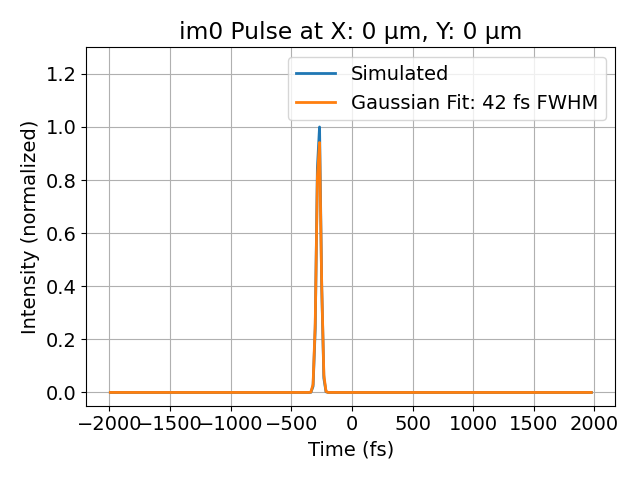

<IPython.core.display.Javascript object>


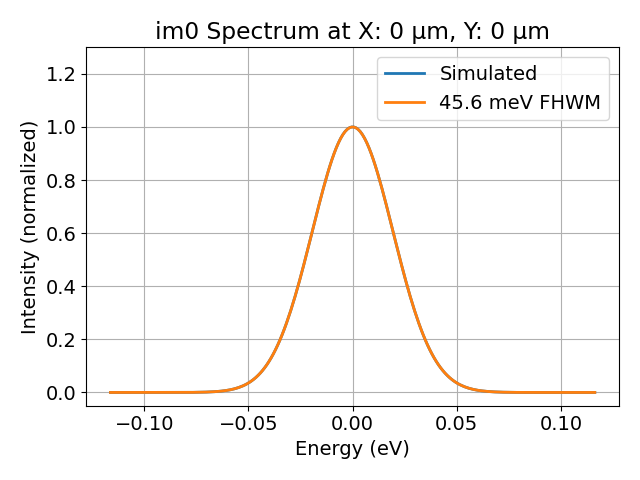

<IPython.core.display.Javascript object>


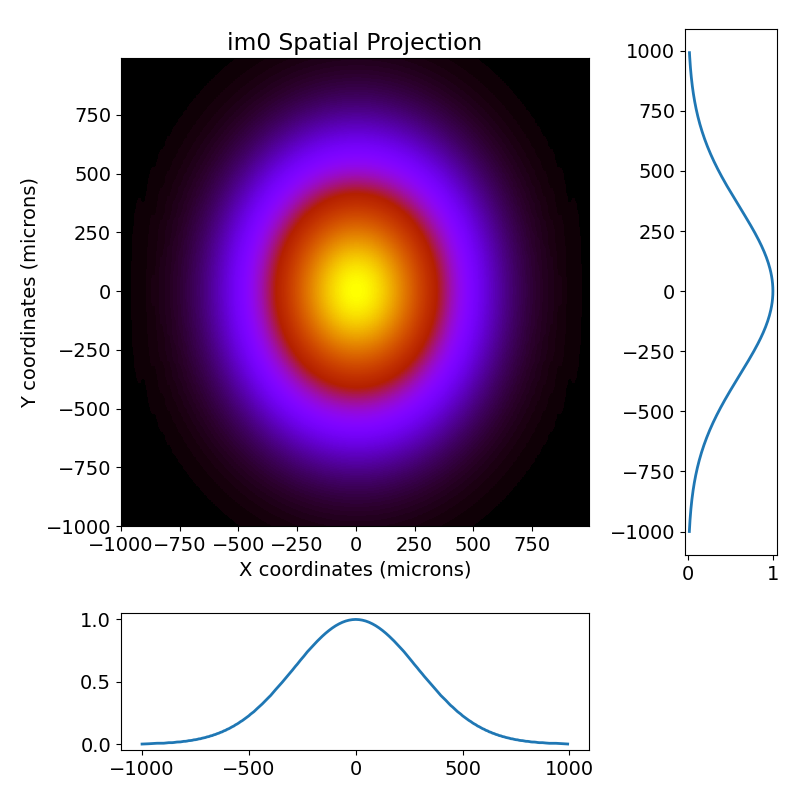

In [24]:
fig_path = '/Users/Matt/OneDrive - SLAC National Accelerator Laboratory/Projects/Tunable Mono/figures/Option2/'

# plot input pulse at beam center
pulse.plot_pulse('im0')
plt.savefig(fig_path+'input_pulse_slit.png')
# plot input spectrum at beam center
pulse.plot_spectrum('im0')
plt.savefig(fig_path+'input_spectrum_slit.png')
# plot input beam spatial projection
pulse.imshow_projection('im0')
plt.savefig(fig_path+'input_spatial_slit.png')

### Visualize focus properties

<IPython.core.display.Javascript object>


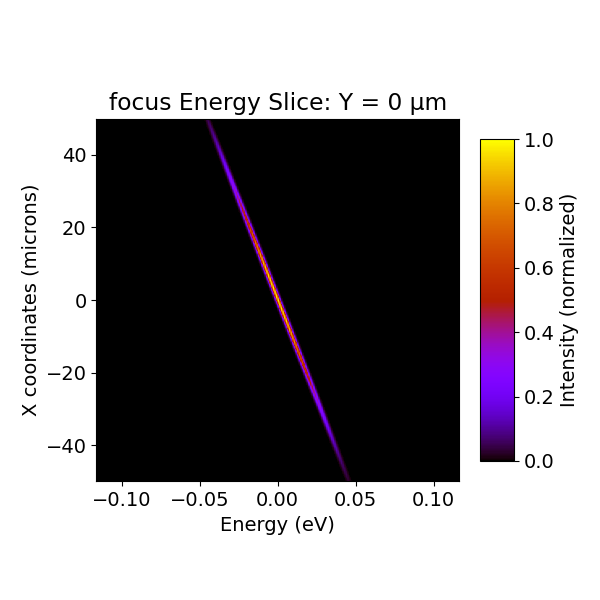

<IPython.core.display.Javascript object>


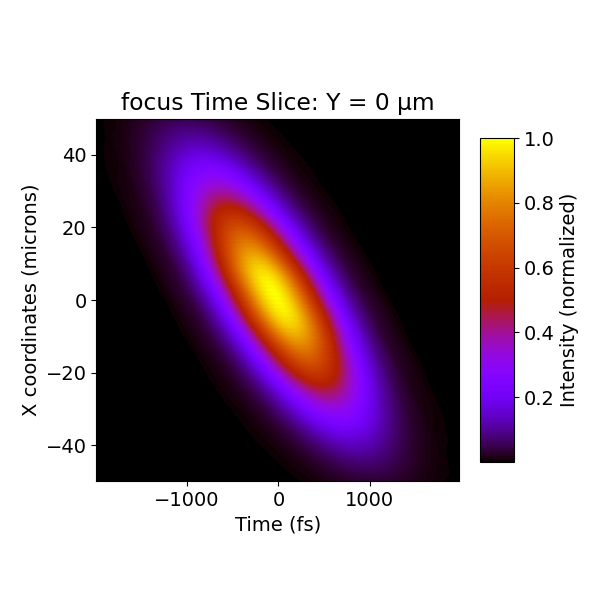

128


<IPython.core.display.Javascript object>


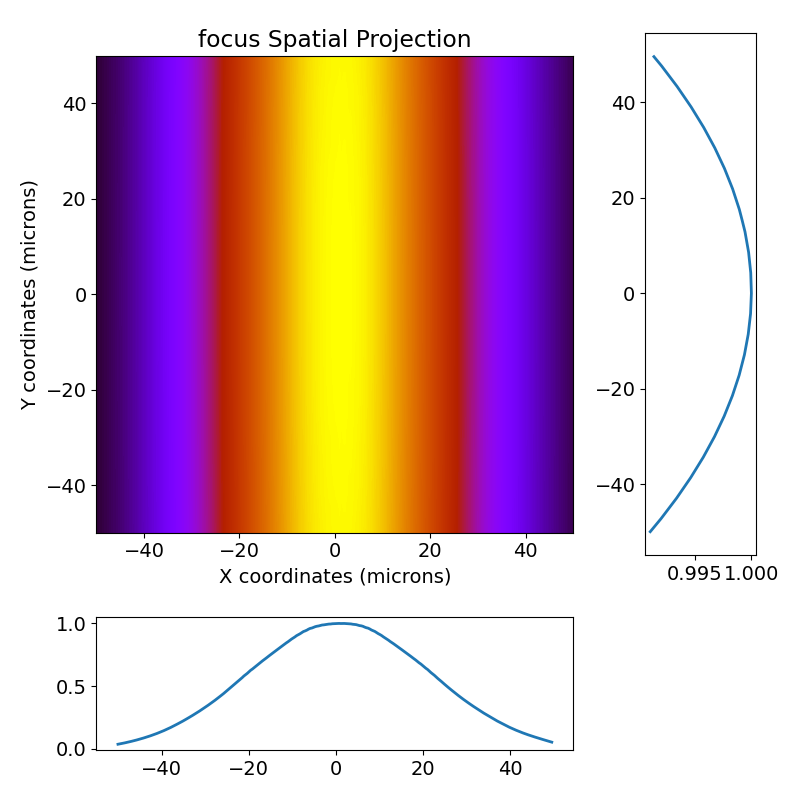

In [25]:
# plot energy slice of focus
pulse.imshow_energy_slice('focus')
plt.savefig(fig_path+'option2_focus_energy.png')
# plot time slice of focus
pulse.imshow_time_slice('focus', shift=965)
plt.savefig(fig_path+'option2_focus_time.png')
# show spatial projection
pulse.imshow_projection('focus')
plt.savefig(fig_path+'option2_focus_spatial.png')

### Visualize output

<IPython.core.display.Javascript object>


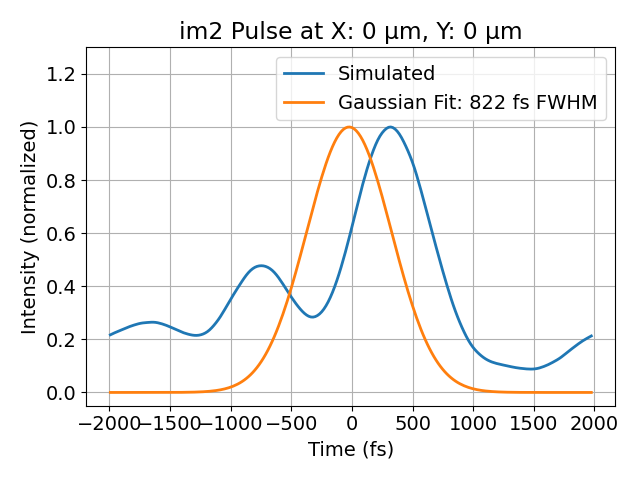

<IPython.core.display.Javascript object>


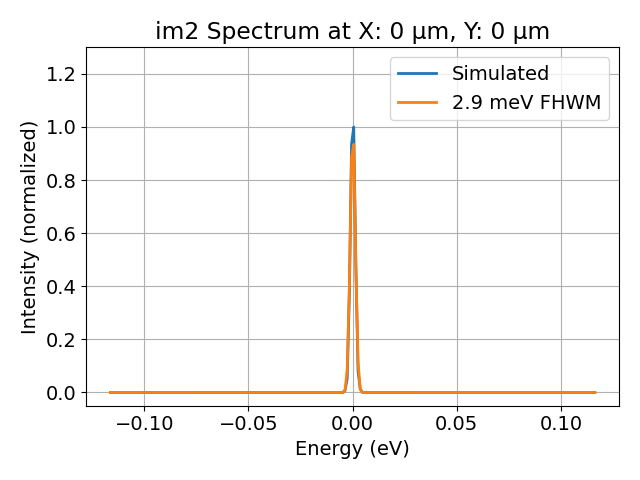

<IPython.core.display.Javascript object>


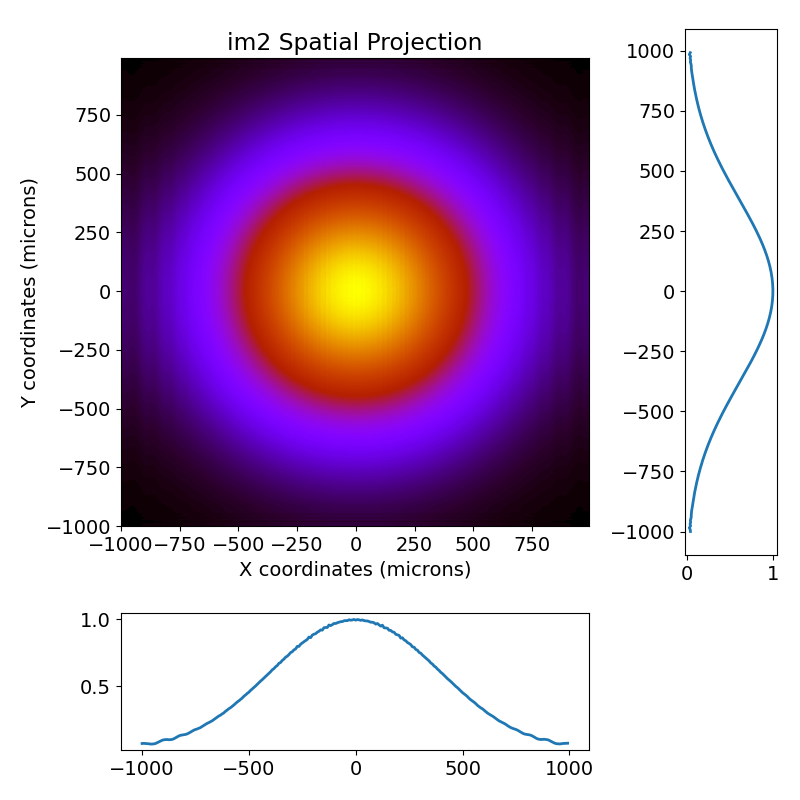

<IPython.core.display.Javascript object>


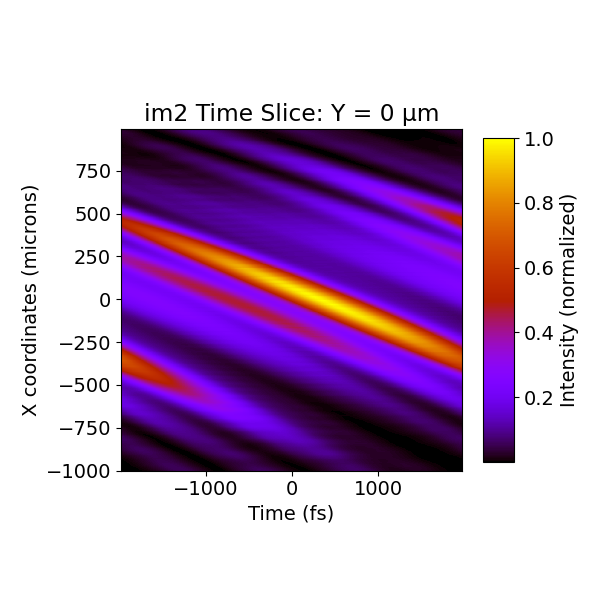

128


<IPython.core.display.Javascript object>


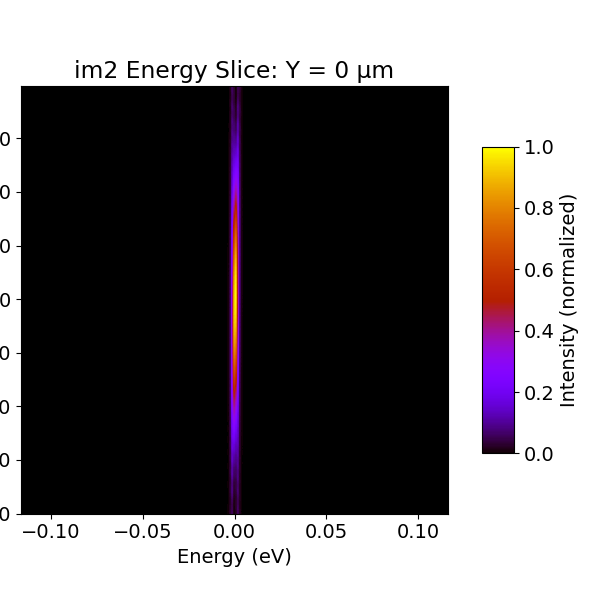

<IPython.core.display.Javascript object>


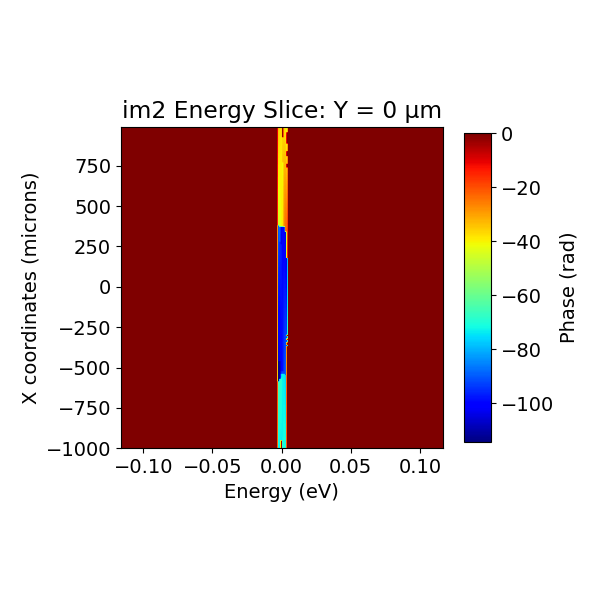

In [26]:
# plot output pulse at beam center
pulse.plot_pulse('im2', shift=400)
plt.savefig(fig_path+'option2_output_pulse.png')
# plot output spectraum at beam center
pulse.plot_spectrum('im2')
plt.savefig(fig_path+'option2_output_spectrum.png')
# show spatial projection of output
pulse.imshow_projection('im2')
plt.savefig(fig_path+'option2_output_spatial.png')
# show time slice of output
pulse.imshow_time_slice('im2', shift=400)
plt.savefig(fig_path+'option2_output_time.png')
# show energy slice of output
pulse.imshow_energy_slice('im2')
plt.savefig(fig_path+'option2_output_energy.png')
# show spectral phase slice of output
pulse.imshow_energy_slice('im2', image_type='phase')

# No slit

In [28]:
# list of devices to propagate through
devices = [crl0,im0,crystal1,crystal2,im_upstream, im1, crl1, focus, m2, crystal3, crystal4, im2]
# devices = [im0,crystal1,crystal2,im_upstream, im1, crl1, focus, crl2, crystal3, crystal4, im2]

# initialize beamline
mono_beamline = beamline.Beamline(devices)


after c1: 0.87
after c2: -0.00
after m2: -0.01
after c3: -0.87
after c4: -0.01


## Time-domain propagation

In [29]:
# reset central photon energy
beam_params['photonEnergy'] = 9000

# initialize pulse. tau sets transform-limited pulse duration in fs (FWHM). Time window is in fs.
pulse = beam.Pulse(beam_params=beam_params, tau=20, time_window=1000)

print('Number of spectral components: {:d}'.format(pulse.N))

Number of spectral components: 112


In [30]:
# propagate pulse through beamline. This will take a minute or so (depends on number of spectral 
# components which is proportional to the ratio time_window/tau).
pulse.propagate(beamline=mono_beamline, screen_names=['im2'])

FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.1311185554481415
5.1311185554481415
x is focused
y is focused
FWHM in x: 690.1350652490167 microns
FWHM in y: 690.1350652490167 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.1311185554481415
5.1311185554481415
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19843.081075
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 725729386764.34 microns
zRy: 73725289.55 microns
remaining distance: 40000000.00 microns
goal for zx: 19883081075.19 microns
current zx: 19843081075.19 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19883.081075
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19883.081075
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 725729386764.34 microns
zRy: 73725289.55 microns
remaining distanc

FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131123332111471
5.131123332111471
x is focused
y is focused
FWHM in x: 690.1344232113466 microns
FWHM in y: 690.1344232113466 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131123332111471
5.131123332111471
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19839.677473
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 725481119843.53 microns
zRy: 73725358.09 microns
remaining distance: 40000000.00 microns
goal for zx: 19879677473.18 microns
current zx: 19839677473.18 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19879.677473
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19879.677473
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 725481119843.53 microns
zRy: 73725358.09 microns
remaining distance: 1

Calculated distance to focus: 6994.285523
zRx: 2.19e+01
zRy: 7.37e+01
x becomes unfocused
zx: -6980.874415
zy: 262.084051
azimuth -6.10 mrad
drift11
delta z: -3.93
zRx: 93055105927.28 microns
zRy: 73725392.36 microns
remaining distance: 100036.43 microns
goal for zx: -6980774378.27 microns
current zx: -6980874414.70 microns
goal for zy: 262184087.14 microns
current zy: 262084050.71 microns
current step size: 100036.43 microns
x becomes focused
y stays unfocused
zx: -6980.774378
zy: 262.184087
azimuth -6.10 mrad
im2
zx: -6980.774378
zy: 262.184087
azimuth -6.10 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131128108774802
5.131128108774802
x is focused
y is focused
FWHM in x: 690.133781174872 microns
FWHM in y: 690.133781174872 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131128108774802
5.131128108774802
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 1983

zx: -7280.352934
zy: 262.184090
azimuth -6.11 mrad
im2
zx: -7280.352934
zy: 262.184090
azimuth -6.11 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131132885438133
5.131132885438133
x is focused
y is focused
FWHM in x: 690.1331391395934 microns
FWHM in y: 690.1331391395934 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131132885438133
5.131132885438133
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19832.873771
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 724984968726.52 microns
zRy: 73725495.17 microns
remaining distance: 40000000.00 microns
goal for zx: 19872873770.78 microns
current zx: 19832873770.78 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19872.873771
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19872.873771
zy: 240.000000
azimuth 

zx: 308.059062
zy: 253.193564
azimuth -0.09 mrad
crl1
zRx: 1.14e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030372
zy: 253.193564
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11359057165.82 microns
zRy: 73725529.44 microns
remaining distance: 100000.00 microns
goal for zx: -2930371.55 microns
current zx: -3030371.56 microns
goal for zy: 253293563.81 microns
current zy: 253193563.81 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930372
zy: 253.293564
azimuth -0.16 mrad
im1
zx: -2.930372
zy: 253.293564
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11359057165.82 microns
zRy: 73725529.44 microns
remaining distance: 2930000.04 microns
goal for zx: -371.52 microns
current zx: -2930371.55 microns
goal for zy: 256223563.85 microns
current zy: 253293563.81 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000372
zy: 256.223564
azimuth -0.16 mrad
focus
zx: -0.000372
zy: 256.223564
azimuth -0.16 mrad
drift8
delta z: 1

zx: -7777.617644
zy: 262.184094
azimuth -6.11 mrad
im2
zx: -7777.617644
zy: 262.184094
azimuth -6.11 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.13114005043313
5.13114005043313
x is focused
y is focused
FWHM in x: 690.1321760889169 microns
FWHM in y: 690.1321760889169 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.13114005043313
5.13114005043313
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19827.774056
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 724613189928.73 microns
zRy: 73725597.99 microns
remaining distance: 40000000.00 microns
goal for zx: 19867774055.54 microns
current zx: 19827774055.54 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19867.774056
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19867.774056
zy: 240.000000
azimuth 0.00

zx: 19874.375702
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19874.375702
zRx: 7.25e+05
zRy: 7.37e+01
zx: 19874.375699
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 725094991222.39 microns
zRy: 73725666.53 microns
remaining distance: 309563.80 microns
goal for zx: 19874685262.93 microns
current zx: 19874375699.13 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19874.685263
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -305.328966
zRx: 4.73e+07
zRy: 7.37e+01
zx: 305.092041
zy: 250.309564
azimuth -0.09 mrad
drift4
delta z: 0.00
zRx: 47273136882280.41 microns
zRy: 73725666.53 microns
remaining distance: 2784000.01 microns
goal for zx: 307876041.00 microns
current zx: 305092040.99 microns
goal for zy: 253093563.81 microns
current zy: 250309563.80 microns
current step size: 2784000.01 microns
x remains focused
y stays unfocused
z

zx: -8548.801597
zy: 262.184099
azimuth -6.11 mrad
im2
zx: -8548.801597
zy: 262.184099
azimuth -6.11 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.1311496037597895
5.1311496037597895
x is focused
y is focused
FWHM in x: 690.1308920255343 microns
FWHM in y: 690.1308920255343 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.1311496037597895
5.1311496037597895
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19820.978513
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 724117930358.12 microns
zRy: 73725735.07 microns
remaining distance: 40000000.00 microns
goal for zx: 19860978513.47 microns
current zx: 19820978513.47 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19860.978513
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19860.978513
zy: 240.000000
azim

zx: -137.988187
zy: 262.084100
azimuth -874.60 mrad
c4
Calculated distance to focus: 9004.564898
zRx: 3.60e+01
zRy: 7.37e+01
x becomes unfocused
zx: -8991.051679
zy: 262.084100
azimuth -6.11 mrad
drift11
delta z: -2.55
zRx: 152910751318.69 microns
zRy: 73725769.34 microns
remaining distance: 100001.56 microns
goal for zx: -8990951677.62 microns
current zx: -8991051679.18 microns
goal for zy: 262184101.48 microns
current zy: 262084099.93 microns
current step size: 100001.56 microns
x becomes focused
y stays unfocused
zx: -8990.951678
zy: 262.184101
azimuth -6.11 mrad
im2
zx: -8990.951678
zy: 262.184101
azimuth -6.11 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.13115438042312
5.13115438042312
x is focused
y is focused
FWHM in x: 690.1302499956364 microns
FWHM in y: 690.1302499956364 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.13115438042312
5.13115438042312
crl0
zRx

zRy: 7.37e+01
x becomes unfocused
zx: -148.433693
zy: 259.130957
azimuth -6.10 mrad
drift9
delta z: -1586.76
zRx: 2636351989.61 microns
zRy: 73725837.88 microns
remaining distance: 2062766.91 microns
goal for zx: -146370926.27 microns
current zx: -148433693.19 microns
goal for zy: 261193724.41 microns
current zy: 259130957.49 microns
current step size: 2062766.91 microns
x becomes focused
y stays unfocused
zx: -146.370926
zy: 261.193724
azimuth -6.10 mrad
c3
Calculated distance to focus: 146.370926
zRx: 2.64e+03
zRy: 7.37e+01
zx: -146.351130
zy: 261.193724
azimuth -874.59 mrad
drift10
delta z: 5.81
zRx: 2636351989.61 microns
zRy: 73725837.88 microns
remaining distance: 890382.18 microns
goal for zx: -145460748.20 microns
current zx: -146351130.39 microns
goal for zy: 262084106.59 microns
current zy: 261193724.41 microns
current step size: 890382.18 microns
x remains focused
y stays unfocused
zx: -145.460748
zy: 262.084107
azimuth -874.59 mrad
c4
Calculated distance to focus: 9492.19479

zRx: 4.72e+07
zRy: 7.37e+01
zx: 304.946880
zy: 250.309564
azimuth -0.10 mrad
drift4
delta z: 0.00
zRx: 47205126049704.89 microns
zRy: 73725906.43 microns
remaining distance: 2784000.01 microns
goal for zx: 307730879.93 microns
current zx: 304946879.91 microns
goal for zy: 253093563.81 microns
current zy: 250309563.80 microns
current step size: 2784000.01 microns
x remains focused
y stays unfocused
zx: 307.730880
zy: 253.093564
azimuth -0.10 mrad
im_upstream
zx: 307.730880
zy: 253.093564
azimuth -0.10 mrad
drift5
delta z: 0.00
zRx: 47205126049704.89 microns
zRy: 73725906.43 microns
remaining distance: 100000.00 microns
goal for zx: 307830879.93 microns
current zx: 307730879.93 microns
goal for zy: 253193563.81 microns
current zy: 253093563.81 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.830880
zy: 253.193564
azimuth -0.10 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030423
zy: 253.193564
azimuth -0.16 mrad
drift6
delta z: 0.

zRx: 7.24e+05
zRy: 7.37e+01
zx: 19859.097518
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 723981383797.00 microns
zRy: 73725974.97 microns
remaining distance: 309563.80 microns
goal for zx: 19859407081.53 microns
current zx: 19859097517.73 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19859.407082
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -305.094252
zRx: 4.72e+07
zRy: 7.37e+01
zx: 304.905435
zy: 250.309564
azimuth -0.11 mrad
drift4
delta z: 0.00
zRx: 47185719128977.74 microns
zRy: 73725974.97 microns
remaining distance: 2784000.02 microns
goal for zx: 307689434.75 microns
current zx: 304905434.74 microns
goal for zy: 253093563.81 microns
current zy: 250309563.80 microns
current step size: 2784000.02 microns
x remains focused
y stays unfocused
zx: 307.689435
zy: 253.093564
azimuth -0.11 mrad
im_upstream
zx: 307.689435
zy: 253.093564
azimuth

delta z: -1.69
zRx: 225453326793.53 microns
zRy: 73726009.24 microns
remaining distance: 99987.18 microns
goal for zx: -10949275834.40 microns
current zx: -10949375821.59 microns
goal for zy: 262184107.40 microns
current zy: 262084120.21 microns
current step size: 99987.18 microns
x becomes focused
y stays unfocused
zx: -10949.275834
zy: 262.184107
azimuth -6.11 mrad
im2
zx: -10949.275834
zy: 262.184107
azimuth -6.11 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131171098744779
5.131171098744779
x is focused
y is focused
FWHM in x: 690.1280029004103 microns
FWHM in y: 690.1280029004103 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131171098744779
5.131171098744779
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19805.705562
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 723005454451.08 microns
zRy: 73726043.51 microns
remaining distance: 4000000

delta z: -1.44
zRx: 255541857350.18 microns
zRy: 73726077.78 microns
remaining distance: 99984.18 microns
goal for zx: -11666645661.67 microns
current zx: -11666745645.84 microns
goal for zy: 262184108.63 microns
current zy: 262084124.45 microns
current step size: 99984.18 microns
x becomes focused
y stays unfocused
zx: -11666.645662
zy: 262.184109
azimuth -6.11 mrad
im2
zx: -11666.645662
zy: 262.184109
azimuth -6.11 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131175875408108
5.131175875408108
x is focused
y is focused
FWHM in x: 690.1273608758934 microns
FWHM in y: 690.1273608758934 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131175875408108
5.131175875408108
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19802.314768
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 722758586376.52 microns
zRy: 73726112.05 microns
remaining distance: 4000000

zx: -0.000456
zy: 256.223564
azimuth -0.16 mrad
drift8
delta z: 1584.54
zRx: 11324464700.64 microns
zRy: 73726146.32 microns
remaining distance: 2921653.10 microns
goal for zx: 2921197.32 microns
current zx: -455.78 microns
goal for zy: 259145216.95 microns
current zy: 256223563.85 microns
current step size: 2921653.10 microns
x remains focused
y stays unfocused
zx: 2.921197
zy: 259.145217
azimuth -0.16 mrad
m2
zRx: 1.02e+00
zRy: 7.37e+01
x becomes unfocused
zx: -194.415846
zy: 259.145217
azimuth -6.11 mrad
drift9
delta z: -1587.35
zRx: 4521326498.55 microns
zRy: 73726146.32 microns
remaining distance: 2048483.11 microns
goal for zx: -192367362.58 microns
current zx: -194415845.70 microns
goal for zy: 261193700.07 microns
current zy: 259145216.95 microns
current step size: 2048483.11 microns
x becomes focused
y stays unfocused
zx: -192.367363
zy: 261.193700
azimuth -6.11 mrad
c3
Calculated distance to focus: 192.367363
zRx: 4.52e+03
zRy: 7.37e+01
zx: -192.347412
zy: 261.193700
azimuth 

current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000465
zy: 256.223564
azimuth -0.16 mrad
focus
zx: -0.000465
zy: 256.223564
azimuth -0.16 mrad
drift8
delta z: 1584.62
zRx: 11320630640.33 microns
zRy: 73726214.87 microns
remaining distance: 2924822.29 microns
goal for zx: 2924357.15 microns
current zx: -465.15 microns
goal for zy: 259148386.15 microns
current zy: 256223563.86 microns
current step size: 2924822.29 microns
x remains focused
y stays unfocused
zx: 2.924357
zy: 259.148386
azimuth -0.16 mrad
m2
zRx: 1.02e+00
zRy: 7.37e+01
x becomes unfocused
zx: -208.663897
zy: 259.148386
azimuth -6.11 mrad
drift9
delta z: -1587.48
zRx: 5207952272.46 microns
zRy: 73726214.87 microns
remaining distance: 2045308.22 microns
goal for zx: -206618588.65 microns
current zx: -208663896.87 microns
goal for zy: 261193694.37 microns
current zy: 259148386.15 microns
current step size: 2045308.22 microns
x becomes focused
y stays unfocused
zx: -206.618589
zy: 261.193694
az

zx: -222.160277
zy: 262.084133
azimuth -874.57 mrad
c4
Calculated distance to focus: 14497.303598
zRx: 9.22e+01
zRy: 7.37e+01
x becomes unfocused
zx: -14483.595055
zy: 262.084133
azimuth -6.11 mrad
drift11
delta z: -0.72
zRx: 391918672033.55 microns
zRy: 73726283.41 microns
remaining distance: 99978.07 microns
goal for zx: -14483495076.89 microns
current zx: -14483595054.95 microns
goal for zy: 262184111.15 microns
current zy: 262084133.08 microns
current step size: 99978.07 microns
x becomes focused
y stays unfocused
zx: -14483.495077
zy: 262.184111
azimuth -6.11 mrad
im2
zx: -14483.495077
zy: 262.184111
azimuth -6.11 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.1311902053981004
5.1311902053981004
x is focused
y is focused
FWHM in x: 690.1254348095164 microns
FWHM in y: 690.1254348095164 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.1311902053981004
5.1311902053981

delta z: 1584.77
zRx: 11312968232.71 microns
zRy: 73726351.95 microns
remaining distance: 2931161.14 microns
goal for zx: 2930677.27 microns
current zx: -483.87 microns
goal for zy: 259154725.00 microns
current zy: 256223563.86 microns
current step size: 2931161.14 microns
x remains focused
y stays unfocused
zx: 2.930677
zy: 259.154725
azimuth -0.16 mrad
m2
zRx: 1.03e+00
zRy: 7.37e+01
x becomes unfocused
zx: -244.315529
zy: 259.154725
azimuth -6.12 mrad
drift9
delta z: -1587.74
zRx: 7138618109.96 microns
zRy: 73726351.95 microns
remaining distance: 2038957.65 microns
goal for zx: -242276570.96 microns
current zx: -244315528.62 microns
goal for zy: 261193682.65 microns
current zy: 259154725.00 microns
current step size: 2038957.65 microns
x becomes focused
y stays unfocused
zx: -242.276571
zy: 261.193683
azimuth -6.12 mrad
c3
Calculated distance to focus: 242.276571
zRx: 7.14e+03
zRy: 7.37e+01
zx: -242.256478
zy: 261.193683
azimuth -874.57 mrad
drift10
delta z: 3.64
zRx: 7138618109.96 m

zx: 307.420359
zy: 253.093564
azimuth -0.13 mrad
drift5
delta z: 0.00
zRx: 47059841415512.42 microns
zRy: 73726420.49 microns
remaining distance: 100000.00 microns
goal for zx: 307520359.31 microns
current zx: 307420359.30 microns
goal for zy: 253193563.82 microns
current zy: 253093563.82 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.520359
zy: 253.193564
azimuth -0.13 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030493
zy: 253.193564
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11309139878.74 microns
zRy: 73726420.49 microns
remaining distance: 100000.00 microns
goal for zx: -2930493.27 microns
current zx: -3030493.27 microns
goal for zy: 253293563.82 microns
current zy: 253193563.82 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930493
zy: 253.293564
azimuth -0.16 mrad
im1
zx: -2.930493
zy: 253.293564
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11309139878.74 microns
zRy: 73726420.

zx: 19833.995702
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -304.703864
zRx: 4.70e+07
zRy: 7.37e+01
zx: 304.595012
zy: 250.309564
azimuth -0.13 mrad
drift4
delta z: 0.00
zRx: 47040516659796.62 microns
zRy: 73726489.03 microns
remaining distance: 2784000.02 microns
goal for zx: 307379011.97 microns
current zx: 304595011.95 microns
goal for zy: 253093563.82 microns
current zy: 250309563.80 microns
current step size: 2784000.02 microns
x remains focused
y stays unfocused
zx: 307.379012
zy: 253.093564
azimuth -0.13 mrad
im_upstream
zx: 307.379012
zy: 253.093564
azimuth -0.13 mrad
drift5
delta z: 0.00
zRx: 47040516659796.62 microns
zRy: 73726489.03 microns
remaining distance: 100000.00 microns
goal for zx: 307479011.97 microns
current zx: 307379011.97 microns
goal for zy: 253193563.82 microns
current zy: 253093563.82 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.479012
zy: 253.193564
azimuth -0.13 mrad
crl1
zRx: 1.13e+04
zR

zRx: 1.15e+04
zRy: 7.37e+01
zx: -308.055673
zy: 261.193667
azimuth -874.56 mrad
drift10
delta z: 2.94
zRx: 11498986748.92 microns
zRy: 73726523.31 microns
remaining distance: 890468.05 microns
goal for zx: -307165205.20 microns
current zx: -308055673.25 microns
goal for zy: 262084135.46 microns
current zy: 261193667.41 microns
current step size: 890468.05 microns
x remains focused
y stays unfocused
zx: -307.165205
zy: 262.084135
azimuth -874.56 mrad
c4
Calculated distance to focus: 20044.389971
zRx: 1.75e+02
zRy: 7.37e+01
x becomes unfocused
zx: -20030.528185
zy: 262.084135
azimuth -6.12 mrad
drift11
delta z: 0.11
zRx: 745427091029.88 microns
zRy: 73726523.31 microns
remaining distance: 99976.38 microns
goal for zx: -20030428208.17 microns
current zx: -20030528184.55 microns
goal for zy: 262184111.84 microns
current zy: 262084135.46 microns
current step size: 99976.38 microns
x becomes focused
y stays unfocused
zx: -20030.428208
zy: 262.184112
azimuth -6.12 mrad
im2
zx: -20030.428208
z

Calculated distance to focus: 345.298950
zRx: 1.44e+04
zRy: 7.37e+01
zx: -345.278600
zy: 261.193661
azimuth -874.56 mrad
drift10
delta z: 2.66
zRx: 14423908695.32 microns
zRy: 73726591.85 microns
remaining distance: 890473.51 microns
goal for zx: -344388126.04 microns
current zx: -345278599.54 microns
goal for zy: 262084134.64 microns
current zy: 261193661.14 microns
current step size: 890473.51 microns
x remains focused
y stays unfocused
zx: -344.388126
zy: 262.084135
azimuth -874.56 mrad
c4
Calculated distance to focus: 22473.410994
zRx: 2.20e+02
zRy: 7.37e+01
x becomes unfocused
zx: -22459.487735
zy: 262.084135
azimuth -6.12 mrad
drift11
delta z: 0.35
zRx: 935701941828.67 microns
zRy: 73726591.85 microns
remaining distance: 99976.96 microns
goal for zx: -22459387758.13 microns
current zx: -22459487735.09 microns
goal for zy: 262184111.60 microns
current zy: 262084134.64 microns
current step size: 99976.96 microns
x becomes focused
y stays unfocused
zx: -22459.387758
zy: 262.184112
a

zx: -0.000526
zy: 256.223564
azimuth -0.16 mrad
drift8
delta z: 1585.12
zRx: 11295755618.67 microns
zRy: 73726660.39 microns
remaining distance: 2945425.80 microns
goal for zx: 2944899.80 microns
current zx: -526.00 microns
goal for zy: 259168989.66 microns
current zy: 256223563.86 microns
current step size: 2945425.80 microns
x remains focused
y stays unfocused
zx: 2.944900
zy: 259.168990
azimuth -0.16 mrad
m2
zRx: 1.04e+00
zRy: 7.37e+01
x becomes unfocused
zx: -394.541114
zy: 259.168990
azimuth -6.14 mrad
drift9
delta z: -1588.32
zRx: 18610616362.79 microns
zRy: 73726660.39 microns
remaining distance: 2024665.10 microns
goal for zx: -392516448.53 microns
current zx: -394541113.63 microns
goal for zy: 261193654.76 microns
current zy: 259168989.66 microns
current step size: 2024665.10 microns
x becomes focused
y stays unfocused
zx: -392.516449
zy: 261.193655
azimuth -6.14 mrad
c3
Calculated distance to focus: 392.516449
zRx: 1.86e+04
zRy: 7.37e+01
zx: -392.495988
zy: 261.193655
azimuth

zy: 250.309564
azimuth -0.14 mrad
drift4
delta z: 0.00
zRx: 46972965964601.48 microns
zRy: 73726728.93 microns
remaining distance: 2784000.03 microns
goal for zx: 307234398.85 microns
current zx: 304450398.83 microns
goal for zy: 253093563.83 microns
current zy: 250309563.80 microns
current step size: 2784000.03 microns
x remains focused
y stays unfocused
zx: 307.234399
zy: 253.093564
azimuth -0.14 mrad
im_upstream
zx: 307.234399
zy: 253.093564
azimuth -0.14 mrad
drift5
delta z: 0.00
zRx: 46972965964601.48 microns
zRy: 73726728.93 microns
remaining distance: 100000.00 microns
goal for zx: 307334398.85 microns
current zx: 307234398.85 microns
goal for zy: 253193563.83 microns
current zy: 253093563.83 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.334399
zy: 253.193564
azimuth -0.14 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030535
zy: 253.193564
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11291935813.53 microns
zRy: 7372672

current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19808.470581
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19808.470581
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 720296856887.15 microns
zRy: 73726797.47 microns
remaining distance: 10000000.00 microns
goal for zx: 19818470581.08 microns
current zx: 19808470581.08 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19818.470581
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19818.470581
zRx: 7.21e+05
zRy: 7.37e+01
zx: 19818.470581
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 721024301915.58 microns
zRy: 73726797.47 microns
remaining distance: 309563.80 microns
goal for zx: 19818780145.03 microns
current zx: 19818470581.24 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 mic

/Users/Matt/beamline/venv/lib/python3.7/site-packages/scipy/optimize/minpack.py:808: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)



zy: 262.184110
azimuth -6.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.13122603037308
5.13122603037308
x is focused
y is focused
FWHM in x: 690.1206196906554 microns
FWHM in y: 690.1206196906554 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.13122603037308
5.13122603037308
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19766.781408
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 720174101308.63 microns
zRy: 73726831.74 microns
remaining distance: 40000000.00 microns
goal for zx: 19806781408.23 microns
current zx: 19766781408.23 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19806.781408
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19806.781408
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 720174101308.63 microns
zRy: 73726831.7

zx: -661.543474
zy: 261.193635
azimuth -6.15 mrad
c3
Calculated distance to focus: 661.543474
zRx: 5.26e+04
zRy: 7.37e+01
zx: -661.522429
zy: 261.193635
azimuth -874.55 mrad
drift10
delta z: 1.55
zRx: 52631324817.99 microns
zRy: 73726866.02 microns
remaining distance: 890489.75 microns
goal for zx: -660631939.48 microns
current zx: -661522429.23 microns
goal for zy: 262084124.75 microns
current zy: 261193635.00 microns
current step size: 890489.75 microns
x remains focused
y stays unfocused
zx: -660.631939
zy: 262.084125
azimuth -874.55 mrad
c4
Calculated distance to focus: 43110.235137
zRx: 8.05e+02
zRy: 7.37e+01
x becomes unfocused
zx: -43095.836410
zy: 262.084125
azimuth -6.12 mrad
drift11
delta z: 1.28
zRx: 3423897987333.87 microns
zRy: 73726866.02 microns
remaining distance: 99983.97 microns
goal for zx: -43095736426.45 microns
current zx: -43095836410.42 microns
goal for zy: 262184108.72 microns
current zy: 262084124.75 microns
current step size: 99983.97 microns
x becomes focuse

Calculated distance to focus: -304.366337
zRx: 4.69e+07
zRy: 7.37e+01
zx: 304.326571
zy: 250.309564
azimuth -0.15 mrad
drift4
delta z: 0.00
zRx: 46915171612867.20 microns
zRy: 73726934.56 microns
remaining distance: 2784000.03 microns
goal for zx: 307110571.42 microns
current zx: 304326571.39 microns
goal for zy: 253093563.83 microns
current zy: 250309563.80 microns
current step size: 2784000.03 microns
x remains focused
y stays unfocused
zx: 307.110571
zy: 253.093564
azimuth -0.15 mrad
im_upstream
zx: 307.110571
zy: 253.093564
azimuth -0.15 mrad
drift5
delta z: 0.00
zRx: 46915171612867.20 microns
zRy: 73726934.56 microns
remaining distance: 100000.00 microns
goal for zx: 307210571.42 microns
current zx: 307110571.42 microns
goal for zy: 253193563.83 microns
current zy: 253093563.83 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.210571
zy: 253.193564
azimuth -0.15 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030563
zy: 253.19

zx: -1001.367231
zy: 261.193625
azimuth -6.15 mrad
c3
Calculated distance to focus: 1001.367231
zRx: 1.20e+05
zRy: 7.37e+01
zx: -1001.345482
zy: 261.193625
azimuth -874.54 mrad
drift10
delta z: 1.13
zRx: 120328717593.55 microns
zRy: 73726968.83 microns
remaining distance: 890493.56 microns
goal for zx: -1000454988.39 microns
current zx: -1001345481.95 microns
goal for zy: 262084118.34 microns
current zy: 261193624.78 microns
current step size: 890493.56 microns
x remains focused
y stays unfocused
zx: -1000.454988
zy: 262.084118
azimuth -874.54 mrad
c4
Calculated distance to focus: 65285.747200
zRx: 1.84e+03
zRy: 7.37e+01
x becomes unfocused
zx: -65270.866307
zy: 262.084118
azimuth -6.12 mrad
drift11
delta z: 1.63
zRx: 7836071381680.43 microns
zRy: 73726968.83 microns
remaining distance: 99988.51 microns
goal for zx: -65270766318.91 microns
current zx: -65270866307.42 microns
goal for zy: 262184106.85 microns
current zy: 262084118.34 microns
current step size: 99988.51 microns
x becomes

zRx: 7.20e+05
zRy: 7.37e+01
zx: 19806.652430
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 720165239333.43 microns
zRy: 73727037.37 microns
remaining distance: 309563.80 microns
goal for zx: 19806961994.22 microns
current zx: 19806652430.42 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19806.961994
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -304.288553
zRx: 4.69e+07
zRy: 7.37e+01
zx: 304.264701
zy: 250.309564
azimuth -0.15 mrad
drift4
delta z: 0.00
zRx: 46886311136471.64 microns
zRy: 73727037.37 microns
remaining distance: 2784000.03 microns
goal for zx: 307048701.52 microns
current zx: 304264701.48 microns
goal for zy: 253093563.83 microns
current zy: 250309563.80 microns
current step size: 2784000.03 microns
x remains focused
y stays unfocused
zx: 307.048702
zy: 253.093564
azimuth -0.15 mrad
im_upstream
zx: 307.048702
zy: 253.093564
azimuth

zRy: 7.37e+01
focal length: 3.00
zx: -3.030587
zy: 253.193564
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11270960725.35 microns
zRy: 73727105.91 microns
remaining distance: 100000.00 microns
goal for zx: -2930586.88 microns
current zx: -3030586.88 microns
goal for zy: 253293563.83 microns
current zy: 253193563.83 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930587
zy: 253.293564
azimuth -0.16 mrad
im1
zx: -2.930587
zy: 253.293564
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11270960725.35 microns
zRy: 73727105.91 microns
remaining distance: 2930000.04 microns
goal for zx: -586.84 microns
current zx: -2930586.88 microns
goal for zy: 256223563.87 microns
current zy: 253293563.83 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000587
zy: 256.223564
azimuth -0.16 mrad
focus
zx: -0.000587
zy: 256.223564
azimuth -0.16 mrad
drift8
delta z: 1585.62
zRx: 11270960725.35 microns
zRy: 73727105.91 microns
remainin

zx: -0.000596
zy: 256.223564
azimuth -0.16 mrad
focus
zx: -0.000596
zy: 256.223564
azimuth -0.16 mrad
drift8
delta z: 1585.70
zRx: 11267153216.49 microns
zRy: 73727174.45 microns
remaining distance: 2969207.18 microns
goal for zx: 2968610.97 microns
current zx: -596.20 microns
goal for zy: 259192771.05 microns
current zy: 256223563.87 microns
current step size: 2969207.18 microns
x remains focused
y stays unfocused
zx: 2.968611
zy: 259.192771
azimuth -0.16 mrad
m2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
zx: 57370.140840
zy: 259.192771
azimuth -6.16 mrad
drift9
delta z: -1589.28
zRx: 393298102673856.00 microns
zRy: 73727174.45 microns
remaining distance: 2000832.61 microns
goal for zx: 57372141672.78 microns
current zx: 57370140840.17 microns
goal for zy: 261193603.66 microns
current zy: 259192771.05 microns
current step size: 2000832.61 microns
x becomes focused
y stays unfocused
zx: 57372.141673
zy: 261.193604
azimuth -6.16 mrad
c3
Calculated distance to focus: -57372.141673
z

zRx: 718703483224.28 microns
zRy: 73727243.00 microns
remaining distance: 40000000.00 microns
goal for zx: 19786533827.40 microns
current zx: 19746533827.40 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19786.533827
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19786.533827
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 718703483224.28 microns
zRy: 73727243.00 microns
remaining distance: 10000000.00 microns
goal for zx: 19796533827.40 microns
current zx: 19786533827.40 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19796.533827
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19796.533827
zRx: 7.19e+05
zRy: 7.37e+01
zx: 19796.533826
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 719430123982.88 microns
zRy: 73727243.00 microns
remaining

current step size: 2973964.50 microns
x remains focused
y stays unfocused
zx: 2.973354
zy: 259.197528
azimuth -0.16 mrad
m2
zRx: 1.06e+00
zRy: 7.37e+01
x becomes unfocused
zx: 1918.916854
zy: 259.197528
azimuth -6.16 mrad
drift9
delta z: -1589.47
zRx: 439963965097.89 microns
zRy: 73727277.27 microns
remaining distance: 1996064.39 microns
goal for zx: 1920912918.29 microns
current zx: 1918916853.90 microns
goal for zy: 261193592.76 microns
current zy: 259197528.37 microns
current step size: 1996064.39 microns
x becomes focused
y stays unfocused
zx: 1920.912918
zy: 261.193593
azimuth -6.16 mrad
c3
Calculated distance to focus: -1920.912918
zRx: 4.40e+05
zRy: 7.37e+01
zx: 1920.928865
zy: 261.193593
azimuth -874.53 mrad
drift10
delta z: -0.08
zRx: 439963965097.89 microns
zRy: 73727277.27 microns
remaining distance: 890497.66 microns
goal for zx: 1921819363.12 microns
current zx: 1920928865.46 microns
goal for zy: 262084090.42 microns
current zy: 261193592.76 microns
current step size: 8904

zx: 1170.628933
zy: 261.193585
azimuth -6.17 mrad
c3
Calculated distance to focus: -1170.628933
zRx: 1.63e+05
zRy: 7.37e+01
zx: 1170.646402
zy: 261.193585
azimuth -874.52 mrad
drift10
delta z: -0.35
zRx: 163167327900.91 microns
zRy: 73727345.81 microns
remaining distance: 890497.09 microns
goal for zx: 1171536899.42 microns
current zx: 1170646402.32 microns
goal for zy: 262084082.46 microns
current zy: 261193585.37 microns
current step size: 890497.09 microns
x remains focused
y stays unfocused
zx: 1171.536899
zy: 262.084082
azimuth -874.52 mrad
c4
Calculated distance to focus: -76449.878044
zRx: 2.50e+03
zRy: 7.37e+01
x becomes unfocused
zx: 76461.828989
zy: 262.084082
azimuth -6.13 mrad
drift11
delta z: 2.88
zRx: 10665865332291.89 microns
zRy: 73727345.81 microns
remaining distance: 100013.93 microns
goal for zx: 76461929003.27 microns
current zx: 76461828989.34 microns
goal for zy: 262184096.40 microns
current zy: 262084082.46 microns
current step size: 100013.93 microns
x becomes f

zx: 19788.109573
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19788.109573
zRx: 7.19e+05
zRy: 7.37e+01
zx: 19788.109574
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 718818389172.20 microns
zRy: 73727414.35 microns
remaining distance: 309563.80 microns
goal for zx: 19788419137.42 microns
current zx: 19788109573.62 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19788.419137
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -304.003685
zRx: 4.68e+07
zRy: 7.37e+01
zx: 304.038095
zy: 250.309564
azimuth -0.17 mrad
drift4
delta z: 0.00
zRx: 46780698233187.38 microns
zRy: 73727414.35 microns
remaining distance: 2784000.04 microns
goal for zx: 306822094.57 microns
current zx: 304038094.53 microns
goal for zy: 253093563.84 microns
current zy: 250309563.80 microns
current step size: 2784000.04 microns
x remains focused
y stays unfocused
z

delta z: -0.75
zRx: 64996081492.00 microns
zRy: 73727448.62 microns
remaining distance: 890495.24 microns
goal for zx: 740510498.97 microns
current zx: 739620003.74 microns
goal for zy: 262084069.34 microns
current zy: 261193574.10 microns
current step size: 890495.24 microns
x remains focused
y stays unfocused
zx: 740.510499
zy: 262.084069
azimuth -874.52 mrad
c4
Calculated distance to focus: -48322.794924
zRx: 9.98e+02
zRy: 7.37e+01
x becomes unfocused
zx: 48335.352913
zy: 262.084069
azimuth -6.13 mrad
drift11
delta z: 3.21
zRx: 4252935498493.47 microns
zRy: 73727448.62 microns
remaining distance: 100023.23 microns
goal for zx: 48335452936.19 microns
current zx: 48335352912.96 microns
goal for zy: 262184092.57 microns
current zy: 262084069.34 microns
current step size: 100023.23 microns
x becomes focused
y stays unfocused
zx: 48335.452936
zy: 262.184093
azimuth -6.13 mrad
im2
zx: 48335.452936
zy: 262.184093
azimuth -6.13 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580

zx: -0.000643
zy: 256.223564
azimuth -0.16 mrad
focus
zx: -0.000643
zy: 256.223564
azimuth -0.16 mrad
drift8
delta z: 1586.08
zRx: 11248143950.50 microns
zRy: 73727517.17 microns
remaining distance: 2985066.26 microns
goal for zx: 2984423.26 microns
current zx: -643.00 microns
goal for zy: 259208630.14 microns
current zy: 256223563.88 microns
current step size: 2985066.26 microns
x remains focused
y stays unfocused
zx: 2.984423
zy: 259.208630
azimuth -0.16 mrad
m2
zRx: 1.06e+00
zRy: 7.37e+01
x becomes unfocused
zx: 592.467140
zy: 259.208630
azimuth -6.17 mrad
drift9
delta z: -1589.91
zRx: 41930285505.57 microns
zRy: 73727517.17 microns
remaining distance: 1984936.32 microns
goal for zx: 594452076.22 microns
current zx: 592467139.90 microns
goal for zy: 261193566.47 microns
current zy: 259208630.14 microns
current step size: 1984936.32 microns
x becomes focused
y stays unfocused
zx: 594.452076
zy: 261.193566
azimuth -6.17 mrad
c3
Calculated distance to focus: -594.452076
zRx: 4.19e+04
z

zx: 19779.692503
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19779.692503
zRx: 7.18e+05
zRy: 7.37e+01
zx: 19779.692502
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 718207435951.48 microns
zRy: 73727585.71 microns
remaining distance: 309563.80 microns
goal for zx: 19780002065.68 microns
current zx: 19779692501.89 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19780.002066
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -303.874376
zRx: 4.67e+07
zRy: 7.37e+01
zx: 303.935221
zy: 250.309564
azimuth -0.18 mrad
drift4
delta z: 0.00
zRx: 46732800597221.24 microns
zRy: 73727585.71 microns
remaining distance: 2784000.04 microns
goal for zx: 306719220.78 microns
current zx: 303935220.73 microns
goal for zy: 253093563.84 microns
current zy: 250309563.80 microns
current step size: 2784000.04 microns
x remains focused
y stays unfocused
z

zx: 19776.327684
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19776.327684
zRx: 7.18e+05
zRy: 7.37e+01
zx: 19776.327682
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 717963273209.96 microns
zRy: 73727654.25 microns
remaining distance: 309563.80 microns
goal for zx: 19776637245.60 microns
current zx: 19776327681.81 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19776.637246
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -303.822683
zRx: 4.67e+07
zRy: 7.37e+01
zx: 303.894094
zy: 250.309564
azimuth -0.18 mrad
drift4
delta z: 0.00
zRx: 46713660438501.97 microns
zRy: 73727654.25 microns
remaining distance: 2784000.05 microns
goal for zx: 306678093.84 microns
current zx: 303894093.79 microns
goal for zy: 253093563.84 microns
current zy: 250309563.80 microns
current step size: 2784000.05 microns
x remains focused
y stays unfocused
z

azimuth -6.18 mrad
c3
Calculated distance to focus: -399.755032
zRx: 1.89e+04
zRy: 7.37e+01
zx: 399.774127
zy: 261.193547
azimuth -874.51 mrad
drift10
delta z: -1.67
zRx: 18897552332.82 microns
zRy: 73727688.52 microns
remaining distance: 890486.29 microns
goal for zx: 400664613.00 microns
current zx: 399774126.71 microns
goal for zy: 262084033.24 microns
current zy: 261193546.95 microns
current step size: 890486.29 microns
x remains focused
y stays unfocused
zx: 400.664613
zy: 262.084033
azimuth -874.51 mrad
c4
Calculated distance to focus: -26145.792604
zRx: 2.91e+02
zRy: 7.37e+01
x becomes unfocused
zx: 26158.851670
zy: 262.084033
azimuth -6.13 mrad
drift11
delta z: 3.98
zRx: 1239423543153.53 microns
zRy: 73727688.52 microns
remaining distance: 100048.81 microns
goal for zx: 26158951719.03 microns
current zx: 26158851670.22 microns
goal for zy: 262184082.05 microns
current zy: 262084033.24 microns
current step size: 100048.81 microns
x becomes focused
y stays unfocused
zx: 26158.951

zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -303.745177
zRx: 4.67e+07
zRy: 7.37e+01
zx: 303.832428
zy: 250.309564
azimuth -0.19 mrad
drift4
delta z: 0.00
zRx: 46684970454988.74 microns
zRy: 73727757.06 microns
remaining distance: 2784000.05 microns
goal for zx: 306616427.72 microns
current zx: 303832427.67 microns
goal for zy: 253093563.85 microns
current zy: 250309563.80 microns
current step size: 2784000.05 microns
x remains focused
y stays unfocused
zx: 306.616428
zy: 253.093564
azimuth -0.19 mrad
im_upstream
zx: 306.616428
zy: 253.093564
azimuth -0.19 mrad
drift5
delta z: 0.00
zRx: 46684970454988.74 microns
zRy: 73727757.06 microns
remaining distance: 100000.00 microns
goal for zx: 306716427.72 microns
current zx: 306616427.72 microns
goal for zy: 253193563.85 microns
current zy: 253093563.85 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.716428
zy: 253.193564
azimuth -0.19 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal

zRx: 7.17e+05
zRy: 7.37e+01
zx: 19767.920659
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 717353411978.52 microns
zRy: 73727825.60 microns
remaining distance: 309563.80 microns
goal for zx: 19768230222.57 microns
current zx: 19767920658.78 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19768.230223
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -303.693528
zRx: 4.67e+07
zRy: 7.37e+01
zx: 303.791333
zy: 250.309564
azimuth -0.19 mrad
drift4
delta z: 0.00
zRx: 46665857263545.19 microns
zRy: 73727825.60 microns
remaining distance: 2784000.05 microns
goal for zx: 306575333.11 microns
current zx: 303791333.07 microns
goal for zy: 253093563.85 microns
current zy: 250309563.80 microns
current step size: 2784000.05 microns
x remains focused
y stays unfocused
zx: 306.575333
zy: 253.093564
azimuth -0.19 mrad
im_upstream
zx: 306.575333
zy: 253.093564
azimuth

FWHM in x: 690.1106686581401 microns
FWHM in y: 690.1106686581401 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131300068654705
5.131300068654705
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19714.559853
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 716384217018.96 microns
zRy: 73727894.15 microns
remaining distance: 40000000.00 microns
goal for zx: 19754559853.06 microns
current zx: 19714559853.06 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19754.559853
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19754.559853
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 716384217018.96 microns
zRy: 73727894.15 microns
remaining distance: 10000000.00 microns
goal for zx: 19764559853.06 microns
current zx: 19754559853.06 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x 

zRx: 1.08e+00
zRy: 7.37e+01
x becomes unfocused
zx: 273.190047
zy: 259.227666
azimuth -6.19 mrad
drift9
delta z: -1590.67
zRx: 8911446789.58 microns
zRy: 73727928.42 microns
remaining distance: 1965852.44 microns
goal for zx: 275155899.50 microns
current zx: 273190047.06 microns
goal for zy: 261193518.62 microns
current zy: 259227666.18 microns
current step size: 1965852.44 microns
x becomes focused
y stays unfocused
zx: 275.155900
zy: 261.193519
azimuth -6.19 mrad
c3
Calculated distance to focus: -275.155900
zRx: 8.91e+03
zRy: 7.37e+01
zx: 275.175299
zy: 261.193519
azimuth -874.50 mrad
drift10
delta z: -2.58
zRx: 8911446789.58 microns
zRy: 73727928.42 microns
remaining distance: 890470.95 microns
goal for zx: 276065770.02 microns
current zx: 275175299.08 microns
goal for zy: 262083989.56 microns
current zy: 261193518.62 microns
current step size: 890470.95 microns
x remains focused
y stays unfocused
zx: 276.065770
zy: 262.083990
azimuth -874.50 mrad
c4
Calculated distance to focus: -1

Calculated distance to focus: -19759.520794
zRx: 7.17e+05
zRy: 7.37e+01
zx: 19759.520797
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 716744329145.95 microns
zRy: 73727996.96 microns
remaining distance: 309563.80 microns
goal for zx: 19759830361.17 microns
current zx: 19759520797.37 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19759.830361
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -303.564484
zRx: 4.66e+07
zRy: 7.37e+01
zx: 303.688653
zy: 250.309564
azimuth -0.20 mrad
drift4
delta z: 0.00
zRx: 46618121390924.98 microns
zRy: 73727996.96 microns
remaining distance: 2784000.05 microns
goal for zx: 306472652.90 microns
current zx: 303688652.85 microns
goal for zy: 253093563.85 microns
current zy: 250309563.80 microns
current step size: 2784000.05 microns
x remains focused
y stays unfocused
zx: 306.472653
zy: 253.093564
azimuth -0.20 mrad
im_up

Calculated distance to focus: -15918.338646
zRx: 1.07e+02
zRy: 7.37e+01
x becomes unfocused
zx: 15931.660852
zy: 262.083969
azimuth -6.13 mrad
drift11
delta z: 5.07
zRx: 456538980594.74 microns
zRy: 73728031.23 microns
remaining distance: 100094.64 microns
goal for zx: 15931760947.13 microns
current zx: 15931660852.48 microns
goal for zy: 262184063.20 microns
current zy: 262083968.55 microns
current step size: 100094.64 microns
x becomes focused
y stays unfocused
zx: 15931.760947
zy: 262.184063
azimuth -6.13 mrad
im2
zx: 15931.760947
zy: 262.184063
azimuth -6.13 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131312010313032
5.131312010313032
x is focused
y is focused
FWHM in x: 690.1090636797979 microns
FWHM in y: 690.1090636797979 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131312010313032
5.131312010313032
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 

zy: 253.093564
azimuth -0.20 mrad
im_upstream
zx: 306.411083
zy: 253.093564
azimuth -0.20 mrad
drift5
delta z: 0.00
zRx: 46589512109665.50 microns
zRy: 73728099.77 microns
remaining distance: 100000.00 microns
goal for zx: 306511083.32 microns
current zx: 306411083.32 microns
goal for zy: 253193563.86 microns
current zy: 253093563.85 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.511083
zy: 253.193564
azimuth -0.20 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030723
zy: 253.193564
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11215936026.64 microns
zRy: 73728099.77 microns
remaining distance: 100000.00 microns
goal for zx: -2930722.59 microns
current zx: -3030722.60 microns
goal for zy: 253293563.86 microns
current zy: 253193563.86 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930723
zy: 253.293564
azimuth -0.16 mrad
im1
zx: -2.930723
zy: 253.293564
azimuth -0.16 mrad
drift7
delta z: 0

Calculated distance to focus: -303.435549
zRx: 4.66e+07
zRy: 7.37e+01
zx: 303.586053
zy: 250.309564
azimuth -0.20 mrad
drift4
delta z: 0.00
zRx: 46570452675721.94 microns
zRy: 73728168.32 microns
remaining distance: 2784000.06 microns
goal for zx: 306370053.04 microns
current zx: 303586052.98 microns
goal for zy: 253093563.86 microns
current zy: 250309563.80 microns
current step size: 2784000.06 microns
x remains focused
y stays unfocused
zx: 306.370053
zy: 253.093564
azimuth -0.20 mrad
im_upstream
zx: 306.370053
zy: 253.093564
azimuth -0.20 mrad
drift5
delta z: 0.00
zRx: 46570452675721.94 microns
zRy: 73728168.32 microns
remaining distance: 100000.00 microns
goal for zx: 306470053.04 microns
current zx: 306370053.04 microns
goal for zy: 253193563.86 microns
current zy: 253093563.86 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.470053
zy: 253.193564
azimuth -0.20 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030732
zy: 253.19

zx: 19747.772998
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 715892918368.21 microns
zRy: 73728236.86 microns
remaining distance: 309563.80 microns
goal for zx: 19748082562.15 microns
current zx: 19747772998.35 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19748.082562
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -303.384006
zRx: 4.66e+07
zRy: 7.37e+01
zx: 303.545036
zy: 250.309564
azimuth -0.21 mrad
drift4
delta z: 0.00
zRx: 46551403972340.37 microns
zRy: 73728236.86 microns
remaining distance: 2784000.06 microns
goal for zx: 306329035.60 microns
current zx: 303545035.54 microns
goal for zy: 253093563.86 microns
current zy: 250309563.80 microns
current step size: 2784000.06 microns
x remains focused
y stays unfocused
zx: 306.329036
zy: 253.093564
azimuth -0.21 mrad
im_upstream
zx: 306.329036
zy: 253.093564
azimuth -0.21 mrad
drift5
delta z: 

zRx: 4.65e+07
zRy: 7.37e+01
zx: 303.504031
zy: 250.309564
azimuth -0.21 mrad
drift4
delta z: 0.00
zRx: 46532366006100.55 microns
zRy: 73728305.40 microns
remaining distance: 2784000.06 microns
goal for zx: 306288031.09 microns
current zx: 303504031.03 microns
goal for zy: 253093563.86 microns
current zy: 250309563.80 microns
current step size: 2784000.06 microns
x remains focused
y stays unfocused
zx: 306.288031
zy: 253.093564
azimuth -0.21 mrad
im_upstream
zx: 306.288031
zy: 253.093564
azimuth -0.21 mrad
drift5
delta z: 0.00
zRx: 46532366006100.55 microns
zRy: 73728305.40 microns
remaining distance: 100000.00 microns
goal for zx: 306388031.10 microns
current zx: 306288031.09 microns
goal for zy: 253193563.86 microns
current zy: 253093563.86 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.388031
zy: 253.193564
azimuth -0.21 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030751
zy: 253.193564
azimuth -0.16 mrad
drift6
delta z: 0.

zx: 19731.066261
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19731.066261
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 714682473208.64 microns
zRy: 73728373.94 microns
remaining distance: 10000000.00 microns
goal for zx: 19741066261.35 microns
current zx: 19731066261.35 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19741.066261
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19741.066261
zRx: 7.15e+05
zRy: 7.37e+01
zx: 19741.066261
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 715407080353.16 microns
zRy: 73728373.94 microns
remaining distance: 309563.80 microns
goal for zx: 19741375824.75 microns
current zx: 19741066260.95 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19741.375825
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated d

zRx: 1.09e+00
zRy: 7.37e+01
x becomes unfocused
zx: 168.952846
zy: 259.249882
azimuth -6.21 mrad
drift9
delta z: -1591.54
zRx: 3406737318.38 microns
zRy: 73728408.21 microns
remaining distance: 1943576.52 microns
goal for zx: 170896422.44 microns
current zx: 168952845.93 microns
goal for zy: 261193458.46 microns
current zy: 259249881.95 microns
current step size: 1943576.52 microns
x becomes focused
y stays unfocused
zx: 170.896422
zy: 261.193458
azimuth -6.21 mrad
c3
Calculated distance to focus: -170.896422
zRx: 3.41e+03
zRy: 7.37e+01
zx: 170.916143
zy: 261.193458
azimuth -874.48 mrad
drift10
delta z: -4.35
zRx: 3406737318.38 microns
zRy: 73728408.21 microns
remaining distance: 890421.47 microns
goal for zx: 171806564.21 microns
current zx: 170916142.74 microns
goal for zy: 262083879.93 microns
current zy: 261193458.46 microns
current step size: 890421.47 microns
x remains focused
y stays unfocused
zx: 171.806564
zy: 262.083880
azimuth -874.48 mrad
c4
Calculated distance to focus: -1

zx: 3.028718
zy: 259.253056
azimuth -0.16 mrad
m2
zRx: 1.09e+00
zRy: 7.37e+01
x becomes unfocused
zx: 160.314967
zy: 259.253056
azimuth -6.22 mrad
drift9
delta z: -1591.67
zRx: 3067083864.16 microns
zRy: 73728476.75 microns
remaining distance: 1940393.25 microns
goal for zx: 162255360.07 microns
current zx: 160314966.83 microns
goal for zy: 261193449.49 microns
current zy: 259253056.25 microns
current step size: 1940393.25 microns
x becomes focused
y stays unfocused
zx: 162.255360
zy: 261.193449
azimuth -6.22 mrad
c3
Calculated distance to focus: -162.255360
zRx: 3.07e+03
zRy: 7.37e+01
zx: 162.275114
zy: 261.193449
azimuth -874.48 mrad
drift10
delta z: -4.60
zRx: 3067083864.16 microns
zRy: 73728476.75 microns
remaining distance: 890412.39 microns
goal for zx: 163165526.23 microns
current zx: 162275113.84 microns
goal for zy: 262083861.88 microns
current zy: 261193449.49 microns
current step size: 890412.39 microns
x remains focused
y stays unfocused
zx: 163.165526
zy: 262.083862
azimut

zx: 3.031883
zy: 259.256231
azimuth -0.16 mrad
m2
zRx: 1.10e+00
zRy: 7.37e+01
x becomes unfocused
zx: 152.538700
zy: 259.256231
azimuth -6.22 mrad
drift9
delta z: -1591.79
zRx: 2776562682.27 microns
zRy: 73728545.30 microns
remaining distance: 1937209.73 microns
goal for zx: 154475909.51 microns
current zx: 152538699.78 microns
goal for zy: 261193440.43 microns
current zy: 259256230.71 microns
current step size: 1937209.73 microns
x becomes focused
y stays unfocused
zx: 154.475910
zy: 261.193440
azimuth -6.22 mrad
c3
Calculated distance to focus: -154.475910
zRx: 2.78e+03
zRy: 7.37e+01
zx: 154.495695
zy: 261.193440
azimuth -874.47 mrad
drift10
delta z: -4.85
zRx: 2776562682.27 microns
zRy: 73728545.30 microns
remaining distance: 890402.81 microns
goal for zx: 155386097.87 microns
current zx: 154495695.06 microns
goal for zy: 262083843.25 microns
current zy: 261193440.43 microns
current step size: 890402.81 microns
x remains focused
y stays unfocused
zx: 155.386098
zy: 262.083843
azimut

zx: 19719.340451
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 713833878402.13 microns
zRy: 73728613.84 microns
remaining distance: 10000000.00 microns
goal for zx: 19729340450.76 microns
current zx: 19719340450.76 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19729.340451
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19729.340451
zRx: 7.15e+05
zRy: 7.37e+01
zx: 19729.340450
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 714558055641.83 microns
zRy: 73728613.84 microns
remaining distance: 309563.80 microns
goal for zx: 19729650013.71 microns
current zx: 19729340449.91 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19729.650014
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -303.100832
zRx: 4.64e+07
zRy: 7.37e

zx: -0.000797
zy: 256.223564
azimuth -0.16 mrad
focus
zx: -0.000797
zy: 256.223564
azimuth -0.16 mrad
drift8
delta z: 1587.36
zRx: 11185746132.31 microns
zRy: 73728648.11 microns
remaining distance: 3037428.78 microns
goal for zx: 3036631.36 microns
current zx: -797.42 microns
goal for zy: 259260992.69 microns
current zy: 256223563.91 microns
current step size: 3037428.78 microns
x remains focused
y stays unfocused
zx: 3.036631
zy: 259.260993
azimuth -0.16 mrad
m2
zRx: 1.10e+00
zRy: 7.37e+01
x becomes unfocused
zx: 142.227459
zy: 259.260993
azimuth -6.22 mrad
drift9
delta z: -1591.98
zRx: 2413621377.43 microns
zRy: 73728648.11 microns
remaining distance: 1932433.98 microns
goal for zx: 144159893.13 microns
current zx: 142227459.15 microns
goal for zy: 261193426.67 microns
current zy: 259260992.69 microns
current step size: 1932433.98 microns
x becomes focused
y stays unfocused
zx: 144.159893
zy: 261.193427
azimuth -6.22 mrad
c3
Calculated distance to focus: -144.159893
zRx: 2.41e+03
zR

zx: 306.142273
zy: 253.193564
azimuth -0.23 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030807
zy: 253.193564
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11181980781.24 microns
zRy: 73728716.65 microns
remaining distance: 100000.00 microns
goal for zx: -2930806.82 microns
current zx: -3030806.82 microns
goal for zy: 253293563.87 microns
current zy: 253193563.87 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930807
zy: 253.293564
azimuth -0.16 mrad
im1
zx: -2.930807
zy: 253.293564
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11181980781.24 microns
zRy: 73728716.65 microns
remaining distance: 2930000.04 microns
goal for zx: -806.78 microns
current zx: -2930806.82 microns
goal for zy: 256223563.91 microns
current zy: 253293563.87 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000807
zy: 256.223564
azimuth -0.16 mrad
focus
zx: -0.000807
zy: 256.223564
azimuth -0.16 mrad
drift8
delta z: 1

zy: 250.309564
azimuth -0.23 mrad
drift4
delta z: 0.00
zRx: 46399399798753.48 microns
zRy: 73728785.19 microns
remaining distance: 2784000.07 microns
goal for zx: 306001358.58 microns
current zx: 303217358.51 microns
goal for zy: 253093563.87 microns
current zy: 250309563.80 microns
current step size: 2784000.07 microns
x remains focused
y stays unfocused
zx: 306.001359
zy: 253.093564
azimuth -0.23 mrad
im_upstream
zx: 306.001359
zy: 253.093564
azimuth -0.23 mrad
drift5
delta z: 0.00
zRx: 46399399798753.48 microns
zRy: 73728785.19 microns
remaining distance: 100000.00 microns
goal for zx: 306101358.58 microns
current zx: 306001358.58 microns
goal for zy: 253193563.87 microns
current zy: 253093563.87 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.101359
zy: 253.193564
azimuth -0.23 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030816
zy: 253.193564
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11178217286.56 microns
zRy: 7372878

zx: 19717.938159
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -302.920906
zRx: 4.64e+07
zRy: 7.37e+01
zx: 303.176457
zy: 250.309564
azimuth -0.23 mrad
drift4
delta z: 0.00
zRx: 46380447325966.43 microns
zRy: 73728853.74 microns
remaining distance: 2784000.08 microns
goal for zx: 305960456.62 microns
current zx: 303176456.54 microns
goal for zy: 253093563.87 microns
current zy: 250309563.80 microns
current step size: 2784000.08 microns
x remains focused
y stays unfocused
zx: 305.960457
zy: 253.093564
azimuth -0.23 mrad
im_upstream
zx: 305.960457
zy: 253.093564
azimuth -0.23 mrad
drift5
delta z: 0.00
zRx: 46380447325966.43 microns
zRy: 73728853.74 microns
remaining distance: 100000.00 microns
goal for zx: 306060456.62 microns
current zx: 305960456.62 microns
goal for zy: 253193563.88 microns
current zy: 253093563.87 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.060457
zy: 253.193564
azimuth -0.23 mrad
crl1
zRx: 1.12e+04
zR

FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.1313717186046635
5.1313717186046635
x is focused
y is focused
FWHM in x: 690.1010389001761 microns
FWHM in y: 690.1010389001761 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.1313717186046635
5.1313717186046635
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.06
zx: 19664.284913
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 712745050985.85 microns
zRy: 73728922.28 microns
remaining distance: 40000000.00 microns
goal for zx: 19704284913.13 microns
current zx: 19664284913.13 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19704.284913
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19704.284913
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 712745050985.85 microns
zRy: 73728922.28 microns
remaining distanc

delta z: 0.00
zRx: 11168816680.79 microns
zRy: 73728956.55 microns
remaining distance: 2930000.04 microns
goal for zx: -839.53 microns
current zx: -2930839.57 microns
goal for zy: 256223563.92 microns
current zy: 253293563.88 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000840
zy: 256.223564
azimuth -0.16 mrad
focus
zx: -0.000840
zy: 256.223564
azimuth -0.16 mrad
drift8
delta z: 1587.72
zRx: 11168816680.79 microns
zRy: 73728956.55 microns
remaining distance: 3051716.82 microns
goal for zx: 3050877.29 microns
current zx: -839.53 microns
goal for zy: 259275280.74 microns
current zy: 256223563.92 microns
current step size: 3051716.82 microns
x remains focused
y stays unfocused
zx: 3.050877
zy: 259.275281
azimuth -0.16 mrad
m2
zRx: 1.11e+00
zRy: 7.37e+01
x becomes unfocused
zx: 118.418598
zy: 259.275281
azimuth -6.24 mrad
drift9
delta z: -1592.53
zRx: 1672655947.58 microns
zRy: 73728956.55 microns
remaining distance: 1918103.42 microns
goal for z

zRx: 4.63e+07
zRy: 7.37e+01
zx: 303.074258
zy: 250.309564
azimuth -0.24 mrad
drift4
delta z: 0.00
zRx: 46333112759880.94 microns
zRy: 73729025.09 microns
remaining distance: 2784000.08 microns
goal for zx: 305858257.70 microns
current zx: 303074257.62 microns
goal for zy: 253093563.88 microns
current zy: 250309563.80 microns
current step size: 2784000.08 microns
x remains focused
y stays unfocused
zx: 305.858258
zy: 253.093564
azimuth -0.24 mrad
im_upstream
zx: 305.858258
zy: 253.093564
azimuth -0.24 mrad
drift5
delta z: 0.00
zRx: 46333112759880.94 microns
zRy: 73729025.09 microns
remaining distance: 100000.00 microns
goal for zx: 305958257.70 microns
current zx: 305858257.70 microns
goal for zy: 253193563.88 microns
current zy: 253093563.88 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 305.958258
zy: 253.193564
azimuth -0.24 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030849
zy: 253.193564
azimuth -0.16 mrad
drift6
delta z: 0.

Calculated distance to focus: -302.741194
zRx: 4.63e+07
zRy: 7.37e+01
zx: 303.033400
zy: 250.309564
azimuth -0.24 mrad
drift4
delta z: 0.00
zRx: 46314197538823.55 microns
zRy: 73729093.63 microns
remaining distance: 2784000.08 microns
goal for zx: 305817400.47 microns
current zx: 303033400.39 microns
goal for zy: 253093563.88 microns
current zy: 250309563.80 microns
current step size: 2784000.08 microns
x remains focused
y stays unfocused
zx: 305.817400
zy: 253.093564
azimuth -0.24 mrad
im_upstream
zx: 305.817400
zy: 253.093564
azimuth -0.24 mrad
drift5
delta z: 0.00
zRx: 46314197538823.55 microns
zRy: 73729093.63 microns
remaining distance: 100000.00 microns
goal for zx: 305917400.47 microns
current zx: 305817400.47 microns
goal for zy: 253193563.88 microns
current zy: 253093563.88 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 305.917400
zy: 253.193564
azimuth -0.24 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030858
zy: 253.19

### Visualize output

<IPython.core.display.Javascript object>


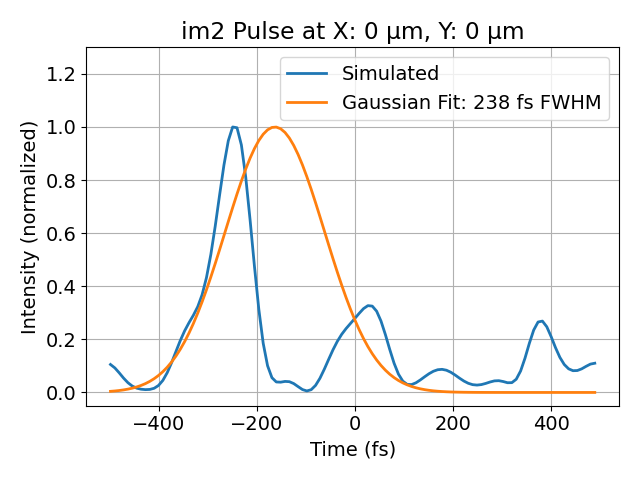

<IPython.core.display.Javascript object>


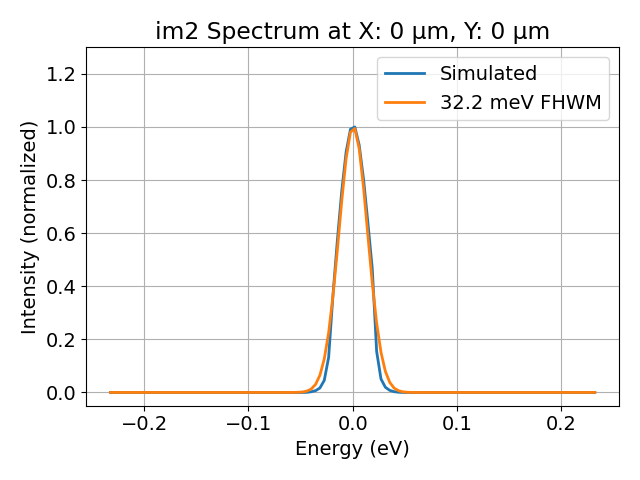

<IPython.core.display.Javascript object>


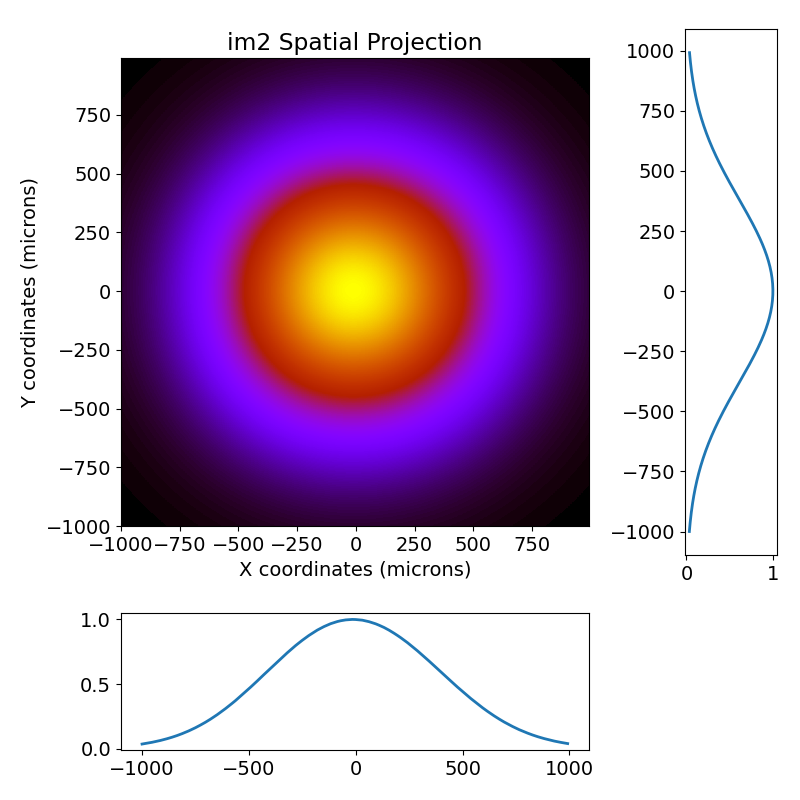

/Users/Matt/Python/lcls_beamline_toolbox/lcls_beamline_toolbox/xraybeamline2d/beam1d.py:1256: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(6, 6))


<IPython.core.display.Javascript object>


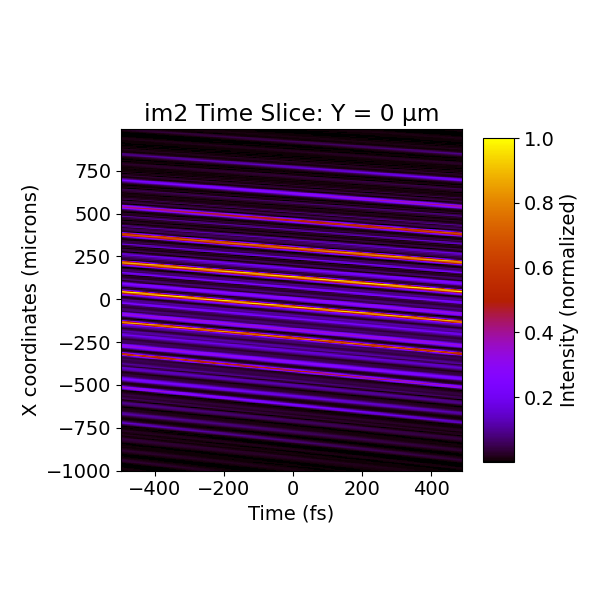

128


/Users/Matt/Python/lcls_beamline_toolbox/lcls_beamline_toolbox/xraybeamline2d/beam1d.py:1164: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(6,6))


<IPython.core.display.Javascript object>


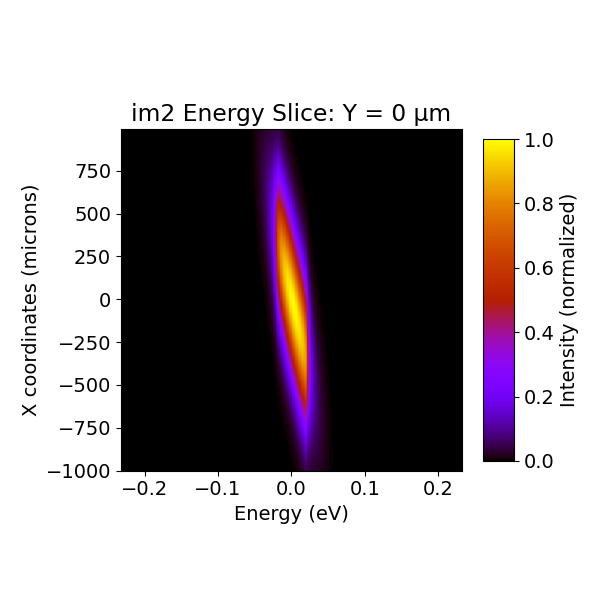

<IPython.core.display.Javascript object>


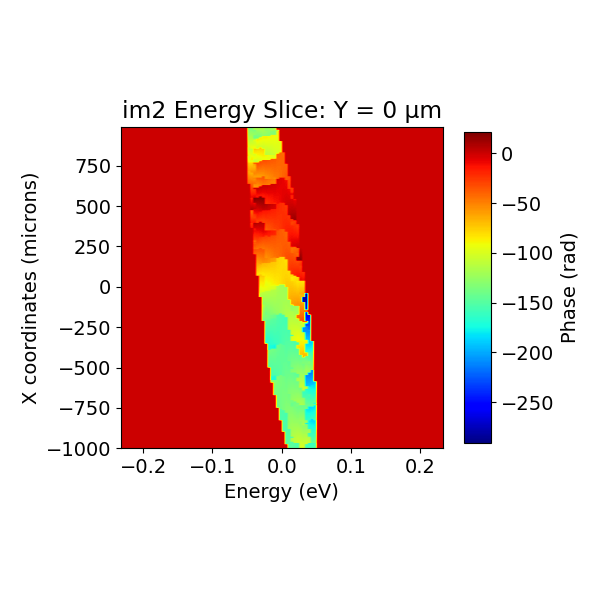

In [31]:
# plot output pulse at beam center
pulse.plot_pulse('im2', shift=200)
plt.savefig(fig_path+'option2_output_pulse_no_slit.png')
# plot output spectraum at beam center
pulse.plot_spectrum('im2')
plt.savefig(fig_path+'option2_output_spectrum_no_slit.png')
# show spatial projection of output
pulse.imshow_projection('im2')
plt.savefig(fig_path+'option2_output_spatial_no_slit.png')
# show time slice of output
pulse.imshow_time_slice('im2', shift=200)
plt.savefig(fig_path+'option2_output_time_no_slit.png')
# show energy slice of output
pulse.imshow_energy_slice('im2')
plt.savefig(fig_path+'option2_output_energy_no_slit.png')
# show spectral phase slice of output
pulse.imshow_energy_slice('im2', image_type='phase')

In [3]:
def define_devices(f1, f2):
    # crystal asymmetry angle
    alphaAsym = 19.88*np.pi/180

    # distance between crystal 2 and 1st CRL, 2nd CRL and crystal 4 
#     f1 = 2.884
    # distance between CRLs and focus
#     f2 = 3

    # crystal reflection hkl index
    hkl = [3,1,1]

    # initialize the beam
    b1 = beam.Beam(beam_params=beam_params)

    # viewing point upstream of monochromator
    im0 = optics.PPM('im0', z=870, FOV=2e-3, N=256)
    crl0 = optics.CRL('crl0', z=830, roc=1700e-6, diameter=2e-3)

    # first crystal: symmetric reflection
    crystal1 = optics.Crystal('c1', hkl=hkl, length=10e-2, width=20e-3, z=880, E0=E0,
                              alphaAsym=0, orientation=0, pol='s')

    # second crystal: asymmetric reflection, orientation flipped relative to crystal1
    crystal2 = optics.Crystal('c2', hkl=hkl, length=10e-2, width=20e-3, z=crystal1.z+.2, E0=E0,alphaAsym=alphaAsym, 
                              orientation=2,pol='s')
    # printing crystal incidence and reflection angles for confirmation
    print('crystal 2 incidence angle: {:.2f} degrees'.format(crystal2.alpha*180/np.pi))
    print('crystal 2 exit angle: {:.2f} degrees'.format(crystal2.beta0*180/np.pi))

    im_upstream = optics.PPM('im_upstream', z=crystal2.z + f1 - .1, FOV=2e-3, N=256)

    # CRL with ~1 meter focal length (modeled as single element for now)
    crl1 = optics.CRL('crl1', z=crystal2.z+f1, roc=25.25e-6, diameter=5e-3)

    # viewing point downstream of first crl
    im1 = optics.PPM('im1', z=crl1.z+.1,N=256,FOV=2e-3)

    # viewing point at focus
    focus = optics.PPM('focus', z=crl1.z+f2+.03, FOV=100e-6, N=256)

    # slit at focus
    slit = optics.Slit('slit', z=crl1.z+f2 + 1e-3+.03, x_width=4e-6, y_width=2e-3)

    # second CRL with ~1 meter focal length, for collimation
    crl2 = optics.CRL('crl2', z=crl1.z+2*f2, roc=25.25e-6, diameter=5e-3)

    # third crystal, symmetric reflection, same orientation as crystal2
    crystal3 = optics.Crystal('c3', hkl=hkl, length=10e-2, width=10e-3, z=crl2.z+2, E0=E0,alphaAsym=0, orientation=2,
                             asym_type='emergence',pol='s')

    # fourth crystal, asymmetric reflection, same orientation as crystal1
    crystal4 = optics.Crystal('c4', hkl=hkl, length=10e-2, width=10e-3, z=crl2.z+2 + (f1-2)*np.cos(crystal1.beta0*2), E0=E0,alphaAsym=-alphaAsym, 
                              asym_type='emergence', orientation=0,pol='s')

    # viewing point just downstream of monochromator
    im2 = optics.PPM('im2', z=crystal4.z+.1, FOV=2e-3, N=256)

    # list of devices to propagate through
    devices = [crl0,im0,crystal1,crystal2,im_upstream, im1, crl1, focus, crl2, crystal3, crystal4, im2]
    
    return devices

In [ ]:
f1 = np.linspace(2.88, 2.89, 20)

duration = np.zeros(20)

for i, f in enumerate(f1):
    
    devices = define_devices(f, 3)
    # initialize beamline
    mono_beamline = beamline.Beamline(devices)
    # reset central photon energy
    beam_params['photonEnergy'] = 9000

    # initialize pulse. tau sets transform-limited pulse duration in fs (FWHM). Time window is in fs.
    pulse = beam.Pulse(beam_params=beam_params, tau=20, time_window=1000)

    print('Number of spectral components: {:d}'.format(pulse.N))
    pulse.propagate(beamline=mono_beamline, screen_names=['im2'])
    duration[i] = pulse.pulse_duration('im2')

FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131251107855566
5.131251107855566
x is focused
y is focused
b 1.00
b 8.07
crystal 2 incidence angle: 44.76 degrees
crystal 2 exit angle: 5.01 degrees
b 1.00
b 0.12
after c1: 0.87
after c2: -0.00
after c3: -0.87
after c4: -0.00
Number of spectral components: 112
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.1311185554481415
5.1311185554481415
x is focused
y is focused
FWHM in x: 690.1350652490167 microns
FWHM in y: 690.1350652490167 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.1311185554481415
5.1311185554481415
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19843.081075
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 725729386764.34 microns
zRy: 73725289.55 microns
remaining distance: 40000000.00 microns
goal for 

zx: -2.930349
zy: 253.289564
azimuth -0.16 mrad
im1
zx: -2.930349
zy: 253.289564
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11368398578.20 microns
zRy: 73725358.09 microns
remaining distance: 2930000.04 microns
goal for zx: -348.50 microns
current zx: -2930348.53 microns
goal for zy: 256219563.84 microns
current zy: 253289563.81 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000348
zy: 256.219564
azimuth -0.16 mrad
focus
zx: -0.000348
zy: 256.219564
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11368398578.20 microns
zRy: 73725358.09 microns
remaining distance: 2970000.04 microns
goal for zx: 2969651.54 microns
current zx: -348.50 microns
goal for zy: 259189563.88 microns
current zy: 256219563.84 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969652
zy: 259.189564
azimuth -0.16 mrad
crl2
zRx: 1.06e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 285.737018
zy: 259.189564
azimuth -0.24 mrad
d

FWHM in x: 690.133781174872 microns
FWHM in y: 690.133781174872 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131128108774802
5.131128108774802
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19836.275039
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 725232980526.72 microns
zRy: 73725426.63 microns
remaining distance: 40000000.00 microns
goal for zx: 19876275038.57 microns
current zx: 19836275038.57 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19876.275039
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19876.275039
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 725232980526.72 microns
zRy: 73725426.63 microns
remaining distance: 10000000.00 microns
goal for zx: 19886275038.57 microns
current zx: 19876275038.57 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x re

zx: -2.930363
zy: 253.289564
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11362615300.19 microns
zRy: 73725460.90 microns
remaining distance: 2930000.04 microns
goal for zx: -362.54 microns
current zx: -2930362.58 microns
goal for zy: 256219563.85 microns
current zy: 253289563.81 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000363
zy: 256.219564
azimuth -0.16 mrad
focus
zx: -0.000363
zy: 256.219564
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11362615300.19 microns
zRy: 73725460.90 microns
remaining distance: 2970000.04 microns
goal for zx: 2969637.49 microns
current zx: -362.54 microns
goal for zy: 259189563.88 microns
current zy: 256219563.85 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969637
zy: 259.189564
azimuth -0.16 mrad
crl2
zRx: 1.06e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 285.535838
zy: 259.189564
azimuth -0.24 mrad
drift9
delta z: 3.69
zRx: 9759459442.94 microns
zRy: 

zx: -0.000372
zy: 256.219564
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11358762183.86 microns
zRy: 73725529.44 microns
remaining distance: 2970000.04 microns
goal for zx: 2969628.13 microns
current zx: -371.91 microns
goal for zy: 259189563.88 microns
current zy: 256219563.85 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969628
zy: 259.189564
azimuth -0.16 mrad
crl2
zRx: 1.06e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 285.401877
zy: 259.189564
azimuth -0.23 mrad
drift9
delta z: 3.69
zRx: 9749625997.01 microns
zRy: 73725529.44 microns
remaining distance: 1999820.95 microns
goal for zx: 287401697.66 microns
current zx: 285401876.71 microns
goal for zy: 261189384.83 microns
current zy: 259189563.88 microns
current step size: 1999820.95 microns
x becomes focused
y stays unfocused
zx: 287.401698
zy: 261.189385
azimuth -0.23 mrad
c3
Calculated distance to focus: -287.401698
zRx: 9.75e+03
zRy: 7.37e+01
zx: 287.447957
zy: 261.18938

zx: 307.892791
zy: 253.089564
azimuth -0.09 mrad
drift5
delta z: 0.00
zRx: 47282863734655.24 microns
zRy: 73725632.26 microns
remaining distance: 100000.00 microns
goal for zx: 307992791.40 microns
current zx: 307892791.40 microns
goal for zy: 253189563.81 microns
current zy: 253089563.81 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.992791
zy: 253.189564
azimuth -0.09 mrad
crl1
zRx: 1.14e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030386
zy: 253.189564
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11352986100.02 microns
zRy: 73725632.26 microns
remaining distance: 100000.00 microns
goal for zx: -2930385.99 microns
current zx: -3030385.99 microns
goal for zy: 253289563.81 microns
current zy: 253189563.81 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930386
zy: 253.289564
azimuth -0.16 mrad
im1
zx: -2.930386
zy: 253.289564
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11352986100.02 microns
zRy: 73725632.

Calculated distance to focus: -18797.445315
zRx: 1.50e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18826.780330
zy: 262.069545
azimuth -0.12 mrad
drift11
delta z: -2.96
zRx: 640025463979.53 microns
zRy: 73725666.53 microns
remaining distance: 100131.86 microns
goal for zx: 18826880461.69 microns
current zx: 18826780329.84 microns
goal for zy: 262169677.34 microns
current zy: 262069545.49 microns
current step size: 100131.86 microns
x becomes focused
y stays unfocused
zx: 18826.880462
zy: 262.169677
azimuth -0.12 mrad
im2
zx: 18826.880462
zy: 262.169677
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.1311472154281255
5.1311472154281255
x is focused
y is focused
FWHM in x: 690.1312130409315 microns
FWHM in y: 690.1312130409315 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.1311472154281255
5.1311472154281255
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04

zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030405
zy: 253.189564
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11345291366.02 microns
zRy: 73725769.34 microns
remaining distance: 100000.00 microns
goal for zx: -2930404.71 microns
current zx: -3030404.71 microns
goal for zy: 253289563.81 microns
current zy: 253189563.81 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930405
zy: 253.289564
azimuth -0.16 mrad
im1
zx: -2.930405
zy: 253.289564
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11345291366.02 microns
zRy: 73725769.34 microns
remaining distance: 2930000.04 microns
goal for zx: -404.68 microns
current zx: -2930404.71 microns
goal for zy: 256219563.85 microns
current zy: 253289563.81 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000405
zy: 256.219564
azimuth -0.16 mrad
focus
zx: -0.000405
zy: 256.219564
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11345291366.02 microns
zRy: 73725769.34 micro

zx: 307.747607
zy: 253.089564
azimuth -0.10 mrad
drift5
delta z: 0.00
zRx: 47214833638909.05 microns
zRy: 73725872.16 microns
remaining distance: 100000.00 microns
goal for zx: 307847607.45 microns
current zx: 307747607.45 microns
goal for zy: 253189563.81 microns
current zy: 253089563.81 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.847607
zy: 253.189564
azimuth -0.10 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030419
zy: 253.189564
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11339525335.63 microns
zRy: 73725872.16 microns
remaining distance: 100000.00 microns
goal for zx: -2930418.76 microns
current zx: -3030418.76 microns
goal for zy: 253289563.81 microns
current zy: 253189563.81 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930419
zy: 253.289564
azimuth -0.16 mrad
im1
zx: -2.930419
zy: 253.289564
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11339525335.63 microns
zRy: 73725872.

zx: -0.000428
zy: 256.219564
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11335683701.63 microns
zRy: 73725940.70 microns
remaining distance: 2970000.04 microns
goal for zx: 2969571.95 microns
current zx: -428.08 microns
goal for zy: 259189563.89 microns
current zy: 256219563.85 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969572
zy: 259.189564
azimuth -0.16 mrad
crl2
zRx: 1.06e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 284.600753
zy: 259.189564
azimuth -0.22 mrad
drift9
delta z: 3.69
zRx: 9690924404.80 microns
zRy: 73725940.70 microns
remaining distance: 1999865.27 microns
goal for zx: 286600617.83 microns
current zx: 284600752.56 microns
goal for zy: 261189429.16 microns
current zy: 259189563.89 microns
current step size: 1999865.27 microns
x becomes focused
y stays unfocused
zx: 286.600618
zy: 261.189429
azimuth -0.22 mrad
c3
Calculated distance to focus: -286.600618
zRx: 9.69e+03
zRy: 7.37e+01
zx: 286.635329
zy: 261.18942

zRx: 7.24e+05
zRy: 7.37e+01
zx: 19857.401394
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 723857808361.18 microns
zRy: 73726009.24 microns
remaining distance: 309563.80 microns
goal for zx: 19857710957.61 microns
current zx: 19857401393.81 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19857.710958
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -305.068195
zRx: 4.72e+07
zRy: 7.37e+01
zx: 304.884717
zy: 250.309564
azimuth -0.11 mrad
drift4
delta z: 0.00
zRx: 47176019777644.23 microns
zRy: 73726009.24 microns
remaining distance: 2780000.02 microns
goal for zx: 307664717.08 microns
current zx: 304884717.06 microns
goal for zy: 253089563.81 microns
current zy: 250309563.80 microns
current step size: 2780000.02 microns
x remains focused
y stays unfocused
zx: 307.664717
zy: 253.089564
azimuth -0.11 mrad
im_upstream
zx: 307.664717
zy: 253.089564
azimuth

zx: 18765.971776
zy: 262.169692
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131175875408108
5.131175875408108
x is focused
y is focused
FWHM in x: 690.1273608758934 microns
FWHM in y: 690.1273608758934 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131175875408108
5.131175875408108
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19802.314768
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 722758586376.52 microns
zRy: 73726112.05 microns
remaining distance: 40000000.00 microns
goal for zx: 19842314768.24 microns
current zx: 19802314768.24 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19842.314768
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19842.314768
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 722758586376.52 mic

zx: -2.930456
zy: 253.289564
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11324170260.32 microns
zRy: 73726146.32 microns
remaining distance: 2930000.04 microns
goal for zx: -456.17 microns
current zx: -2930456.21 microns
goal for zy: 256219563.85 microns
current zy: 253289563.82 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000456
zy: 256.219564
azimuth -0.16 mrad
focus
zx: -0.000456
zy: 256.219564
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11324170260.32 microns
zRy: 73726146.32 microns
remaining distance: 2970000.04 microns
goal for zx: 2969543.87 microns
current zx: -456.17 microns
goal for zy: 259189563.89 microns
current zy: 256219563.85 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969544
zy: 259.189564
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 284.201883
zy: 259.189564
azimuth -0.21 mrad
drift9
delta z: 3.69
zRx: 9661764659.04 microns
zRy: 

zRx: 7.23e+05
zRy: 7.37e+01
zx: 19847.230755
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 723117021164.86 microns
zRy: 73726214.87 microns
remaining distance: 309563.80 microns
goal for zx: 19847540318.58 microns
current zx: 19847230754.79 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19847.540319
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -304.911946
zRx: 4.71e+07
zRy: 7.37e+01
zx: 304.760479
zy: 250.309564
azimuth -0.12 mrad
drift4
delta z: 0.00
zRx: 47117881306874.46 microns
zRy: 73726214.87 microns
remaining distance: 2780000.02 microns
goal for zx: 307540479.52 microns
current zx: 304760479.50 microns
goal for zy: 253089563.82 microns
current zy: 250309563.80 microns
current step size: 2780000.02 microns
x remains focused
y stays unfocused
zx: 307.540480
zy: 253.089564
azimuth -0.12 mrad
im_upstream
zx: 307.540480
zy: 253.089564
azimuth

delta z: 0.00
zRx: 722870345332.11 microns
zRy: 73726283.41 microns
remaining distance: 309563.80 microns
goal for zx: 19844152427.02 microns
current zx: 19843842863.22 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19844.152427
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -304.859899
zRx: 4.71e+07
zRy: 7.37e+01
zx: 304.719093
zy: 250.309564
azimuth -0.12 mrad
drift4
delta z: 0.00
zRx: 47098523738942.05 microns
zRy: 73726283.41 microns
remaining distance: 2780000.02 microns
goal for zx: 307499093.09 microns
current zx: 304719093.07 microns
goal for zy: 253089563.82 microns
current zy: 250309563.80 microns
current step size: 2780000.02 microns
x remains focused
y stays unfocused
zx: 307.499093
zy: 253.089564
azimuth -0.12 mrad
im_upstream
zx: 307.499093
zy: 253.089564
azimuth -0.12 mrad
drift5
delta z: 0.00
zRx: 47098523738942.05 microns
zRy: 73726283.41 micron

zx: 285.870255
zy: 261.189470
azimuth -0.20 mrad
c3
Calculated distance to focus: -285.870255
zRx: 9.64e+03
zRy: 7.37e+01
zx: 285.894439
zy: 261.189470
azimuth -868.49 mrad
drift10
delta z: 0.46
zRx: 9637561453.39 microns
zRy: 73726317.68 microns
remaining distance: 880154.69 microns
goal for zx: 286774594.14 microns
current zx: 285894439.44 microns
goal for zy: 262069624.48 microns
current zy: 261189469.78 microns
current step size: 880154.69 microns
x remains focused
y stays unfocused
zx: 286.774594
zy: 262.069624
azimuth -868.49 mrad
c4
Calculated distance to focus: -18713.779104
zRx: 1.48e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18730.503075
zy: 262.069624
azimuth -0.12 mrad
drift11
delta z: -2.96
zRx: 633460219058.80 microns
zRy: 73726317.68 microns
remaining distance: 100075.55 microns
goal for zx: 18730603150.53 microns
current zx: 18730503074.98 microns
goal for zy: 262169700.03 microns
current zy: 262069624.48 microns
current step size: 100075.55 microns
x becomes focused
y s

zRx: 1.48e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18720.419503
zy: 262.069633
azimuth -0.12 mrad
drift11
delta z: -2.96
zRx: 632774570731.70 microns
zRy: 73726386.22 microns
remaining distance: 100069.62 microns
goal for zx: 18720519572.44 microns
current zx: 18720419502.82 microns
goal for zy: 262169702.41 microns
current zy: 262069632.79 microns
current step size: 100069.62 microns
x becomes focused
y stays unfocused
zx: 18720.519572
zy: 262.169702
azimuth -0.12 mrad
im2
zx: 18720.519572
zy: 262.169702
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131197370393097
5.131197370393097
x is focused
y is focused
FWHM in x: 690.1244717803636 microns
FWHM in y: 690.1244717803636 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131197370393097
5.131197370393097
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19787.070554
zy: 200.000000
azimuth 0.00 mr

zx: 18710.445633
zy: 262.169705
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131202147056427
5.131202147056427
x is focused
y is focused
FWHM in x: 690.123829762423 microns
FWHM in y: 690.123829762423 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131202147056427
5.131202147056427
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19783.686138
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 721403073441.81 microns
zRy: 73726489.03 microns
remaining distance: 40000000.00 microns
goal for zx: 19823686138.09 microns
current zx: 19783686138.09 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19823.686138
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19823.686138
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 721403073441.81 micro

zRx: 9.61e+03
zRy: 7.37e+01
zx: 285.491928
zy: 261.189492
azimuth -868.50 mrad
drift10
delta z: 0.46
zRx: 9608632885.39 microns
zRy: 73726523.31 microns
remaining distance: 880157.48 microns
goal for zx: 286372085.48 microns
current zx: 285491928.00 microns
goal for zy: 262069649.42 microns
current zy: 261189491.94 microns
current step size: 880157.48 microns
x remains focused
y stays unfocused
zx: 286.372085
zy: 262.069649
azimuth -868.50 mrad
c4
Calculated distance to focus: -18687.512976
zRx: 1.48e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18700.281258
zy: 262.069649
azimuth -0.12 mrad
drift11
delta z: -2.96
zRx: 631406351846.02 microns
zRy: 73726523.31 microns
remaining distance: 100057.77 microns
goal for zx: 18700381315.64 microns
current zx: 18700281257.87 microns
goal for zy: 262169707.19 microns
current zy: 262069649.42 microns
current step size: 100057.77 microns
x becomes focused
y stays unfocused
zx: 18700.381316
zy: 262.169707
azimuth -0.12 mrad
im2
zx: 18700.381316
zy: 262

zx: -2.930517
zy: 253.289564
azimuth -0.16 mrad
im1
zx: -2.930517
zy: 253.289564
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11299283271.58 microns
zRy: 73726591.85 microns
remaining distance: 2930000.04 microns
goal for zx: -517.02 microns
current zx: -2930517.06 microns
goal for zy: 256219563.86 microns
current zy: 253289563.82 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000517
zy: 256.219564
azimuth -0.16 mrad
focus
zx: -0.000517
zy: 256.219564
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11299283271.58 microns
zRy: 73726591.85 microns
remaining distance: 2970000.04 microns
goal for zx: 2969483.01 microns
current zx: -517.02 microns
goal for zy: 259189563.90 microns
current zy: 256219563.86 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969483
zy: 259.189564
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 283.341509
zy: 259.189564
azimuth -0.19 mrad
d

zx: 19815.230160
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19815.230160
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 720788193766.17 microns
zRy: 73726660.39 microns
remaining distance: 10000000.00 microns
goal for zx: 19825230160.43 microns
current zx: 19815230160.43 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19825.230160
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19825.230160
zRx: 7.22e+05
zRy: 7.37e+01
zx: 19825.230162
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 721515886621.87 microns
zRy: 73726660.39 microns
remaining distance: 309563.80 microns
goal for zx: 19825539725.42 microns
current zx: 19825230161.63 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19825.539725
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated d

zRx: 9.58e+03
zRy: 7.37e+01
zx: 285.157365
zy: 261.189510
azimuth -868.51 mrad
drift10
delta z: 0.46
zRx: 9584621322.12 microns
zRy: 73726694.66 microns
remaining distance: 880159.80 microns
goal for zx: 286037525.17 microns
current zx: 285157365.37 microns
goal for zy: 262069670.20 microns
current zy: 261189510.40 microns
current step size: 880159.80 microns
x remains focused
y stays unfocused
zx: 286.037525
zy: 262.069670
azimuth -868.51 mrad
c4
Calculated distance to focus: -18665.680890
zRx: 1.48e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18675.162496
zy: 262.069670
azimuth -0.12 mrad
drift11
delta z: -2.96
zRx: 629701828459.65 microns
zRy: 73726694.66 microns
remaining distance: 100042.96 microns
goal for zx: 18675262539.00 microns
current zx: 18675162496.04 microns
goal for zy: 262169713.16 microns
current zy: 262069670.20 microns
current step size: 100042.96 microns
x becomes focused
y stays unfocused
zx: 18675.262539
zy: 262.169713
azimuth -0.12 mrad
im2
zx: 18675.262539
zy: 262

zRx: 11289732721.68 microns
zRy: 73726763.20 microns
remaining distance: 2970000.04 microns
goal for zx: 2969459.61 microns
current zx: -540.43 microns
goal for zy: 259189563.90 microns
current zy: 256219563.87 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969460
zy: 259.189564
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 283.011988
zy: 259.189564
azimuth -0.18 mrad
drift9
delta z: 3.69
zRx: 9575040928.17 microns
zRy: 73726763.20 microns
remaining distance: 1999953.88 microns
goal for zx: 285011942.29 microns
current zx: 283011988.41 microns
goal for zy: 261189517.79 microns
current zy: 259189563.90 microns
current step size: 1999953.88 microns
x becomes focused
y stays unfocused
zx: 285.011942
zy: 261.189518
azimuth -0.18 mrad
c3
Calculated distance to focus: -285.011942
zRx: 9.58e+03
zRy: 7.37e+01
zx: 285.023760
zy: 261.189518
azimuth -868.51 mrad
drift10
delta z: 0.46
zRx: 9575040928.17 micro

/Users/Matt/beamline/venv/lib/python3.7/site-packages/scipy/optimize/minpack.py:808: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


zx: 285.770440
zy: 262.069687
azimuth -868.52 mrad
c4
Calculated distance to focus: -18648.251978
zRx: 1.47e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18655.110594
zy: 262.069687
azimuth -0.12 mrad
drift11
delta z: -2.96
zRx: 628342790893.08 microns
zRy: 73726831.74 microns
remaining distance: 100031.11 microns
goal for zx: 18655210624.64 microns
current zx: 18655110593.54 microns
goal for zy: 262169717.94 microns
current zy: 262069686.83 microns
current step size: 100031.11 microns
x becomes focused
y stays unfocused
zx: 18655.210625
zy: 262.169718
azimuth -0.12 mrad
im2
zx: 18655.210625
zy: 262.169718
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131228418704746
5.131228418704746
x is focused
y is focused
FWHM in x: 690.1202986851229 microns
FWHM in y: 690.1202986851229 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131228418704746
5.131228418704746
crl

zRx: 9.55e+03
zRy: 7.37e+01
zx: 284.690291
zy: 261.189536
azimuth -868.52 mrad
drift10
delta z: 0.46
zRx: 9551150279.68 microns
zRy: 73726934.56 microns
remaining distance: 880163.05 microns
goal for zx: 285570454.15 microns
current zx: 284690291.10 microns
goal for zy: 262069699.30 microns
current zy: 261189536.25 microns
current step size: 880163.05 microns
x remains focused
y stays unfocused
zx: 285.570454
zy: 262.069699
azimuth -868.52 mrad
c4
Calculated distance to focus: -18635.201677
zRx: 1.47e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18640.096745
zy: 262.069699
azimuth -0.12 mrad
drift11
delta z: -2.96
zRx: 627326174984.43 microns
zRy: 73726934.56 microns
remaining distance: 100022.22 microns
goal for zx: 18640196767.64 microns
current zx: 18640096745.42 microns
goal for zy: 262169721.52 microns
current zy: 262069699.30 microns
current step size: 100022.22 microns
x becomes focused
y stays unfocused
zx: 18640.196768
zy: 262.169722
azimuth -0.12 mrad
im2
zx: 18640.196768
zy: 262

Calculated distance to focus: -18626.511631
zRx: 1.47e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18630.099423
zy: 262.069708
azimuth -0.12 mrad
drift11
delta z: -2.96
zRx: 626649694595.99 microns
zRy: 73727003.10 microns
remaining distance: 100016.29 microns
goal for zx: 18630199438.97 microns
current zx: 18630099422.68 microns
goal for zy: 262169723.90 microns
current zy: 262069707.61 microns
current step size: 100016.29 microns
x becomes focused
y stays unfocused
zx: 18630.199439
zy: 262.169724
azimuth -0.12 mrad
im2
zx: 18630.199439
zy: 262.169724
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131240360363073
5.131240360363073
x is focused
y is focused
FWHM in x: 690.1186936619434 microns
FWHM in y: 690.1186936619434 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131240360363073
5.131240360363073
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx:

Calculated distance to focus: -19803.278411
zRx: 7.20e+05
zRy: 7.37e+01
zx: 19803.278410
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 719920075472.80 microns
zRy: 73727105.91 microns
remaining distance: 309563.80 microns
goal for zx: 19803587973.70 microns
current zx: 19803278409.90 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19803.587974
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -304.236719
zRx: 4.69e+07
zRy: 7.37e+01
zx: 304.223471
zy: 250.309564
azimuth -0.16 mrad
drift4
delta z: 0.00
zRx: 46867084390528.91 microns
zRy: 73727105.91 microns
remaining distance: 2780000.03 microns
goal for zx: 307003471.10 microns
current zx: 304223471.07 microns
goal for zy: 253089563.83 microns
current zy: 250309563.80 microns
current step size: 2780000.03 microns
x remains focused
y stays unfocused
zx: 307.003471
zy: 253.089564
azimuth -0.16 mrad
im_up

Calculated distance to focus: -19798.219541
zRx: 7.20e+05
zRy: 7.37e+01
zx: 19798.219542
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 719552564853.18 microns
zRy: 73727208.73 microns
remaining distance: 309563.80 microns
goal for zx: 19798529105.79 microns
current zx: 19798219541.99 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19798.529106
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -304.159001
zRx: 4.68e+07
zRy: 7.37e+01
zx: 304.161650
zy: 250.309564
azimuth -0.16 mrad
drift4
delta z: 0.00
zRx: 46838264627859.68 microns
zRy: 73727208.73 microns
remaining distance: 2780000.04 microns
goal for zx: 306941649.79 microns
current zx: 304161649.75 microns
goal for zy: 253089563.83 microns
current zy: 250309563.80 microns
current step size: 2780000.04 microns
x remains focused
y stays unfocused
zx: 306.941650
zy: 253.089564
azimuth -0.16 mrad
im_up

Calculated distance to focus: -19793.163263
zRx: 7.19e+05
zRy: 7.37e+01
zx: 19793.163263
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 719185336182.47 microns
zRy: 73727311.54 microns
remaining distance: 309563.80 microns
goal for zx: 19793472827.03 microns
current zx: 19793163263.23 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19793.472827
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -304.081323
zRx: 4.68e+07
zRy: 7.37e+01
zx: 304.099858
zy: 250.309564
azimuth -0.17 mrad
drift4
delta z: 0.00
zRx: 46809469247764.99 microns
zRy: 73727311.54 microns
remaining distance: 2780000.04 microns
goal for zx: 306879857.61 microns
current zx: 304099857.57 microns
goal for zy: 253089563.84 microns
current zy: 250309563.80 microns
current step size: 2780000.04 microns
x remains focused
y stays unfocused
zx: 306.879858
zy: 253.089564
azimuth -0.17 mrad
im_up

zx: -2.930625
zy: 253.289564
azimuth -0.16 mrad
im1
zx: -2.930625
zy: 253.289564
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11255448643.66 microns
zRy: 73727380.08 microns
remaining distance: 2930000.04 microns
goal for zx: -624.67 microns
current zx: -2930624.71 microns
goal for zy: 256219563.88 microns
current zy: 253289563.84 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000625
zy: 256.219564
azimuth -0.16 mrad
focus
zx: -0.000625
zy: 256.219564
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11255448643.66 microns
zRy: 73727380.08 microns
remaining distance: 2970000.04 microns
goal for zx: 2969375.37 microns
current zx: -624.67 microns
goal for zy: 259189563.92 microns
current zy: 256219563.88 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969375
zy: 259.189564
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 281.832065
zy: 259.189564
azimuth -0.15 mrad
d

zx: 306.897513
zy: 253.189564
azimuth -0.17 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030634
zy: 253.189564
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11251648734.25 microns
zRy: 73727448.62 microns
remaining distance: 100000.00 microns
goal for zx: -2930634.07 microns
current zx: -3030634.07 microns
goal for zy: 253289563.84 microns
current zy: 253189563.84 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930634
zy: 253.289564
azimuth -0.16 mrad
im1
zx: -2.930634
zy: 253.289564
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11251648734.25 microns
zRy: 73727448.62 microns
remaining distance: 2930000.04 microns
goal for zx: -634.03 microns
current zx: -2930634.07 microns
goal for zy: 256219563.88 microns
current zy: 253289563.84 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000634
zy: 256.219564
azimuth -0.16 mrad
focus
zx: -0.000634
zy: 256.219564
azimuth -0.16 mrad
drift8
delta z: 0

zx: 306.835789
zy: 253.189564
azimuth -0.18 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030648
zy: 253.189564
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11245952396.73 microns
zRy: 73727551.44 microns
remaining distance: 100000.00 microns
goal for zx: -2930648.11 microns
current zx: -3030648.11 microns
goal for zy: 253289563.84 microns
current zy: 253189563.84 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930648
zy: 253.289564
azimuth -0.16 mrad
im1
zx: -2.930648
zy: 253.289564
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11245952396.73 microns
zRy: 73727551.44 microns
remaining distance: 2930000.04 microns
goal for zx: -648.07 microns
current zx: -2930648.11 microns
goal for zy: 256219563.88 microns
current zy: 253289563.84 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000648
zy: 256.219564
azimuth -0.16 mrad
focus
zx: -0.000648
zy: 256.219564
azimuth -0.16 mrad
drift8
delta z: 0

zx: 19776.327684
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19776.327684
zRx: 7.18e+05
zRy: 7.37e+01
zx: 19776.327682
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 717963273209.96 microns
zRy: 73727654.25 microns
remaining distance: 309563.80 microns
goal for zx: 19776637245.60 microns
current zx: 19776327681.81 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19776.637246
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -303.822683
zRx: 4.67e+07
zRy: 7.37e+01
zx: 303.894094
zy: 250.309564
azimuth -0.18 mrad
drift4
delta z: 0.00
zRx: 46713660438501.97 microns
zRy: 73727654.25 microns
remaining distance: 2780000.05 microns
goal for zx: 306674093.84 microns
current zx: 303894093.79 microns
goal for zy: 253089563.84 microns
current zy: 250309563.80 microns
current step size: 2780000.05 microns
x remains focused
y stays unfocused
z

zx: -0.000671
zy: 256.219564
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11236467904.72 microns
zRy: 73727722.79 microns
remaining distance: 2970000.04 microns
goal for zx: 2969328.57 microns
current zx: -671.47 microns
goal for zy: 259189563.92 microns
current zy: 256219563.89 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969329
zy: 259.189564
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 281.180815
zy: 259.189564
azimuth -0.14 mrad
drift9
delta z: 3.69
zRx: 9442353135.87 microns
zRy: 73727722.79 microns
remaining distance: 2000057.23 microns
goal for zx: 283180872.12 microns
current zx: 281180814.89 microns
goal for zy: 261189621.15 microns
current zy: 259189563.92 microns
current step size: 2000057.23 microns
x becomes focused
y stays unfocused
zx: 283.180872
zy: 261.189621
azimuth -0.14 mrad
c3
Calculated distance to focus: -283.180872
zRx: 9.44e+03
zRy: 7.37e+01
zx: 283.166319
zy: 261.18962

zx: 303.811879
zy: 250.309564
azimuth -0.19 mrad
drift4
delta z: 0.00
zRx: 46675412499951.84 microns
zRy: 73727791.33 microns
remaining distance: 2780000.05 microns
goal for zx: 306591878.74 microns
current zx: 303811878.69 microns
goal for zy: 253089563.85 microns
current zy: 250309563.80 microns
current step size: 2780000.05 microns
x remains focused
y stays unfocused
zx: 306.591879
zy: 253.089564
azimuth -0.19 mrad
im_upstream
zx: 306.591879
zy: 253.089564
azimuth -0.19 mrad
drift5
delta z: 0.00
zRx: 46675412499951.84 microns
zRy: 73727791.33 microns
remaining distance: 100000.00 microns
goal for zx: 306691878.75 microns
current zx: 306591878.74 microns
goal for zy: 253189563.85 microns
current zy: 253089563.85 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.691879
zy: 253.189564
azimuth -0.19 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030681
zy: 253.189564
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11232677392.95 micro

zRy: 7.37e+01
zx: 303.729715
zy: 250.309564
azimuth -0.19 mrad
drift4
delta z: 0.00
zRx: 46637207658168.54 microns
zRy: 73727928.42 microns
remaining distance: 2780000.05 microns
goal for zx: 306509715.26 microns
current zx: 303729715.21 microns
goal for zy: 253089563.85 microns
current zy: 250309563.80 microns
current step size: 2780000.05 microns
x remains focused
y stays unfocused
zx: 306.509715
zy: 253.089564
azimuth -0.19 mrad
im_upstream
zx: 306.509715
zy: 253.089564
azimuth -0.19 mrad
drift5
delta z: 0.00
zRx: 46637207658168.54 microns
zRy: 73727928.42 microns
remaining distance: 100000.00 microns
goal for zx: 306609715.26 microns
current zx: 306509715.26 microns
goal for zy: 253189563.85 microns
current zy: 253089563.85 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.609715
zy: 253.189564
azimuth -0.19 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030700
zy: 253.189564
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 112251

zRx: 4.66e+07
zRy: 7.37e+01
zx: 303.688653
zy: 250.309564
azimuth -0.20 mrad
drift4
delta z: 0.00
zRx: 46618121390924.98 microns
zRy: 73727996.96 microns
remaining distance: 2780000.05 microns
goal for zx: 306468652.90 microns
current zx: 303688652.85 microns
goal for zy: 253089563.85 microns
current zy: 250309563.80 microns
current step size: 2780000.05 microns
x remains focused
y stays unfocused
zx: 306.468653
zy: 253.089564
azimuth -0.20 mrad
im_upstream
zx: 306.468653
zy: 253.089564
azimuth -0.20 mrad
drift5
delta z: 0.00
zRx: 46618121390924.98 microns
zRy: 73727996.96 microns
remaining distance: 100000.00 microns
goal for zx: 306568652.90 microns
current zx: 306468652.90 microns
goal for zy: 253189563.85 microns
current zy: 253089563.85 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.568653
zy: 253.189564
azimuth -0.20 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030709
zy: 253.189564
azimuth -0.16 mrad
drift6
delta z: 0.

Calculated distance to focus: -303.461327
zRx: 4.66e+07
zRy: 7.37e+01
zx: 303.606567
zy: 250.309564
azimuth -0.20 mrad
drift4
delta z: 0.00
zRx: 46579981049418.08 microns
zRy: 73728134.04 microns
remaining distance: 2780000.06 microns
goal for zx: 306386566.58 microns
current zx: 303606566.53 microns
goal for zy: 253089563.85 microns
current zy: 250309563.80 microns
current step size: 2780000.06 microns
x remains focused
y stays unfocused
zx: 306.386567
zy: 253.089564
azimuth -0.20 mrad
im_upstream
zx: 306.386567
zy: 253.089564
azimuth -0.20 mrad
drift5
delta z: 0.00
zRx: 46579981049418.08 microns
zRy: 73728134.04 microns
remaining distance: 100000.00 microns
goal for zx: 306486566.59 microns
current zx: 306386566.58 microns
goal for zy: 253189563.86 microns
current zy: 253089563.85 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.486567
zy: 253.189564
azimuth -0.20 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030728
zy: 253.18

y stays unfocused
zx: 306.445543
zy: 253.189564
azimuth -0.21 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030737
zy: 253.189564
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11209973679.73 microns
zRy: 73728202.59 microns
remaining distance: 100000.00 microns
goal for zx: -2930737.02 microns
current zx: -3030737.02 microns
goal for zy: 253289563.86 microns
current zy: 253189563.86 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930737
zy: 253.289564
azimuth -0.16 mrad
im1
zx: -2.930737
zy: 253.289564
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11209973679.73 microns
zRy: 73728202.59 microns
remaining distance: 2930000.04 microns
goal for zx: -736.98 microns
current zx: -2930737.02 microns
goal for zy: 256219563.90 microns
current zy: 253289563.86 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000737
zy: 256.219564
azimuth -0.16 mrad
focus
zx: -0.000737
zy: 256.219564
azimuth -0.16 mrad

zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 280.145083
zy: 259.189564
azimuth -0.11 mrad
drift9
delta z: 3.69
zRx: 9367719191.04 microns
zRy: 73728271.13 microns
remaining distance: 2000116.26 microns
goal for zx: 282145198.99 microns
current zx: 280145082.72 microns
goal for zy: 261189680.20 microns
current zy: 259189563.94 microns
current step size: 2000116.26 microns
x becomes focused
y stays unfocused
zx: 282.145199
zy: 261.189680
azimuth -0.11 mrad
c3
Calculated distance to focus: -282.145199
zRx: 9.37e+03
zRy: 7.37e+01
zx: 282.115738
zy: 261.189680
azimuth -868.58 mrad
drift10
delta z: 0.46
zRx: 9367719191.04 microns
zRy: 73728271.13 microns
remaining distance: 880181.16 microns
goal for zx: 282995919.06 microns
current zx: 282115737.90 microns
goal for zy: 262069861.36 microns
current zy: 261189680.20 microns
current step size: 880181.16 microns
x remains focused
y stays unfocused
zx: 282.995919
zy: 262.069861
azimuth -868.58 mrad
c4
Calculated distanc

Calculated distance to focus: -19741.066261
zRx: 7.15e+05
zRy: 7.37e+01
zx: 19741.066261
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 715407080353.16 microns
zRy: 73728373.94 microns
remaining distance: 309563.80 microns
goal for zx: 19741375824.75 microns
current zx: 19741066260.95 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19741.375825
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -303.280972
zRx: 4.65e+07
zRy: 7.37e+01
zx: 303.463039
zy: 250.309564
azimuth -0.21 mrad
drift4
delta z: 0.00
zRx: 46513338753144.66 microns
zRy: 73728373.94 microns
remaining distance: 2780000.06 microns
goal for zx: 306243039.39 microns
current zx: 303463039.32 microns
goal for zy: 253089563.86 microns
current zy: 250309563.80 microns
current step size: 2780000.06 microns
x remains focused
y stays unfocused
zx: 306.243039
zy: 253.089564
azimuth -0.21 mrad
im_up

zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 279.822987
zy: 259.189564
azimuth -0.10 mrad
drift9
delta z: 3.69
zRx: 9344570508.36 microns
zRy: 73728442.48 microns
remaining distance: 2000134.71 microns
goal for zx: 281823121.95 microns
current zx: 279822987.24 microns
goal for zy: 261189698.65 microns
current zy: 259189563.94 microns
current step size: 2000134.71 microns
x becomes focused
y stays unfocused
zx: 281.823122
zy: 261.189699
azimuth -0.10 mrad
c3
Calculated distance to focus: -281.823122
zRx: 9.34e+03
zRy: 7.37e+01
zx: 281.789026
zy: 261.189699
azimuth -868.59 mrad
drift10
delta z: 0.46
zRx: 9344570508.36 microns
zRy: 73728442.48 microns
remaining distance: 880183.48 microns
goal for zx: 282669209.42 microns
current zx: 281789025.94 microns
goal for zy: 262069882.13 microns
current zy: 261189698.65 microns
current step size: 880183.48 microns
x remains focused
y stays unfocused
zx: 282.669209
zy: 262.069882
azimuth -868.59 mrad
c4
Calculated distanc

FWHM in x: 690.1045697801942 microns
FWHM in y: 690.1045697801942 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131345446956346
5.131345446956346
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19682.689257
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 714076179490.20 microns
zRy: 73728545.30 microns
remaining distance: 40000000.00 microns
goal for zx: 19722689257.10 microns
current zx: 19682689257.10 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19722.689257
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19722.689257
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 714076179490.20 microns
zRy: 73728545.30 microns
remaining distance: 10000000.00 microns
goal for zx: 19732689257.10 microns
current zx: 19722689257.10 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x 

zx: 281.501788
zy: 261.189717
azimuth -0.10 mrad
c3
Calculated distance to focus: -281.501788
zRx: 9.32e+03
zRy: 7.37e+01
zx: 281.463069
zy: 261.189717
azimuth -868.60 mrad
drift10
delta z: 0.46
zRx: 9321504207.73 microns
zRy: 73728613.84 microns
remaining distance: 880185.80 microns
goal for zx: 282343254.48 microns
current zx: 281463068.68 microns
goal for zy: 262069902.91 microns
current zy: 261189717.10 microns
current step size: 880185.80 microns
x remains focused
y stays unfocused
zx: 282.343254
zy: 262.069903
azimuth -868.60 mrad
c4
Calculated distance to focus: -18424.607353
zRx: 1.44e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18397.873355
zy: 262.069903
azimuth -0.12 mrad
drift11
delta z: -2.96
zRx: 611038689889.76 microns
zRy: 73728613.84 microns
remaining distance: 99877.11 microns
goal for zx: 18397973232.41 microns
current zx: 18397873355.30 microns
goal for zy: 262169780.01 microns
current zy: 262069902.91 microns
current step size: 99877.11 microns
x becomes focused
y sta

Calculated distance to focus: -19725.992784
zRx: 7.14e+05
zRy: 7.37e+01
zx: 19725.992783
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 714315755348.60 microns
zRy: 73728682.38 microns
remaining distance: 309563.80 microns
goal for zx: 19726302347.16 microns
current zx: 19725992783.36 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19726.302347
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -303.049403
zRx: 4.64e+07
zRy: 7.37e+01
zx: 303.278735
zy: 250.309564
azimuth -0.23 mrad
drift4
delta z: 0.00
zRx: 46427848490984.15 microns
zRy: 73728682.38 microns
remaining distance: 2780000.07 microns
goal for zx: 306058735.53 microns
current zx: 303278735.45 microns
goal for zy: 253089563.87 microns
current zy: 250309563.80 microns
current step size: 2780000.07 microns
x remains focused
y stays unfocused
zx: 306.058736
zy: 253.089564
azimuth -0.23 mrad
im_up

zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 279.309180
zy: 259.189564
azimuth -0.09 mrad
drift9
delta z: 3.69
zRx: 9307703810.39 microns
zRy: 73728716.65 microns
remaining distance: 2000164.22 microns
goal for zx: 281309344.02 microns
current zx: 279309179.80 microns
goal for zy: 261189728.17 microns
current zy: 259189563.95 microns
current step size: 2000164.22 microns
x becomes focused
y stays unfocused
zx: 281.309344
zy: 261.189728
azimuth -0.09 mrad
c3
Calculated distance to focus: -281.309344
zRx: 9.31e+03
zRy: 7.37e+01
zx: 281.267855
zy: 261.189728
azimuth -868.60 mrad
drift10
delta z: 0.46
zRx: 9307703810.39 microns
zRy: 73728716.65 microns
remaining distance: 880187.20 microns
goal for zx: 282148042.68 microns
current zx: 281267855.49 microns
goal for zy: 262069915.37 microns
current zy: 261189728.17 microns
current step size: 880187.20 microns
x remains focused
y stays unfocused
zx: 282.148043
zy: 262.069915
azimuth -868.60 mrad
c4
Calculated distanc

Calculated distance to focus: -19720.973418
zRx: 7.14e+05
zRy: 7.37e+01
zx: 19720.973418
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 713952536423.21 microns
zRy: 73728785.19 microns
remaining distance: 309563.80 microns
goal for zx: 19721282981.77 microns
current zx: 19720973417.97 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19721.282982
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -302.972291
zRx: 4.64e+07
zRy: 7.37e+01
zx: 303.217359
zy: 250.309564
azimuth -0.23 mrad
drift4
delta z: 0.00
zRx: 46399399798753.48 microns
zRy: 73728785.19 microns
remaining distance: 2780000.07 microns
goal for zx: 305997358.58 microns
current zx: 303217358.51 microns
goal for zy: 253089563.87 microns
current zy: 250309563.80 microns
current step size: 2780000.07 microns
x remains focused
y stays unfocused
zx: 305.997359
zy: 253.089564
azimuth -0.23 mrad
im_up

FWHM in x: 690.1013598877743 microns
FWHM in y: 690.1013598877743 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131369330272999
5.131369330272999
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19665.956613
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 712865908517.00 microns
zRy: 73728888.01 microns
remaining distance: 40000000.00 microns
goal for zx: 19705956612.96 microns
current zx: 19665956612.96 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19705.956613
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19705.956613
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 712865908517.00 microns
zRy: 73728888.01 microns
remaining distance: 10000000.00 microns
goal for zx: 19715956612.96 microns
current zx: 19705956612.96 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x 

zx: -2.930835
zy: 253.289564
azimuth -0.16 mrad
im1
zx: -2.930835
zy: 253.289564
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11170403848.27 microns
zRy: 73728922.28 microns
remaining distance: 2930000.04 microns
goal for zx: -835.24 microns
current zx: -2930835.28 microns
goal for zy: 256219563.92 microns
current zy: 253289563.88 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000835
zy: 256.219564
azimuth -0.16 mrad
focus
zx: -0.000835
zy: 256.219564
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11170403848.27 microns
zRy: 73728922.28 microns
remaining distance: 2970000.04 microns
goal for zx: 2969164.80 microns
current zx: -835.24 microns
goal for zy: 259189563.96 microns
current zy: 256219563.92 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969165
zy: 259.189564
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 278.925067
zy: 259.189564
azimuth -0.08 mrad
d

zx: -0.000845
zy: 256.219564
azimuth -0.16 mrad
focus
zx: -0.000845
zy: 256.219564
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11166645983.92 microns
zRy: 73728990.82 microns
remaining distance: 2970000.04 microns
goal for zx: 2969155.44 microns
current zx: -844.60 microns
goal for zy: 259189563.96 microns
current zy: 256219563.92 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969155
zy: 259.189564
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 278.797265
zy: 259.189564
azimuth -0.08 mrad
drift9
delta z: 3.69
zRx: 9271046438.27 microns
zRy: 73728990.82 microns
remaining distance: 2000193.73 microns
goal for zx: 280797458.86 microns
current zx: 278797265.14 microns
goal for zy: 261189757.69 microns
current zy: 259189563.96 microns
current step size: 2000193.73 microns
x becomes focused
y stays unfocused
zx: 280.797459
zy: 261.189758
azimuth -0.08 mrad
c3
Calculated distance to focus: -280.797459
zR

current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19706.240238
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -302.741194
zRx: 4.63e+07
zRy: 7.37e+01
zx: 303.033400
zy: 250.309564
azimuth -0.24 mrad
drift4
delta z: 0.00
zRx: 46314197538823.55 microns
zRy: 73729093.63 microns
remaining distance: 2780000.08 microns
goal for zx: 305813400.47 microns
current zx: 303033400.39 microns
goal for zy: 253089563.88 microns
current zy: 250309563.80 microns
current step size: 2780000.08 microns
x remains focused
y stays unfocused
zx: 305.813400
zy: 253.089564
azimuth -0.24 mrad
im_upstream
zx: 305.813400
zy: 253.089564
azimuth -0.24 mrad
drift5
delta z: 0.00
zRx: 46314197538823.55 microns
zRy: 73729093.63 microns
remaining distance: 100000.00 microns
goal for zx: 305913400.47 microns
current zx: 305813400.47 microns
goal for zy: 253189563.88 microns
current zy: 253089563.88 microns
current step size: 100000.00 microns


zx: -0.000339
zy: 256.220090
azimuth -0.16 mrad
drift8
delta z: -0.00
zRx: 11372295334.99 microns
zRy: 73725289.55 microns
remaining distance: 2970000.04 microns
goal for zx: 2969660.95 microns
current zx: -339.08 microns
goal for zy: 259190090.20 microns
current zy: 256220090.16 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969661
zy: 259.190090
azimuth -0.16 mrad
crl2
zRx: 1.06e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 285.871768
zy: 259.190090
azimuth -0.24 mrad
drift9
delta z: -204.83
zRx: 9784138035.52 microns
zRy: 73725289.55 microns
remaining distance: 1999795.19 microns
goal for zx: 287871562.80 microns
current zx: 285871767.61 microns
goal for zy: 261189885.39 microns
current zy: 259190090.20 microns
current step size: 1999795.19 microns
x becomes focused
y stays unfocused
zx: 287.871563
zy: 261.189885
azimuth -0.24 mrad
c3
Calculated distance to focus: -287.871563
zRx: 9.78e+03
zRy: 7.37e+01
zx: 287.924591
zy: 261.1

zRx: 1.50e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18867.646781
zy: 262.070566
azimuth -0.12 mrad
drift11
delta z: -2.95
zRx: 642822427823.74 microns
zRy: 73725392.36 microns
remaining distance: 100154.88 microns
goal for zx: 18867746935.99 microns
current zx: 18867646781.11 microns
goal for zy: 262170720.80 microns
current zy: 262070565.92 microns
current step size: 100154.88 microns
x becomes focused
y stays unfocused
zx: 18867.746936
zy: 262.170721
azimuth -0.12 mrad
im2
zx: 18867.746936
zy: 262.170721
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131128108774802
5.131128108774802
x is focused
y is focused
FWHM in x: 690.133781174872 microns
FWHM in y: 690.133781174872 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131128108774802
5.131128108774802
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19836.275039
zy: 200.000000
azimuth 0.00 mrad

Calculated distance to focus: -305.459519
zRx: 4.73e+07
zRy: 7.37e+01
zx: 305.195826
zy: 250.309564
azimuth -0.08 mrad
drift4
delta z: 0.00
zRx: 47321798687452.66 microns
zRy: 73725495.17 microns
remaining distance: 2780526.33 microns
goal for zx: 307976352.07 microns
current zx: 305195825.75 microns
goal for zy: 253090090.12 microns
current zy: 250309563.80 microns
current step size: 2780526.33 microns
x remains focused
y stays unfocused
zx: 307.976352
zy: 253.090090
azimuth -0.08 mrad
im_upstream
zx: 307.976352
zy: 253.090090
azimuth -0.08 mrad
drift5
delta z: 0.00
zRx: 47321798687452.66 microns
zRy: 73725495.17 microns
remaining distance: 100000.00 microns
goal for zx: 308076352.07 microns
current zx: 307976352.07 microns
goal for zy: 253190090.12 microns
current zy: 253090090.12 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 308.076352
zy: 253.190090
azimuth -0.08 mrad
crl1
zRx: 1.14e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030367
zy: 253.19

zRx: 9749658145.22 microns
zRy: 73725529.44 microns
remaining distance: 1999821.04 microns
goal for zx: 287402168.28 microns
current zx: 285402347.25 microns
goal for zy: 261189911.23 microns
current zy: 259190090.20 microns
current step size: 1999821.04 microns
x becomes focused
y stays unfocused
zx: 287.402168
zy: 261.189911
azimuth -0.23 mrad
c3
Calculated distance to focus: -287.402168
zRx: 9.75e+03
zRy: 7.37e+01
zx: 287.448428
zy: 261.189911
azimuth -868.46 mrad
drift10
delta z: 0.45
zRx: 9749658145.22 microns
zRy: 73725529.44 microns
remaining distance: 880671.24 microns
goal for zx: 288329098.82 microns
current zx: 287448427.57 microns
goal for zy: 262070582.48 microns
current zy: 261189911.23 microns
current step size: 880671.24 microns
x remains focused
y stays unfocused
zx: 288.329099
zy: 262.070582
azimuth -868.46 mrad
c4
Calculated distance to focus: -18815.219949
zRx: 1.50e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18847.226492
zy: 262.070582
azimuth -0.12 mrad
drift11
delt

zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19826.074733
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 724489327326.45 microns
zRy: 73725632.26 microns
remaining distance: 40000000.00 microns
goal for zx: 19866074733.22 microns
current zx: 19826074733.22 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19866.074733
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19866.074733
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 724489327326.45 microns
zRy: 73725632.26 microns
remaining distance: 10000000.00 microns
goal for zx: 19876074733.22 microns
current zx: 19866074733.22 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19876.074733
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19876.074733
zRx: 7.25e+05
zRy: 7.37e+01
zx: 19876.074732

zx: -0.000395
zy: 256.220090
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11349176568.41 microns
zRy: 73725700.80 microns
remaining distance: 2970000.04 microns
goal for zx: 2969604.77 microns
current zx: -395.26 microns
goal for zy: 259190090.20 microns
current zy: 256220090.16 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969605
zy: 259.190090
azimuth -0.16 mrad
crl2
zRx: 1.06e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 285.067994
zy: 259.190090
azimuth -0.23 mrad
drift9
delta z: 3.69
zRx: 9725136879.53 microns
zRy: 73725700.80 microns
remaining distance: 1999839.49 microns
goal for zx: 287067833.98 microns
current zx: 285067994.49 microns
goal for zy: 261189929.70 microns
current zy: 259190090.20 microns
current step size: 1999839.49 microns
x becomes focused
y stays unfocused
zx: 287.067834
zy: 261.189930
azimuth -0.23 mrad
c3
Calculated distance to focus: -287.067834
zRx: 9.73e+03
zRy: 7.37e+01
zx: 287.109273
zy: 261.18993

zx: 19869.280356
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19869.280356
zRx: 7.25e+05
zRy: 7.37e+01
zx: 19869.280355
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 724723502818.32 microns
zRy: 73725769.34 microns
remaining distance: 309563.80 microns
goal for zx: 19869589919.17 microns
current zx: 19869280355.37 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19869.589919
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -305.250688
zRx: 4.72e+07
zRy: 7.37e+01
zx: 305.029810
zy: 250.309564
azimuth -0.10 mrad
drift4
delta z: 0.00
zRx: 47243972883253.68 microns
zRy: 73725769.34 microns
remaining distance: 2780526.33 microns
goal for zx: 307810335.84 microns
current zx: 305029809.51 microns
goal for zy: 253090090.13 microns
current zy: 250309563.80 microns
current step size: 2780526.33 microns
x remains focused
y stays unfocused
z

zx: 287.719200
zy: 262.070620
azimuth -868.47 mrad
c4
Calculated distance to focus: -18775.420329
zRx: 1.49e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18801.424151
zy: 262.070620
azimuth -0.12 mrad
drift11
delta z: -2.95
zRx: 638293103740.94 microns
zRy: 73725837.88 microns
remaining distance: 100116.52 microns
goal for zx: 18801524267.47 microns
current zx: 18801424150.95 microns
goal for zy: 262170736.25 microns
current zy: 262070619.73 microns
current step size: 100116.52 microns
x becomes focused
y stays unfocused
zx: 18801.524267
zy: 262.170736
azimuth -0.12 mrad
im2
zx: 18801.524267
zy: 262.170736
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131159157086452
5.131159157086452
x is focused
y is focused
FWHM in x: 690.1296079669344 microns
FWHM in y: 690.1296079669344 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131159157086452
5.131159157086452
crl

zx: -0.000423
zy: 256.220090
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11337643047.93 microns
zRy: 73725906.43 microns
remaining distance: 2970000.04 microns
goal for zx: 2969576.69 microns
current zx: -423.35 microns
goal for zy: 259190090.20 microns
current zy: 256220090.17 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969577
zy: 259.190090
azimuth -0.16 mrad
crl2
zRx: 1.06e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 284.667809
zy: 259.190090
azimuth -0.22 mrad
drift9
delta z: 3.69
zRx: 9695828637.87 microns
zRy: 73725906.43 microns
remaining distance: 1999861.64 microns
goal for zx: 286667670.68 microns
current zx: 284667809.03 microns
goal for zy: 261189951.85 microns
current zy: 259190090.20 microns
current step size: 1999861.64 microns
x becomes focused
y stays unfocused
zx: 286.667671
zy: 261.189952
azimuth -0.22 mrad
c3
Calculated distance to focus: -286.667671
zRx: 9.70e+03
zRy: 7.37e+01
zx: 286.703341
zy: 261.18995

zRx: 723128936007.72 microns
zRy: 73726009.24 microns
remaining distance: 10000000.00 microns
goal for zx: 19857401393.91 microns
current zx: 19847401393.91 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19857.401394
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19857.401394
zRx: 7.24e+05
zRy: 7.37e+01
zx: 19857.401394
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 723857808361.18 microns
zRy: 73726009.24 microns
remaining distance: 309563.80 microns
goal for zx: 19857710957.61 microns
current zx: 19857401393.81 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19857.710958
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -305.068195
zRx: 4.72e+07
zRy: 7.37e+01
zx: 304.884717
zy: 250.309564
azimuth -0.11 mrad
drift4
delta z: 0.

zx: -0.000447
zy: 256.220090
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11328044917.03 microns
zRy: 73726077.78 microns
remaining distance: 2970000.04 microns
goal for zx: 2969553.28 microns
current zx: -446.76 microns
goal for zy: 259190090.21 microns
current zy: 256220090.17 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969553
zy: 259.190090
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 284.335183
zy: 259.190090
azimuth -0.21 mrad
drift9
delta z: 3.69
zRx: 9671502335.54 microns
zRy: 73726077.78 microns
remaining distance: 1999880.10 microns
goal for zx: 286335062.86 microns
current zx: 284335182.76 microns
goal for zy: 261189970.30 microns
current zy: 259190090.21 microns
current step size: 1999880.10 microns
x becomes focused
y stays unfocused
zx: 286.335063
zy: 261.189970
azimuth -0.21 mrad
c3
Calculated distance to focus: -286.335063
zRx: 9.67e+03
zRy: 7.37e+01
zx: 286.365939
zy: 261.18997

zx: -2.930456
zy: 253.290090
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11324209002.25 microns
zRy: 73726146.32 microns
remaining distance: 2930000.04 microns
goal for zx: -456.12 microns
current zx: -2930456.16 microns
goal for zy: 256220090.17 microns
current zy: 253290090.13 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000456
zy: 256.220090
azimuth -0.16 mrad
focus
zx: -0.000456
zy: 256.220090
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11324209002.25 microns
zRy: 73726146.32 microns
remaining distance: 2970000.04 microns
goal for zx: 2969543.92 microns
current zx: -456.12 microns
goal for zy: 259190090.21 microns
current zy: 256220090.17 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969544
zy: 259.190090
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 284.202351
zy: 259.190090
azimuth -0.21 mrad
drift9
delta z: 3.69
zRx: 9661796461.36 microns
zRy: 

zx: 307.520311
zy: 253.090090
azimuth -0.12 mrad
im_upstream
zx: 307.520311
zy: 253.090090
azimuth -0.12 mrad
drift5
delta z: 0.00
zRx: 47108201151480.57 microns
zRy: 73726249.14 microns
remaining distance: 100000.00 microns
goal for zx: 307620310.98 microns
current zx: 307520310.98 microns
goal for zy: 253190090.13 microns
current zy: 253090090.13 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.620311
zy: 253.190090
azimuth -0.12 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030470
zy: 253.190090
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11318458703.60 microns
zRy: 73726249.14 microns
remaining distance: 100000.00 microns
goal for zx: -2930470.20 microns
current zx: -3030470.20 microns
goal for zy: 253290090.14 microns
current zy: 253190090.13 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930470
zy: 253.290090
azimuth -0.16 mrad
im1
zx: -2.930470
zy: 253.290090
azimuth -0.16 mrad
dr

zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 283.870816
zy: 259.190090
azimuth -0.20 mrad
drift9
delta z: 3.69
zRx: 9637593160.56 microns
zRy: 73726317.68 microns
remaining distance: 1999905.93 microns
goal for zx: 285870722.17 microns
current zx: 283870816.24 microns
goal for zy: 261189996.14 microns
current zy: 259190090.21 microns
current step size: 1999905.93 microns
x becomes focused
y stays unfocused
zx: 285.870722
zy: 261.189996
azimuth -0.20 mrad
c3
Calculated distance to focus: -285.870722
zRx: 9.64e+03
zRy: 7.37e+01
zx: 285.894906
zy: 261.189996
azimuth -868.49 mrad
drift10
delta z: 0.45
zRx: 9637593160.56 microns
zRy: 73726317.68 microns
remaining distance: 880681.53 microns
goal for zx: 286775587.94 microns
current zx: 285894906.40 microns
goal for zy: 262070677.68 microns
current zy: 261189996.14 microns
current step size: 880681.53 microns
x remains focused
y stays unfocused
zx: 286.775588
zy: 262.070678
azimuth -868.49 mrad
c4
Calculated distanc

Calculated distance to focus: -19837.070554
zRx: 7.22e+05
zRy: 7.37e+01
zx: 19837.070554
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 722377372996.09 microns
zRy: 73726420.49 microns
remaining distance: 309563.80 microns
goal for zx: 19837380117.57 microns
current zx: 19837070553.77 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19837.380118
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -304.755858
zRx: 4.71e+07
zRy: 7.37e+01
zx: 304.636359
zy: 250.309564
azimuth -0.13 mrad
drift4
delta z: 0.00
zRx: 47059841415512.42 microns
zRy: 73726420.49 microns
remaining distance: 2780526.34 microns
goal for zx: 307416885.62 microns
current zx: 304636359.28 microns
goal for zy: 253090090.14 microns
current zy: 250309563.80 microns
current step size: 2780526.34 microns
x remains focused
y stays unfocused
zx: 307.416886
zy: 253.090090
azimuth -0.13 mrad
im_up

zx: 2.969497
zy: 259.190090
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 283.540058
zy: 259.190090
azimuth -0.19 mrad
drift9
delta z: 3.69
zRx: 9613477218.17 microns
zRy: 73726489.03 microns
remaining distance: 1999924.39 microns
goal for zx: 285539982.46 microns
current zx: 283540058.07 microns
goal for zy: 261190014.60 microns
current zy: 259190090.21 microns
current step size: 1999924.39 microns
x becomes focused
y stays unfocused
zx: 285.539982
zy: 261.190015
azimuth -0.19 mrad
c3
Calculated distance to focus: -285.539982
zRx: 9.61e+03
zRy: 7.37e+01
zx: 285.559401
zy: 261.190015
azimuth -868.50 mrad
drift10
delta z: 0.45
zRx: 9613477218.17 microns
zRy: 73726489.03 microns
remaining distance: 880683.77 microns
goal for zx: 286440084.56 microns
current zx: 285559400.78 microns
goal for zy: 262070698.37 microns
current zy: 261190014.60 microns
current step size: 880683.77 microns
x remains focused
y stays unfocused
zx: 286.440085
zy: 2

Calculated distance to focus: -304.625907
zRx: 4.70e+07
zRy: 7.37e+01
zx: 304.533015
zy: 250.309564
azimuth -0.13 mrad
drift4
delta z: 0.00
zRx: 47011550007698.68 microns
zRy: 73726591.85 microns
remaining distance: 2780526.34 microns
goal for zx: 307313541.76 microns
current zx: 304533015.42 microns
goal for zy: 253090090.14 microns
current zy: 250309563.80 microns
current step size: 2780526.34 microns
x remains focused
y stays unfocused
zx: 307.313542
zy: 253.090090
azimuth -0.13 mrad
im_upstream
zx: 307.313542
zy: 253.090090
azimuth -0.13 mrad
drift5
delta z: 0.00
zRx: 47011550007698.68 microns
zRy: 73726591.85 microns
remaining distance: 100000.00 microns
goal for zx: 307413541.76 microns
current zx: 307313541.76 microns
goal for zy: 253190090.14 microns
current zy: 253090090.14 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.413542
zy: 253.190090
azimuth -0.13 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030517
zy: 253.19

Calculated distance to focus: -19825.230160
zRx: 7.22e+05
zRy: 7.37e+01
zx: 19825.230162
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 721515886621.87 microns
zRy: 73726660.39 microns
remaining distance: 309563.80 microns
goal for zx: 19825539725.42 microns
current zx: 19825230161.63 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19825.539725
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -304.573957
zRx: 4.70e+07
zRy: 7.37e+01
zx: 304.491701
zy: 250.309564
azimuth -0.14 mrad
drift4
delta z: 0.00
zRx: 46992252538721.41 microns
zRy: 73726660.39 microns
remaining distance: 2780526.34 microns
goal for zx: 307272226.95 microns
current zx: 304491700.61 microns
goal for zy: 253090090.14 microns
current zy: 250309563.80 microns
current step size: 2780526.34 microns
x remains focused
y stays unfocused
zx: 307.272227
zy: 253.090090
azimuth -0.14 mrad
im_up

FWHM in x: 690.1212617026176 microns
FWHM in y: 690.1212617026176 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.13122125370975
5.13122125370975
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19770.160043
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 720419643911.49 microns
zRy: 73726763.20 microns
remaining distance: 40000000.00 microns
goal for zx: 19810160042.65 microns
current zx: 19770160042.65 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19810.160043
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19810.160043
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 720419643911.49 microns
zRy: 73726763.20 microns
remaining distance: 10000000.00 microns
goal for zx: 19820160042.65 microns
current zx: 19810160042.65 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x re

Calculated distance to focus: -304.444162
zRx: 4.69e+07
zRy: 7.37e+01
zx: 304.388470
zy: 250.309564
azimuth -0.14 mrad
drift4
delta z: 0.00
zRx: 46944056551791.71 microns
zRy: 73726831.74 microns
remaining distance: 2780526.34 microns
goal for zx: 307168996.82 microns
current zx: 304388470.47 microns
goal for zy: 253090090.14 microns
current zy: 250309563.80 microns
current step size: 2780526.34 microns
x remains focused
y stays unfocused
zx: 307.168997
zy: 253.090090
azimuth -0.14 mrad
im_upstream
zx: 307.168997
zy: 253.090090
azimuth -0.14 mrad
drift5
delta z: 0.00
zRx: 46944056551791.71 microns
zRy: 73726831.74 microns
remaining distance: 100000.00 microns
goal for zx: 307268996.82 microns
current zx: 307168996.82 microns
goal for zy: 253190090.14 microns
current zy: 253090090.14 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.268997
zy: 253.190090
azimuth -0.14 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030550
zy: 253.19

Calculated distance to focus: -304.392274
zRx: 4.69e+07
zRy: 7.37e+01
zx: 304.347201
zy: 250.309564
azimuth -0.15 mrad
drift4
delta z: 0.00
zRx: 46924797204323.35 microns
zRy: 73726900.29 microns
remaining distance: 2780526.35 microns
goal for zx: 307127727.54 microns
current zx: 304347201.19 microns
goal for zy: 253090090.14 microns
current zy: 250309563.80 microns
current step size: 2780526.35 microns
x remains focused
y stays unfocused
zx: 307.127728
zy: 253.090090
azimuth -0.15 mrad
im_upstream
zx: 307.127728
zy: 253.090090
azimuth -0.15 mrad
drift5
delta z: 0.00
zRx: 46924797204323.35 microns
zRy: 73726900.29 microns
remaining distance: 100000.00 microns
goal for zx: 307227727.54 microns
current zx: 307127727.54 microns
goal for zy: 253190090.14 microns
current zy: 253090090.14 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.227728
zy: 253.190090
azimuth -0.15 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030559
zy: 253.19

zRx: 1.47e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18635.161542
zy: 262.070756
azimuth -0.12 mrad
drift11
delta z: -2.95
zRx: 626992173496.73 microns
zRy: 73726968.83 microns
remaining distance: 100019.17 microns
goal for zx: 18635261561.32 microns
current zx: 18635161542.15 microns
goal for zy: 262170775.48 microns
current zy: 262070756.31 microns
current step size: 100019.17 microns
x becomes focused
y stays unfocused
zx: 18635.261561
zy: 262.170775
azimuth -0.12 mrad
im2
zx: 18635.261561
zy: 262.170775
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131237972031407
5.131237972031407
x is focused
y is focused
FWHM in x: 690.1190146659815 microns
FWHM in y: 690.1190146659815 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131237972031407
5.131237972031407
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19758.339872
zy: 200.000000
azimuth 0.00 mr

current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19803.587974
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -304.236719
zRx: 4.69e+07
zRy: 7.37e+01
zx: 304.223471
zy: 250.309564
azimuth -0.16 mrad
drift4
delta z: 0.00
zRx: 46867084390528.91 microns
zRy: 73727105.91 microns
remaining distance: 2780526.35 microns
goal for zx: 307003997.42 microns
current zx: 304223471.07 microns
goal for zy: 253090090.15 microns
current zy: 250309563.80 microns
current step size: 2780526.35 microns
x remains focused
y stays unfocused
zx: 307.003997
zy: 253.090090
azimuth -0.16 mrad
im_upstream
zx: 307.003997
zy: 253.090090
azimuth -0.16 mrad
drift5
delta z: 0.00
zRx: 46867084390528.91 microns
zRy: 73727105.91 microns
remaining distance: 100000.00 microns
goal for zx: 307103997.42 microns
current zx: 307003997.42 microns
goal for zy: 253190090.15 microns
current zy: 253090090.15 microns
current step size: 100000.00 microns
x remains focused
y stays unfocus

zx: -2.930597
zy: 253.290090
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11266898298.79 microns
zRy: 73727174.45 microns
remaining distance: 2930000.04 microns
goal for zx: -596.54 microns
current zx: -2930596.58 microns
goal for zy: 256220090.19 microns
current zy: 253290090.15 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000597
zy: 256.220090
azimuth -0.16 mrad
focus
zx: -0.000597
zy: 256.220090
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11266898298.79 microns
zRy: 73727174.45 microns
remaining distance: 2970000.04 microns
goal for zx: 2969403.50 microns
current zx: -596.54 microns
goal for zy: 259190090.23 microns
current zy: 256220090.19 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969403
zy: 259.190090
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 282.224736
zy: 259.190090
azimuth -0.16 mrad
drift9
delta z: 3.69
zRx: 9517878791.32 microns
zRy: 

zx: 18595.348208
zy: 262.170785
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131257078684729
5.131257078684729
x is focused
y is focused
FWHM in x: 690.1164466420468 microns
FWHM in y: 690.1164466420468 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131257078684729
5.131257078684729
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19744.848401
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 718581135463.91 microns
zRy: 73727277.27 microns
remaining distance: 40000000.00 microns
goal for zx: 19784848401.20 microns
current zx: 19744848401.20 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19784.848401
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19784.848401
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 718581135463.91 mic

zx: 306.980384
zy: 253.190090
azimuth -0.17 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030615
zy: 253.190090
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11259289042.46 microns
zRy: 73727311.54 microns
remaining distance: 100000.00 microns
goal for zx: -2930615.30 microns
current zx: -3030615.30 microns
goal for zy: 253290090.15 microns
current zy: 253190090.15 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930615
zy: 253.290090
azimuth -0.16 mrad
im1
zx: -2.930615
zy: 253.290090
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11259289042.46 microns
zRy: 73727311.54 microns
remaining distance: 2930000.04 microns
goal for zx: -615.26 microns
current zx: -2930615.30 microns
goal for zy: 256220090.19 microns
current zy: 253290090.15 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000615
zy: 256.220090
azimuth -0.16 mrad
focus
zx: -0.000615
zy: 256.220090
azimuth -0.16 mrad
drift8
delta z: 0

delta z: -2.95
zRx: 623286730941.60 microns
zRy: 73727345.81 microns
remaining distance: 99986.73 microns
goal for zx: 18580419810.53 microns
current zx: 18580319823.80 microns
goal for zy: 262170788.55 microns
current zy: 262070801.82 microns
current step size: 99986.73 microns
x becomes focused
y stays unfocused
zx: 18580.419811
zy: 262.170789
azimuth -0.12 mrad
im2
zx: 18580.419811
zy: 262.170789
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131264243679726
5.131264243679726
x is focused
y is focused
FWHM in x: 690.1154836380034 microns
FWHM in y: 690.1154836380034 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131264243679726
5.131264243679726
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19739.793848
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 718214279914.53 microns
zRy: 73727380.08 microns
remaining distance: 40000000.00

zx: 306.818621
zy: 253.090090
azimuth -0.17 mrad
drift5
delta z: 0.00
zRx: 46780698233187.38 microns
zRy: 73727414.35 microns
remaining distance: 100000.00 microns
goal for zx: 306918620.89 microns
current zx: 306818620.89 microns
goal for zy: 253190090.16 microns
current zy: 253090090.15 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.918621
zy: 253.190090
azimuth -0.17 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030629
zy: 253.190090
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11253587049.66 microns
zRy: 73727414.35 microns
remaining distance: 100000.00 microns
goal for zx: -2930629.34 microns
current zx: -3030629.34 microns
goal for zy: 253290090.16 microns
current zy: 253190090.16 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930629
zy: 253.290090
azimuth -0.16 mrad
im1
zx: -2.930629
zy: 253.290090
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11253587049.66 microns
zRy: 73727414.

zRx: 4.68e+07
zRy: 7.37e+01
zx: 303.996935
zy: 250.309564
azimuth -0.17 mrad
drift4
delta z: 0.00
zRx: 46761531070433.16 microns
zRy: 73727482.89 microns
remaining distance: 2780526.36 microns
goal for zx: 306777461.69 microns
current zx: 303996935.33 microns
goal for zy: 253090090.16 microns
current zy: 250309563.80 microns
current step size: 2780526.36 microns
x remains focused
y stays unfocused
zx: 306.777462
zy: 253.090090
azimuth -0.17 mrad
im_upstream
zx: 306.777462
zy: 253.090090
azimuth -0.17 mrad
drift5
delta z: 0.00
zRx: 46761531070433.16 microns
zRy: 73727482.89 microns
remaining distance: 100000.00 microns
goal for zx: 306877461.69 microns
current zx: 306777461.69 microns
goal for zy: 253190090.16 microns
current zy: 253090090.16 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.877462
zy: 253.190090
azimuth -0.17 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030639
zy: 253.190090
azimuth -0.16 mrad
drift6
delta z: 0.

current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19769.692503
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19769.692503
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 717481412648.40 microns
zRy: 73727585.71 microns
remaining distance: 10000000.00 microns
goal for zx: 19779692502.58 microns
current zx: 19769692502.58 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19779.692503
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19779.692503
zRx: 7.18e+05
zRy: 7.37e+01
zx: 19779.692502
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 718207435951.48 microns
zRy: 73727585.71 microns
remaining distance: 309563.80 microns
goal for zx: 19780002065.68 microns
current zx: 19779692501.89 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 mic

zx: 306.774620
zy: 253.190090
azimuth -0.18 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030662
zy: 253.190090
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11240298860.61 microns
zRy: 73727654.25 microns
remaining distance: 100000.00 microns
goal for zx: -2930662.10 microns
current zx: -3030662.10 microns
goal for zy: 253290090.16 microns
current zy: 253190090.16 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930662
zy: 253.290090
azimuth -0.16 mrad
im1
zx: -2.930662
zy: 253.290090
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11240298860.61 microns
zRy: 73727654.25 microns
remaining distance: 2930000.04 microns
goal for zx: -662.06 microns
current zx: -2930662.10 microns
goal for zy: 256220090.20 microns
current zy: 253290090.16 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000662
zy: 256.220090
azimuth -0.16 mrad
focus
zx: -0.000662
zy: 256.220090
azimuth -0.16 mrad
drift8
delta z: 0

zRx: 7.18e+05
zRy: 7.37e+01
zx: 19772.964013
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 717719235224.60 microns
zRy: 73727722.79 microns
remaining distance: 309563.80 microns
goal for zx: 19773273576.50 microns
current zx: 19772964012.70 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19773.273576
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -303.771008
zRx: 4.67e+07
zRy: 7.37e+01
zx: 303.852980
zy: 250.309564
azimuth -0.18 mrad
drift4
delta z: 0.00
zRx: 46694531084876.17 microns
zRy: 73727722.79 microns
remaining distance: 2780526.36 microns
goal for zx: 306633506.17 microns
current zx: 303852979.80 microns
goal for zy: 253090090.16 microns
current zy: 250309563.80 microns
current step size: 2780526.36 microns
x remains focused
y stays unfocused
zx: 306.633506
zy: 253.090090
azimuth -0.18 mrad
im_upstream
zx: 306.633506
zy: 253.090090
azimuth

Calculated distance to focus: -18527.220924
zRx: 1.46e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18515.875250
zy: 262.070856
azimuth -0.12 mrad
drift11
delta z: -2.95
zRx: 618946515087.26 microns
zRy: 73727791.33 microns
remaining distance: 99948.40 microns
goal for zx: 18515975198.52 microns
current zx: 18515875250.12 microns
goal for zy: 262170804.00 microns
current zy: 262070855.60 microns
current step size: 99948.40 microns
x becomes focused
y stays unfocused
zx: 18515.975199
zy: 262.170804
azimuth -0.12 mrad
im2
zx: 18515.975199
zy: 262.170804
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131295291991375
5.131295291991375
x is focused
y is focused
FWHM in x: 690.1113106515693 microns
FWHM in y: 690.1113106515693 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131295291991375
5.131295291991375
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 1

zx: 19754.559853
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 716384217018.96 microns
zRy: 73727894.15 microns
remaining distance: 10000000.00 microns
goal for zx: 19764559853.06 microns
current zx: 19754559853.06 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19764.559853
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19764.559853
zRx: 7.17e+05
zRy: 7.37e+01
zx: 19764.559853
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 717109685511.89 microns
zRy: 73727894.15 microns
remaining distance: 309563.80 microns
goal for zx: 19764869416.55 microns
current zx: 19764559852.76 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19764.869417
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -303.641897
zRx: 4.66e+07
zRy: 7.37e

zx: -0.000699
zy: 256.220090
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11225140536.52 microns
zRy: 73727928.42 microns
remaining distance: 2970000.04 microns
goal for zx: 2969300.54 microns
current zx: -699.50 microns
goal for zy: 259190090.25 microns
current zy: 256220090.21 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969301
zy: 259.190090
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 280.791974
zy: 259.190090
azimuth -0.13 mrad
drift9
delta z: 3.69
zRx: 9414296100.46 microns
zRy: 73727928.42 microns
remaining distance: 2000079.33 microns
goal for zx: 282792053.77 microns
current zx: 280791974.44 microns
goal for zy: 261190169.58 microns
current zy: 259190090.25 microns
current step size: 2000079.33 microns
x becomes focused
y stays unfocused
zx: 282.792054
zy: 261.190170
azimuth -0.13 mrad
c3
Calculated distance to focus: -282.792054
zRx: 9.41e+03
zRy: 7.37e+01
zx: 282.771896
zy: 261.19017

current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930709
zy: 253.290090
azimuth -0.16 mrad
im1
zx: -2.930709
zy: 253.290090
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11221355646.64 microns
zRy: 73727996.96 microns
remaining distance: 2930000.04 microns
goal for zx: -708.86 microns
current zx: -2930708.90 microns
goal for zy: 256220090.21 microns
current zy: 253290090.17 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000709
zy: 256.220090
azimuth -0.16 mrad
focus
zx: -0.000709
zy: 256.220090
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11221355646.64 microns
zRy: 73727996.96 microns
remaining distance: 2970000.04 microns
goal for zx: 2969291.18 microns
current zx: -708.86 microns
goal for zy: 259190090.25 microns
current zy: 256220090.21 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969291
zy: 259.190090
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocu

zx: 19754.484310
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19754.484310
zRx: 7.16e+05
zRy: 7.37e+01
zx: 19754.484312
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 716379252526.50 microns
zRy: 73728099.77 microns
remaining distance: 309563.80 microns
goal for zx: 19754793875.49 microns
current zx: 19754484311.69 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19754.793875
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -303.487110
zRx: 4.66e+07
zRy: 7.37e+01
zx: 303.627083
zy: 250.309564
azimuth -0.20 mrad
drift4
delta z: 0.00
zRx: 46589512109665.50 microns
zRy: 73728099.77 microns
remaining distance: 2780526.37 microns
goal for zx: 306407609.63 microns
current zx: 303627083.26 microns
goal for zy: 253090090.17 microns
current zy: 250309563.80 microns
current step size: 2780526.37 microns
x remains focused
y stays unfocused
z

zx: 2.969263
zy: 259.190090
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 280.274588
zy: 259.190090
azimuth -0.12 mrad
drift9
delta z: 3.69
zRx: 9377032510.50 microns
zRy: 73728202.59 microns
remaining distance: 2000108.83 microns
goal for zx: 282274697.20 microns
current zx: 280274588.36 microns
goal for zy: 261190199.09 microns
current zy: 259190090.25 microns
current step size: 2000108.83 microns
x becomes focused
y stays unfocused
zx: 282.274697
zy: 261.190199
azimuth -0.12 mrad
c3
Calculated distance to focus: -282.274697
zRx: 9.38e+03
zRy: 7.37e+01
zx: 282.247093
zy: 261.190199
azimuth -868.58 mrad
drift10
delta z: 0.45
zRx: 9377032510.50 microns
zRy: 73728202.59 microns
remaining distance: 880706.16 microns
goal for zx: 283127799.45 microns
current zx: 282247093.29 microns
goal for zy: 262070905.24 microns
current zy: 261190199.09 microns
current step size: 880706.16 microns
x remains focused
y stays unfocused
zx: 283.127799
zy: 2

zx: 19736.095887
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 715046620831.07 microns
zRy: 73728271.13 microns
remaining distance: 10000000.00 microns
goal for zx: 19746095887.45 microns
current zx: 19736095887.45 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19746.095887
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19746.095887
zRx: 7.16e+05
zRy: 7.37e+01
zx: 19746.095887
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 715771412377.39 microns
zRy: 73728271.13 microns
remaining distance: 309563.80 microns
goal for zx: 19746405450.31 microns
current zx: 19746095886.51 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19746.405450
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -303.358241
zRx: 4.65e+07
zRy: 7.37e

zx: -0.000756
zy: 256.220090
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11202459217.75 microns
zRy: 73728339.67 microns
remaining distance: 2970000.04 microns
goal for zx: 2969244.39 microns
current zx: -755.65 microns
goal for zy: 259190090.26 microns
current zy: 256220090.22 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969244
zy: 259.190090
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 280.016613
zy: 259.190090
azimuth -0.11 mrad
drift9
delta z: 3.69
zRx: 9358480420.56 microns
zRy: 73728339.67 microns
remaining distance: 2000123.58 microns
goal for zx: 282016736.73 microns
current zx: 280016613.14 microns
goal for zy: 261190213.84 microns
current zy: 259190090.26 microns
current step size: 2000123.58 microns
x becomes focused
y stays unfocused
zx: 282.016737
zy: 261.190214
azimuth -0.11 mrad
c3
Calculated distance to focus: -282.016737
zRx: 9.36e+03
zRy: 7.37e+01
zx: 281.985420
zy: 261.19021

zx: 306.323075
zy: 253.190090
azimuth -0.21 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030765
zy: 253.190090
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11198685536.89 microns
zRy: 73728408.21 microns
remaining distance: 100000.00 microns
goal for zx: -2930765.05 microns
current zx: -3030765.05 microns
goal for zy: 253290090.18 microns
current zy: 253190090.18 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930765
zy: 253.290090
azimuth -0.16 mrad
im1
zx: -2.930765
zy: 253.290090
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11198685536.89 microns
zRy: 73728408.21 microns
remaining distance: 2930000.04 microns
goal for zx: -765.01 microns
current zx: -2930765.05 microns
goal for zy: 256220090.22 microns
current zy: 253290090.18 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000765
zy: 256.220090
azimuth -0.16 mrad
focus
zx: -0.000765
zy: 256.220090
azimuth -0.16 mrad
drift8
delta z: 0

Calculated distance to focus: -303.178008
zRx: 4.65e+07
zRy: 7.37e+01
zx: 303.381094
zy: 250.309564
azimuth -0.22 mrad
drift4
delta z: 0.00
zRx: 46475316354437.22 microns
zRy: 73728511.03 microns
remaining distance: 2780526.38 microns
goal for zx: 306161620.82 microns
current zx: 303381094.44 microns
goal for zy: 253090090.18 microns
current zy: 250309563.80 microns
current step size: 2780526.38 microns
x remains focused
y stays unfocused
zx: 306.161621
zy: 253.090090
azimuth -0.22 mrad
im_upstream
zx: 306.161621
zy: 253.090090
azimuth -0.22 mrad
drift5
delta z: 0.00
zRx: 46475316354437.22 microns
zRy: 73728511.03 microns
remaining distance: 100000.00 microns
goal for zx: 306261620.82 microns
current zx: 306161620.82 microns
goal for zy: 253190090.18 microns
current zy: 253090090.18 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.261621
zy: 253.190090
azimuth -0.22 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030779
zy: 253.19

zRx: 4.64e+07
zRy: 7.37e+01
zx: 303.319669
zy: 250.309564
azimuth -0.22 mrad
drift4
delta z: 0.00
zRx: 46446827623187.79 microns
zRy: 73728613.84 microns
remaining distance: 2780526.39 microns
goal for zx: 306100195.84 microns
current zx: 303319669.46 microns
goal for zy: 253090090.18 microns
current zy: 250309563.80 microns
current step size: 2780526.39 microns
x remains focused
y stays unfocused
zx: 306.100196
zy: 253.090090
azimuth -0.22 mrad
im_upstream
zx: 306.100196
zy: 253.090090
azimuth -0.22 mrad
drift5
delta z: 0.00
zRx: 46446827623187.79 microns
zRy: 73728613.84 microns
remaining distance: 100000.00 microns
goal for zx: 306200195.85 microns
current zx: 306100195.84 microns
goal for zy: 253190090.19 microns
current zy: 253090090.18 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.200196
zy: 253.190090
azimuth -0.22 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030793
zy: 253.190090
azimuth -0.16 mrad
drift6
delta z: 0.

zRx: 9.31e+03
zRy: 7.37e+01
zx: 281.333353
zy: 261.190251
azimuth -868.60 mrad
drift10
delta z: 0.45
zRx: 9312331101.39 microns
zRy: 73728682.38 microns
remaining distance: 880712.42 microns
goal for zx: 282214065.44 microns
current zx: 281333353.02 microns
goal for zy: 262070963.15 microns
current zy: 261190250.72 microns
current step size: 880712.42 microns
x remains focused
y stays unfocused
zx: 282.214065
zy: 262.070963
azimuth -868.60 mrad
c4
Calculated distance to focus: -18416.176986
zRx: 1.44e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18388.169437
zy: 262.070963
azimuth -0.12 mrad
drift11
delta z: -2.95
zRx: 610390641466.69 microns
zRy: 73728682.38 microns
remaining distance: 99871.76 microns
goal for zx: 18388269308.69 microns
current zx: 18388169436.94 microns
goal for zy: 262170834.90 microns
current zy: 262070963.15 microns
current step size: 99871.76 microns
x becomes focused
y stays unfocused
zx: 18388.269309
zy: 262.170835
azimuth -0.12 mrad
im2
zx: 18388.269309
zy: 262.1

FWHM in x: 690.1023228523617 microns
FWHM in y: 690.1023228523617 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131362165278003
5.131362165278003
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19670.973418
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 713228665945.04 microns
zRy: 73728785.19 microns
remaining distance: 40000000.00 microns
goal for zx: 19710973418.24 microns
current zx: 19670973418.24 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19710.973418
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19710.973418
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 713228665945.04 microns
zRy: 73728785.19 microns
remaining distance: 10000000.00 microns
goal for zx: 19720973418.24 microns
current zx: 19710973418.24 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x 

zx: 281.053621
zy: 261.190269
azimuth -0.09 mrad
c3
Calculated distance to focus: -281.053621
zRx: 9.29e+03
zRy: 7.37e+01
zx: 281.008447
zy: 261.190269
azimuth -868.61 mrad
drift10
delta z: 0.45
zRx: 9289379401.01 microns
zRy: 73728853.74 microns
remaining distance: 880714.66 microns
goal for zx: 281889161.90 microns
current zx: 281008447.24 microns
goal for zy: 262070983.82 microns
current zy: 261190269.16 microns
current step size: 880714.66 microns
x remains focused
y stays unfocused
zx: 281.889162
zy: 262.070984
azimuth -868.61 mrad
c4
Calculated distance to focus: -18394.975062
zRx: 1.43e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18363.789664
zy: 262.070984
azimuth -0.12 mrad
drift11
delta z: -2.95
zRx: 608764054855.55 microns
zRy: 73728853.74 microns
remaining distance: 99857.02 microns
goal for zx: 18363889521.25 microns
current zx: 18363789664.23 microns
goal for zy: 262170840.84 microns
current zy: 262070983.82 microns
current step size: 99857.02 microns
x becomes focused
y sta

zx: 280.925709
zy: 261.190277
azimuth -0.08 mrad
c3
Calculated distance to focus: -280.925709
zRx: 9.28e+03
zRy: 7.37e+01
zx: 280.878695
zy: 261.190277
azimuth -868.61 mrad
drift10
delta z: 0.45
zRx: 9280221551.83 microns
zRy: 73728922.28 microns
remaining distance: 880715.56 microns
goal for zx: 281759410.21 microns
current zx: 280878694.65 microns
goal for zy: 262070992.10 microns
current zy: 261190276.54 microns
current step size: 880715.56 microns
x remains focused
y stays unfocused
zx: 281.759410
zy: 262.070992
azimuth -868.61 mrad
c4
Calculated distance to focus: -18386.507978
zRx: 1.43e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18354.053803
zy: 262.070992
azimuth -0.12 mrad
drift11
delta z: -2.95
zRx: 608115098147.95 microns
zRy: 73728922.28 microns
remaining distance: 99851.13 microns
goal for zx: 18354153654.21 microns
current zx: 18354053803.09 microns
goal for zy: 262170843.22 microns
current zy: 262070992.10 microns
current step size: 99851.13 microns
x becomes focused
y sta

crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.06
zx: 19659.271518
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 712382663080.30 microns
zRy: 73729025.09 microns
remaining distance: 40000000.00 microns
goal for zx: 19699271518.45 microns
current zx: 19659271518.45 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19699.271518
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19699.271518
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 712382663080.30 microns
zRy: 73729025.09 microns
remaining distance: 10000000.00 microns
goal for zx: 19709271518.45 microns
current zx: 19699271518.45 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19709.271518
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19709.271518
zRx: 7.13e+05
zRy: 7.37e+01
zx: 19709.2

zx: -0.000854
zy: 256.220090
azimuth -0.16 mrad
focus
zx: -0.000854
zy: 256.220090
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11162928385.64 microns
zRy: 73729059.36 microns
remaining distance: 2970000.04 microns
goal for zx: 2969146.14 microns
current zx: -853.90 microns
goal for zy: 259190090.28 microns
current zy: 256220090.24 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969146
zy: 259.190090
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 278.670036
zy: 259.190090
azimuth -0.08 mrad
drift9
delta z: 3.69
zRx: 9261944860.64 microns
zRy: 73729059.36 microns
remaining distance: 2000201.01 microns
goal for zx: 280670236.95 microns
current zx: 278670035.94 microns
goal for zy: 261190291.29 microns
current zy: 259190090.28 microns
current step size: 2000201.01 microns
x becomes focused
y stays unfocused
zx: 280.670237
zy: 261.190291
azimuth -0.08 mrad
c3
Calculated distance to focus: -280.670237
zR

zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19841.379128
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 725605237347.93 microns
zRy: 73725323.82 microns
remaining distance: 40000000.00 microns
goal for zx: 19881379128.22 microns
current zx: 19841379128.22 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19881.379128
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19881.379128
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 725605237347.93 microns
zRy: 73725323.82 microns
remaining distance: 10000000.00 microns
goal for zx: 19891379128.22 microns
current zx: 19881379128.22 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19891.379128
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19891.379128
zRx: 7.26e+05
zRy: 7.37e+01
zx: 19891.379129

zRx: 9.77e+03
zRy: 7.37e+01
zx: 287.720799
zy: 261.190423
azimuth -868.45 mrad
drift10
delta z: 0.43
zRx: 9769371659.80 microns
zRy: 73725392.36 microns
remaining distance: 881196.74 microns
goal for zx: 288601995.84 microns
current zx: 287720799.09 microns
goal for zy: 262071619.62 microns
current zy: 261190422.87 microns
current step size: 881196.74 microns
x remains focused
y stays unfocused
zx: 288.601996
zy: 262.071620
azimuth -868.45 mrad
c4
Calculated distance to focus: -18833.028133
zRx: 1.50e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18867.711995
zy: 262.071620
azimuth -0.12 mrad
drift11
delta z: -2.94
zRx: 642826887906.56 microns
zRy: 73725392.36 microns
remaining distance: 100154.19 microns
goal for zx: 18867812149.62 microns
current zx: 18867711995.43 microns
goal for zy: 262171773.81 microns
current zy: 262071619.62 microns
current step size: 100154.19 microns
x becomes focused
y stays unfocused
zx: 18867.812150
zy: 262.171774
azimuth -0.12 mrad
im2
zx: 18867.812150
zy: 262

Calculated distance to focus: -19882.873771
zRx: 7.26e+05
zRy: 7.37e+01
zx: 19882.873771
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 725714774976.75 microns
zRy: 73725495.17 microns
remaining distance: 309563.80 microns
goal for zx: 19883183335.06 microns
current zx: 19882873771.26 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19883.183335
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -305.459519
zRx: 4.73e+07
zRy: 7.37e+01
zx: 305.195826
zy: 250.309564
azimuth -0.08 mrad
drift4
delta z: 0.00
zRx: 47321798687452.66 microns
zRy: 73725495.17 microns
remaining distance: 2781052.64 microns
goal for zx: 307976878.39 microns
current zx: 305195825.75 microns
goal for zy: 253090616.44 microns
current zy: 250309563.80 microns
current step size: 2781052.64 microns
x remains focused
y stays unfocused
zx: 307.976878
zy: 253.090616
azimuth -0.08 mrad
im_up

zx: 305.112791
zy: 250.309564
azimuth -0.09 mrad
drift4
delta z: 0.00
zRx: 47282863734655.24 microns
zRy: 73725632.26 microns
remaining distance: 2781052.64 microns
goal for zx: 307893844.03 microns
current zx: 305112791.38 microns
goal for zy: 253090616.44 microns
current zy: 250309563.80 microns
current step size: 2781052.64 microns
x remains focused
y stays unfocused
zx: 307.893844
zy: 253.090616
azimuth -0.09 mrad
im_upstream
zx: 307.893844
zy: 253.090616
azimuth -0.09 mrad
drift5
delta z: 0.00
zRx: 47282863734655.24 microns
zRy: 73725632.26 microns
remaining distance: 100000.00 microns
goal for zx: 307993844.03 microns
current zx: 307893844.03 microns
goal for zy: 253190616.44 microns
current zy: 253090616.44 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.993844
zy: 253.190616
azimuth -0.09 mrad
crl1
zRx: 1.14e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030386
zy: 253.190616
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11353063702.69 micro

zRx: 9.73e+03
zRy: 7.37e+01
zx: 287.109743
zy: 261.190456
azimuth -868.47 mrad
drift10
delta z: 0.43
zRx: 9725168931.18 microns
zRy: 73725700.80 microns
remaining distance: 881200.62 microns
goal for zx: 287990943.37 microns
current zx: 287109742.75 microns
goal for zy: 262071656.71 microns
current zy: 261190456.09 microns
current step size: 881200.62 microns
x remains focused
y stays unfocused
zx: 287.990943
zy: 262.071657
azimuth -868.47 mrad
c4
Calculated distance to focus: -18793.153258
zRx: 1.50e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18821.821403
zy: 262.071657
azimuth -0.12 mrad
drift11
delta z: -2.94
zRx: 639686464805.39 microns
zRy: 73725700.80 microns
remaining distance: 100127.75 microns
goal for zx: 18821921530.47 microns
current zx: 18821821402.72 microns
goal for zy: 262171784.46 microns
current zy: 262071656.71 microns
current step size: 100127.75 microns
x becomes focused
y stays unfocused
zx: 18821.921530
zy: 262.171784
azimuth -0.12 mrad
im2
zx: 18821.921530
zy: 262

zRx: 4.72e+07
zRy: 7.37e+01
zx: 305.009072
zy: 250.309564
azimuth -0.10 mrad
drift4
delta z: 0.00
zRx: 47234257050396.66 microns
zRy: 73725803.61 microns
remaining distance: 2781052.65 microns
goal for zx: 307790124.84 microns
current zx: 305009072.20 microns
goal for zy: 253090616.44 microns
current zy: 250309563.80 microns
current step size: 2781052.65 microns
x remains focused
y stays unfocused
zx: 307.790125
zy: 253.090616
azimuth -0.10 mrad
im_upstream
zx: 307.790125
zy: 253.090616
azimuth -0.10 mrad
drift5
delta z: 0.00
zRx: 47234257050396.66 microns
zRy: 73725803.61 microns
remaining distance: 100000.00 microns
goal for zx: 307890124.84 microns
current zx: 307790124.84 microns
goal for zy: 253190616.44 microns
current zy: 253090616.44 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.890125
zy: 253.190616
azimuth -0.10 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030409
zy: 253.190616
azimuth -0.16 mrad
drift6
delta z: 0.

zRx: 7.24e+05
zRy: 7.37e+01
zx: 19864.187628
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 724352300441.09 microns
zRy: 73725872.16 microns
remaining distance: 309563.80 microns
goal for zx: 19864497192.24 microns
current zx: 19864187628.44 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19864.497192
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -305.172449
zRx: 4.72e+07
zRy: 7.37e+01
zx: 304.967607
zy: 250.309564
azimuth -0.10 mrad
drift4
delta z: 0.00
zRx: 47214833638909.05 microns
zRy: 73725872.16 microns
remaining distance: 2781052.65 microns
goal for zx: 307748660.08 microns
current zx: 304967607.44 microns
goal for zy: 253090616.44 microns
current zy: 250309563.80 microns
current step size: 2781052.65 microns
x remains focused
y stays unfocused
zx: 307.748660
zy: 253.090616
azimuth -0.10 mrad
im_upstream
zx: 307.748660
zy: 253.090616
azimuth

zRx: 9.69e+03
zRy: 7.37e+01
zx: 286.636266
zy: 261.190482
azimuth -868.48 mrad
drift10
delta z: 0.43
zRx: 9690988238.90 microns
zRy: 73725940.70 microns
remaining distance: 881203.64 microns
goal for zx: 287517469.47 microns
current zx: 286636265.83 microns
goal for zy: 262071685.55 microns
current zy: 261190481.92 microns
current step size: 881203.64 microns
x remains focused
y stays unfocused
zx: 287.517469
zy: 262.071686
azimuth -868.48 mrad
c4
Calculated distance to focus: -18762.256219
zRx: 1.49e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18786.265647
zy: 262.071686
azimuth -0.12 mrad
drift11
delta z: -2.94
zRx: 637258578352.82 microns
zRy: 73725940.70 microns
remaining distance: 100107.19 microns
goal for zx: 18786365754.46 microns
current zx: 18786265647.27 microns
goal for zy: 262171792.74 microns
current zy: 262071685.55 microns
current step size: 100107.19 microns
x becomes focused
y stays unfocused
zx: 18786.365754
zy: 262.171793
azimuth -0.12 mrad
im2
zx: 18786.365754
zy: 262

Calculated distance to focus: -19855.705562
zRx: 7.24e+05
zRy: 7.37e+01
zx: 19855.705561
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 723734264630.04 microns
zRy: 73726043.51 microns
remaining distance: 309563.80 microns
goal for zx: 19856015125.11 microns
current zx: 19855705561.31 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19856.015125
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -305.042142
zRx: 4.72e+07
zRy: 7.37e+01
zx: 304.864003
zy: 250.309564
azimuth -0.11 mrad
drift4
delta z: 0.00
zRx: 47166323175473.29 microns
zRy: 73726043.51 microns
remaining distance: 2781052.65 microns
goal for zx: 307645055.28 microns
current zx: 304864002.63 microns
goal for zy: 253090616.45 microns
current zy: 250309563.80 microns
current step size: 2781052.65 microns
x remains focused
y stays unfocused
zx: 307.645055
zy: 253.090616
azimuth -0.11 mrad
im_up

FWHM in x: 690.1273608758934 microns
FWHM in y: 690.1273608758934 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131175875408108
5.131175875408108
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19802.314768
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 722758586376.52 microns
zRy: 73726112.05 microns
remaining distance: 40000000.00 microns
goal for zx: 19842314768.24 microns
current zx: 19802314768.24 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19842.314768
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19842.314768
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 722758586376.52 microns
zRy: 73726112.05 microns
remaining distance: 10000000.00 microns
goal for zx: 19852314768.24 microns
current zx: 19842314768.24 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x 

zx: -0.000461
zy: 256.220616
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11322330496.12 microns
zRy: 73726180.59 microns
remaining distance: 2970000.04 microns
goal for zx: 2969539.29 microns
current zx: -460.75 microns
goal for zy: 259190616.52 microns
current zy: 256220616.49 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969539
zy: 259.190617
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 284.136449
zy: 259.190617
azimuth -0.21 mrad
drift9
delta z: 3.69
zRx: 9656980574.49 microns
zRy: 73726180.59 microns
remaining distance: 1999891.22 microns
goal for zx: 286136340.48 microns
current zx: 284136449.26 microns
goal for zy: 261190507.75 microns
current zy: 259190616.52 microns
current step size: 1999891.22 microns
x becomes focused
y stays unfocused
zx: 286.136340
zy: 261.190508
azimuth -0.21 mrad
c3
Calculated distance to focus: -286.136340
zRx: 9.66e+03
zRy: 7.37e+01
zx: 286.164346
zy: 261.19050

zx: -0.000470
zy: 256.220616
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11318497433.74 microns
zRy: 73726249.14 microns
remaining distance: 2970000.04 microns
goal for zx: 2969529.92 microns
current zx: -470.11 microns
goal for zy: 259190616.52 microns
current zy: 256220616.49 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969530
zy: 259.190617
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 284.003804
zy: 259.190617
azimuth -0.20 mrad
drift9
delta z: 3.69
zRx: 9647295719.95 microns
zRy: 73726249.14 microns
remaining distance: 1999898.60 microns
goal for zx: 286003702.64 microns
current zx: 284003804.04 microns
goal for zy: 261190515.12 microns
current zy: 259190616.52 microns
current step size: 1999898.60 microns
x becomes focused
y stays unfocused
zx: 286.003703
zy: 261.190515
azimuth -0.20 mrad
c3
Calculated distance to focus: -286.003703
zRx: 9.65e+03
zRy: 7.37e+01
zx: 286.029796
zy: 261.19051

zRx: 4.71e+07
zRy: 7.37e+01
zx: 304.698405
zy: 250.309564
azimuth -0.12 mrad
drift4
delta z: 0.00
zRx: 47088849050952.97 microns
zRy: 73726317.68 microns
remaining distance: 2781052.65 microns
goal for zx: 307479457.38 microns
current zx: 304698404.73 microns
goal for zy: 253090616.45 microns
current zy: 250309563.80 microns
current step size: 2781052.65 microns
x remains focused
y stays unfocused
zx: 307.479457
zy: 253.090616
azimuth -0.12 mrad
im_upstream
zx: 307.479457
zy: 253.090616
azimuth -0.12 mrad
drift5
delta z: 0.00
zRx: 47088849050952.97 microns
zRy: 73726317.68 microns
remaining distance: 100000.00 microns
goal for zx: 307579457.38 microns
current zx: 307479457.38 microns
goal for zy: 253190616.45 microns
current zy: 253090616.45 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.579457
zy: 253.190616
azimuth -0.12 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030480
zy: 253.190616
azimuth -0.16 mrad
drift6
delta z: 0.

zRx: 7.23e+05
zRy: 7.37e+01
zx: 19838.763198
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 722500568690.96 microns
zRy: 73726386.22 microns
remaining distance: 309563.80 microns
goal for zx: 19839072762.29 microns
current zx: 19838763198.49 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19839.072762
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -304.781861
zRx: 4.71e+07
zRy: 7.37e+01
zx: 304.657038
zy: 250.309564
azimuth -0.12 mrad
drift4
delta z: 0.00
zRx: 47069507903840.77 microns
zRy: 73726386.22 microns
remaining distance: 2781052.65 microns
goal for zx: 307438090.54 microns
current zx: 304657037.88 microns
goal for zy: 253090616.45 microns
current zy: 250309563.80 microns
current step size: 2781052.65 microns
x remains focused
y stays unfocused
zx: 307.438091
zy: 253.090616
azimuth -0.12 mrad
im_upstream
zx: 307.438091
zy: 253.090616
azimuth

Calculated distance to focus: -19835.378201
zRx: 7.22e+05
zRy: 7.37e+01
zx: 19835.378202
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 722254208876.12 microns
zRy: 73726454.76 microns
remaining distance: 309563.80 microns
goal for zx: 19835687765.98 microns
current zx: 19835378202.18 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19835.687766
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -304.729859
zRx: 4.71e+07
zRy: 7.37e+01
zx: 304.615684
zy: 250.309564
azimuth -0.13 mrad
drift4
delta z: 0.00
zRx: 47050177676797.47 microns
zRy: 73726454.76 microns
remaining distance: 2781052.65 microns
goal for zx: 307396736.69 microns
current zx: 304615684.03 microns
goal for zy: 253090616.45 microns
current zy: 250309563.80 microns
current step size: 2781052.65 microns
x remains focused
y stays unfocused
zx: 307.396737
zy: 253.090616
azimuth -0.13 mrad
im_up

zx: 307.355396
zy: 253.090616
azimuth -0.13 mrad
drift5
delta z: 0.00
zRx: 47030858382755.83 microns
zRy: 73726523.31 microns
remaining distance: 100000.00 microns
goal for zx: 307455395.86 microns
current zx: 307355395.86 microns
goal for zy: 253190616.45 microns
current zy: 253090616.45 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.455396
zy: 253.190616
azimuth -0.13 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030508
zy: 253.190616
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11303184207.02 microns
zRy: 73726523.31 microns
remaining distance: 100000.00 microns
goal for zx: -2930507.60 microns
current zx: -3030507.60 microns
goal for zy: 253290616.46 microns
current zy: 253190616.45 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930508
zy: 253.290616
azimuth -0.16 mrad
im1
zx: -2.930508
zy: 253.290616
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11303184207.02 microns
zRy: 73726523.

zx: 19816.920778
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 720911106680.80 microns
zRy: 73726626.12 microns
remaining distance: 10000000.00 microns
goal for zx: 19826920777.63 microns
current zx: 19816920777.63 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19826.920778
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19826.920778
zRx: 7.22e+05
zRy: 7.37e+01
zx: 19826.920777
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 721638861519.79 microns
zRy: 73726626.12 microns
remaining distance: 309563.80 microns
goal for zx: 19827230340.94 microns
current zx: 19826920777.14 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19827.230341
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -304.599930
zRx: 4.70e+07
zRy: 7.37e

zRx: 9.59e+03
zRy: 7.37e+01
zx: 285.225146
zy: 261.190559
azimuth -868.51 mrad
drift10
delta z: 0.43
zRx: 9589479743.10 microns
zRy: 73726660.39 microns
remaining distance: 881212.68 microns
goal for zx: 286106358.78 microns
current zx: 285225146.09 microns
goal for zy: 262071772.08 microns
current zy: 261190559.40 microns
current step size: 881212.68 microns
x remains focused
y stays unfocused
zx: 286.106359
zy: 262.071772
azimuth -868.51 mrad
c4
Calculated distance to focus: -18670.172700
zRx: 1.48e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18680.310971
zy: 262.071772
azimuth -0.12 mrad
drift11
delta z: -2.94
zRx: 630050990011.01 microns
zRy: 73726660.39 microns
remaining distance: 100045.51 microns
goal for zx: 18680411016.28 microns
current zx: 18680310970.77 microns
goal for zy: 262171817.59 microns
current zy: 262071772.08 microns
current step size: 100045.51 microns
x becomes focused
y stays unfocused
zx: 18680.411016
zy: 262.171818
azimuth -0.12 mrad
im2
zx: 18680.411016
zy: 262

zx: -0.000540
zy: 256.220616
azimuth -0.16 mrad
focus
zx: -0.000540
zy: 256.220616
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11289810063.51 microns
zRy: 73726763.20 microns
remaining distance: 2970000.04 microns
goal for zx: 2969459.71 microns
current zx: -540.33 microns
goal for zy: 259190616.53 microns
current zy: 256220616.50 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969460
zy: 259.190617
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 283.012918
zy: 259.190617
azimuth -0.18 mrad
drift9
delta z: 3.69
zRx: 9575103851.58 microns
zRy: 73726763.20 microns
remaining distance: 1999953.93 microns
goal for zx: 285012872.25 microns
current zx: 283012918.33 microns
goal for zy: 261190570.46 microns
current zy: 259190616.53 microns
current step size: 1999953.93 microns
x becomes focused
y stays unfocused
zx: 285.012872
zy: 261.190570
azimuth -0.18 mrad
c3
Calculated distance to focus: -285.012872
zR

zx: -0.000550
zy: 256.220616
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11285993141.82 microns
zRy: 73726831.74 microns
remaining distance: 2970000.04 microns
goal for zx: 2969450.35 microns
current zx: -549.69 microns
goal for zy: 259190616.54 microns
current zy: 256220616.50 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969450
zy: 259.190617
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 282.881325
zy: 259.190617
azimuth -0.18 mrad
drift9
delta z: 3.69
zRx: 9565537183.89 microns
zRy: 73726831.74 microns
remaining distance: 1999961.30 microns
goal for zx: 284881286.30 microns
current zx: 282881324.99 microns
goal for zy: 261190577.84 microns
current zy: 259190616.54 microns
current step size: 1999961.30 microns
x becomes focused
y stays unfocused
zx: 284.881286
zy: 261.190578
azimuth -0.18 mrad
c3
Calculated distance to focus: -284.881286
zRx: 9.57e+03
zRy: 7.37e+01
zx: 284.891208
zy: 261.19057

zx: 19803.403928
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 719928684445.45 microns
zRy: 73726900.29 microns
remaining distance: 10000000.00 microns
goal for zx: 19813403928.39 microns
current zx: 19803403928.39 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19813.403928
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19813.403928
zRx: 7.21e+05
zRy: 7.37e+01
zx: 19813.403929
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 720655943714.59 microns
zRy: 73726900.29 microns
remaining distance: 309563.80 microns
goal for zx: 19813713492.30 microns
current zx: 19813403928.50 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19813.713492
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -304.392274
zRx: 4.69e+07
zRy: 7.37e

Calculated distance to focus: -18630.984921
zRx: 1.47e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18635.226190
zy: 262.071809
azimuth -0.12 mrad
drift11
delta z: -2.94
zRx: 626996538374.72 microns
zRy: 73726968.83 microns
remaining distance: 100019.09 microns
goal for zx: 18635326208.61 microns
current zx: 18635226189.53 microns
goal for zy: 262171828.24 microns
current zy: 262071809.16 microns
current step size: 100019.09 microns
x becomes focused
y stays unfocused
zx: 18635.326209
zy: 262.171828
azimuth -0.12 mrad
im2
zx: 18635.326209
zy: 262.171828
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131237972031407
5.131237972031407
x is focused
y is focused
FWHM in x: 690.1190146659815 microns
FWHM in y: 690.1190146659815 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131237972031407
5.131237972031407
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx:

zx: -0.000582
zy: 256.220617
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11272648829.54 microns
zRy: 73727071.64 microns
remaining distance: 2970000.04 microns
goal for zx: 2969417.59 microns
current zx: -582.45 microns
goal for zy: 259190616.54 microns
current zy: 256220616.50 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969418
zy: 259.190617
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 282.421715
zy: 259.190617
azimuth -0.17 mrad
drift9
delta z: 3.69
zRx: 9532162199.36 microns
zRy: 73727071.64 microns
remaining distance: 1999987.12 microns
goal for zx: 284421702.54 microns
current zx: 282421715.42 microns
goal for zy: 261190603.66 microns
current zy: 259190616.54 microns
current step size: 1999987.12 microns
x becomes focused
y stays unfocused
zx: 284.421703
zy: 261.190604
azimuth -0.17 mrad
c3
Calculated distance to focus: -284.421703
zRx: 9.53e+03
zRy: 7.37e+01
zx: 284.425004
zy: 261.19060

delta z: 0.00
zRx: 719070714386.54 microns
zRy: 73727140.18 microns
remaining distance: 10000000.00 microns
goal for zx: 19801591832.84 microns
current zx: 19791591832.84 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19801.591833
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19801.591833
zRx: 7.20e+05
zRy: 7.37e+01
zx: 19801.591833
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 719797540587.40 microns
zRy: 73727140.18 microns
remaining distance: 309563.80 microns
goal for zx: 19801901397.22 microns
current zx: 19801591833.42 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19801.901397
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -304.210809
zRx: 4.69e+07
zRy: 7.37e+01
zx: 304.202861
zy: 250.309564
azimuth -0.16 mrad
drif

zx: 306.942702
zy: 253.090616
azimuth -0.16 mrad
drift5
delta z: 0.00
zRx: 46838264627859.68 microns
zRy: 73727208.73 microns
remaining distance: 100000.00 microns
goal for zx: 307042702.42 microns
current zx: 306942702.42 microns
goal for zy: 253190616.47 microns
current zy: 253090616.47 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.042702
zy: 253.190616
azimuth -0.16 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030601
zy: 253.190616
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11265033896.78 microns
zRy: 73727208.73 microns
remaining distance: 100000.00 microns
goal for zx: -2930601.21 microns
current zx: -3030601.21 microns
goal for zy: 253290616.47 microns
current zy: 253190616.47 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930601
zy: 253.290616
azimuth -0.16 mrad
im1
zx: -2.930601
zy: 253.290616
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11265033896.78 microns
zRy: 73727208.

delta z: 0.00
zRx: 718581135463.91 microns
zRy: 73727277.27 microns
remaining distance: 40000000.00 microns
goal for zx: 19784848401.20 microns
current zx: 19744848401.20 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19784.848401
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19784.848401
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 718581135463.91 microns
zRy: 73727277.27 microns
remaining distance: 10000000.00 microns
goal for zx: 19794848401.20 microns
current zx: 19784848401.20 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19794.848401
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19794.848401
zRx: 7.19e+05
zRy: 7.37e+01
zx: 19794.848400
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 719307714429.52 microns
zRy: 73727277.27 mic

zx: -2.930620
zy: 253.290616
azimuth -0.16 mrad
im1
zx: -2.930620
zy: 253.290616
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11257426510.84 microns
zRy: 73727345.81 microns
remaining distance: 2930000.04 microns
goal for zx: -619.89 microns
current zx: -2930619.93 microns
goal for zy: 256220616.51 microns
current zy: 253290616.47 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000620
zy: 256.220617
azimuth -0.16 mrad
focus
zx: -0.000620
zy: 256.220617
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11257426510.84 microns
zRy: 73727345.81 microns
remaining distance: 2970000.04 microns
goal for zx: 2969380.15 microns
current zx: -619.89 microns
goal for zy: 259190616.55 microns
current zy: 256220616.51 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969380
zy: 259.190617
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 281.898282
zy: 259.190617
azimuth -0.15 mrad
d

azimuth -0.17 mrad
drift5
delta z: 0.00
zRx: 46780698233187.38 microns
zRy: 73727414.35 microns
remaining distance: 100000.00 microns
goal for zx: 306919147.20 microns
current zx: 306819147.20 microns
goal for zy: 253190616.47 microns
current zy: 253090616.47 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.919147
zy: 253.190616
azimuth -0.17 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030629
zy: 253.190616
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11253625645.86 microns
zRy: 73727414.35 microns
remaining distance: 100000.00 microns
goal for zx: -2930629.29 microns
current zx: -3030629.29 microns
goal for zy: 253290616.47 microns
current zy: 253190616.47 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930629
zy: 253.290616
azimuth -0.16 mrad
im1
zx: -2.930629
zy: 253.290616
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11253625645.86 microns
zRy: 73727414.35 microns
remaining distance:

zx: 18565.577150
zy: 262.171845
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.1312714086747215
5.1312714086747215
x is focused
y is focused
FWHM in x: 690.1145206366502 microns
FWHM in y: 690.1145206366502 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.1312714086747215
5.1312714086747215
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19734.741883
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 717847705738.61 microns
zRy: 73727482.89 microns
remaining distance: 40000000.00 microns
goal for zx: 19774741882.91 microns
current zx: 19734741882.91 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19774.741883
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19774.741883
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 717847705738.61

zx: 18555.650826
zy: 262.171847
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131276185338052
5.131276185338052
x is focused
y is focused
FWHM in x: 690.1138786372427 microns
FWHM in y: 690.1138786372427 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131276185338052
5.131276185338052
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19731.375342
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 717603479131.08 microns
zRy: 73727551.44 microns
remaining distance: 40000000.00 microns
goal for zx: 19771375342.23 microns
current zx: 19731375342.23 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19771.375342
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19771.375342
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 717603479131.08 mic

delta z: 3.69
zRx: 9456504398.84 microns
zRy: 73727619.98 microns
remaining distance: 2000046.11 microns
goal for zx: 283376840.61 microns
current zx: 281376794.49 microns
goal for zy: 261190662.67 microns
current zy: 259190616.55 microns
current step size: 2000046.11 microns
x becomes focused
y stays unfocused
zx: 283.376841
zy: 261.190663
azimuth -0.14 mrad
c3
Calculated distance to focus: -283.376841
zRx: 9.46e+03
zRy: 7.37e+01
zx: 283.365096
zy: 261.190663
azimuth -868.55 mrad
drift10
delta z: 0.43
zRx: 9456504398.84 microns
zRy: 73727619.98 microns
remaining distance: 881224.75 microns
goal for zx: 284246320.27 microns
current zx: 283365095.52 microns
goal for zy: 262071887.42 microns
current zy: 261190662.67 microns
current step size: 881224.75 microns
x remains focused
y stays unfocused
zx: 284.246320
zy: 262.071887
azimuth -868.55 mrad
c4
Calculated distance to focus: -18548.793922
zRx: 1.46e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18540.679025
zy: 262.071887
azimuth -0.12 mra

zx: 19773.273576
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -303.771008
zRx: 4.67e+07
zRy: 7.37e+01
zx: 303.852980
zy: 250.309564
azimuth -0.18 mrad
drift4
delta z: 0.00
zRx: 46694531084876.17 microns
zRy: 73727722.79 microns
remaining distance: 2781052.68 microns
goal for zx: 306634032.48 microns
current zx: 303852979.80 microns
goal for zy: 253090616.48 microns
current zy: 250309563.80 microns
current step size: 2781052.68 microns
x remains focused
y stays unfocused
zx: 306.634032
zy: 253.090616
azimuth -0.18 mrad
im_upstream
zx: 306.634032
zy: 253.090616
azimuth -0.18 mrad
drift5
delta z: 0.00
zRx: 46694531084876.17 microns
zRy: 73727722.79 microns
remaining distance: 100000.00 microns
goal for zx: 306734032.48 microns
current zx: 306634032.48 microns
goal for zy: 253190616.48 microns
current zy: 253090616.48 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.734032
zy: 253.190616
azimuth -0.18 mrad
crl1
zRx: 1.12e+04
zR

FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131292903659709
5.131292903659709
x is focused
y is focused
FWHM in x: 690.1116316487323 microns
FWHM in y: 690.1116316487323 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131292903659709
5.131292903659709
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19719.601490
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 716749668575.39 microns
zRy: 73727791.33 microns
remaining distance: 40000000.00 microns
goal for zx: 19759601489.63 microns
current zx: 19719601489.63 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19759.601490
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19759.601490
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 716749668575.39 microns
zRy: 73727791.33 microns
remaining distance: 1

zx: -2.930685
zy: 253.290616
azimuth -0.16 mrad
im1
zx: -2.930685
zy: 253.290616
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11230859945.22 microns
zRy: 73727825.60 microns
remaining distance: 2930000.04 microns
goal for zx: -685.41 microns
current zx: -2930685.45 microns
goal for zy: 256220616.52 microns
current zy: 253290616.48 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000685
zy: 256.220617
azimuth -0.16 mrad
focus
zx: -0.000685
zy: 256.220617
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11230859945.22 microns
zRy: 73727825.60 microns
remaining distance: 2970000.04 microns
goal for zx: 2969314.63 microns
current zx: -685.41 microns
goal for zy: 259190616.56 microns
current zy: 256220616.52 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969315
zy: 259.190617
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 280.986950
zy: 259.190617
azimuth -0.13 mrad
d

zx: -0.000695
zy: 256.220617
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11227072227.24 microns
zRy: 73727894.15 microns
remaining distance: 2970000.04 microns
goal for zx: 2969305.27 microns
current zx: -694.77 microns
goal for zy: 259190616.56 microns
current zy: 256220616.52 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969305
zy: 259.190617
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 280.857243
zy: 259.190617
azimuth -0.13 mrad
drift9
delta z: 3.69
zRx: 9418999906.47 microns
zRy: 73727894.15 microns
remaining distance: 2000075.61 microns
goal for zx: 282857318.27 microns
current zx: 280857242.66 microns
goal for zy: 261190692.17 microns
current zy: 259190616.56 microns
current step size: 2000075.61 microns
x becomes focused
y stays unfocused
zx: 282.857318
zy: 261.190692
azimuth -0.13 mrad
c3
Calculated distance to focus: -282.857318
zRx: 9.42e+03
zRy: 7.37e+01
zx: 282.838094
zy: 261.19069

zx: 282.727739
zy: 261.190700
azimuth -0.13 mrad
c3
Calculated distance to focus: -282.727739
zRx: 9.41e+03
zRy: 7.37e+01
zx: 282.706649
zy: 261.190700
azimuth -868.57 mrad
drift10
delta z: 0.43
zRx: 9409657297.74 microns
zRy: 73727962.69 microns
remaining distance: 881229.06 microns
goal for zx: 283587878.19 microns
current zx: 282706649.13 microns
goal for zy: 262071928.60 microns
current zy: 261190699.54 microns
current step size: 881229.06 microns
x remains focused
y stays unfocused
zx: 283.587878
zy: 262.071929
azimuth -868.57 mrad
c4
Calculated distance to focus: -18505.826588
zRx: 1.45e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18491.258717
zy: 262.071929
azimuth -0.12 mrad
drift11
delta z: -2.94
zRx: 617292637551.11 microns
zRy: 73727962.69 microns
remaining distance: 99933.95 microns
goal for zx: 18491358650.84 microns
current zx: 18491258716.89 microns
goal for zy: 262171862.56 microns
current zy: 262071928.60 microns
current step size: 99933.95 microns
x becomes focused
y sta

zx: 19758.151245
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -303.538688
zRx: 4.66e+07
zRy: 7.37e+01
zx: 303.668126
zy: 250.309564
azimuth -0.20 mrad
drift4
delta z: 0.00
zRx: 46608582271894.97 microns
zRy: 73728031.23 microns
remaining distance: 2781052.69 microns
goal for zx: 306449179.11 microns
current zx: 303668126.43 microns
goal for zy: 253090616.48 microns
current zy: 250309563.80 microns
current step size: 2781052.69 microns
x remains focused
y stays unfocused
zx: 306.449179
zy: 253.090616
azimuth -0.20 mrad
im_upstream
zx: 306.449179
zy: 253.090616
azimuth -0.20 mrad
drift5
delta z: 0.00
zRx: 46608582271894.97 microns
zRy: 73728031.23 microns
remaining distance: 100000.00 microns
goal for zx: 306549179.12 microns
current zx: 306449179.11 microns
goal for zy: 253190616.49 microns
current zy: 253090616.48 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.549179
zy: 253.190616
azimuth -0.20 mrad
crl1
zRx: 1.12e+04
zR

zx: 282.533595
zy: 261.190711
azimuth -0.12 mrad
c3
Calculated distance to focus: -282.533595
zRx: 9.40e+03
zRy: 7.37e+01
zx: 282.509711
zy: 261.190711
azimuth -868.57 mrad
drift10
delta z: 0.43
zRx: 9395668425.19 microns
zRy: 73728065.50 microns
remaining distance: 881230.36 microns
goal for zx: 283390941.03 microns
current zx: 282509710.67 microns
goal for zy: 262071940.96 microns
current zy: 261190710.60 microns
current step size: 881230.36 microns
x remains focused
y stays unfocused
zx: 283.390941
zy: 262.071941
azimuth -868.57 mrad
c4
Calculated distance to focus: -18492.975246
zRx: 1.45e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18476.478191
zy: 262.071941
azimuth -0.12 mrad
drift11
delta z: -2.93
zRx: 616300669218.14 microns
zRy: 73728065.50 microns
remaining distance: 99925.15 microns
goal for zx: 18476578115.72 microns
current zx: 18476478190.57 microns
goal for zy: 262171866.11 microns
current zy: 262071940.96 microns
current step size: 99925.15 microns
x becomes focused
y sta

zx: -2.930732
zy: 253.290616
azimuth -0.16 mrad
im1
zx: -2.930732
zy: 253.290616
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11211940099.20 microns
zRy: 73728168.32 microns
remaining distance: 2930000.04 microns
goal for zx: -732.20 microns
current zx: -2930732.24 microns
goal for zy: 256220616.53 microns
current zy: 253290616.49 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000732
zy: 256.220617
azimuth -0.16 mrad
focus
zx: -0.000732
zy: 256.220617
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11211940099.20 microns
zRy: 73728168.32 microns
remaining distance: 2970000.04 microns
goal for zx: 2969267.84 microns
current zx: -732.20 microns
goal for zy: 259190616.57 microns
current zy: 256220616.53 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969268
zy: 259.190617
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 280.339616
zy: 259.190617
azimuth -0.12 mrad
d

goal for zx: 283063320.52 microns
current zx: 282182088.01 microns
goal for zy: 262071961.55 microns
current zy: 261190729.04 microns
current step size: 881232.51 microns
x remains focused
y stays unfocused
zx: 283.063321
zy: 262.071962
azimuth -868.58 mrad
c4
Calculated distance to focus: -18471.596023
zRx: 1.45e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18451.890516
zy: 262.071962
azimuth -0.12 mrad
drift11
delta z: -2.93
zRx: 614652281535.23 microns
zRy: 73728236.86 microns
remaining distance: 99910.47 microns
goal for zx: 18451990426.56 microns
current zx: 18451890516.08 microns
goal for zy: 262171872.02 microns
current zy: 262071961.55 microns
current step size: 99910.47 microns
x becomes focused
y stays unfocused
zx: 18451.990427
zy: 262.171872
azimuth -0.12 mrad
im2
zx: 18451.990427
zy: 262.171872
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131326340303023
5.1313263403

zx: -0.000756
zy: 256.220617
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11202497708.14 microns
zRy: 73728339.67 microns
remaining distance: 2970000.04 microns
goal for zx: 2969244.44 microns
current zx: -755.60 microns
goal for zy: 259190616.57 microns
current zy: 256220616.53 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969244
zy: 259.190617
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 280.017071
zy: 259.190617
azimuth -0.11 mrad
drift9
delta z: 3.69
zRx: 9358511035.03 microns
zRy: 73728339.67 microns
remaining distance: 2000123.53 microns
goal for zx: 282017194.68 microns
current zx: 280017071.15 microns
goal for zy: 261190740.10 microns
current zy: 259190616.57 microns
current step size: 2000123.53 microns
x becomes focused
y stays unfocused
zx: 282.017195
zy: 261.190740
azimuth -0.11 mrad
c3
Calculated distance to focus: -282.017195
zRx: 9.36e+03
zRy: 7.37e+01
zx: 281.985878
zy: 261.19074

zx: -0.000765
zy: 256.220617
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11198724019.47 microns
zRy: 73728408.21 microns
remaining distance: 2970000.04 microns
goal for zx: 2969235.08 microns
current zx: -764.96 microns
goal for zy: 259190616.57 microns
current zy: 256220616.54 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969235
zy: 259.190617
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 279.888262
zy: 259.190617
azimuth -0.11 mrad
drift9
delta z: 3.69
zRx: 9349254797.37 microns
zRy: 73728408.21 microns
remaining distance: 2000130.90 microns
goal for zx: 281888393.08 microns
current zx: 279888262.18 microns
goal for zy: 261190747.47 microns
current zy: 259190616.57 microns
current step size: 2000130.90 microns
x becomes focused
y stays unfocused
zx: 281.888393
zy: 261.190747
azimuth -0.11 mrad
c3
Calculated distance to focus: -281.888393
zRx: 9.35e+03
zRy: 7.37e+01
zx: 281.855223
zy: 261.19074

zx: 2.969221
zy: 259.190617
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 279.695272
zy: 259.190617
azimuth -0.10 mrad
drift9
delta z: 3.69
zRx: 9335395171.43 microns
zRy: 73728511.03 microns
remaining distance: 2000141.95 microns
goal for zx: 281695413.83 microns
current zx: 279695271.88 microns
goal for zy: 261190758.53 microns
current zy: 259190616.58 microns
current step size: 2000141.95 microns
x becomes focused
y stays unfocused
zx: 281.695414
zy: 261.190759
azimuth -0.10 mrad
c3
Calculated distance to focus: -281.695414
zRx: 9.34e+03
zRy: 7.37e+01
zx: 281.659467
zy: 261.190759
azimuth -868.59 mrad
drift10
delta z: 0.43
zRx: 9335395171.43 microns
zRy: 73728511.03 microns
remaining distance: 881235.96 microns
goal for zx: 282540703.10 microns
current zx: 281659467.14 microns
goal for zy: 262071994.49 microns
current zy: 261190758.53 microns
current step size: 881235.96 microns
x remains focused
y stays unfocused
zx: 282.540703
zy: 2

Calculated distance to focus: -303.126553
zRx: 4.65e+07
zRy: 7.37e+01
zx: 303.340141
zy: 250.309564
azimuth -0.22 mrad
drift4
delta z: 0.00
zRx: 46456321195658.86 microns
zRy: 73728579.57 microns
remaining distance: 2781052.70 microns
goal for zx: 306121193.93 microns
current zx: 303340141.23 microns
goal for zy: 253090616.50 microns
current zy: 250309563.80 microns
current step size: 2781052.70 microns
x remains focused
y stays unfocused
zx: 306.121194
zy: 253.090616
azimuth -0.22 mrad
im_upstream
zx: 306.121194
zy: 253.090616
azimuth -0.22 mrad
drift5
delta z: 0.00
zRx: 46456321195658.86 microns
zRy: 73728579.57 microns
remaining distance: 100000.00 microns
goal for zx: 306221193.93 microns
current zx: 306121193.93 microns
goal for zy: 253190616.50 microns
current zy: 253090616.50 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.221194
zy: 253.190617
azimuth -0.22 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030788
zy: 253.19

zRx: 1.44e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18398.001497
zy: 262.072007
azimuth -0.12 mrad
drift11
delta z: -2.93
zRx: 611047227685.79 microns
zRy: 73728613.84 microns
remaining distance: 99878.19 microns
goal for zx: 18398101375.37 microns
current zx: 18398001497.17 microns
goal for zy: 262171885.04 microns
current zy: 262072006.84 microns
current step size: 99878.19 microns
x becomes focused
y stays unfocused
zx: 18398.101375
zy: 262.171885
azimuth -0.12 mrad
im2
zx: 18398.101375
zy: 262.171885
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131352611951342
5.131352611951342
x is focused
y is focused
FWHM in x: 690.1036068093298 microns
FWHM in y: 690.1036068093298 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131352611951342
5.131352611951342
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19677.666475
zy: 200.000000
azimuth 0.00 mrad

zx: 19714.319377
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19714.319377
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 713470658363.87 microns
zRy: 73728716.65 microns
remaining distance: 10000000.00 microns
goal for zx: 19724319377.33 microns
current zx: 19714319377.33 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19724.319377
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19724.319377
zRx: 7.14e+05
zRy: 7.37e+01
zx: 19724.319378
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 714194651515.34 microns
zRy: 73728716.65 microns
remaining distance: 309563.80 microns
goal for zx: 19724628941.91 microns
current zx: 19724319378.11 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19724.628942
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated d

Calculated distance to focus: -302.972291
zRx: 4.64e+07
zRy: 7.37e+01
zx: 303.217359
zy: 250.309564
azimuth -0.23 mrad
drift4
delta z: 0.00
zRx: 46399399798753.48 microns
zRy: 73728785.19 microns
remaining distance: 2781052.71 microns
goal for zx: 305998411.21 microns
current zx: 303217358.51 microns
goal for zy: 253090616.50 microns
current zy: 250309563.80 microns
current step size: 2781052.71 microns
x remains focused
y stays unfocused
zx: 305.998411
zy: 253.090617
azimuth -0.23 mrad
im_upstream
zx: 305.998411
zy: 253.090617
azimuth -0.23 mrad
drift5
delta z: 0.00
zRx: 46399399798753.48 microns
zRy: 73728785.19 microns
remaining distance: 100000.00 microns
goal for zx: 306098411.21 microns
current zx: 305998411.21 microns
goal for zy: 253190616.51 microns
current zy: 253090616.50 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.098411
zy: 253.190617
azimuth -0.23 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030816
zy: 253.19

Least squares minimization failed. Using second moment for width.
zx: -0.000826
zy: 256.220617
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11174240431.45 microns
zRy: 73728853.74 microns
remaining distance: 2970000.04 microns
goal for zx: 2969174.26 microns
current zx: -825.78 microns
goal for zy: 259190616.59 microns
current zy: 256220616.55 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969174
zy: 259.190617
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 279.053898
zy: 259.190617
azimuth -0.09 mrad
drift9
delta z: 3.68
zRx: 9289409746.21 microns
zRy: 73728853.74 microns
remaining distance: 2000178.80 microns
goal for zx: 281054076.89 microns
current zx: 279053898.09 microns
goal for zy: 261190795.39 microns
current zy: 259190616.59 microns
current step size: 2000178.80 microns
x becomes focused
y stays unfocused
zx: 281.054077
zy: 261.190795
azimuth -0.09 mrad
c3
Calculated distance to focus: -2

zx: -0.000835
zy: 256.220617
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11170480696.25 microns
zRy: 73728922.28 microns
remaining distance: 2970000.04 microns
goal for zx: 2969164.90 microns
current zx: -835.14 microns
goal for zy: 259190616.59 microns
current zy: 256220616.55 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969165
zy: 259.190617
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 278.925978
zy: 259.190617
azimuth -0.08 mrad
drift9
delta z: 3.68
zRx: 9280251861.38 microns
zRy: 73728922.28 microns
remaining distance: 2000186.17 microns
goal for zx: 280926164.08 microns
current zx: 278925977.90 microns
goal for zy: 261190802.76 microns
current zy: 259190616.59 microns
current step size: 2000186.17 microns
x becomes focused
y stays unfocused
zx: 280.926164
zy: 261.190803
azimuth -0.08 mrad
c3
Calculated distance to focus: -280.926164
zRx: 9.28e+03
zRy: 7.37e+01
zx: 280.879150
zy: 261.19080

zx: 281.630759
zy: 262.072052
azimuth -868.61 mrad
c4
Calculated distance to focus: -18378.112698
zRx: 1.43e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18344.391035
zy: 262.072052
azimuth -0.12 mrad
drift11
delta z: -2.93
zRx: 607471344944.08 microns
zRy: 73728990.82 microns
remaining distance: 99845.92 microns
goal for zx: 18344490880.64 microns
current zx: 18344391034.72 microns
goal for zy: 262171898.05 microns
current zy: 262072052.13 microns
current step size: 99845.92 microns
x becomes focused
y stays unfocused
zx: 18344.490881
zy: 262.171898
azimuth -0.12 mrad
im2
zx: 18344.490881
zy: 262.171898
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131378883599661
5.131378883599661
x is focused
y is focused
FWHM in x: 690.1000759391752 microns
FWHM in y: 690.1000759391752 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131378883599661
5.131378883599661
crl0


delta z: 0.00
zRx: 712141224945.46 microns
zRy: 73729093.63 microns
remaining distance: 40000000.00 microns
goal for zx: 19695930675.27 microns
current zx: 19655930675.27 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19695.930675
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19695.930675
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 712141224945.46 microns
zRy: 73729093.63 microns
remaining distance: 10000000.00 microns
goal for zx: 19705930675.27 microns
current zx: 19695930675.27 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19705.930675
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19705.930675
zRx: 7.13e+05
zRy: 7.37e+01
zx: 19705.930675
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 712864543909.71 microns
zRy: 73729093.63 mic

Calculated distance to focus: -18846.422639
zRx: 1.51e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18883.118316
zy: 262.072661
azimuth -0.12 mrad
drift11
delta z: 162.28
zRx: 643882904462.96 microns
zRy: 73725289.55 microns
remaining distance: 100162.28 microns
goal for zx: 18883218477.95 microns
current zx: 18883118315.67 microns
goal for zy: 262172823.28 microns
current zy: 262072661.00 microns
current step size: 100162.28 microns
x becomes focused
y stays unfocused
zx: 18883.218478
zy: 262.172823
azimuth -0.12 mrad
im2
zx: 18883.218478
zy: 262.172823
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131120943779806
5.131120943779806
x is focused
y is focused
FWHM in x: 690.1347442300322 microns
FWHM in y: 690.1347442300322 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131120943779806
5.131120943779806
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx

zx: -2.930353
zy: 253.291143
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11366586827.61 microns
zRy: 73725392.36 microns
remaining distance: 2930000.04 microns
goal for zx: -353.03 microns
current zx: -2930353.06 microns
goal for zy: 256221142.79 microns
current zy: 253291142.76 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000353
zy: 256.221143
azimuth -0.16 mrad
focus
zx: -0.000353
zy: 256.221143
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11366586827.61 microns
zRy: 73725392.36 microns
remaining distance: 2970000.04 microns
goal for zx: 2969647.01 microns
current zx: -353.03 microns
goal for zy: 259191142.83 microns
current zy: 256221142.79 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969647
zy: 259.191143
azimuth -0.16 mrad
crl2
zRx: 1.06e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 285.671340
zy: 259.191143
azimuth -0.24 mrad
drift9
delta z: 3.69
zRx: 9769403885.70 microns
zRy: 

zx: 307.977405
zy: 253.091143
azimuth -0.08 mrad
drift5
delta z: 0.00
zRx: 47321798687452.66 microns
zRy: 73725495.17 microns
remaining distance: 100000.00 microns
goal for zx: 308077404.70 microns
current zx: 307977404.70 microns
goal for zy: 253191142.76 microns
current zy: 253091142.76 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 308.077405
zy: 253.191143
azimuth -0.08 mrad
crl1
zRx: 1.14e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030367
zy: 253.191143
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11360804954.43 microns
zRy: 73725495.17 microns
remaining distance: 100000.00 microns
goal for zx: -2930367.11 microns
current zx: -3030367.11 microns
goal for zy: 253291142.76 microns
current zy: 253191142.76 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930367
zy: 253.291143
azimuth -0.16 mrad
im1
zx: -2.930367
zy: 253.291143
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11360804954.43 microns
zRy: 73725495.

zx: 19867.774056
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 724613189928.73 microns
zRy: 73725597.99 microns
remaining distance: 10000000.00 microns
goal for zx: 19877774055.54 microns
current zx: 19867774055.54 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19877.774056
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19877.774056
zRx: 7.25e+05
zRy: 7.37e+01
zx: 19877.774056
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 725342809207.49 microns
zRy: 73725597.99 microns
remaining distance: 309563.80 microns
goal for zx: 19878083619.74 microns
current zx: 19877774055.94 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19878.083620
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -305.381174
zRx: 4.73e+07
zRy: 7.37e

focal length: 3.00
zx: 285.202581
zy: 259.191143
azimuth -0.23 mrad
drift9
delta z: 3.69
zRx: 9734998876.37 microns
zRy: 73725632.26 microns
remaining distance: 1999832.27 microns
goal for zx: 287202413.45 microns
current zx: 285202581.18 microns
goal for zy: 261190975.10 microns
current zy: 259191142.83 microns
current step size: 1999832.27 microns
x becomes focused
y stays unfocused
zx: 287.202413
zy: 261.190975
azimuth -0.23 mrad
c3
Calculated distance to focus: -287.202413
zRx: 9.73e+03
zRy: 7.37e+01
zx: 287.245779
zy: 261.190975
azimuth -868.46 mrad
drift10
delta z: 0.41
zRx: 9734998876.37 microns
zRy: 73725632.26 microns
remaining distance: 881726.93 microns
goal for zx: 288127505.91 microns
current zx: 287245778.98 microns
goal for zy: 262072702.03 microns
current zy: 261190975.10 microns
current step size: 881726.93 microns
x remains focused
y stays unfocused
zx: 288.127506
zy: 262.072702
azimuth -868.46 mrad
c4
Calculated distance to focus: -18802.064791
zRx: 1.50e+02
zRy: 7.3

zx: 18816.899907
zy: 262.172839
azimuth -0.12 mrad
im2
zx: 18816.899907
zy: 262.172839
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131151992091456
5.131151992091456
x is focused
y is focused
FWHM in x: 690.1305710104358 microns
FWHM in y: 690.1305710104358 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131151992091456
5.131151992091456
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19819.280356
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 723994194945.08 microns
zRy: 73725769.34 microns
remaining distance: 40000000.00 microns
goal for zx: 19859280355.71 microns
current zx: 19819280355.71 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19859.280356
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19859.280356
zy: 240.000000
azimuth 

zx: 2.969586
zy: 259.191143
azimuth -0.16 mrad
crl2
zRx: 1.06e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 284.802017
zy: 259.191143
azimuth -0.22 mrad
drift9
delta z: 3.69
zRx: 9705647827.09 microns
zRy: 73725837.88 microns
remaining distance: 1999854.40 microns
goal for zx: 286801871.32 microns
current zx: 284802016.92 microns
goal for zy: 261190997.23 microns
current zy: 259191142.83 microns
current step size: 1999854.40 microns
x becomes focused
y stays unfocused
zx: 286.801871
zy: 261.190997
azimuth -0.22 mrad
c3
Calculated distance to focus: -286.801871
zRx: 9.71e+03
zRy: 7.37e+01
zx: 286.839463
zy: 261.190997
azimuth -868.47 mrad
drift10
delta z: 0.41
zRx: 9705647827.09 microns
zRy: 73725837.88 microns
remaining distance: 881729.42 microns
goal for zx: 287721191.97 microns
current zx: 286839462.55 microns
goal for zy: 262072726.65 microns
current zy: 261190997.23 microns
current step size: 881729.42 microns
x remains focused
y stays unfocused
zx: 287.721192
zy: 2

crl2
zRx: 1.06e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 284.668747
zy: 259.191143
azimuth -0.22 mrad
drift9
delta z: 3.69
zRx: 9695892510.41 microns
zRy: 73725906.43 microns
remaining distance: 1999861.77 microns
goal for zx: 286668608.45 microns
current zx: 284668746.68 microns
goal for zy: 261191004.61 microns
current zy: 259191142.84 microns
current step size: 1999861.77 microns
x becomes focused
y stays unfocused
zx: 286.668608
zy: 261.191005
azimuth -0.22 mrad
c3
Calculated distance to focus: -286.668608
zRx: 9.70e+03
zRy: 7.37e+01
zx: 286.704279
zy: 261.191005
azimuth -868.47 mrad
drift10
delta z: 0.41
zRx: 9695892510.41 microns
zRy: 73725906.43 microns
remaining distance: 881730.24 microns
goal for zx: 287586008.95 microns
current zx: 286704278.71 microns
goal for zy: 262072734.85 microns
current zy: 261191004.61 microns
current step size: 881730.24 microns
x remains focused
y stays unfocused
zx: 287.586009
zy: 262.072735
azimuth -868.47 mrad
c4
Calculated di

Calculated distance to focus: -19857.401394
zRx: 7.24e+05
zRy: 7.37e+01
zx: 19857.401394
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 723857808361.18 microns
zRy: 73726009.24 microns
remaining distance: 309563.80 microns
goal for zx: 19857710957.61 microns
current zx: 19857401393.81 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19857.710958
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -305.068195
zRx: 4.72e+07
zRy: 7.37e+01
zx: 304.884717
zy: 250.309564
azimuth -0.11 mrad
drift4
delta z: 0.00
zRx: 47176019777644.23 microns
zRy: 73726009.24 microns
remaining distance: 2781578.96 microns
goal for zx: 307666296.02 microns
current zx: 304884717.06 microns
goal for zy: 253091142.76 microns
current zy: 250309563.80 microns
current step size: 2781578.96 microns
x remains focused
y stays unfocused
zx: 307.666296
zy: 253.091143
azimuth -0.11 mrad
im_up

zx: 18766.166672
zy: 262.172850
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131175875408108
5.131175875408108
x is focused
y is focused
FWHM in x: 690.1273608758934 microns
FWHM in y: 690.1273608758934 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131175875408108
5.131175875408108
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19802.314768
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 722758586376.52 microns
zRy: 73726112.05 microns
remaining distance: 40000000.00 microns
goal for zx: 19842314768.24 microns
current zx: 19802314768.24 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19842.314768
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19842.314768
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 722758586376.52 mic

zx: 2.969539
zy: 259.191143
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 284.136917
zy: 259.191143
azimuth -0.21 mrad
drift9
delta z: 3.69
zRx: 9657012357.84 microns
zRy: 73726180.59 microns
remaining distance: 1999891.27 microns
goal for zx: 286136808.11 microns
current zx: 284136916.84 microns
goal for zy: 261191034.11 microns
current zy: 259191142.84 microns
current step size: 1999891.27 microns
x becomes focused
y stays unfocused
zx: 286.136808
zy: 261.191034
azimuth -0.21 mrad
c3
Calculated distance to focus: -286.136808
zRx: 9.66e+03
zRy: 7.37e+01
zx: 286.164813
zy: 261.191034
azimuth -868.49 mrad
drift10
delta z: 0.41
zRx: 9657012357.84 microns
zRy: 73726180.59 microns
remaining distance: 881733.56 microns
goal for zx: 287046546.97 microns
current zx: 286164813.41 microns
goal for zy: 262072767.67 microns
current zy: 261191034.11 microns
current step size: 881733.56 microns
x remains focused
y stays unfocused
zx: 287.046547
zy: 2

zx: 19833.842862
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 722141970076.72 microns
zRy: 73726283.41 microns
remaining distance: 10000000.00 microns
goal for zx: 19843842861.93 microns
current zx: 19833842861.93 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19843.842862
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19843.842862
zRx: 7.23e+05
zRy: 7.37e+01
zx: 19843.842863
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 722870345332.11 microns
zRy: 73726283.41 microns
remaining distance: 309563.80 microns
goal for zx: 19844152427.02 microns
current zx: 19843842863.22 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19844.152427
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -304.859899
zRx: 4.71e+07
zRy: 7.37e

Calculated distance to focus: -18705.210002
zRx: 1.48e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18720.614069
zy: 262.072792
azimuth -0.12 mrad
drift11
delta z: -2.92
zRx: 632787769804.35 microns
zRy: 73726386.22 microns
remaining distance: 100068.70 microns
goal for zx: 18720714137.39 microns
current zx: 18720614068.69 microns
goal for zy: 262172860.98 microns
current zy: 262072792.28 microns
current step size: 100068.70 microns
x becomes focused
y stays unfocused
zx: 18720.714137
zy: 262.172861
azimuth -0.12 mrad
im2
zx: 18720.714137
zy: 262.172861
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131197370393097
5.131197370393097
x is focused
y is focused
FWHM in x: 690.1244717803636 microns
FWHM in y: 690.1244717803636 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131197370393097
5.131197370393097
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx:

x remains focused
y stays unfocused
zx: 2.969502
zy: 259.191143
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 283.607080
zy: 259.191143
azimuth -0.19 mrad
drift9
delta z: 3.69
zRx: 9618356703.18 microns
zRy: 73726454.76 microns
remaining distance: 1999920.77 microns
goal for zx: 285607001.21 microns
current zx: 283607080.44 microns
goal for zy: 261191063.61 microns
current zy: 259191142.84 microns
current step size: 1999920.77 microns
x becomes focused
y stays unfocused
zx: 285.607001
zy: 261.191064
azimuth -0.19 mrad
c3
Calculated distance to focus: -285.607001
zRx: 9.62e+03
zRy: 7.37e+01
zx: 285.627372
zy: 261.191064
azimuth -868.50 mrad
drift10
delta z: 0.41
zRx: 9618356703.18 microns
zRy: 73726454.76 microns
remaining distance: 881736.87 microns
goal for zx: 286509108.57 microns
current zx: 285627371.70 microns
goal for zy: 262072800.49 microns
current zy: 261191063.61 microns
current step size: 881736.87 microns
x remains focused
y 

current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969483
zy: 259.191143
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 283.342906
zy: 259.191143
azimuth -0.19 mrad
drift9
delta z: 3.69
zRx: 9599112528.95 microns
zRy: 73726591.85 microns
remaining distance: 1999935.52 microns
goal for zx: 285342841.79 microns
current zx: 283342906.27 microns
goal for zy: 261191078.36 microns
current zy: 259191142.85 microns
current step size: 1999935.52 microns
x becomes focused
y stays unfocused
zx: 285.342842
zy: 261.191078
azimuth -0.19 mrad
c3
Calculated distance to focus: -285.342842
zRx: 9.60e+03
zRy: 7.37e+01
zx: 285.359406
zy: 261.191078
azimuth -868.50 mrad
drift10
delta z: 0.41
zRx: 9599112528.95 microns
zRy: 73726591.85 microns
remaining distance: 881738.53 microns
goal for zx: 286241144.65 microns
current zx: 285359406.12 microns
goal for zy: 262072816.89 microns
current zy: 261191078.36 microns
current step size: 

zx: 18680.475771
zy: 262.172870
azimuth -0.12 mrad
im2
zx: 18680.475771
zy: 262.172870
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.1312164770464195
5.1312164770464195
x is focused
y is focused
FWHM in x: 690.1219037157755 microns
FWHM in y: 690.1219037157755 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.1312164770464195
5.1312164770464195
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19773.539832
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 720665312340.24 microns
zRy: 73726694.66 microns
remaining distance: 40000000.00 microns
goal for zx: 19813539832.25 microns
current zx: 19773539832.25 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19813.539832
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19813.539832
zy: 240.000000
azim

goal for zy: 259191142.85 microns
current zy: 256221142.81 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969455
zy: 259.191143
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 282.947571
zy: 259.191143
azimuth -0.18 mrad
drift9
delta z: 3.69
zRx: 9570350236.86 microns
zRy: 73726797.47 microns
remaining distance: 1999957.64 microns
goal for zx: 284947528.73 microns
current zx: 282947571.09 microns
goal for zy: 261191100.49 microns
current zy: 259191142.85 microns
current step size: 1999957.64 microns
x becomes focused
y stays unfocused
zx: 284.947529
zy: 261.191100
azimuth -0.18 mrad
c3
Calculated distance to focus: -284.947529
zRx: 9.57e+03
zRy: 7.37e+01
zx: 284.958398
zy: 261.191100
azimuth -868.51 mrad
drift10
delta z: 0.41
zRx: 9570350236.86 microns
zRy: 73726797.47 microns
remaining distance: 881741.01 microns
goal for zx: 285840138.85 microns
current zx: 284958397.84 microns
goal for zy: 262072

zx: 284.816004
zy: 261.191108
azimuth -0.17 mrad
c3
Calculated distance to focus: -284.816004
zRx: 9.56e+03
zRy: 7.37e+01
zx: 284.824978
zy: 261.191108
azimuth -868.52 mrad
drift10
delta z: 0.41
zRx: 9560790425.41 microns
zRy: 73726866.02 microns
remaining distance: 881741.84 microns
goal for zx: 285706720.23 microns
current zx: 284824978.39 microns
goal for zy: 262072849.70 microns
current zy: 261191107.86 microns
current step size: 881741.84 microns
x remains focused
y stays unfocused
zx: 285.706720
zy: 262.072850
azimuth -868.52 mrad
c4
Calculated distance to focus: -18644.093864
zRx: 1.47e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18650.297645
zy: 262.072850
azimuth -0.12 mrad
drift11
delta z: -2.92
zRx: 628016778813.89 microns
zRy: 73726866.02 microns
remaining distance: 100027.77 microns
goal for zx: 18650397672.33 microns
current zx: 18650297644.56 microns
goal for zy: 262172877.47 microns
current zy: 262072849.70 microns
current step size: 100027.77 microns
x becomes focused
y s

current zx: -563.68 microns
goal for zy: 259191142.85 microns
current zy: 256221142.82 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969436
zy: 259.191143
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 282.684630
zy: 259.191143
azimuth -0.17 mrad
drift9
delta z: 3.69
zRx: 9551244383.77 microns
zRy: 73726934.56 microns
remaining distance: 1999972.38 microns
goal for zx: 284684602.08 microns
current zx: 282684629.70 microns
goal for zy: 261191115.23 microns
current zy: 259191142.85 microns
current step size: 1999972.38 microns
x becomes focused
y stays unfocused
zx: 284.684602
zy: 261.191115
azimuth -0.17 mrad
c3
Calculated distance to focus: -284.684602
zRx: 9.55e+03
zRy: 7.37e+01
zx: 284.691684
zy: 261.191115
azimuth -868.52 mrad
drift10
delta z: 0.41
zRx: 9551244383.77 microns
zRy: 73726934.56 microns
remaining distance: 881742.67 microns
goal for zx: 285573426.35 microns
current zx: 284691683.68

zx: 304.264701
zy: 250.309564
azimuth -0.15 mrad
drift4
delta z: 0.00
zRx: 46886311136471.64 microns
zRy: 73727037.37 microns
remaining distance: 2781578.98 microns
goal for zx: 307046280.46 microns
current zx: 304264701.48 microns
goal for zy: 253091142.78 microns
current zy: 250309563.80 microns
current step size: 2781578.98 microns
x remains focused
y stays unfocused
zx: 307.046280
zy: 253.091143
azimuth -0.15 mrad
im_upstream
zx: 307.046280
zy: 253.091143
azimuth -0.15 mrad
drift5
delta z: 0.00
zRx: 46886311136471.64 microns
zRy: 73727037.37 microns
remaining distance: 100000.00 microns
goal for zx: 307146280.47 microns
current zx: 307046280.46 microns
goal for zy: 253191142.78 microns
current zy: 253091142.78 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.146280
zy: 253.191143
azimuth -0.15 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030578
zy: 253.191143
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11274592381.50 micro

zx: 285.307212
zy: 262.072874
azimuth -868.53 mrad
c4
Calculated distance to focus: -18618.023530
zRx: 1.47e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18620.305458
zy: 262.072874
azimuth -0.12 mrad
drift11
delta z: -2.92
zRx: 625987300023.04 microns
zRy: 73727071.64 microns
remaining distance: 100010.23 microns
goal for zx: 18620405468.18 microns
current zx: 18620305457.94 microns
goal for zy: 262172884.54 microns
current zy: 262072874.31 microns
current step size: 100010.23 microns
x becomes focused
y stays unfocused
zx: 18620.405468
zy: 262.172885
azimuth -0.12 mrad
im2
zx: 18620.405468
zy: 262.172885
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.1312451370264025
5.1312451370264025
x is focused
y is focused
FWHM in x: 690.1180516547643 microns
FWHM in y: 690.1180516547643 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.1312451370264025
5.1312451370264025

zx: 306.984440
zy: 253.091143
azimuth -0.16 mrad
drift5
delta z: 0.00
zRx: 46857475095139.56 microns
zRy: 73727140.18 microns
remaining distance: 100000.00 microns
goal for zx: 307084439.70 microns
current zx: 306984439.70 microns
goal for zy: 253191142.78 microns
current zy: 253091142.78 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.084440
zy: 253.191143
azimuth -0.16 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030592
zy: 253.191143
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11268879046.07 microns
zRy: 73727140.18 microns
remaining distance: 100000.00 microns
goal for zx: -2930591.80 microns
current zx: -3030591.80 microns
goal for zy: 253291142.78 microns
current zy: 253191142.78 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930592
zy: 253.291143
azimuth -0.16 mrad
im1
zx: -2.930592
zy: 253.291143
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11268879046.07 microns
zRy: 73727140.

zx: -2.930606
zy: 253.291143
azimuth -0.16 mrad
im1
zx: -2.930606
zy: 253.291143
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11263169958.10 microns
zRy: 73727243.00 microns
remaining distance: 2930000.04 microns
goal for zx: -605.80 microns
current zx: -2930605.84 microns
goal for zy: 256221142.82 microns
current zy: 253291142.78 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000606
zy: 256.221143
azimuth -0.16 mrad
focus
zx: -0.000606
zy: 256.221143
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11263169958.10 microns
zRy: 73727243.00 microns
remaining distance: 2970000.04 microns
goal for zx: 2969394.24 microns
current zx: -605.80 microns
goal for zy: 259191142.86 microns
current zy: 256221142.82 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969394
zy: 259.191143
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 282.094804
zy: 259.191143
azimuth -0.16 mrad
d

Calculated distance to focus: -19793.163263
zRx: 7.19e+05
zRy: 7.37e+01
zx: 19793.163263
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 719185336182.47 microns
zRy: 73727311.54 microns
remaining distance: 309563.80 microns
goal for zx: 19793472827.03 microns
current zx: 19793163263.23 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19793.472827
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -304.081323
zRx: 4.68e+07
zRy: 7.37e+01
zx: 304.099858
zy: 250.309564
azimuth -0.17 mrad
drift4
delta z: 0.00
zRx: 46809469247764.99 microns
zRy: 73727311.54 microns
remaining distance: 2781578.99 microns
goal for zx: 306881436.56 microns
current zx: 304099857.57 microns
goal for zy: 253091142.78 microns
current zy: 250309563.80 microns
current step size: 2781578.99 microns
x remains focused
y stays unfocused
zx: 306.881437
zy: 253.091143
azimuth -0.17 mrad
im_up

zx: 2.969376
zy: 259.191143
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 281.833452
zy: 259.191143
azimuth -0.15 mrad
drift9
delta z: 3.69
zRx: 9489528863.15 microns
zRy: 73727380.08 microns
remaining distance: 2000020.30 microns
goal for zx: 283833472.18 microns
current zx: 281833451.88 microns
goal for zy: 261191163.16 microns
current zy: 259191142.86 microns
current step size: 2000020.30 microns
x becomes focused
y stays unfocused
zx: 283.833472
zy: 261.191163
azimuth -0.15 mrad
c3
Calculated distance to focus: -283.833472
zRx: 9.49e+03
zRy: 7.37e+01
zx: 283.828296
zy: 261.191163
azimuth -868.54 mrad
drift10
delta z: 0.41
zRx: 9489528863.15 microns
zRy: 73727380.08 microns
remaining distance: 881748.06 microns
goal for zx: 284710043.56 microns
current zx: 283828295.50 microns
goal for zy: 262072911.22 microns
current zy: 261191163.16 microns
current step size: 881748.06 microns
x remains focused
y stays unfocused
zx: 284.710044
zy: 2

Calculated distance to focus: -283.637789
zRx: 9.48e+03
zRy: 7.37e+01
zx: 283.629794
zy: 261.191174
azimuth -868.54 mrad
drift10
delta z: 0.41
zRx: 9475368511.89 microns
zRy: 73727482.89 microns
remaining distance: 881749.30 microns
goal for zx: 284511543.51 microns
current zx: 283629794.21 microns
goal for zy: 262072923.52 microns
current zy: 261191174.22 microns
current step size: 881749.30 microns
x remains focused
y stays unfocused
zx: 284.511544
zy: 262.072924
azimuth -868.54 mrad
c4
Calculated distance to focus: -18566.101345
zRx: 1.46e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18560.577301
zy: 262.072924
azimuth -0.12 mrad
drift11
delta z: -2.92
zRx: 621955477161.89 microns
zRy: 73727482.89 microns
remaining distance: 99975.16 microns
goal for zx: 18560677276.45 microns
current zx: 18560577301.29 microns
goal for zy: 262172898.68 microns
current zy: 262072923.52 microns
current step size: 99975.16 microns
x becomes focused
y stays unfocused
zx: 18560.677276
zy: 262.172899
azimuth

zx: 306.837368
zy: 253.191143
azimuth -0.18 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030648
zy: 253.191143
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11246068138.20 microns
zRy: 73727551.44 microns
remaining distance: 100000.00 microns
goal for zx: -2930647.96 microns
current zx: -3030647.96 microns
goal for zy: 253291142.79 microns
current zy: 253191142.79 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930648
zy: 253.291143
azimuth -0.16 mrad
im1
zx: -2.930648
zy: 253.291143
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11246068138.20 microns
zRy: 73727551.44 microns
remaining distance: 2930000.04 microns
goal for zx: -647.92 microns
current zx: -2930647.96 microns
goal for zy: 256221142.83 microns
current zy: 253291142.79 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000648
zy: 256.221143
azimuth -0.16 mrad
focus
zx: -0.000648
zy: 256.221143
azimuth -0.16 mrad
drift8
delta z: 0

zx: 18540.843406
zy: 262.172903
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131283350333047
5.131283350333047
x is focused
y is focused
FWHM in x: 690.1129156403736 microns
FWHM in y: 690.1129156403736 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131283350333047
5.131283350333047
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19726.327684
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 717237373271.61 microns
zRy: 73727654.25 microns
remaining distance: 40000000.00 microns
goal for zx: 19766327684.27 microns
current zx: 19726327684.27 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19766.327684
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19766.327684
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 717237373271.61 mic

drift8
delta z: 0.00
zRx: 11238479561.52 microns
zRy: 73727688.52 microns
remaining distance: 2970000.04 microns
goal for zx: 2969333.40 microns
current zx: -666.64 microns
goal for zy: 259191142.87 microns
current zy: 256221142.83 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969333
zy: 259.191143
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 281.247186
zy: 259.191143
azimuth -0.14 mrad
drift9
delta z: 3.68
zRx: 9447139076.65 microns
zRy: 73727688.52 microns
remaining distance: 2000053.46 microns
goal for zx: 283247239.84 microns
current zx: 281247186.38 microns
goal for zy: 261191196.33 microns
current zy: 259191142.87 microns
current step size: 2000053.46 microns
x becomes focused
y stays unfocused
zx: 283.247240
zy: 261.191196
azimuth -0.14 mrad
c3
Calculated distance to focus: -283.247240
zRx: 9.45e+03
zRy: 7.37e+01
zx: 283.233622
zy: 261.191196
azimuth -868.55 mrad
drift10
delta z: 0.41
zRx

zRx: 7.18e+05
zRy: 7.37e+01
zx: 19771.282609
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 717597262988.98 microns
zRy: 73727757.06 microns
remaining distance: 309563.80 microns
goal for zx: 19771592172.84 microns
current zx: 19771282609.04 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19771.592173
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -303.745177
zRx: 4.67e+07
zRy: 7.37e+01
zx: 303.832428
zy: 250.309564
azimuth -0.19 mrad
drift4
delta z: 0.00
zRx: 46684970454988.74 microns
zRy: 73727757.06 microns
remaining distance: 2781579.00 microns
goal for zx: 306614006.67 microns
current zx: 303832427.67 microns
goal for zy: 253091142.79 microns
current zy: 250309563.80 microns
current step size: 2781579.00 microns
x remains focused
y stays unfocused
zx: 306.614007
zy: 253.091143
azimuth -0.19 mrad
im_upstream
zx: 306.614007
zy: 253.091143
azimuth

current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969319
zy: 259.191143
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 281.052309
zy: 259.191143
azimuth -0.13 mrad
drift9
delta z: 3.68
zRx: 9433069817.85 microns
zRy: 73727791.33 microns
remaining distance: 2000064.52 microns
goal for zx: 283052373.37 microns
current zx: 281052308.85 microns
goal for zy: 261191207.39 microns
current zy: 259191142.87 microns
current step size: 2000064.52 microns
x becomes focused
y stays unfocused
zx: 283.052373
zy: 261.191207
azimuth -0.13 mrad
c3
Calculated distance to focus: -283.052373
zRx: 9.43e+03
zRy: 7.37e+01
zx: 283.035950
zy: 261.191207
azimuth -868.56 mrad
drift10
delta z: 0.41
zRx: 9433069817.85 microns
zRy: 73727791.33 microns
remaining distance: 881753.03 microns
goal for zx: 283917703.36 microns
current zx: 283035950.33 microns
goal for zy: 262072960.42 microns
current zy: 261191207.39 microns
current step size: 

azimuth -0.19 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030695
zy: 253.191143
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11227110768.58 microns
zRy: 73727894.15 microns
remaining distance: 100000.00 microns
goal for zx: -2930694.75 microns
current zx: -3030694.75 microns
goal for zy: 253291142.80 microns
current zy: 253191142.80 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930695
zy: 253.291143
azimuth -0.16 mrad
im1
zx: -2.930695
zy: 253.291143
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11227110768.58 microns
zRy: 73727894.15 microns
remaining distance: 2930000.04 microns
goal for zx: -694.72 microns
current zx: -2930694.75 microns
goal for zy: 256221142.84 microns
current zy: 253291142.80 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000695
zy: 256.221143
azimuth -0.16 mrad
focus
zx: -0.000695
zy: 256.221143
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11227110768.58 micron

zx: 18496.354471
zy: 262.172914
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131304845318035
5.131304845318035
x is focused
y is focused
FWHM in x: 690.1100266659064 microns
FWHM in y: 690.1100266659064 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131304845318035
5.131304845318035
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19711.200194
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 716140738186.89 microns
zRy: 73727962.69 microns
remaining distance: 40000000.00 microns
goal for zx: 19751200193.96 microns
current zx: 19711200193.96 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19751.200194
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19751.200194
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 716140738186.89 mic

zx: -2.930713
zy: 253.291143
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11219540950.24 microns
zRy: 73728031.23 microns
remaining distance: 2930000.04 microns
goal for zx: -713.43 microns
current zx: -2930713.47 microns
goal for zy: 256221142.84 microns
current zy: 253291142.80 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000713
zy: 256.221143
azimuth -0.16 mrad
focus
zx: -0.000713
zy: 256.221143
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11219540950.24 microns
zRy: 73728031.23 microns
remaining distance: 2970000.04 microns
goal for zx: 2969286.61 microns
current zx: -713.43 microns
goal for zy: 259191142.88 microns
current zy: 256221142.84 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969287
zy: 259.191143
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 280.598649
zy: 259.191143
azimuth -0.12 mrad
drift9
delta z: 3.68
zRx: 9400358831.24 microns
zRy: 

zx: -0.000723
zy: 256.221143
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11215758843.72 microns
zRy: 73728099.77 microns
remaining distance: 2970000.04 microns
goal for zx: 2969277.25 microns
current zx: -722.79 microns
goal for zy: 259191142.88 microns
current zy: 256221142.84 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969277
zy: 259.191143
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 280.469302
zy: 259.191143
azimuth -0.12 mrad
drift9
delta z: 3.68
zRx: 9391042873.55 microns
zRy: 73728099.77 microns
remaining distance: 2000097.68 microns
goal for zx: 282469399.20 microns
current zx: 280469301.52 microns
goal for zy: 261191240.56 microns
current zy: 259191142.88 microns
current step size: 2000097.68 microns
x becomes focused
y stays unfocused
zx: 282.469399
zy: 261.191241
azimuth -0.12 mrad
c3
Calculated distance to focus: -282.469399
zRx: 9.39e+03
zRy: 7.37e+01
zx: 282.444584
zy: 261.19124

delta z: 0.00
zRx: 715168065333.70 microns
zRy: 73728236.86 microns
remaining distance: 40000000.00 microns
goal for zx: 19737773000.50 microns
current zx: 19697773000.50 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19737.773001
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19737.773001
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 715168065333.70 microns
zRy: 73728236.86 microns
remaining distance: 10000000.00 microns
goal for zx: 19747773000.50 microns
current zx: 19737773000.50 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19747.773001
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19747.773001
zRx: 7.16e+05
zRy: 7.37e+01
zx: 19747.772998
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 715892918368.21 microns
zRy: 73728236.86 mic

zx: 306.285610
zy: 253.091143
azimuth -0.21 mrad
im_upstream
zx: 306.285610
zy: 253.091143
azimuth -0.21 mrad
drift5
delta z: 0.00
zRx: 46532366006100.55 microns
zRy: 73728305.40 microns
remaining distance: 100000.00 microns
goal for zx: 306385610.04 microns
current zx: 306285610.04 microns
goal for zy: 253191142.81 microns
current zy: 253091142.81 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.385610
zy: 253.191143
azimuth -0.21 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030751
zy: 253.191143
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11204423748.46 microns
zRy: 73728305.40 microns
remaining distance: 100000.00 microns
goal for zx: -2930750.91 microns
current zx: -3030750.91 microns
goal for zy: 253291142.81 microns
current zy: 253191142.81 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930751
zy: 253.291143
azimuth -0.16 mrad
im1
zx: -2.930751
zy: 253.291143
azimuth -0.16 mrad
dr

zRx: 4.65e+07
zRy: 7.37e+01
zx: 303.442548
zy: 250.309564
azimuth -0.21 mrad
drift4
delta z: 0.00
zRx: 46503829142745.25 microns
zRy: 73728408.21 microns
remaining distance: 2781579.01 microns
goal for zx: 306224127.30 microns
current zx: 303442548.28 microns
goal for zy: 253091142.81 microns
current zy: 250309563.80 microns
current step size: 2781579.01 microns
x remains focused
y stays unfocused
zx: 306.224127
zy: 253.091143
azimuth -0.21 mrad
im_upstream
zx: 306.224127
zy: 253.091143
azimuth -0.21 mrad
drift5
delta z: 0.00
zRx: 46503829142745.25 microns
zRy: 73728408.21 microns
remaining distance: 100000.00 microns
goal for zx: 306324127.30 microns
current zx: 306224127.30 microns
goal for zy: 253191142.81 microns
current zy: 253091142.81 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.324127
zy: 253.191143
azimuth -0.21 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030765
zy: 253.191143
azimuth -0.16 mrad
drift6
delta z: 0.

zx: 281.760168
zy: 261.191281
azimuth -0.10 mrad
c3
Calculated distance to focus: -281.760168
zRx: 9.34e+03
zRy: 7.37e+01
zx: 281.725146
zy: 261.191281
azimuth -868.59 mrad
drift10
delta z: 0.41
zRx: 9340042296.79 microns
zRy: 73728476.75 microns
remaining distance: 881761.32 microns
goal for zx: 282606907.77 microns
current zx: 281725146.45 microns
goal for zy: 262073042.42 microns
current zy: 261191281.10 microns
current step size: 881761.32 microns
x remains focused
y stays unfocused
zx: 282.606908
zy: 262.073042
azimuth -868.59 mrad
c4
Calculated distance to focus: -18441.812327
zRx: 1.44e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18417.629284
zy: 262.073042
azimuth -0.12 mrad
drift11
delta z: -2.92
zRx: 612359042076.14 microns
zRy: 73728476.75 microns
remaining distance: 99890.42 microns
goal for zx: 18417729174.65 microns
current zx: 18417629284.23 microns
goal for zy: 262172932.84 microns
current zy: 262073042.42 microns
current step size: 99890.42 microns
x becomes focused
y sta

zx: 282.411333
zy: 262.073055
azimuth -868.59 mrad
c4
Calculated distance to focus: -18429.049911
zRx: 1.44e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18402.953039
zy: 262.073055
azimuth -0.12 mrad
drift11
delta z: -2.92
zRx: 611378020727.11 microns
zRy: 73728579.57 microns
remaining distance: 99881.66 microns
goal for zx: 18403052920.93 microns
current zx: 18402953039.28 microns
goal for zy: 262172936.37 microns
current zy: 262073054.72 microns
current step size: 99881.66 microns
x becomes focused
y stays unfocused
zx: 18403.052921
zy: 262.172936
azimuth -0.12 mrad
im2
zx: 18403.052921
zy: 262.172936
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131350223619676
5.131350223619676
x is focused
y is focused
FWHM in x: 690.103927799319 microns
FWHM in y: 690.103927799319 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131350223619676
5.131350223619676
crl0
zR

zRx: 7.14e+05
zRy: 7.37e+01
zx: 19725.992783
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 714315755348.60 microns
zRy: 73728682.38 microns
remaining distance: 309563.80 microns
goal for zx: 19726302347.16 microns
current zx: 19725992783.36 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19726.302347
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -303.049403
zRx: 4.64e+07
zRy: 7.37e+01
zx: 303.278735
zy: 250.309564
azimuth -0.23 mrad
drift4
delta z: 0.00
zRx: 46427848490984.15 microns
zRy: 73728682.38 microns
remaining distance: 2781579.02 microns
goal for zx: 306060314.47 microns
current zx: 303278735.45 microns
goal for zy: 253091142.82 microns
current zy: 250309563.80 microns
current step size: 2781579.02 microns
x remains focused
y stays unfocused
zx: 306.060314
zy: 253.091143
azimuth -0.23 mrad
im_upstream
zx: 306.060314
zy: 253.091143
azimuth

zx: 2.969193
zy: 259.191143
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 279.310549
zy: 259.191143
azimuth -0.09 mrad
drift9
delta z: 3.68
zRx: 9307795060.41 microns
zRy: 73728716.65 microns
remaining distance: 2000163.99 microns
goal for zx: 281310712.91 microns
current zx: 279310548.93 microns
goal for zy: 261191306.89 microns
current zy: 259191142.90 microns
current step size: 2000163.99 microns
x becomes focused
y stays unfocused
zx: 281.310713
zy: 261.191307
azimuth -0.09 mrad
c3
Calculated distance to focus: -281.310713
zRx: 9.31e+03
zRy: 7.37e+01
zx: 281.269225
zy: 261.191307
azimuth -868.60 mrad
drift10
delta z: 0.41
zRx: 9307795060.41 microns
zRy: 73728716.65 microns
remaining distance: 881764.22 microns
goal for zx: 282150988.86 microns
current zx: 281269224.64 microns
goal for zy: 262073071.11 microns
current zy: 261191306.89 microns
current step size: 881764.22 microns
x remains focused
y stays unfocused
zx: 282.150989
zy: 2

Calculated distance to focus: -19719.300865
zRx: 7.14e+05
zRy: 7.37e+01
zx: 19719.300866
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 713831525143.29 microns
zRy: 73728819.46 microns
remaining distance: 309563.80 microns
goal for zx: 19719610430.00 microns
current zx: 19719300866.20 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19719.610430
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -302.946597
zRx: 4.64e+07
zRy: 7.37e+01
zx: 303.196906
zy: 250.309564
azimuth -0.23 mrad
drift4
delta z: 0.00
zRx: 46389922237774.52 microns
zRy: 73728819.46 microns
remaining distance: 2781579.02 microns
goal for zx: 305978484.98 microns
current zx: 303196905.96 microns
goal for zy: 253091142.82 microns
current zy: 250309563.80 microns
current step size: 2781579.02 microns
x remains focused
y stays unfocused
zx: 305.978485
zy: 253.091143
azimuth -0.23 mrad
im_up

delta z: 0.00
zRx: 11174278863.34 microns
zRy: 73728853.74 microns
remaining distance: 2970000.04 microns
goal for zx: 2969174.31 microns
current zx: -825.73 microns
goal for zy: 259191142.90 microns
current zy: 256221142.86 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969174
zy: 259.191143
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 279.054354
zy: 259.191143
azimuth -0.09 mrad
drift9
delta z: 3.68
zRx: 9289440091.45 microns
zRy: 73728853.74 microns
remaining distance: 2000178.72 microns
goal for zx: 281054532.59 microns
current zx: 279054353.87 microns
goal for zy: 261191321.63 microns
current zy: 259191142.90 microns
current step size: 2000178.72 microns
x becomes focused
y stays unfocused
zx: 281.054533
zy: 261.191322
azimuth -0.09 mrad
c3
Calculated distance to focus: -281.054533
zRx: 9.29e+03
zRy: 7.37e+01
zx: 281.009359
zy: 261.191322
azimuth -868.61 mrad
drift10
delta z: 0.41
zRx: 92894

zx: 305.896707
zy: 253.091143
azimuth -0.24 mrad
im_upstream
zx: 305.896707
zy: 253.091143
azimuth -0.24 mrad
drift5
delta z: 0.00
zRx: 46352038605683.71 microns
zRy: 73728956.55 microns
remaining distance: 100000.00 microns
goal for zx: 305996706.65 microns
current zx: 305896706.64 microns
goal for zy: 253191142.83 microns
current zy: 253091142.82 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 305.996707
zy: 253.191143
azimuth -0.24 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030840
zy: 253.191143
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11168639947.04 microns
zRy: 73728956.55 microns
remaining distance: 100000.00 microns
goal for zx: -2930839.80 microns
current zx: -3030839.81 microns
goal for zy: 253291142.83 microns
current zy: 253191142.83 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930840
zy: 253.291143
azimuth -0.16 mrad
im1
zx: -2.930840
zy: 253.291143
azimuth -0.16 mrad
dr

zx: 2.969146
zy: 259.191143
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 278.670946
zy: 259.191143
azimuth -0.08 mrad
drift9
delta z: 3.68
zRx: 9262005337.56 microns
zRy: 73729059.36 microns
remaining distance: 2000200.82 microns
goal for zx: 280671146.56 microns
current zx: 278670945.74 microns
goal for zy: 261191343.73 microns
current zy: 259191142.91 microns
current step size: 2000200.82 microns
x becomes focused
y stays unfocused
zx: 280.671147
zy: 261.191344
azimuth -0.08 mrad
c3
Calculated distance to focus: -280.671147
zRx: 9.26e+03
zRy: 7.37e+01
zx: 280.620458
zy: 261.191344
azimuth -868.62 mrad
drift10
delta z: 0.41
zRx: 9262005337.56 microns
zRy: 73729059.36 microns
remaining distance: 881768.37 microns
goal for zx: 281502226.30 microns
current zx: 280620457.93 microns
goal for zy: 262073112.10 microns
current zy: 261191343.73 microns
current step size: 881768.37 microns
x remains focused
y stays unfocused
zx: 281.502226
zy: 2

zx: 18883.283729
zy: 262.173876
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131120943779806
5.131120943779806
x is focused
y is focused
FWHM in x: 690.1347442300322 microns
FWHM in y: 690.1347442300322 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131120943779806
5.131120943779806
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19841.379128
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 725605237347.93 microns
zRy: 73725323.82 microns
remaining distance: 40000000.00 microns
goal for zx: 19881379128.22 microns
current zx: 19841379128.22 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19881.379128
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19881.379128
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 725605237347.93 mic

zx: 308.161018
zy: 253.191669
azimuth -0.08 mrad
crl1
zRx: 1.14e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030348
zy: 253.191669
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11368553910.73 microns
zRy: 73725358.09 microns
remaining distance: 100000.00 microns
goal for zx: -2930348.33 microns
current zx: -3030348.33 microns
goal for zy: 253291669.07 microns
current zy: 253191669.07 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930348
zy: 253.291669
azimuth -0.16 mrad
im1
zx: -2.930348
zy: 253.291669
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11368553910.73 microns
zRy: 73725358.09 microns
remaining distance: 2930000.04 microns
goal for zx: -348.29 microns
current zx: -2930348.33 microns
goal for zy: 256221669.11 microns
current zy: 253291669.07 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000348
zy: 256.221669
azimuth -0.16 mrad
focus
zx: -0.000348
zy: 256.221669
azimuth -0.16 mrad
drift8
delta z: 0

FWHM in x: 690.133460157083 microns
FWHM in y: 690.133460157083 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131130497106469
5.131130497106469
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19834.574259
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 725108958692.52 microns
zRy: 73725460.90 microns
remaining distance: 40000000.00 microns
goal for zx: 19874574258.86 microns
current zx: 19834574258.86 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19874.574259
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19874.574259
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 725108958692.52 microns
zRy: 73725460.90 microns
remaining distance: 10000000.00 microns
goal for zx: 19884574258.86 microns
current zx: 19874574258.86 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x re

Calculated distance to focus: -287.403580
zRx: 9.75e+03
zRy: 7.37e+01
zx: 287.449839
zy: 261.191490
azimuth -868.46 mrad
drift10
delta z: 0.40
zRx: 9749754590.17 microns
zRy: 73725529.44 microns
remaining distance: 882252.91 microns
goal for zx: 288332092.09 microns
current zx: 287449839.17 microns
goal for zy: 262073743.35 microns
current zy: 261191490.43 microns
current step size: 882252.91 microns
x remains focused
y stays unfocused
zx: 288.332092
zy: 262.073743
azimuth -868.46 mrad
c4
Calculated distance to focus: -18815.415278
zRx: 1.50e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18847.421984
zy: 262.073743
azimuth -0.12 mrad
drift11
delta z: -2.91
zRx: 641437418709.83 microns
zRy: 73725529.44 microns
remaining distance: 100141.17 microns
goal for zx: 18847522124.90 microns
current zx: 18847421983.73 microns
goal for zy: 262173884.52 microns
current zy: 262073743.35 microns
current step size: 100141.17 microns
x becomes focused
y stays unfocused
zx: 18847.522125
zy: 262.173885
azimu

zx: -2.930386
zy: 253.291669
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11353141305.63 microns
zRy: 73725632.26 microns
remaining distance: 2930000.04 microns
goal for zx: -385.75 microns
current zx: -2930385.78 microns
goal for zy: 256221669.11 microns
current zy: 253291669.07 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000386
zy: 256.221669
azimuth -0.16 mrad
focus
zx: -0.000386
zy: 256.221669
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11353141305.63 microns
zRy: 73725632.26 microns
remaining distance: 2970000.04 microns
goal for zx: 2969614.29 microns
current zx: -385.75 microns
goal for zy: 259191669.15 microns
current zy: 256221669.11 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969614
zy: 259.191669
azimuth -0.16 mrad
crl2
zRx: 1.06e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 285.203051
zy: 259.191669
azimuth -0.23 mrad
drift9
delta z: 3.69
zRx: 9735030966.72 microns
zRy: 

zx: -0.000404
zy: 256.221669
azimuth -0.16 mrad
focus
zx: -0.000404
zy: 256.221669
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11345446508.24 microns
zRy: 73725769.34 microns
remaining distance: 2970000.04 microns
goal for zx: 2969595.56 microns
current zx: -404.47 microns
goal for zy: 259191669.15 microns
current zy: 256221669.11 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969596
zy: 259.191669
azimuth -0.16 mrad
crl2
zRx: 1.06e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 284.935882
zy: 259.191669
azimuth -0.22 mrad
drift9
delta z: 3.69
zRx: 9715449323.75 microns
zRy: 73725769.34 microns
remaining distance: 1999847.09 microns
goal for zx: 286935729.20 microns
current zx: 284935882.11 microns
goal for zy: 261191516.24 microns
current zy: 259191669.15 microns
current step size: 1999847.09 microns
x becomes focused
y stays unfocused
zx: 286.935729
zy: 261.191516
azimuth -0.22 mrad
c3
Calculated distance to focus: -286.935729
zR

zRx: 4.72e+07
zRy: 7.37e+01
zx: 304.967607
zy: 250.309564
azimuth -0.10 mrad
drift4
delta z: 0.00
zRx: 47214833638909.05 microns
zRy: 73725872.16 microns
remaining distance: 2782105.28 microns
goal for zx: 307749712.72 microns
current zx: 304967607.44 microns
goal for zy: 253091669.08 microns
current zy: 250309563.80 microns
current step size: 2782105.28 microns
x remains focused
y stays unfocused
zx: 307.749713
zy: 253.091669
azimuth -0.10 mrad
im_upstream
zx: 307.749713
zy: 253.091669
azimuth -0.10 mrad
drift5
delta z: 0.00
zRx: 47214833638909.05 microns
zRy: 73725872.16 microns
remaining distance: 100000.00 microns
goal for zx: 307849712.72 microns
current zx: 307749712.72 microns
goal for zy: 253191669.08 microns
current zy: 253091669.08 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.849713
zy: 253.191669
azimuth -0.10 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030419
zy: 253.191669
azimuth -0.16 mrad
drift6
delta z: 0.

zx: -2.930428
zy: 253.291669
azimuth -0.16 mrad
im1
zx: -2.930428
zy: 253.291669
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11335838764.67 microns
zRy: 73725940.70 microns
remaining distance: 2930000.04 microns
goal for zx: -427.88 microns
current zx: -2930427.92 microns
goal for zy: 256221669.11 microns
current zy: 253291669.08 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000428
zy: 256.221669
azimuth -0.16 mrad
focus
zx: -0.000428
zy: 256.221669
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11335838764.67 microns
zRy: 73725940.70 microns
remaining distance: 2970000.04 microns
goal for zx: 2969572.16 microns
current zx: -427.88 microns
goal for zy: 259191669.15 microns
current zy: 256221669.11 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969572
zy: 259.191669
azimuth -0.16 mrad
crl2
zRx: 1.06e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 284.602627
zy: 259.191669
azimuth -0.22 mrad
d

Calculated distance to focus: -305.042142
zRx: 4.72e+07
zRy: 7.37e+01
zx: 304.864003
zy: 250.309564
azimuth -0.11 mrad
drift4
delta z: 0.00
zRx: 47166323175473.29 microns
zRy: 73726043.51 microns
remaining distance: 2782105.28 microns
goal for zx: 307646107.91 microns
current zx: 304864002.63 microns
goal for zy: 253091669.08 microns
current zy: 250309563.80 microns
current step size: 2782105.28 microns
x remains focused
y stays unfocused
zx: 307.646108
zy: 253.091669
azimuth -0.11 mrad
im_upstream
zx: 307.646108
zy: 253.091669
azimuth -0.11 mrad
drift5
delta z: 0.00
zRx: 47166323175473.29 microns
zRy: 73726043.51 microns
remaining distance: 100000.00 microns
goal for zx: 307746107.91 microns
current zx: 307646107.91 microns
goal for zy: 253191669.08 microns
current zy: 253091669.08 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.746108
zy: 253.191669
azimuth -0.11 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030442
zy: 253.19

zRx: 9.67e+03
zRy: 7.37e+01
zx: 286.367343
zy: 261.191549
azimuth -868.48 mrad
drift10
delta z: 0.40
zRx: 9671597857.29 microns
zRy: 73726077.78 microns
remaining distance: 882259.27 microns
goal for zx: 287249602.48 microns
current zx: 286367343.21 microns
goal for zy: 262073808.69 microns
current zy: 261191549.42 microns
current step size: 882259.27 microns
x remains focused
y stays unfocused
zx: 287.249602
zy: 262.073809
azimuth -868.48 mrad
c4
Calculated distance to focus: -18744.776276
zRx: 1.49e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18766.131543
zy: 262.073809
azimuth -0.12 mrad
drift11
delta z: -2.91
zRx: 635885775106.09 microns
zRy: 73726077.78 microns
remaining distance: 100094.59 microns
goal for zx: 18766231637.40 microns
current zx: 18766131542.82 microns
goal for zy: 262173903.28 microns
current zy: 262073808.69 microns
current step size: 100094.59 microns
x becomes focused
y stays unfocused
zx: 18766.231637
zy: 262.173903
azimuth -0.12 mrad
im2
zx: 18766.231637
zy: 262

FWHM in x: 690.126718852572 microns
FWHM in y: 690.126718852572 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131180652071439
5.131180652071439
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19798.925136
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 722511844947.91 microns
zRy: 73726180.59 microns
remaining distance: 40000000.00 microns
goal for zx: 19838925135.62 microns
current zx: 19798925135.62 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19838.925136
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19838.925136
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 722511844947.91 microns
zRy: 73726180.59 microns
remaining distance: 10000000.00 microns
goal for zx: 19848925135.62 microns
current zx: 19838925135.62 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x re

zx: -2.930465
zy: 253.291669
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11320491196.58 microns
zRy: 73726214.87 microns
remaining distance: 2930000.04 microns
goal for zx: -465.33 microns
current zx: -2930465.37 microns
goal for zy: 256221669.12 microns
current zy: 253291669.08 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000465
zy: 256.221669
azimuth -0.16 mrad
focus
zx: -0.000465
zy: 256.221669
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11320491196.58 microns
zRy: 73726214.87 microns
remaining distance: 2970000.04 microns
goal for zx: 2969534.71 microns
current zx: -465.33 microns
goal for zy: 259191669.16 microns
current zy: 256221669.12 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969535
zy: 259.191669
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 284.071046
zy: 259.191669
azimuth -0.20 mrad
drift9
delta z: 3.69
zRx: 9652199924.80 microns
zRy: 

zRx: 7.23e+05
zRy: 7.37e+01
zx: 19843.842863
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 722870345332.11 microns
zRy: 73726283.41 microns
remaining distance: 309563.80 microns
goal for zx: 19844152427.02 microns
current zx: 19843842863.22 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19844.152427
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -304.859899
zRx: 4.71e+07
zRy: 7.37e+01
zx: 304.719093
zy: 250.309564
azimuth -0.12 mrad
drift4
delta z: 0.00
zRx: 47098523738942.05 microns
zRy: 73726283.41 microns
remaining distance: 2782105.28 microns
goal for zx: 307501198.35 microns
current zx: 304719093.07 microns
goal for zy: 253091669.08 microns
current zy: 250309563.80 microns
current step size: 2782105.28 microns
x remains focused
y stays unfocused
zx: 307.501198
zy: 253.091669
azimuth -0.12 mrad
im_upstream
zx: 307.501198
zy: 253.091669
azimuth

goal for zy: 259191669.16 microns
current zy: 256221669.12 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969516
zy: 259.191669
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 283.806003
zy: 259.191669
azimuth -0.20 mrad
drift9
delta z: 3.69
zRx: 9632858063.46 microns
zRy: 73726351.95 microns
remaining distance: 1999909.75 microns
goal for zx: 285805912.77 microns
current zx: 283806003.02 microns
goal for zy: 261191578.91 microns
current zy: 259191669.16 microns
current step size: 1999909.75 microns
x becomes focused
y stays unfocused
zx: 285.805913
zy: 261.191579
azimuth -0.20 mrad
c3
Calculated distance to focus: -285.805913
zRx: 9.63e+03
zRy: 7.37e+01
zx: 285.829143
zy: 261.191579
azimuth -868.49 mrad
drift10
delta z: 0.40
zRx: 9632858063.46 microns
zRy: 73726351.95 microns
remaining distance: 882262.45 microns
goal for zx: 286711405.20 microns
current zx: 285829142.75 microns
goal for zy: 262073

zx: -2.930498
zy: 253.291669
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11307087075.67 microns
zRy: 73726454.76 microns
remaining distance: 2930000.04 microns
goal for zx: -498.10 microns
current zx: -2930498.13 microns
goal for zy: 256221669.12 microns
current zy: 253291669.09 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000498
zy: 256.221669
azimuth -0.16 mrad
focus
zx: -0.000498
zy: 256.221669
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11307087075.67 microns
zRy: 73726454.76 microns
remaining distance: 2970000.04 microns
goal for zx: 2969501.94 microns
current zx: -498.10 microns
goal for zy: 259191669.16 microns
current zy: 256221669.12 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969502
zy: 259.191669
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 283.607547
zy: 259.191669
azimuth -0.19 mrad
drift9
delta z: 3.69
zRx: 9618388334.66 microns
zRy: 

zRx: 4.70e+07
zRy: 7.37e+01
zx: 304.574343
zy: 250.309564
azimuth -0.13 mrad
drift4
delta z: 0.00
zRx: 47030858382755.83 microns
zRy: 73726523.31 microns
remaining distance: 2782105.29 microns
goal for zx: 307356448.49 microns
current zx: 304574343.20 microns
goal for zy: 253091669.08 microns
current zy: 250309563.80 microns
current step size: 2782105.29 microns
x remains focused
y stays unfocused
zx: 307.356448
zy: 253.091669
azimuth -0.13 mrad
im_upstream
zx: 307.356448
zy: 253.091669
azimuth -0.13 mrad
drift5
delta z: 0.00
zRx: 47030858382755.83 microns
zRy: 73726523.31 microns
remaining distance: 100000.00 microns
goal for zx: 307456448.49 microns
current zx: 307356448.49 microns
goal for zy: 253191669.09 microns
current zy: 253091669.08 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.456448
zy: 253.191669
azimuth -0.13 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030507
zy: 253.191669
azimuth -0.16 mrad
drift6
delta z: 0.

zRx: 1.48e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18690.485684
zy: 262.073870
azimuth -0.12 mrad
drift11
delta z: -2.91
zRx: 630741326726.28 microns
zRy: 73726591.85 microns
remaining distance: 100050.93 microns
goal for zx: 18690585735.04 microns
current zx: 18690485684.11 microns
goal for zy: 262173920.87 microns
current zy: 262073869.94 microns
current step size: 100050.93 microns
x becomes focused
y stays unfocused
zx: 18690.585735
zy: 262.173921
azimuth -0.12 mrad
im2
zx: 18690.585735
zy: 262.173921
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131211700383088
5.131211700383088
x is focused
y is focused
FWHM in x: 690.1225457301289 microns
FWHM in y: 690.1225457301289 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131211700383088
5.131211700383088
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19776.920778
zy: 200.000000
azimuth 0.00 mr

current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.373806
zy: 253.191669
azimuth -0.14 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030526
zy: 253.191669
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11295616359.66 microns
zRy: 73726660.39 microns
remaining distance: 100000.00 microns
goal for zx: -2930526.22 microns
current zx: -3030526.22 microns
goal for zy: 253291669.09 microns
current zy: 253191669.09 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930526
zy: 253.291669
azimuth -0.16 mrad
im1
zx: -2.930526
zy: 253.291669
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11295616359.66 microns
zRy: 73726660.39 microns
remaining distance: 2930000.04 microns
goal for zx: -526.18 microns
current zx: -2930526.22 microns
goal for zy: 256221669.13 microns
current zy: 253291669.09 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000526
zy: 256.221669
azimuth -0.16 mra

FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.13122125370975
5.13122125370975
x is focused
y is focused
FWHM in x: 690.1212617026176 microns
FWHM in y: 690.1212617026176 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.13122125370975
5.13122125370975
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19770.160043
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 720419643911.49 microns
zRy: 73726763.20 microns
remaining distance: 40000000.00 microns
goal for zx: 19810160042.65 microns
current zx: 19770160042.65 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19810.160043
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19810.160043
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 720419643911.49 microns
zRy: 73726763.20 microns
remaining distance: 10000

zx: 18660.478854
zy: 262.173928
azimuth -0.12 mrad
im2
zx: 18660.478854
zy: 262.173928
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.13122603037308
5.13122603037308
x is focused
y is focused
FWHM in x: 690.1206196906554 microns
FWHM in y: 690.1206196906554 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.13122603037308
5.13122603037308
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19766.781408
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 720174101308.63 microns
zRy: 73726831.74 microns
remaining distance: 40000000.00 microns
goal for zx: 19806781408.23 microns
current zx: 19766781408.23 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19806.781408
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19806.781408
zy: 240.000000
azimuth 0.00

zx: -2.930559
zy: 253.291669
azimuth -0.16 mrad
im1
zx: -2.930559
zy: 253.291669
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11282255429.24 microns
zRy: 73726900.29 microns
remaining distance: 2930000.04 microns
goal for zx: -558.94 microns
current zx: -2930558.98 microns
goal for zy: 256221669.13 microns
current zy: 253291669.09 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000559
zy: 256.221669
azimuth -0.16 mrad
focus
zx: -0.000559
zy: 256.221669
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11282255429.24 microns
zRy: 73726900.29 microns
remaining distance: 2970000.04 microns
goal for zx: 2969441.09 microns
current zx: -558.94 microns
goal for zy: 259191669.17 microns
current zy: 256221669.13 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969441
zy: 259.191669
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 282.750783
zy: 259.191669
azimuth -0.17 mrad
d

zx: 18630.457980
zy: 262.173935
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131240360363073
5.131240360363073
x is focused
y is focused
FWHM in x: 690.1186936619434 microns
FWHM in y: 690.1186936619434 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131240360363073
5.131240360363073
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19756.652430
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 719438227595.29 microns
zRy: 73727037.37 microns
remaining distance: 40000000.00 microns
goal for zx: 19796652430.14 microns
current zx: 19756652430.14 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19796.652430
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19796.652430
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 719438227595.29 mic

zRx: 4.69e+07
zRy: 7.37e+01
zx: 304.223471
zy: 250.309564
azimuth -0.16 mrad
drift4
delta z: 0.00
zRx: 46867084390528.91 microns
zRy: 73727105.91 microns
remaining distance: 2782105.30 microns
goal for zx: 307005576.36 microns
current zx: 304223471.07 microns
goal for zy: 253091669.10 microns
current zy: 250309563.80 microns
current step size: 2782105.30 microns
x remains focused
y stays unfocused
zx: 307.005576
zy: 253.091669
azimuth -0.16 mrad
im_upstream
zx: 307.005576
zy: 253.091669
azimuth -0.16 mrad
drift5
delta z: 0.00
zRx: 46867084390528.91 microns
zRy: 73727105.91 microns
remaining distance: 100000.00 microns
goal for zx: 307105576.36 microns
current zx: 307005576.36 microns
goal for zy: 253191669.10 microns
current zy: 253091669.10 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.105576
zy: 253.191669
azimuth -0.16 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030587
zy: 253.191669
azimuth -0.16 mrad
drift6
delta z: 0.

FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131249913689734
5.131249913689734
x is focused
y is focused
FWHM in x: 690.1174096487804 microns
FWHM in y: 690.1174096487804 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131249913689734
5.131249913689734
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19749.905543
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 718948272674.86 microns
zRy: 73727174.45 microns
remaining distance: 40000000.00 microns
goal for zx: 19789905543.14 microns
current zx: 19749905543.14 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19789.905543
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19789.905543
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 718948272674.86 microns
zRy: 73727174.45 microns
remaining distance: 1

zx: 18595.541859
zy: 262.173943
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131257078684729
5.131257078684729
x is focused
y is focused
FWHM in x: 690.1164466420468 microns
FWHM in y: 690.1164466420468 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131257078684729
5.131257078684729
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19744.848401
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 718581135463.91 microns
zRy: 73727277.27 microns
remaining distance: 40000000.00 microns
goal for zx: 19784848401.20 microns
current zx: 19744848401.20 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19784.848401
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19784.848401
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 718581135463.91 mic

zRx: 9.50e+03
zRy: 7.37e+01
zx: 283.961246
zy: 261.191682
azimuth -868.54 mrad
drift10
delta z: 0.40
zRx: 9499017219.92 microns
zRy: 73727311.54 microns
remaining distance: 882273.59 microns
goal for zx: 284843520.01 microns
current zx: 283961246.42 microns
goal for zy: 262073955.68 microns
current zy: 261191682.10 microns
current step size: 882273.59 microns
x remains focused
y stays unfocused
zx: 284.843520
zy: 262.073956
azimuth -868.54 mrad
c4
Calculated distance to focus: -18587.764822
zRx: 1.46e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18585.487168
zy: 262.073956
azimuth -0.12 mrad
drift11
delta z: -2.91
zRx: 623635369469.41 microns
zRy: 73727311.54 microns
remaining distance: 99989.82 microns
goal for zx: 18585587158.07 microns
current zx: 18585487168.25 microns
goal for zy: 262173945.50 microns
current zy: 262073955.68 microns
current step size: 99989.82 microns
x becomes focused
y stays unfocused
zx: 18585.587158
zy: 262.173946
azimuth -0.12 mrad
im2
zx: 18585.587158
zy: 262.1

zx: 306.820200
zy: 253.091669
azimuth -0.17 mrad
drift5
delta z: 0.00
zRx: 46780698233187.38 microns
zRy: 73727414.35 microns
remaining distance: 100000.00 microns
goal for zx: 306920199.83 microns
current zx: 306820199.83 microns
goal for zy: 253191669.10 microns
current zy: 253091669.10 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.920200
zy: 253.191669
azimuth -0.17 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030629
zy: 253.191669
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11253702838.45 microns
zRy: 73727414.35 microns
remaining distance: 100000.00 microns
goal for zx: -2930629.19 microns
current zx: -3030629.19 microns
goal for zy: 253291669.10 microns
current zy: 253191669.10 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930629
zy: 253.291669
azimuth -0.16 mrad
im1
zx: -2.930629
zy: 253.291669
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11253702838.45 microns
zRy: 73727414.

zx: 19783.368033
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -303.926086
zRx: 4.68e+07
zRy: 7.37e+01
zx: 303.976361
zy: 250.309564
azimuth -0.17 mrad
drift4
delta z: 0.00
zRx: 46751951547345.52 microns
zRy: 73727517.17 microns
remaining distance: 2782105.31 microns
goal for zx: 306758465.87 microns
current zx: 303976360.57 microns
goal for zy: 253091669.10 microns
current zy: 250309563.80 microns
current step size: 2782105.31 microns
x remains focused
y stays unfocused
zx: 306.758466
zy: 253.091669
azimuth -0.17 mrad
im_upstream
zx: 306.758466
zy: 253.091669
azimuth -0.17 mrad
drift5
delta z: 0.00
zRx: 46751951547345.52 microns
zRy: 73727517.17 microns
remaining distance: 100000.00 microns
goal for zx: 306858465.88 microns
current zx: 306758465.87 microns
goal for zy: 253191669.11 microns
current zy: 253091669.10 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.858466
zy: 253.191669
azimuth -0.17 mrad
crl1
zRx: 1.12e+04
zR

zRx: 1.46e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18550.720105
zy: 262.073984
azimuth -0.12 mrad
drift11
delta z: -2.91
zRx: 621291331905.73 microns
zRy: 73727551.44 microns
remaining distance: 99969.45 microns
goal for zx: 18550820074.18 microns
current zx: 18550720104.73 microns
goal for zy: 262173953.71 microns
current zy: 262073984.26 microns
current step size: 99969.45 microns
x becomes focused
y stays unfocused
zx: 18550.820074
zy: 262.173954
azimuth -0.12 mrad
im2
zx: 18550.820074
zy: 262.173954
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131278573669717
5.131278573669717
x is focused
y is focused
FWHM in x: 690.1135576379874 microns
FWHM in y: 690.1135576379874 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131278573669717
5.131278573669717
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19729.692503
zy: 200.000000
azimuth 0.00 mrad

zx: 18540.907824
zy: 262.173956
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131283350333047
5.131283350333047
x is focused
y is focused
FWHM in x: 690.1129156403736 microns
FWHM in y: 690.1129156403736 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131283350333047
5.131283350333047
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19726.327684
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 717237373271.61 microns
zRy: 73727654.25 microns
remaining distance: 40000000.00 microns
goal for zx: 19766327684.27 microns
current zx: 19726327684.27 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19766.327684
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19766.327684
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 717237373271.61 mic

zx: -2.930667
zy: 253.291669
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11238518126.45 microns
zRy: 73727688.52 microns
remaining distance: 2930000.04 microns
goal for zx: -666.59 microns
current zx: -2930666.62 microns
goal for zy: 256221669.15 microns
current zy: 253291669.11 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000667
zy: 256.221669
azimuth -0.16 mrad
focus
zx: -0.000667
zy: 256.221669
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11238518126.45 microns
zRy: 73727688.52 microns
remaining distance: 2970000.04 microns
goal for zx: 2969333.45 microns
current zx: -666.59 microns
goal for zy: 259191669.19 microns
current zy: 256221669.15 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969333
zy: 259.191669
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 281.247647
zy: 259.191669
azimuth -0.14 mrad
drift9
delta z: 3.68
zRx: 9447170037.18 microns
zRy: 

Calculated distance to focus: -303.719350
zRx: 4.67e+07
zRy: 7.37e+01
zx: 303.811879
zy: 250.309564
azimuth -0.19 mrad
drift4
delta z: 0.00
zRx: 46675412499951.84 microns
zRy: 73727791.33 microns
remaining distance: 2782105.31 microns
goal for zx: 306593984.01 microns
current zx: 303811878.69 microns
goal for zy: 253091669.11 microns
current zy: 250309563.80 microns
current step size: 2782105.31 microns
x remains focused
y stays unfocused
zx: 306.593984
zy: 253.091669
azimuth -0.19 mrad
im_upstream
zx: 306.593984
zy: 253.091669
azimuth -0.19 mrad
drift5
delta z: 0.00
zRx: 46675412499951.84 microns
zRy: 73727791.33 microns
remaining distance: 100000.00 microns
goal for zx: 306693984.01 microns
current zx: 306593984.01 microns
goal for zy: 253191669.11 microns
current zy: 253091669.11 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.693984
zy: 253.191669
azimuth -0.19 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030681
zy: 253.19

Calculated distance to focus: -282.987938
zRx: 9.43e+03
zRy: 7.37e+01
zx: 282.970581
zy: 261.191737
azimuth -868.56 mrad
drift10
delta z: 0.40
zRx: 9428417672.01 microns
zRy: 73727825.60 microns
remaining distance: 882279.55 microns
goal for zx: 283852860.80 microns
current zx: 282970581.25 microns
goal for zy: 262074016.91 microns
current zy: 261191737.36 microns
current step size: 882279.55 microns
x remains focused
y stays unfocused
zx: 283.852861
zy: 262.074017
azimuth -868.56 mrad
c4
Calculated distance to focus: -18523.118309
zRx: 1.45e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18511.127449
zy: 262.074017
azimuth -0.12 mrad
drift11
delta z: -2.91
zRx: 618627329647.70 microns
zRy: 73727825.60 microns
remaining distance: 99946.18 microns
goal for zx: 18511227395.52 microns
current zx: 18511127449.34 microns
goal for zy: 262173963.09 microns
current zy: 262074016.91 microns
current step size: 99946.18 microns
x becomes focused
y stays unfocused
zx: 18511.227396
zy: 262.173963
azimuth

zRx: 7.17e+05
zRy: 7.37e+01
zx: 19764.559853
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 717109685511.89 microns
zRy: 73727894.15 microns
remaining distance: 309563.80 microns
goal for zx: 19764869416.55 microns
current zx: 19764559852.76 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19764.869417
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -303.641897
zRx: 4.66e+07
zRy: 7.37e+01
zx: 303.750251
zy: 250.309564
azimuth -0.19 mrad
drift4
delta z: 0.00
zRx: 46646754832867.17 microns
zRy: 73727894.15 microns
remaining distance: 2782105.31 microns
goal for zx: 306532356.56 microns
current zx: 303750251.25 microns
goal for zy: 253091669.11 microns
current zy: 250309563.80 microns
current step size: 2782105.31 microns
x remains focused
y stays unfocused
zx: 306.532357
zy: 253.091669
azimuth -0.19 mrad
im_upstream
zx: 306.532357
zy: 253.091669
azimuth

Calculated distance to focus: -18510.243016
zRx: 1.45e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18496.318846
zy: 262.074029
azimuth -0.12 mrad
drift11
delta z: -2.91
zRx: 617632401696.23 microns
zRy: 73727928.42 microns
remaining distance: 99937.45 microns
goal for zx: 18496418783.14 microns
current zx: 18496318845.69 microns
goal for zy: 262173966.61 microns
current zy: 262074029.16 microns
current step size: 99937.45 microns
x becomes focused
y stays unfocused
zx: 18496.418783
zy: 262.173967
azimuth -0.12 mrad
im2
zx: 18496.418783
zy: 262.173967
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131304845318035
5.131304845318035
x is focused
y is focused
FWHM in x: 690.1100266659064 microns
FWHM in y: 690.1100266659064 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131304845318035
5.131304845318035
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 1

zx: -2.930713
zy: 253.291669
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11219579475.97 microns
zRy: 73728031.23 microns
remaining distance: 2930000.04 microns
goal for zx: -713.38 microns
current zx: -2930713.42 microns
goal for zy: 256221669.16 microns
current zy: 253291669.12 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000713
zy: 256.221669
azimuth -0.16 mrad
focus
zx: -0.000713
zy: 256.221669
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11219579475.97 microns
zRy: 73728031.23 microns
remaining distance: 2970000.04 microns
goal for zx: 2969286.66 microns
current zx: -713.38 microns
goal for zy: 259191669.20 microns
current zy: 256221669.16 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969287
zy: 259.191669
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 280.599108
zy: 259.191669
azimuth -0.12 mrad
drift9
delta z: 3.68
zRx: 9400389608.99 microns
zRy: 

zRx: 7.16e+05
zRy: 7.37e+01
zx: 19754.484312
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 716379252526.50 microns
zRy: 73728099.77 microns
remaining distance: 309563.80 microns
goal for zx: 19754793875.49 microns
current zx: 19754484311.69 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19754.793875
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -303.487110
zRx: 4.66e+07
zRy: 7.37e+01
zx: 303.627083
zy: 250.309564
azimuth -0.20 mrad
drift4
delta z: 0.00
zRx: 46589512109665.50 microns
zRy: 73728099.77 microns
remaining distance: 2782105.32 microns
goal for zx: 306409188.58 microns
current zx: 303627083.26 microns
goal for zy: 253091669.12 microns
current zy: 250309563.80 microns
current step size: 2782105.32 microns
x remains focused
y stays unfocused
zx: 306.409189
zy: 253.091669
azimuth -0.20 mrad
im_upstream
zx: 306.409189
zy: 253.091669
azimuth

zx: 306.368158
zy: 253.091669
azimuth -0.20 mrad
drift5
delta z: 0.00
zRx: 46570452675721.94 microns
zRy: 73728168.32 microns
remaining distance: 100000.00 microns
goal for zx: 306468158.30 microns
current zx: 306368158.30 microns
goal for zy: 253191669.12 microns
current zy: 253091669.12 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.468158
zy: 253.191669
azimuth -0.20 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030732
zy: 253.191669
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11212017119.30 microns
zRy: 73728168.32 microns
remaining distance: 100000.00 microns
goal for zx: -2930732.14 microns
current zx: -3030732.14 microns
goal for zy: 253291669.12 microns
current zy: 253191669.12 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930732
zy: 253.291669
azimuth -0.16 mrad
im1
zx: -2.930732
zy: 253.291669
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11212017119.30 microns
zRy: 73728168.

drift5
delta z: 0.00
zRx: 46551403972340.37 microns
zRy: 73728236.86 microns
remaining distance: 100000.00 microns
goal for zx: 306427140.87 microns
current zx: 306327140.87 microns
goal for zy: 253191669.12 microns
current zy: 253091669.12 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.427141
zy: 253.191669
azimuth -0.21 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030741
zy: 253.191669
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11208238744.53 microns
zRy: 73728236.86 microns
remaining distance: 100000.00 microns
goal for zx: -2930741.50 microns
current zx: -3030741.50 microns
goal for zy: 253291669.12 microns
current zy: 253191669.12 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930741
zy: 253.291669
azimuth -0.16 mrad
im1
zx: -2.930741
zy: 253.291669
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11208238744.53 microns
zRy: 73728236.86 microns
remaining distance: 2930000.04 microns

zx: 2.969245
zy: 259.191669
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 280.017987
zy: 259.191669
azimuth -0.11 mrad
drift9
delta z: 3.68
zRx: 9358572264.08 microns
zRy: 73728339.67 microns
remaining distance: 2000123.41 microns
goal for zx: 282018110.58 microns
current zx: 280017987.17 microns
goal for zy: 261191792.61 microns
current zy: 259191669.20 microns
current step size: 2000123.41 microns
x becomes focused
y stays unfocused
zx: 282.018111
zy: 261.191793
azimuth -0.11 mrad
c3
Calculated distance to focus: -282.018111
zRx: 9.36e+03
zRy: 7.37e+01
zx: 281.986794
zy: 261.191793
azimuth -868.58 mrad
drift10
delta z: 0.40
zRx: 9358572264.08 microns
zRy: 73728339.67 microns
remaining distance: 882285.52 microns
goal for zx: 282869079.94 microns
current zx: 281986794.42 microns
goal for zy: 262074078.14 microns
current zy: 261191792.61 microns
current step size: 882285.52 microns
x remains focused
y stays unfocused
zx: 282.869080
zy: 2

azimuth -0.22 mrad
drift5
delta z: 0.00
zRx: 46494322209346.26 microns
zRy: 73728442.48 microns
remaining distance: 100000.00 microns
goal for zx: 306304165.81 microns
current zx: 306204165.81 microns
goal for zy: 253191669.13 microns
current zy: 253091669.13 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.304166
zy: 253.191669
azimuth -0.22 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030770
zy: 253.191669
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11196914833.46 microns
zRy: 73728442.48 microns
remaining distance: 100000.00 microns
goal for zx: -2930769.57 microns
current zx: -3030769.57 microns
goal for zy: 253291669.13 microns
current zy: 253191669.13 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930770
zy: 253.291669
azimuth -0.16 mrad
im1
zx: -2.930770
zy: 253.291669
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11196914833.46 microns
zRy: 73728442.48 microns
remaining distance:

focal length: 202.05
zx: 19684.364088
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 714197376384.46 microns
zRy: 73728511.03 microns
remaining distance: 40000000.00 microns
goal for zx: 19724364087.70 microns
current zx: 19684364087.70 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19724.364088
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19724.364088
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 714197376384.46 microns
zRy: 73728511.03 microns
remaining distance: 10000000.00 microns
goal for zx: 19734364087.70 microns
current zx: 19724364087.70 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19734.364088
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19734.364088
zRx: 7.15e+05
zRy: 7.37e+01
zx: 19734.364087
zy: 250.000000
azimuth 868.

zRx: 1.44e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18407.906909
zy: 262.074103
azimuth -0.12 mrad
drift11
delta z: -2.91
zRx: 611709059055.29 microns
zRy: 73728545.30 microns
remaining distance: 99885.09 microns
goal for zx: 18408006794.30 microns
current zx: 18407906909.20 microns
goal for zy: 262173987.72 microns
current zy: 262074102.62 microns
current step size: 99885.09 microns
x becomes focused
y stays unfocused
zx: 18408.006794
zy: 262.173988
azimuth -0.12 mrad
im2
zx: 18408.006794
zy: 262.173988
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.13134783528801
5.13134783528801
x is focused
y is focused
FWHM in x: 690.1042487896071 microns
FWHM in y: 690.1042487896071 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.13134783528801
5.13134783528801
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19681.014711
zy: 200.000000
azimuth 0.00 mrad
dri

Calculated distance to focus: -303.075115
zRx: 4.64e+07
zRy: 7.37e+01
zx: 303.299201
zy: 250.309564
azimuth -0.22 mrad
drift4
delta z: 0.00
zRx: 46437336722088.01 microns
zRy: 73728648.11 microns
remaining distance: 2782105.33 microns
goal for zx: 306081306.17 microns
current zx: 303299200.84 microns
goal for zy: 253091669.13 microns
current zy: 250309563.80 microns
current step size: 2782105.33 microns
x remains focused
y stays unfocused
zx: 306.081306
zy: 253.091669
azimuth -0.22 mrad
im_upstream
zx: 306.081306
zy: 253.091669
azimuth -0.22 mrad
drift5
delta z: 0.00
zRx: 46437336722088.01 microns
zRy: 73728648.11 microns
remaining distance: 100000.00 microns
goal for zx: 306181306.18 microns
current zx: 306081306.17 microns
goal for zy: 253191669.13 microns
current zy: 253091669.13 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.181306
zy: 253.191669
azimuth -0.22 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030798
zy: 253.19

zx: 306.140379
zy: 253.191669
azimuth -0.23 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030807
zy: 253.191669
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11181842369.47 microns
zRy: 73728716.65 microns
remaining distance: 100000.00 microns
goal for zx: -2930807.00 microns
current zx: -3030807.00 microns
goal for zy: 253291669.14 microns
current zy: 253191669.14 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930807
zy: 253.291669
azimuth -0.16 mrad
im1
zx: -2.930807
zy: 253.291669
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11181842369.47 microns
zRy: 73728716.65 microns
remaining distance: 2930000.04 microns
goal for zx: -806.96 microns
current zx: -2930807.00 microns
goal for zy: 256221669.18 microns
current zy: 253291669.14 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000807
zy: 256.221669
azimuth -0.16 mrad
focus
zx: -0.000807
zy: 256.221669
azimuth -0.16 mrad
drift8
delta z: 0

zRx: 4.64e+07
zRy: 7.37e+01
zx: 303.176457
zy: 250.309564
azimuth -0.23 mrad
drift4
delta z: 0.00
zRx: 46380447325966.43 microns
zRy: 73728853.74 microns
remaining distance: 2782105.34 microns
goal for zx: 305958561.88 microns
current zx: 303176456.54 microns
goal for zy: 253091669.14 microns
current zy: 250309563.80 microns
current step size: 2782105.34 microns
x remains focused
y stays unfocused
zx: 305.958562
zy: 253.091669
azimuth -0.23 mrad
im_upstream
zx: 305.958562
zy: 253.091669
azimuth -0.23 mrad
drift5
delta z: 0.00
zRx: 46380447325966.43 microns
zRy: 73728853.74 microns
remaining distance: 100000.00 microns
goal for zx: 306058561.88 microns
current zx: 305958561.88 microns
goal for zy: 253191669.14 microns
current zy: 253091669.14 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.058562
zy: 253.191669
azimuth -0.23 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030826
zy: 253.191669
azimuth -0.16 mrad
drift6
delta z: 0.

zx: 305.917673
zy: 253.091669
azimuth -0.24 mrad
im_upstream
zx: 305.917673
zy: 253.091669
azimuth -0.24 mrad
drift5
delta z: 0.00
zRx: 46361505510958.62 microns
zRy: 73728922.28 microns
remaining distance: 100000.00 microns
goal for zx: 306017672.72 microns
current zx: 305917672.71 microns
goal for zy: 253191669.14 microns
current zy: 253091669.14 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.017673
zy: 253.191669
azimuth -0.24 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030835
zy: 253.191669
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11170557544.51 microns
zRy: 73728922.28 microns
remaining distance: 100000.00 microns
goal for zx: -2930835.07 microns
current zx: -3030835.08 microns
goal for zy: 253291669.14 microns
current zy: 253191669.14 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930835
zy: 253.291669
azimuth -0.16 mrad
im1
zx: -2.930835
zy: 253.291669
azimuth -0.16 mrad
dr

zRx: 7.13e+05
zRy: 7.37e+01
zx: 19709.271519
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 713106104530.28 microns
zRy: 73729025.09 microns
remaining distance: 309563.80 microns
goal for zx: 19709581083.09 microns
current zx: 19709271519.29 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19709.581083
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -302.792519
zRx: 4.63e+07
zRy: 7.37e+01
zx: 303.074258
zy: 250.309564
azimuth -0.24 mrad
drift4
delta z: 0.00
zRx: 46333112759880.94 microns
zRy: 73729025.09 microns
remaining distance: 2782105.34 microns
goal for zx: 305856362.96 microns
current zx: 303074257.62 microns
goal for zy: 253091669.14 microns
current zy: 250309563.80 microns
current step size: 2782105.34 microns
x remains focused
y stays unfocused
zx: 305.856363
zy: 253.091669
azimuth -0.24 mrad
im_upstream
zx: 305.856363
zy: 253.091669
azimuth

FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.1313836602629905
5.1313836602629905
x is focused
y is focused
b 1.00
b 8.07
crystal 2 incidence angle: 44.76 degrees
crystal 2 exit angle: 5.01 degrees
b 1.00
b 0.12
after c1: 0.87
after c2: -0.00
after c3: -0.87
after c4: -0.00
Number of spectral components: 112
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.1311185554481415
5.1311185554481415
x is focused
y is focused
FWHM in x: 690.1350652490167 microns
FWHM in y: 690.1350652490167 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.1311185554481415
5.1311185554481415
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19843.081075
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 725729386764.34 microns
zRy: 73725289.55 microns
remaining distance: 40000000.00 microns
goal fo

Calculated distance to focus: -305.564042
zRx: 4.74e+07
zRy: 7.37e+01
zx: 305.278913
zy: 250.309564
azimuth -0.08 mrad
drift4
delta z: 0.00
zRx: 47360777783415.01 microns
zRy: 73725358.09 microns
remaining distance: 2782631.59 microns
goal for zx: 308061544.15 microns
current zx: 305278912.57 microns
goal for zy: 253092195.39 microns
current zy: 250309563.80 microns
current step size: 2782631.59 microns
x remains focused
y stays unfocused
zx: 308.061544
zy: 253.092195
azimuth -0.08 mrad
im_upstream
zx: 308.061544
zy: 253.092195
azimuth -0.08 mrad
drift5
delta z: 0.00
zRx: 47360777783415.01 microns
zRy: 73725358.09 microns
remaining distance: 100000.00 microns
goal for zx: 308161544.15 microns
current zx: 308061544.15 microns
goal for zy: 253192195.39 microns
current zy: 253092195.39 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 308.161544
zy: 253.192195
azimuth -0.08 mrad
crl1
zRx: 1.14e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030348
zy: 253.19

zx: 19876.275039
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19876.275039
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 725232980526.72 microns
zRy: 73725426.63 microns
remaining distance: 10000000.00 microns
goal for zx: 19886275038.57 microns
current zx: 19876275038.57 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19886.275039
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19886.275039
zRx: 7.26e+05
zRy: 7.37e+01
zx: 19886.275039
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 725962911478.03 microns
zRy: 73725426.63 microns
remaining distance: 309563.80 microns
goal for zx: 19886584602.89 microns
current zx: 19886275039.09 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19886.584603
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated d

zx: 307.978457
zy: 253.092195
azimuth -0.08 mrad
drift5
delta z: 0.00
zRx: 47321798687452.66 microns
zRy: 73725495.17 microns
remaining distance: 100000.00 microns
goal for zx: 308078457.34 microns
current zx: 307978457.34 microns
goal for zy: 253192195.39 microns
current zy: 253092195.39 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 308.078457
zy: 253.192195
azimuth -0.08 mrad
crl1
zRx: 1.14e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030367
zy: 253.192195
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11360882589.22 microns
zRy: 73725495.17 microns
remaining distance: 100000.00 microns
goal for zx: -2930367.01 microns
current zx: -3030367.01 microns
goal for zy: 253292195.39 microns
current zy: 253192195.39 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930367
zy: 253.292195
azimuth -0.16 mrad
im1
zx: -2.930367
zy: 253.292195
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11360882589.22 microns
zRy: 73725495.

zRx: 1.50e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18842.388161
zy: 262.074801
azimuth -0.12 mrad
drift11
delta z: -2.90
zRx: 641092929032.94 microns
zRy: 73725563.72 microns
remaining distance: 100137.63 microns
goal for zx: 18842488298.65 microns
current zx: 18842388161.02 microns
goal for zy: 262174938.67 microns
current zy: 262074801.04 microns
current step size: 100137.63 microns
x becomes focused
y stays unfocused
zx: 18842.488299
zy: 262.174939
azimuth -0.12 mrad
im2
zx: 18842.488299
zy: 262.174939
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.13114005043313
5.13114005043313
x is focused
y is focused
FWHM in x: 690.1321760889169 microns
FWHM in y: 690.1321760889169 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.13114005043313
5.13114005043313
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19827.774056
zy: 200.000000
azimuth 0.00 mrad
d

zx: -2.930390
zy: 253.292195
azimuth -0.16 mrad
im1
zx: -2.930390
zy: 253.292195
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11351255684.76 microns
zRy: 73725666.53 microns
remaining distance: 2930000.04 microns
goal for zx: -390.38 microns
current zx: -2930390.41 microns
goal for zy: 256222195.43 microns
current zy: 253292195.39 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000390
zy: 256.222195
azimuth -0.16 mrad
focus
zx: -0.000390
zy: 256.222195
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11351255684.76 microns
zRy: 73725666.53 microns
remaining distance: 2970000.04 microns
goal for zx: 2969609.66 microns
current zx: -390.38 microns
goal for zy: 259192195.46 microns
current zy: 256222195.43 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969610
zy: 259.192195
azimuth -0.16 mrad
crl2
zRx: 1.06e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 285.136682
zy: 259.192195
azimuth -0.23 mrad
d

Calculated distance to focus: -305.276776
zRx: 4.73e+07
zRy: 7.37e+01
zx: 305.050550
zy: 250.309564
azimuth -0.10 mrad
drift4
delta z: 0.00
zRx: 47253691465842.23 microns
zRy: 73725735.07 microns
remaining distance: 2782631.59 microns
goal for zx: 307833181.66 microns
current zx: 305050550.07 microns
goal for zy: 253092195.39 microns
current zy: 250309563.80 microns
current step size: 2782631.59 microns
x remains focused
y stays unfocused
zx: 307.833182
zy: 253.092195
azimuth -0.10 mrad
im_upstream
zx: 307.833182
zy: 253.092195
azimuth -0.10 mrad
drift5
delta z: 0.00
zRx: 47253691465842.23 microns
zRy: 73725735.07 microns
remaining distance: 100000.00 microns
goal for zx: 307933181.66 microns
current zx: 307833181.66 microns
goal for zy: 253192195.39 microns
current zy: 253092195.39 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.933182
zy: 253.192195
azimuth -0.10 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030400
zy: 253.19

zx: 2.969591
zy: 259.192195
azimuth -0.16 mrad
crl2
zRx: 1.06e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 284.869638
zy: 259.192195
azimuth -0.22 mrad
drift9
delta z: 3.68
zRx: 9710594784.02 microns
zRy: 73725803.61 microns
remaining distance: 1999850.85 microns
goal for zx: 286869488.52 microns
current zx: 284869637.67 microns
goal for zy: 261192046.31 microns
current zy: 259192195.47 microns
current step size: 1999850.85 microns
x becomes focused
y stays unfocused
zx: 286.869489
zy: 261.192046
azimuth -0.22 mrad
c3
Calculated distance to focus: -286.869489
zRx: 9.71e+03
zRy: 7.37e+01
zx: 286.908041
zy: 261.192046
azimuth -868.47 mrad
drift10
delta z: 0.38
zRx: 9710594784.02 microns
zRy: 73725803.61 microns
remaining distance: 882783.18 microns
goal for zx: 287790823.98 microns
current zx: 286908040.80 microns
goal for zy: 262074829.50 microns
current zy: 261192046.31 microns
current step size: 882783.18 microns
x remains focused
y stays unfocused
zx: 287.790824
zy: 2

zRx: 1.49e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18796.607373
zy: 262.074838
azimuth -0.12 mrad
drift11
delta z: -2.90
zRx: 637964249384.14 microns
zRy: 73725872.16 microns
remaining distance: 100111.55 microns
goal for zx: 18796707484.79 microns
current zx: 18796607373.24 microns
goal for zy: 262174949.18 microns
current zy: 262074837.63 microns
current step size: 100111.55 microns
x becomes focused
y stays unfocused
zx: 18796.707485
zy: 262.174949
azimuth -0.12 mrad
im2
zx: 18796.707485
zy: 262.174949
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131161545418117
5.131161545418117
x is focused
y is focused
FWHM in x: 690.1292869530315 microns
FWHM in y: 690.1292869530315 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131161545418117
5.131161545418117
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19812.490633
zy: 200.000000
azimuth 0.00 mr

zx: -0.000428
zy: 256.222195
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11335877530.59 microns
zRy: 73725940.70 microns
remaining distance: 2970000.04 microns
goal for zx: 2969572.21 microns
current zx: -427.83 microns
goal for zy: 259192195.47 microns
current zy: 256222195.43 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969572
zy: 259.192195
azimuth -0.16 mrad
crl2
zRx: 1.06e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 284.603096
zy: 259.192195
azimuth -0.22 mrad
drift9
delta z: 3.68
zRx: 9691083990.40 microns
zRy: 73725940.70 microns
remaining distance: 1999865.59 microns
goal for zx: 286602961.47 microns
current zx: 284603095.88 microns
goal for zy: 261192061.05 microns
current zy: 259192195.47 microns
current step size: 1999865.59 microns
x becomes focused
y stays unfocused
zx: 286.602961
zy: 261.192061
azimuth -0.22 mrad
c3
Calculated distance to focus: -286.602961
zRx: 9.69e+03
zRy: 7.37e+01
zx: 286.637672
zy: 261.19206

current zx: 19855705561.31 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19856.015125
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -305.042142
zRx: 4.72e+07
zRy: 7.37e+01
zx: 304.864003
zy: 250.309564
azimuth -0.11 mrad
drift4
delta z: 0.00
zRx: 47166323175473.29 microns
zRy: 73726043.51 microns
remaining distance: 2782631.60 microns
goal for zx: 307646634.23 microns
current zx: 304864002.63 microns
goal for zy: 253092195.39 microns
current zy: 250309563.80 microns
current step size: 2782631.60 microns
x remains focused
y stays unfocused
zx: 307.646634
zy: 253.092195
azimuth -0.11 mrad
im_upstream
zx: 307.646634
zy: 253.092195
azimuth -0.11 mrad
drift5
delta z: 0.00
zRx: 47166323175473.29 microns
zRy: 73726043.51 microns
remaining distance: 100000.00 microns
goal for zx: 307746634.23 microns
current zx: 307646634.23 microns
goal for zy: 253192195.39 microns
c

zx: -0.000451
zy: 256.222195
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11326281704.97 microns
zRy: 73726112.05 microns
remaining distance: 2970000.04 microns
goal for zx: 2969548.80 microns
current zx: -451.24 microns
goal for zy: 259192195.47 microns
current zy: 256222195.43 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969549
zy: 259.192195
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 284.270623
zy: 259.192195
azimuth -0.21 mrad
drift9
delta z: 3.68
zRx: 9666774926.85 microns
zRy: 73726112.05 microns
remaining distance: 1999884.01 microns
goal for zx: 286270506.78 microns
current zx: 284270622.77 microns
goal for zy: 261192079.48 microns
current zy: 259192195.47 microns
current step size: 1999884.01 microns
x becomes focused
y stays unfocused
zx: 286.270507
zy: 261.192079
azimuth -0.21 mrad
c3
Calculated distance to focus: -286.270507
zRx: 9.67e+03
zRy: 7.37e+01
zx: 286.300425
zy: 261.19207

goal for zx: 19849234699.00 microns
current zx: 19848925135.20 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19849.234699
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -304.937976
zRx: 4.71e+07
zRy: 7.37e+01
zx: 304.781178
zy: 250.309564
azimuth -0.12 mrad
drift4
delta z: 0.00
zRx: 47127564196653.92 microns
zRy: 73726180.59 microns
remaining distance: 2782631.60 microns
goal for zx: 307563809.17 microns
current zx: 304781177.58 microns
goal for zy: 253092195.40 microns
current zy: 250309563.80 microns
current step size: 2782631.60 microns
x remains focused
y stays unfocused
zx: 307.563809
zy: 253.092195
azimuth -0.12 mrad
im_upstream
zx: 307.563809
zy: 253.092195
azimuth -0.12 mrad
drift5
delta z: 0.00
zRx: 47127564196653.92 microns
zRy: 73726180.59 microns
remaining distance: 100000.00 microns
goal for zx: 307663809.17 microns
current zx: 307563809.17 microns

zx: 2.969530
zy: 259.192195
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 284.005206
zy: 259.192195
azimuth -0.20 mrad
drift9
delta z: 3.68
zRx: 9647390955.90 microns
zRy: 73726249.14 microns
remaining distance: 1999898.74 microns
goal for zx: 286005104.59 microns
current zx: 284005205.84 microns
goal for zy: 261192094.22 microns
current zy: 259192195.47 microns
current step size: 1999898.74 microns
x becomes focused
y stays unfocused
zx: 286.005105
zy: 261.192094
azimuth -0.20 mrad
c3
Calculated distance to focus: -286.005105
zRx: 9.65e+03
zRy: 7.37e+01
zx: 286.031198
zy: 261.192094
azimuth -868.49 mrad
drift10
delta z: 0.38
zRx: 9647390955.90 microns
zRy: 73726249.14 microns
remaining distance: 882788.13 microns
goal for zx: 286913986.40 microns
current zx: 286031198.26 microns
goal for zy: 262074882.35 microns
current zy: 261192094.22 microns
current step size: 882788.13 microns
x remains focused
y stays unfocused
zx: 286.913986
zy: 2

zRx: 4.71e+07
zRy: 7.37e+01
zx: 304.677720
zy: 250.309564
azimuth -0.12 mrad
drift4
delta z: 0.00
zRx: 47079177108311.73 microns
zRy: 73726351.95 microns
remaining distance: 2782631.60 microns
goal for zx: 307460351.29 microns
current zx: 304677719.69 microns
goal for zy: 253092195.40 microns
current zy: 250309563.80 microns
current step size: 2782631.60 microns
x remains focused
y stays unfocused
zx: 307.460351
zy: 253.092195
azimuth -0.12 mrad
im_upstream
zx: 307.460351
zy: 253.092195
azimuth -0.12 mrad
drift5
delta z: 0.00
zRx: 47079177108311.73 microns
zRy: 73726351.95 microns
remaining distance: 100000.00 microns
goal for zx: 307560351.29 microns
current zx: 307460351.29 microns
goal for zy: 253192195.40 microns
current zy: 253092195.40 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.560351
zy: 253.192195
azimuth -0.12 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030484
zy: 253.192195
azimuth -0.16 mrad
drift6
delta z: 0.

zx: 18720.743778
zy: 262.074899
azimuth -0.12 mrad
drift11
delta z: -2.90
zRx: 632796569150.15 microns
zRy: 73726386.22 microns
remaining distance: 100068.08 microns
goal for zx: 18720843845.69 microns
current zx: 18720743777.60 microns
goal for zy: 262174966.69 microns
current zy: 262074898.61 microns
current step size: 100068.08 microns
x becomes focused
y stays unfocused
zx: 18720.843846
zy: 262.174967
azimuth -0.12 mrad
im2
zx: 18720.843846
zy: 262.174967
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131197370393097
5.131197370393097
x is focused
y is focused
FWHM in x: 690.1244717803636 microns
FWHM in y: 690.1244717803636 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131197370393097
5.131197370393097
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19787.070554
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 721649246034.62 mic

zRx: 9.61e+03
zRy: 7.37e+01
zx: 285.561266
zy: 261.192120
azimuth -868.50 mrad
drift10
delta z: 0.38
zRx: 9613603668.36 microns
zRy: 73726489.03 microns
remaining distance: 882790.80 microns
goal for zx: 286444056.33 microns
current zx: 285561265.53 microns
goal for zy: 262074910.80 microns
current zy: 261192120.00 microns
current step size: 882790.80 microns
x remains focused
y stays unfocused
zx: 286.444056
zy: 262.074911
azimuth -868.50 mrad
c4
Calculated distance to focus: -18692.209510
zRx: 1.48e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18705.636299
zy: 262.074911
azimuth -0.12 mrad
drift11
delta z: -2.90
zRx: 631769989852.79 microns
zRy: 73726489.03 microns
remaining distance: 100059.39 microns
goal for zx: 18705736358.64 microns
current zx: 18705636299.25 microns
goal for zy: 262174970.19 microns
current zy: 262074910.80 microns
current step size: 100059.39 microns
x becomes focused
y stays unfocused
zx: 18705.736359
zy: 262.174970
azimuth -0.12 mrad
im2
zx: 18705.736359
zy: 262

zRx: 7.22e+05
zRy: 7.37e+01
zx: 19828.611686
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 721761867927.79 microns
zRy: 73726591.85 microns
remaining distance: 309563.80 microns
goal for zx: 19828921249.31 microns
current zx: 19828611685.51 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19828.921249
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -304.625907
zRx: 4.70e+07
zRy: 7.37e+01
zx: 304.533015
zy: 250.309564
azimuth -0.13 mrad
drift4
delta z: 0.00
zRx: 47011550007698.68 microns
zRy: 73726591.85 microns
remaining distance: 2782631.60 microns
goal for zx: 307315647.02 microns
current zx: 304533015.42 microns
goal for zy: 253092195.40 microns
current zy: 250309563.80 microns
current step size: 2782631.60 microns
x remains focused
y stays unfocused
zx: 307.315647
zy: 253.092195
azimuth -0.13 mrad
im_upstream
zx: 307.315647
zy: 253.092195
azimuth

zx: 19825.230160
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19825.230160
zRx: 7.22e+05
zRy: 7.37e+01
zx: 19825.230162
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 721515886621.87 microns
zRy: 73726660.39 microns
remaining distance: 309563.80 microns
goal for zx: 19825539725.42 microns
current zx: 19825230161.63 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19825.539725
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -304.573957
zRx: 4.70e+07
zRy: 7.37e+01
zx: 304.491701
zy: 250.309564
azimuth -0.14 mrad
drift4
delta z: 0.00
zRx: 46992252538721.41 microns
zRy: 73726660.39 microns
remaining distance: 2782631.60 microns
goal for zx: 307274332.22 microns
current zx: 304491700.61 microns
goal for zy: 253092195.40 microns
current zy: 250309563.80 microns
current step size: 2782631.60 microns
x remains focused
y stays unfocused
z

zRx: 1.48e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18675.486221
zy: 262.074935
azimuth -0.12 mrad
drift11
delta z: -2.90
zRx: 629723734594.88 microns
zRy: 73726694.66 microns
remaining distance: 100042.01 microns
goal for zx: 18675586263.35 microns
current zx: 18675486221.34 microns
goal for zy: 262174977.20 microns
current zy: 262074935.19 microns
current step size: 100042.01 microns
x becomes focused
y stays unfocused
zx: 18675.586263
zy: 262.174977
azimuth -0.12 mrad
im2
zx: 18675.586263
zy: 262.174977
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131218865378084
5.131218865378084
x is focused
y is focused
FWHM in x: 690.1215827090471 microns
FWHM in y: 690.1215827090471 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131218865378084
5.131218865378084
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19771.849793
zy: 200.000000
azimuth 0.00 mr

zRx: 9.58e+03
zRy: 7.37e+01
zx: 285.026084
zy: 261.192149
azimuth -868.51 mrad
drift10
delta z: 0.38
zRx: 9575198237.04 microns
zRy: 73726763.20 microns
remaining distance: 882793.85 microns
goal for zx: 285908878.15 microns
current zx: 285026084.30 microns
goal for zy: 262074943.32 microns
current zy: 261192149.47 microns
current step size: 882793.85 microns
x remains focused
y stays unfocused
zx: 285.908878
zy: 262.074943
azimuth -868.51 mrad
c4
Calculated distance to focus: -18657.285892
zRx: 1.48e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18665.455369
zy: 262.074943
azimuth -0.12 mrad
drift11
delta z: -2.90
zRx: 629043687674.00 microns
zRy: 73726763.20 microns
remaining distance: 100036.21 microns
goal for zx: 18665555405.05 microns
current zx: 18665455368.83 microns
goal for zy: 262174979.53 microns
current zy: 262074943.32 microns
current step size: 100036.21 microns
x becomes focused
y stays unfocused
zx: 18665.555405
zy: 262.174980
azimuth -0.12 mrad
im2
zx: 18665.555405
zy: 262

zx: 307.129833
zy: 253.092195
azimuth -0.15 mrad
drift5
delta z: 0.00
zRx: 46924797204323.35 microns
zRy: 73726900.29 microns
remaining distance: 100000.00 microns
goal for zx: 307229832.80 microns
current zx: 307129832.80 microns
goal for zy: 253192195.41 microns
current zy: 253092195.41 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.229833
zy: 253.192195
azimuth -0.15 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030559
zy: 253.192195
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11282294084.63 microns
zRy: 73726900.29 microns
remaining distance: 100000.00 microns
goal for zx: -2930558.93 microns
current zx: -3030558.93 microns
goal for zy: 253292195.41 microns
current zy: 253192195.41 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930559
zy: 253.292195
azimuth -0.16 mrad
im1
zx: -2.930559
zy: 253.292195
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11282294084.63 microns
zRy: 73726900.

FWHM in x: 690.1193356703184 microns
FWHM in y: 690.1193356703184 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131235583699741
5.131235583699741
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19760.027603
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 719683393236.30 microns
zRy: 73726968.83 microns
remaining distance: 40000000.00 microns
goal for zx: 19800027602.56 microns
current zx: 19760027602.56 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19800.027603
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19800.027603
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 719683393236.30 microns
zRy: 73726968.83 microns
remaining distance: 10000000.00 microns
goal for zx: 19810027602.56 microns
current zx: 19800027602.56 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x 

Calculated distance to focus: -19806.652430
zRx: 7.20e+05
zRy: 7.37e+01
zx: 19806.652430
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 720165239333.43 microns
zRy: 73727037.37 microns
remaining distance: 309563.80 microns
goal for zx: 19806961994.22 microns
current zx: 19806652430.42 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19806.961994
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -304.288553
zRx: 4.69e+07
zRy: 7.37e+01
zx: 304.264701
zy: 250.309564
azimuth -0.15 mrad
drift4
delta z: 0.00
zRx: 46886311136471.64 microns
zRy: 73727037.37 microns
remaining distance: 2782631.61 microns
goal for zx: 307047333.10 microns
current zx: 304264701.48 microns
goal for zy: 253092195.41 microns
current zy: 250309563.80 microns
current step size: 2782631.61 microns
x remains focused
y stays unfocused
zx: 307.047333
zy: 253.092195
azimuth -0.15 mrad
im_up

zx: 18620.534692
zy: 262.174990
azimuth -0.12 mrad
im2
zx: 18620.534692
zy: 262.174990
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.1312451370264025
5.1312451370264025
x is focused
y is focused
FWHM in x: 690.1180516547643 microns
FWHM in y: 690.1180516547643 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.1312451370264025
5.1312451370264025
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19753.278411
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 719193187436.74 microns
zRy: 73727105.91 microns
remaining distance: 40000000.00 microns
goal for zx: 19793278410.53 microns
current zx: 19753278410.53 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19793.278411
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19793.278411
zy: 240.000000
azim

zRx: 9.52e+03
zRy: 7.37e+01
zx: 284.227058
zy: 261.192194
azimuth -868.53 mrad
drift10
delta z: 0.38
zRx: 9518003741.66 microns
zRy: 73727174.45 microns
remaining distance: 882798.42 microns
goal for zx: 285109856.31 microns
current zx: 284227057.89 microns
goal for zy: 262074992.09 microns
current zy: 261192193.67 microns
current step size: 882798.42 microns
x remains focused
y stays unfocused
zx: 285.109856
zy: 262.074992
azimuth -868.53 mrad
c4
Calculated distance to focus: -18605.144878
zRx: 1.47e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18605.470607
zy: 262.074992
azimuth -0.12 mrad
drift11
delta z: -2.90
zRx: 624984667685.74 microns
zRy: 73727174.45 microns
remaining distance: 100001.45 microns
goal for zx: 18605570608.66 microns
current zx: 18605470607.21 microns
goal for zy: 262174993.54 microns
current zy: 262074992.09 microns
current step size: 100001.45 microns
x becomes focused
y stays unfocused
zx: 18605.570609
zy: 262.174994
azimuth -0.12 mrad
im2
zx: 18605.570609
zy: 262

zx: 284.030355
zy: 261.192205
azimuth -0.16 mrad
c3
Calculated distance to focus: -284.030355
zRx: 9.50e+03
zRy: 7.37e+01
zx: 284.028000
zy: 261.192205
azimuth -868.54 mrad
drift10
delta z: 0.38
zRx: 9503782114.81 microns
zRy: 73727277.27 microns
remaining distance: 882799.56 microns
goal for zx: 284910799.34 microns
current zx: 284027999.78 microns
goal for zy: 262075004.29 microns
current zy: 261192204.72 microns
current step size: 882799.56 microns
x remains focused
y stays unfocused
zx: 284.910799
zy: 262.075004
azimuth -868.54 mrad
c4
Calculated distance to focus: -18592.155206
zRx: 1.47e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18590.527872
zy: 262.075004
azimuth -0.12 mrad
drift11
delta z: -2.90
zRx: 623975576803.37 microns
zRy: 73727277.27 microns
remaining distance: 99992.76 microns
goal for zx: 18590627864.36 microns
current zx: 18590527871.60 microns
goal for zy: 262174997.05 microns
current zy: 262075004.29 microns
current step size: 99992.76 microns
x becomes focused
y sta

FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131264243679726
5.131264243679726
x is focused
y is focused
FWHM in x: 690.1154836380034 microns
FWHM in y: 690.1154836380034 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131264243679726
5.131264243679726
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19739.793848
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 718214279914.53 microns
zRy: 73727380.08 microns
remaining distance: 40000000.00 microns
goal for zx: 19779793848.45 microns
current zx: 19739793848.45 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19779.793848
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19779.793848
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 718214279914.53 microns
zRy: 73727380.08 microns
remaining distance: 1

zx: -2.930629
zy: 253.292195
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11253741434.85 microns
zRy: 73727414.35 microns
remaining distance: 2930000.04 microns
goal for zx: -629.10 microns
current zx: -2930629.13 microns
goal for zy: 256222195.46 microns
current zy: 253292195.42 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000629
zy: 256.222195
azimuth -0.16 mrad
focus
zx: -0.000629
zy: 256.222195
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11253741434.85 microns
zRy: 73727414.35 microns
remaining distance: 2970000.04 microns
goal for zx: 2969370.94 microns
current zx: -629.10 microns
goal for zy: 259192195.50 microns
current zy: 256222195.46 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969371
zy: 259.192195
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 281.769114
zy: 259.192195
azimuth -0.15 mrad
drift9
delta z: 3.68
zRx: 9484867572.64 microns
zRy: 

FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.1312714086747215
5.1312714086747215
x is focused
y is focused
FWHM in x: 690.1145206366502 microns
FWHM in y: 690.1145206366502 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.1312714086747215
5.1312714086747215
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19734.741883
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 717847705738.61 microns
zRy: 73727482.89 microns
remaining distance: 40000000.00 microns
goal for zx: 19774741882.91 microns
current zx: 19734741882.91 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19774.741883
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19774.741883
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 717847705738.61 microns
zRy: 73727482.89 microns
remaining distanc

zx: 18550.884518
zy: 262.175006
azimuth -0.12 mrad
im2
zx: 18550.884518
zy: 262.175006
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131278573669717
5.131278573669717
x is focused
y is focused
FWHM in x: 690.1135576379874 microns
FWHM in y: 690.1135576379874 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131278573669717
5.131278573669717
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19729.692503
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 717481412648.40 microns
zRy: 73727585.71 microns
remaining distance: 40000000.00 microns
goal for zx: 19769692502.58 microns
current zx: 19729692502.58 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19769.692503
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19769.692503
zy: 240.000000
azimuth 

focal length: 3.00
zx: 281.313128
zy: 259.192196
azimuth -0.14 mrad
drift9
delta z: 3.68
zRx: 9451897507.72 microns
zRy: 73727654.25 microns
remaining distance: 2000049.73 microns
goal for zx: 283313177.61 microns
current zx: 281313127.88 microns
goal for zy: 261192245.23 microns
current zy: 259192195.50 microns
current step size: 2000049.73 microns
x becomes focused
y stays unfocused
zx: 283.313178
zy: 261.192245
azimuth -0.14 mrad
c3
Calculated distance to focus: -283.313178
zRx: 9.45e+03
zRy: 7.37e+01
zx: 283.300496
zy: 261.192245
azimuth -868.55 mrad
drift10
delta z: 0.38
zRx: 9451897507.72 microns
zRy: 73727654.25 microns
remaining distance: 882803.76 microns
goal for zx: 284183299.84 microns
current zx: 283300496.09 microns
goal for zy: 262075048.99 microns
current zy: 261192245.23 microns
current step size: 882803.76 microns
x remains focused
y stays unfocused
zx: 284.183300
zy: 262.075049
azimuth -868.55 mrad
c4
Calculated distance to focus: -18544.681457
zRx: 1.46e+02
zRy: 7.3

zx: 306.735611
zy: 253.192195
azimuth -0.18 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030671
zy: 253.192195
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11236660709.41 microns
zRy: 73727722.79 microns
remaining distance: 100000.00 microns
goal for zx: -2930671.25 microns
current zx: -3030671.25 microns
goal for zy: 253292195.43 microns
current zy: 253192195.43 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930671
zy: 253.292195
azimuth -0.16 mrad
im1
zx: -2.930671
zy: 253.292195
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11236660709.41 microns
zRy: 73727722.79 microns
remaining distance: 2930000.04 microns
goal for zx: -671.21 microns
current zx: -2930671.25 microns
goal for zy: 256222195.46 microns
current zy: 253292195.43 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000671
zy: 256.222195
azimuth -0.16 mrad
focus
zx: -0.000671
zy: 256.222195
azimuth -0.16 mrad
drift8
delta z: 0

FWHM in x: 690.1113106515693 microns
FWHM in y: 690.1113106515693 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131295291991375
5.131295291991375
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19717.920658
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 716627820268.02 microns
zRy: 73727825.60 microns
remaining distance: 40000000.00 microns
goal for zx: 19757920657.62 microns
current zx: 19717920657.62 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19757.920658
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19757.920658
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 716627820268.02 microns
zRy: 73727825.60 microns
remaining distance: 10000000.00 microns
goal for zx: 19767920657.62 microns
current zx: 19757920657.62 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x 

zx: 306.532883
zy: 253.092195
azimuth -0.19 mrad
drift5
delta z: 0.00
zRx: 46646754832867.17 microns
zRy: 73727894.15 microns
remaining distance: 100000.00 microns
goal for zx: 306632882.88 microns
current zx: 306532882.88 microns
goal for zy: 253192195.43 microns
current zy: 253092195.43 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.632883
zy: 253.192195
azimuth -0.19 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030695
zy: 253.192195
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11227187851.46 microns
zRy: 73727894.15 microns
remaining distance: 100000.00 microns
goal for zx: -2930694.65 microns
current zx: -3030694.65 microns
goal for zy: 253292195.43 microns
current zy: 253192195.43 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930695
zy: 253.292195
azimuth -0.16 mrad
im1
zx: -2.930695
zy: 253.292195
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11227187851.46 microns
zRy: 73727894.

zx: 19751.200194
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19751.200194
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 716140738186.89 microns
zRy: 73727962.69 microns
remaining distance: 10000000.00 microns
goal for zx: 19761200193.96 microns
current zx: 19751200193.96 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19761.200194
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19761.200194
zRx: 7.17e+05
zRy: 7.37e+01
zx: 19761.200192
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 716866083504.22 microns
zRy: 73727962.69 microns
remaining distance: 309563.80 microns
goal for zx: 19761509755.63 microns
current zx: 19761200191.83 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19761.509756
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated d

zx: -2.930713
zy: 253.292195
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11219618001.78 microns
zRy: 73728031.23 microns
remaining distance: 2930000.04 microns
goal for zx: -713.33 microns
current zx: -2930713.37 microns
goal for zy: 256222195.47 microns
current zy: 253292195.43 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000713
zy: 256.222195
azimuth -0.16 mrad
focus
zx: -0.000713
zy: 256.222195
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11219618001.78 microns
zRy: 73728031.23 microns
remaining distance: 2970000.04 microns
goal for zx: 2969286.71 microns
current zx: -713.33 microns
goal for zy: 259192195.51 microns
current zy: 256222195.47 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969287
zy: 259.192196
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 280.599567
zy: 259.192196
azimuth -0.12 mrad
drift9
delta z: 3.68
zRx: 9400420386.77 microns
zRy: 

x remains focused
y stays unfocused
zx: 19754.484310
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19754.484310
zRx: 7.16e+05
zRy: 7.37e+01
zx: 19754.484312
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 716379252526.50 microns
zRy: 73728099.77 microns
remaining distance: 309563.80 microns
goal for zx: 19754793875.49 microns
current zx: 19754484311.69 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19754.793875
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -303.487110
zRx: 4.66e+07
zRy: 7.37e+01
zx: 303.627083
zy: 250.309564
azimuth -0.20 mrad
drift4
delta z: 0.00
zRx: 46589512109665.50 microns
zRy: 73728099.77 microns
remaining distance: 2782631.63 microns
goal for zx: 306409714.89 microns
current zx: 303627083.26 microns
goal for zy: 253092195.43 microns
current zy: 250309563.80 microns
current step size: 2782631.63 microns
x

Calculated distance to focus: -19751.128084
zRx: 7.16e+05
zRy: 7.37e+01
zx: 19751.128083
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 716136023387.20 microns
zRy: 73728168.32 microns
remaining distance: 309563.80 microns
goal for zx: 19751437647.25 microns
current zx: 19751128083.45 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19751.437647
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -303.435549
zRx: 4.66e+07
zRy: 7.37e+01
zx: 303.586053
zy: 250.309564
azimuth -0.20 mrad
drift4
delta z: 0.00
zRx: 46570452675721.94 microns
zRy: 73728168.32 microns
remaining distance: 2782631.64 microns
goal for zx: 306368684.62 microns
current zx: 303586052.98 microns
goal for zy: 253092195.43 microns
current zy: 250309563.80 microns
current step size: 2782631.64 microns
x remains focused
y stays unfocused
zx: 306.368685
zy: 253.092195
azimuth -0.20 mrad
im_up

Calculated distance to focus: -18471.788731
zRx: 1.45e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18452.083124
zy: 262.075118
azimuth -0.12 mrad
drift11
delta z: -2.90
zRx: 614665153608.75 microns
zRy: 73728236.86 microns
remaining distance: 99911.67 microns
goal for zx: 18452183035.46 microns
current zx: 18452083123.79 microns
goal for zy: 262175029.73 microns
current zy: 262075118.06 microns
current step size: 99911.67 microns
x becomes focused
y stays unfocused
zx: 18452.183035
zy: 262.175030
azimuth -0.12 mrad
im2
zx: 18452.183035
zy: 262.175030
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131326340303023
5.131326340303023
x is focused
y is focused
FWHM in x: 690.1071377156512 microns
FWHM in y: 690.1071377156512 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131326340303023
5.131326340303023
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 1

zx: 19742.742517
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 715528493380.47 microns
zRy: 73728339.67 microns
remaining distance: 309563.80 microns
goal for zx: 19743052080.65 microns
current zx: 19742742516.85 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19743.052081
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -303.306724
zRx: 4.65e+07
zRy: 7.37e+01
zx: 303.483534
zy: 250.309564
azimuth -0.21 mrad
drift4
delta z: 0.00
zRx: 46522851039093.50 microns
zRy: 73728339.67 microns
remaining distance: 2782631.64 microns
goal for zx: 306266165.20 microns
current zx: 303483533.56 microns
goal for zy: 253092195.44 microns
current zy: 250309563.80 microns
current step size: 2782631.64 microns
x remains focused
y stays unfocused
zx: 306.266165
zy: 253.092195
azimuth -0.21 mrad
im_upstream
zx: 306.266165
zy: 253.092195
azimuth -0.21 mrad
drift5
delta z: 

zRx: 9.35e+03
zRy: 7.37e+01
zx: 281.856596
zy: 261.192326
azimuth -868.59 mrad
drift10
delta z: 0.38
zRx: 9349346532.72 microns
zRy: 73728408.21 microns
remaining distance: 882812.14 microns
goal for zx: 282739408.58 microns
current zx: 281856596.43 microns
goal for zy: 262075138.38 microns
current zy: 261192326.23 microns
current step size: 882812.14 microns
x remains focused
y stays unfocused
zx: 282.739409
zy: 262.075138
azimuth -868.59 mrad
c4
Calculated distance to focus: -18450.458807
zRx: 1.44e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18427.553268
zy: 262.075138
azimuth -0.12 mrad
drift11
delta z: -2.90
zRx: 613022827200.31 microns
zRy: 73728408.21 microns
remaining distance: 99897.19 microns
goal for zx: 18427653165.03 microns
current zx: 18427553267.83 microns
goal for zy: 262175035.57 microns
current zy: 262075138.38 microns
current step size: 99897.19 microns
x becomes focused
y stays unfocused
zx: 18427.653165
zy: 262.175036
azimuth -0.12 mrad
im2
zx: 18427.653165
zy: 262.1

zx: -0.000774
zy: 256.222195
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11195067621.06 microns
zRy: 73728476.75 microns
remaining distance: 2970000.04 microns
goal for zx: 2969225.88 microns
current zx: -774.16 microns
goal for zy: 259192195.52 microns
current zy: 256222195.48 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969226
zy: 259.192196
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 279.760945
zy: 259.192196
azimuth -0.10 mrad
drift9
delta z: 3.68
zRx: 9340103381.66 microns
zRy: 73728476.75 microns
remaining distance: 2000138.07 microns
goal for zx: 281761082.58 microns
current zx: 279760944.51 microns
goal for zy: 261192333.60 microns
current zy: 259192195.52 microns
current step size: 2000138.07 microns
x becomes focused
y stays unfocused
zx: 281.761083
zy: 261.192334
azimuth -0.10 mrad
c3
Calculated distance to focus: -281.761083
zRx: 9.34e+03
zRy: 7.37e+01
zx: 281.726061
zy: 261.19233

goal for zx: 19731014711.48 microns
current zx: 19721014711.48 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19731.014711
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19731.014711
zRx: 7.15e+05
zRy: 7.37e+01
zx: 19731.014711
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 714679252122.89 microns
zRy: 73728579.57 microns
remaining distance: 309563.80 microns
goal for zx: 19731324274.57 microns
current zx: 19731014710.77 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19731.324275
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -303.126553
zRx: 4.65e+07
zRy: 7.37e+01
zx: 303.340141
zy: 250.309564
azimuth -0.22 mrad
drift4
delta z: 0.00
zRx: 46456321195658.86 microns
zRy: 73728579.57 microns
remaining distance: 2782631.65 micr

zx: 281.439894
zy: 261.192352
azimuth -0.10 mrad
c3
Calculated distance to focus: -281.439894
zRx: 9.32e+03
zRy: 7.37e+01
zx: 281.400251
zy: 261.192352
azimuth -868.60 mrad
drift10
delta z: 0.38
zRx: 9317053060.77 microns
zRy: 73728648.11 microns
remaining distance: 882814.81 microns
goal for zx: 282283065.74 microns
current zx: 281400250.92 microns
goal for zy: 262075166.82 microns
current zy: 261192352.00 microns
current step size: 882814.81 microns
x remains focused
y stays unfocused
zx: 282.283066
zy: 262.075167
azimuth -868.60 mrad
c4
Calculated distance to focus: -18420.679673
zRx: 1.44e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18393.308519
zy: 262.075167
azimuth -0.12 mrad
drift11
delta z: -2.90
zRx: 610733747669.15 microns
zRy: 73728648.11 microns
remaining distance: 99876.93 microns
goal for zx: 18393408396.34 microns
current zx: 18393308519.41 microns
goal for zy: 262175043.74 microns
current zy: 262075166.82 microns
current step size: 99876.93 microns
x becomes focused
y sta

zx: 18383.644907
zy: 262.175046
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131359776946337
5.131359776946337
x is focused
y is focused
FWHM in x: 690.1026438411553 microns
FWHM in y: 690.1026438411553 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131359776946337
5.131359776946337
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19672.646256
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 713349646734.12 microns
zRy: 73728750.92 microns
remaining distance: 40000000.00 microns
goal for zx: 19712646255.51 microns
current zx: 19672646255.51 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19712.646256
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19712.646256
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 713349646734.12 mic

zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19669.300865
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 713107715986.13 microns
zRy: 73728819.46 microns
remaining distance: 40000000.00 microns
goal for zx: 19709300865.44 microns
current zx: 19669300865.44 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19709.300865
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19709.300865
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 713107715986.13 microns
zRy: 73728819.46 microns
remaining distance: 10000000.00 microns
goal for zx: 19719300865.44 microns
current zx: 19709300865.44 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19719.300865
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19719.300865
zRx: 7.14e+05
zRy: 7.37e+01
zx: 19719.300866

delta z: 3.68
zRx: 9284920158.73 microns
zRy: 73728888.01 microns
remaining distance: 2000182.23 microns
goal for zx: 280991472.41 microns
current zx: 278991290.18 microns
goal for zy: 261192377.77 microns
current zy: 259192195.54 microns
current step size: 2000182.23 microns
x becomes focused
y stays unfocused
zx: 280.991472
zy: 261.192378
azimuth -0.08 mrad
c3
Calculated distance to focus: -280.991472
zRx: 9.28e+03
zRy: 7.37e+01
zx: 280.945379
zy: 261.192378
azimuth -868.61 mrad
drift10
delta z: 0.38
zRx: 9284920158.73 microns
zRy: 73728888.01 microns
remaining distance: 882817.48 microns
goal for zx: 281828196.04 microns
current zx: 280945378.56 microns
goal for zy: 262075195.25 microns
current zy: 261192377.77 microns
current step size: 882817.48 microns
x remains focused
y stays unfocused
zx: 281.828196
zy: 262.075195
azimuth -868.61 mrad
c4
Calculated distance to focus: -18390.996671
zRx: 1.43e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18359.176497
zy: 262.075195
azimuth -0.12 mra

zRx: 7.13e+05
zRy: 7.37e+01
zx: 19710.942365
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 713226930986.41 microns
zRy: 73728990.82 microns
remaining distance: 309563.80 microns
goal for zx: 19711251928.99 microns
current zx: 19710942365.20 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19711.251929
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -302.818187
zRx: 4.63e+07
zRy: 7.37e+01
zx: 303.094691
zy: 250.309564
azimuth -0.24 mrad
drift4
delta z: 0.00
zRx: 46342574346803.07 microns
zRy: 73728990.82 microns
remaining distance: 2782631.66 microns
goal for zx: 305877322.65 microns
current zx: 303094690.99 microns
goal for zy: 253092195.46 microns
current zy: 250309563.80 microns
current step size: 2782631.66 microns
x remains focused
y stays unfocused
zx: 305.877323
zy: 253.092195
azimuth -0.24 mrad
im_upstream
zx: 305.877323
zy: 253.092195
azimuth

zx: 19697.600955
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 712261928639.66 microns
zRy: 73729059.36 microns
remaining distance: 10000000.00 microns
goal for zx: 19707600954.92 microns
current zx: 19697600954.92 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19707.600955
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19707.600955
zRx: 7.13e+05
zRy: 7.37e+01
zx: 19707.600957
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 712985308841.57 microns
zRy: 73729059.36 microns
remaining distance: 309563.80 microns
goal for zx: 19707910520.41 microns
current zx: 19707600956.61 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19707.910520
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -302.766854
zRx: 4.63e+07
zRy: 7.37e

FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.1313836602629905
5.1313836602629905
x is focused
y is focused
b 1.00
b 8.07
crystal 2 incidence angle: 44.76 degrees
crystal 2 exit angle: 5.01 degrees
b 1.00
b 0.12
after c1: 0.87
after c2: -0.00
after c3: -0.87
after c4: -0.00
Number of spectral components: 112
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.1311185554481415
5.1311185554481415
x is focused
y is focused
FWHM in x: 690.1350652490167 microns
FWHM in y: 690.1350652490167 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.1311185554481415
5.1311185554481415
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19843.081075
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 725729386764.34 microns
zRy: 73725289.55 microns
remaining distance: 40000000.00 microns
goal fo

zRx: 4.74e+07
zRy: 7.37e+01
zx: 305.278913
zy: 250.309564
azimuth -0.08 mrad
drift4
delta z: 0.00
zRx: 47360777783415.01 microns
zRy: 73725358.09 microns
remaining distance: 2783157.90 microns
goal for zx: 308062070.47 microns
current zx: 305278912.57 microns
goal for zy: 253092721.70 microns
current zy: 250309563.80 microns
current step size: 2783157.90 microns
x remains focused
y stays unfocused
zx: 308.062070
zy: 253.092722
azimuth -0.08 mrad
im_upstream
zx: 308.062070
zy: 253.092722
azimuth -0.08 mrad
drift5
delta z: 0.00
zRx: 47360777783415.01 microns
zRy: 73725358.09 microns
remaining distance: 100000.00 microns
goal for zx: 308162070.47 microns
current zx: 308062070.47 microns
goal for zy: 253192721.70 microns
current zy: 253092721.70 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 308.162070
zy: 253.192722
azimuth -0.08 mrad
crl1
zRx: 1.14e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030348
zy: 253.192722
azimuth -0.16 mrad
drift6
delta z: 0.

zRx: 7.26e+05
zRy: 7.37e+01
zx: 19884.574257
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 725838827287.95 microns
zRy: 73725460.90 microns
remaining distance: 309563.80 microns
goal for zx: 19884883820.95 microns
current zx: 19884574257.15 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19884.883821
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -305.485643
zRx: 4.73e+07
zRy: 7.37e+01
zx: 305.216593
zy: 250.309564
azimuth -0.08 mrad
drift4
delta z: 0.00
zRx: 47331539309060.84 microns
zRy: 73725460.90 microns
remaining distance: 2783157.90 microns
goal for zx: 307999750.41 microns
current zx: 305216592.51 microns
goal for zy: 253092721.70 microns
current zy: 250309563.80 microns
current step size: 2783157.90 microns
x remains focused
y stays unfocused
zx: 307.999750
zy: 253.092722
azimuth -0.08 mrad
im_upstream
zx: 307.999750
zy: 253.092722
azimuth

zx: 18847.652451
zy: 262.175990
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131137662101464
5.131137662101464
x is focused
y is focused
FWHM in x: 690.1324971055103 microns
FWHM in y: 690.1324971055103 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131137662101464
5.131137662101464
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19829.473669
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 724737084355.52 microns
zRy: 73725563.72 microns
remaining distance: 40000000.00 microns
goal for zx: 19869473669.19 microns
current zx: 19829473669.19 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19869.473669
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19869.473669
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 724737084355.52 mic

zx: 2.969619
zy: 259.192722
azimuth -0.16 mrad
crl2
zRx: 1.06e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 285.270863
zy: 259.192722
azimuth -0.23 mrad
drift9
delta z: 3.68
zRx: 9739999497.42 microns
zRy: 73725597.99 microns
remaining distance: 1999828.82 microns
goal for zx: 287270691.57 microns
current zx: 285270862.75 microns
goal for zy: 261192550.60 microns
current zy: 259192721.78 microns
current step size: 1999828.82 microns
x becomes focused
y stays unfocused
zx: 287.270692
zy: 261.192551
azimuth -0.23 mrad
c3
Calculated distance to focus: -287.270692
zRx: 9.74e+03
zRy: 7.37e+01
zx: 287.315021
zy: 261.192551
azimuth -868.46 mrad
drift10
delta z: 0.36
zRx: 9739999497.42 microns
zRy: 73725597.99 microns
remaining distance: 883308.09 microns
goal for zx: 288198328.99 microns
current zx: 287315020.90 microns
goal for zy: 262075858.69 microns
current zy: 261192550.60 microns
current step size: 883308.09 microns
x remains focused
y stays unfocused
zx: 288.198329
zy: 2

zx: 307.954452
zy: 253.192722
azimuth -0.09 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030395
zy: 253.192722
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11349370536.30 microns
zRy: 73725700.80 microns
remaining distance: 100000.00 microns
goal for zx: -2930395.04 microns
current zx: -3030395.05 microns
goal for zy: 253292721.71 microns
current zy: 253192721.71 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930395
zy: 253.292722
azimuth -0.16 mrad
im1
zx: -2.930395
zy: 253.292722
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11349370536.30 microns
zRy: 73725700.80 microns
remaining distance: 2930000.04 microns
goal for zx: -395.01 microns
current zx: -2930395.04 microns
goal for zy: 256222721.74 microns
current zy: 253292721.71 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000395
zy: 256.222722
azimuth -0.16 mrad
focus
zx: -0.000395
zy: 256.222722
azimuth -0.16 mrad
drift8
delta z: 0

Calculated distance to focus: -19867.582489
zRx: 7.25e+05
zRy: 7.37e+01
zx: 19867.582489
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 724599736926.39 microns
zRy: 73725803.61 microns
remaining distance: 309563.80 microns
goal for zx: 19867892052.40 microns
current zx: 19867582488.60 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19867.892052
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -305.224604
zRx: 4.72e+07
zRy: 7.37e+01
zx: 305.009072
zy: 250.309564
azimuth -0.10 mrad
drift4
delta z: 0.00
zRx: 47234257050396.66 microns
zRy: 73725803.61 microns
remaining distance: 2783157.91 microns
goal for zx: 307792230.10 microns
current zx: 305009072.20 microns
goal for zy: 253092721.71 microns
current zy: 250309563.80 microns
current step size: 2783157.91 microns
x remains focused
y stays unfocused
zx: 307.792230
zy: 253.092722
azimuth -0.10 mrad
im_up

zx: 18801.849528
zy: 262.176001
azimuth -0.12 mrad
im2
zx: 18801.849528
zy: 262.176001
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131159157086452
5.131159157086452
x is focused
y is focused
FWHM in x: 690.1296079669344 microns
FWHM in y: 690.1296079669344 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131159157086452
5.131159157086452
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19814.187628
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 723623179283.13 microns
zRy: 73725872.16 microns
remaining distance: 40000000.00 microns
goal for zx: 19854187627.86 microns
current zx: 19814187627.86 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19854.187628
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19854.187628
zy: 240.000000
azimuth 

zx: 307.709314
zy: 253.092722
azimuth -0.10 mrad
drift5
delta z: 0.00
zRx: 47195421209245.12 microns
zRy: 73725940.70 microns
remaining distance: 100000.00 microns
goal for zx: 307809313.61 microns
current zx: 307709313.61 microns
goal for zy: 253192721.71 microns
current zy: 253092721.71 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.809314
zy: 253.192722
azimuth -0.10 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030428
zy: 253.192722
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11335916296.58 microns
zRy: 73725940.70 microns
remaining distance: 100000.00 microns
goal for zx: -2930427.81 microns
current zx: -3030427.82 microns
goal for zy: 253292721.71 microns
current zy: 253192721.71 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930428
zy: 253.292722
azimuth -0.16 mrad
im1
zx: -2.930428
zy: 253.292722
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11335916296.58 microns
zRy: 73725940.

zx: 18776.488834
zy: 262.176007
azimuth -0.12 mrad
im2
zx: 18776.488834
zy: 262.176007
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131171098744779
5.131171098744779
x is focused
y is focused
FWHM in x: 690.1280029004103 microns
FWHM in y: 690.1280029004103 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131171098744779
5.131171098744779
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19805.705562
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 723005454451.08 microns
zRy: 73726043.51 microns
remaining distance: 40000000.00 microns
goal for zx: 19845705561.69 microns
current zx: 19805705561.69 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19845.705562
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19845.705562
zy: 240.000000
azimuth 

zx: 287.251592
zy: 262.075915
azimuth -868.48 mrad
c4
Calculated distance to focus: -18744.906135
zRx: 1.49e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18766.261474
zy: 262.075915
azimuth -0.12 mrad
drift11
delta z: -2.88
zRx: 635894611748.20 microns
zRy: 73726077.78 microns
remaining distance: 100093.74 microns
goal for zx: 18766361567.93 microns
current zx: 18766261474.19 microns
goal for zy: 262176009.09 microns
current zy: 262075915.35 microns
current step size: 100093.74 microns
x becomes focused
y stays unfocused
zx: 18766.361568
zy: 262.176009
azimuth -0.12 mrad
im2
zx: 18766.361568
zy: 262.176009
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131175875408108
5.131175875408108
x is focused
y is focused
FWHM in x: 690.1273608758934 microns
FWHM in y: 690.1273608758934 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131175875408108
5.131175875408108
crl

crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19798.925136
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 722511844947.91 microns
zRy: 73726180.59 microns
remaining distance: 40000000.00 microns
goal for zx: 19838925135.62 microns
current zx: 19798925135.62 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19838.925136
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19838.925136
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 722511844947.91 microns
zRy: 73726180.59 microns
remaining distance: 10000000.00 microns
goal for zx: 19848925135.62 microns
current zx: 19838925135.62 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19848.925136
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19848.925136
zRx: 7.23e+05
zRy: 7.37e+01
zx: 19848.9

zx: -2.930470
zy: 253.292722
azimuth -0.16 mrad
im1
zx: -2.930470
zy: 253.292722
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11318652354.96 microns
zRy: 73726249.14 microns
remaining distance: 2930000.04 microns
goal for zx: -469.91 microns
current zx: -2930469.95 microns
goal for zy: 256222721.75 microns
current zy: 253292721.71 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000470
zy: 256.222722
azimuth -0.16 mrad
focus
zx: -0.000470
zy: 256.222722
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11318652354.96 microns
zRy: 73726249.14 microns
remaining distance: 2970000.04 microns
goal for zx: 2969530.13 microns
current zx: -469.91 microns
goal for zy: 259192721.79 microns
current zy: 256222721.75 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969530
zy: 259.192722
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 284.005673
zy: 259.192722
azimuth -0.20 mrad
d

zx: -0.000479
zy: 256.222722
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11314821162.91 microns
zRy: 73726317.68 microns
remaining distance: 2970000.04 microns
goal for zx: 2969520.77 microns
current zx: -479.27 microns
goal for zy: 259192721.79 microns
current zy: 256222721.75 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969521
zy: 259.192722
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 283.873151
zy: 259.192722
azimuth -0.20 mrad
drift9
delta z: 3.68
zRx: 9637751697.11 microns
zRy: 73726317.68 microns
remaining distance: 1999906.15 microns
goal for zx: 285873057.20 microns
current zx: 283873151.04 microns
goal for zy: 261192627.94 microns
current zy: 259192721.79 microns
current step size: 1999906.15 microns
x becomes focused
y stays unfocused
zx: 285.873057
zy: 261.192628
azimuth -0.20 mrad
c3
Calculated distance to focus: -285.873057
zRx: 9.64e+03
zRy: 7.37e+01
zx: 285.897241
zy: 261.19262

zx: 285.762943
zy: 261.192635
azimuth -868.50 mrad
drift10
delta z: 0.36
zRx: 9628094672.88 microns
zRy: 73726386.22 microns
remaining distance: 883316.46 microns
goal for zx: 286646259.46 microns
current zx: 285762943.00 microns
goal for zy: 262075951.77 microns
current zy: 261192635.31 microns
current step size: 883316.46 microns
x remains focused
y stays unfocused
zx: 286.646259
zy: 262.075952
azimuth -868.50 mrad
c4
Calculated distance to focus: -18705.404489
zRx: 1.48e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18720.808634
zy: 262.075952
azimuth -0.12 mrad
drift11
delta z: -2.88
zRx: 632800968948.12 microns
zRy: 73726386.22 microns
remaining distance: 100067.77 microns
goal for zx: 18720908701.35 microns
current zx: 18720808633.57 microns
goal for zy: 262176019.55 microns
current zy: 262075951.77 microns
current step size: 100067.77 microns
x becomes focused
y stays unfocused
zx: 18720.908701
zy: 262.176020
azimuth -0.12 mrad
im2
zx: 18720.908701
zy: 262.176020
azimuth -0.12 mrad
F

zx: -2.930498
zy: 253.292722
azimuth -0.16 mrad
im1
zx: -2.930498
zy: 253.292722
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11307164489.02 microns
zRy: 73726454.76 microns
remaining distance: 2930000.04 microns
goal for zx: -497.99 microns
current zx: -2930498.03 microns
goal for zy: 256222721.75 microns
current zy: 253292721.72 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000498
zy: 256.222722
azimuth -0.16 mrad
focus
zx: -0.000498
zy: 256.222722
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11307164489.02 microns
zRy: 73726454.76 microns
remaining distance: 2970000.04 microns
goal for zx: 2969502.04 microns
current zx: -497.99 microns
goal for zy: 259192721.79 microns
current zy: 256222721.75 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969502
zy: 259.192722
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 283.608479
zy: 259.192722
azimuth -0.19 mrad
d

zRx: 1.48e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18700.670092
zy: 262.075968
azimuth -0.12 mrad
drift11
delta z: -2.88
zRx: 631432700562.01 microns
zRy: 73726523.31 microns
remaining distance: 100056.24 microns
goal for zx: 18700770148.56 microns
current zx: 18700670092.32 microns
goal for zy: 262176024.19 microns
current zy: 262075967.96 microns
current step size: 100056.24 microns
x becomes focused
y stays unfocused
zx: 18700.770149
zy: 262.176024
azimuth -0.12 mrad
im2
zx: 18700.770149
zy: 262.176024
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131206923719757
5.131206923719757
x is focused
y is focused
FWHM in x: 690.1231877456781 microns
FWHM in y: 690.1231877456781 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131206923719757
5.131206923719757
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19780.302879
zy: 200.000000
azimuth 0.00 mr

FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131214088714754
5.131214088714754
x is focused
y is focused
FWHM in x: 690.1222247228027 microns
FWHM in y: 690.1222247228027 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131214088714754
5.131214088714754
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19775.230160
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 720788193766.17 microns
zRy: 73726660.39 microns
remaining distance: 40000000.00 microns
goal for zx: 19815230160.43 microns
current zx: 19775230160.43 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19815.230160
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19815.230160
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 720788193766.17 microns
zRy: 73726660.39 microns
remaining distance: 1

zx: 19811.849793
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 720542462392.30 microns
zRy: 73726728.93 microns
remaining distance: 10000000.00 microns
goal for zx: 19821849793.02 microns
current zx: 19811849793.02 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19821.849793
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19821.849793
zRx: 7.21e+05
zRy: 7.37e+01
zx: 19821.849792
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 721270031313.18 microns
zRy: 73726728.93 microns
remaining distance: 309563.80 microns
goal for zx: 19822159355.99 microns
current zx: 19821849792.19 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19822.159356
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -304.522026
zRx: 4.70e+07
zRy: 7.37e

zx: 307.292268
zy: 253.192722
azimuth -0.14 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030545
zy: 253.192722
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11288056034.87 microns
zRy: 73726797.47 microns
remaining distance: 100000.00 microns
goal for zx: -2930544.84 microns
current zx: -3030544.84 microns
goal for zy: 253292721.72 microns
current zy: 253192721.72 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930545
zy: 253.292722
azimuth -0.16 mrad
im1
zx: -2.930545
zy: 253.292722
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11288056034.87 microns
zRy: 73726797.47 microns
remaining distance: 2930000.04 microns
goal for zx: -544.80 microns
current zx: -2930544.84 microns
goal for zy: 256222721.76 microns
current zy: 253292721.72 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000545
zy: 256.222722
azimuth -0.16 mrad
focus
zx: -0.000545
zy: 256.222722
azimuth -0.16 mrad
drift8
delta z: 0

Calculated distance to focus: -304.392274
zRx: 4.69e+07
zRy: 7.37e+01
zx: 304.347201
zy: 250.309564
azimuth -0.15 mrad
drift4
delta z: 0.00
zRx: 46924797204323.35 microns
zRy: 73726900.29 microns
remaining distance: 2783157.92 microns
goal for zx: 307130359.11 microns
current zx: 304347201.19 microns
goal for zy: 253092721.72 microns
current zy: 250309563.80 microns
current step size: 2783157.92 microns
x remains focused
y stays unfocused
zx: 307.130359
zy: 253.092722
azimuth -0.15 mrad
im_upstream
zx: 307.130359
zy: 253.092722
azimuth -0.15 mrad
drift5
delta z: 0.00
zRx: 46924797204323.35 microns
zRy: 73726900.29 microns
remaining distance: 100000.00 microns
goal for zx: 307230359.12 microns
current zx: 307130359.11 microns
goal for zy: 253192721.72 microns
current zy: 253092721.72 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.230359
zy: 253.192722
azimuth -0.15 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030559
zy: 253.19

x remains focused
y stays unfocused
zx: -2.930568
zy: 253.292722
azimuth -0.16 mrad
im1
zx: -2.930568
zy: 253.292722
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11278519573.86 microns
zRy: 73726968.83 microns
remaining distance: 2930000.04 microns
goal for zx: -568.20 microns
current zx: -2930568.24 microns
goal for zy: 256222721.76 microns
current zy: 253292721.73 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000568
zy: 256.222722
azimuth -0.16 mrad
focus
zx: -0.000568
zy: 256.222722
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11278519573.86 microns
zRy: 73726968.83 microns
remaining distance: 2970000.04 microns
goal for zx: 2969431.83 microns
current zx: -568.20 microns
goal for zy: 259192721.80 microns
current zy: 256222721.76 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969432
zy: 259.192722
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 282.620363

5.1312427486947385
x is focused
y is focused
FWHM in x: 690.1183726582042 microns
FWHM in y: 690.1183726582042 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.1312427486947385
5.1312427486947385
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19754.965276
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 719315691836.05 microns
zRy: 73727071.64 microns
remaining distance: 40000000.00 microns
goal for zx: 19794965276.27 microns
current zx: 19754965276.27 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19794.965276
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19794.965276
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 719315691836.05 microns
zRy: 73727071.64 microns
remaining distance: 10000000.00 microns
goal for zx: 19804965276.27 microns
current zx: 19794965276.27 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 mi

delta z: 0.00
zRx: 719070714386.54 microns
zRy: 73727140.18 microns
remaining distance: 40000000.00 microns
goal for zx: 19791591832.84 microns
current zx: 19751591832.84 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19791.591833
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19791.591833
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 719070714386.54 microns
zRy: 73727140.18 microns
remaining distance: 10000000.00 microns
goal for zx: 19801591832.84 microns
current zx: 19791591832.84 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19801.591833
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19801.591833
zRx: 7.20e+05
zRy: 7.37e+01
zx: 19801.591833
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 719797540587.40 microns
zRy: 73727140.18 mic

FWHM Divergence (y): 3.4 μrad
5.131257078684729
5.131257078684729
x is focused
y is focused
FWHM in x: 690.1164466420468 microns
FWHM in y: 690.1164466420468 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131257078684729
5.131257078684729
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19744.848401
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 718581135463.91 microns
zRy: 73727277.27 microns
remaining distance: 40000000.00 microns
goal for zx: 19784848401.20 microns
current zx: 19744848401.20 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19784.848401
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19784.848401
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 718581135463.91 microns
zRy: 73727277.27 microns
remaining distance: 10000000.00 microns
goal for zx: 19794848401.20 microns
current zx: 19784848401.20 microns
goal for zy: 250

Calculated distance to focus: -304.055439
zRx: 4.68e+07
zRy: 7.37e+01
zx: 304.079267
zy: 250.309564
azimuth -0.17 mrad
drift4
delta z: 0.00
zRx: 46799876200394.02 microns
zRy: 73727345.81 microns
remaining distance: 2783157.93 microns
goal for zx: 306862424.58 microns
current zx: 304079266.65 microns
goal for zy: 253092721.73 microns
current zy: 250309563.80 microns
current step size: 2783157.93 microns
x remains focused
y stays unfocused
zx: 306.862425
zy: 253.092722
azimuth -0.17 mrad
im_upstream
zx: 306.862425
zy: 253.092722
azimuth -0.17 mrad
drift5
delta z: 0.00
zRx: 46799876200394.02 microns
zRy: 73727345.81 microns
remaining distance: 100000.00 microns
goal for zx: 306962424.59 microns
current zx: 306862424.58 microns
goal for zy: 253192721.73 microns
current zy: 253092721.73 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.962425
zy: 253.192722
azimuth -0.17 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030620
zy: 253.19

zx: -0.000634
zy: 256.222722
azimuth -0.16 mrad
focus
zx: -0.000634
zy: 256.222722
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11251880288.46 microns
zRy: 73727448.62 microns
remaining distance: 2970000.04 microns
goal for zx: 2969366.31 microns
current zx: -633.72 microns
goal for zy: 259192721.81 microns
current zy: 256222721.77 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969366
zy: 259.192722
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 281.704344
zy: 259.192722
azimuth -0.15 mrad
drift9
delta z: 3.68
zRx: 9480178508.92 microns
zRy: 73727448.62 microns
remaining distance: 2000027.63 microns
goal for zx: 283704371.83 microns
current zx: 281704344.21 microns
goal for zy: 261192749.44 microns
current zy: 259192721.81 microns
current step size: 2000027.63 microns
x becomes focused
y stays unfocused
zx: 283.704372
zy: 261.192749
azimuth -0.15 mrad
c3
Calculated distance to focus: -283.704372
zR

zx: 18555.908640
zy: 262.176058
azimuth -0.12 mrad
im2
zx: 18555.908640
zy: 262.176058
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131276185338052
5.131276185338052
x is focused
y is focused
FWHM in x: 690.1138786372427 microns
FWHM in y: 690.1138786372427 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131276185338052
5.131276185338052
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19731.375342
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 717603479131.08 microns
zRy: 73727551.44 microns
remaining distance: 40000000.00 microns
goal for zx: 19771375342.23 microns
current zx: 19731375342.23 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19771.375342
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19771.375342
zy: 240.000000
azimuth 

Calculated distance to focus: -18553.359420
zRx: 1.46e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18545.891669
zy: 262.076093
azimuth -0.12 mrad
drift11
delta z: -2.88
zRx: 620966122201.23 microns
zRy: 73727585.71 microns
remaining distance: 99966.84 microns
goal for zx: 18545991635.62 microns
current zx: 18545891668.78 microns
goal for zy: 262176060.22 microns
current zy: 262076093.38 microns
current step size: 99966.84 microns
x becomes focused
y stays unfocused
zx: 18545.991636
zy: 262.176060
azimuth -0.12 mrad
im2
zx: 18545.991636
zy: 262.176060
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131280962001382
5.131280962001382
x is focused
y is focused
FWHM in x: 690.113236639031 microns
FWHM in y: 690.113236639031 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131280962001382
5.131280962001382
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 197

zx: -0.000666
zy: 256.222722
azimuth -0.16 mrad
focus
zx: -0.000666
zy: 256.222722
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11238595256.50 microns
zRy: 73727688.52 microns
remaining distance: 2970000.04 microns
goal for zx: 2969333.55 microns
current zx: -666.48 microns
goal for zy: 259192721.82 microns
current zy: 256222721.78 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969334
zy: 259.192722
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 281.248569
zy: 259.192722
azimuth -0.14 mrad
drift9
delta z: 3.68
zRx: 9447231958.36 microns
zRy: 73727688.52 microns
remaining distance: 2000053.39 microns
goal for zx: 283248622.34 microns
current zx: 281248568.95 microns
goal for zy: 261192775.21 microns
current zy: 259192721.82 microns
current step size: 2000053.39 microns
x becomes focused
y stays unfocused
zx: 283.248622
zy: 261.192775
azimuth -0.14 mrad
c3
Calculated distance to focus: -283.248622
zR

zx: 19771.592173
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -303.745177
zRx: 4.67e+07
zRy: 7.37e+01
zx: 303.832428
zy: 250.309564
azimuth -0.19 mrad
drift4
delta z: 0.00
zRx: 46684970454988.74 microns
zRy: 73727757.06 microns
remaining distance: 2783157.94 microns
goal for zx: 306615585.62 microns
current zx: 303832427.67 microns
goal for zy: 253092721.74 microns
current zy: 250309563.80 microns
current step size: 2783157.94 microns
x remains focused
y stays unfocused
zx: 306.615586
zy: 253.092722
azimuth -0.19 mrad
im_upstream
zx: 306.615586
zy: 253.092722
azimuth -0.19 mrad
drift5
delta z: 0.00
zRx: 46684970454988.74 microns
zRy: 73727757.06 microns
remaining distance: 100000.00 microns
goal for zx: 306715585.62 microns
current zx: 306615585.62 microns
goal for zy: 253192721.74 microns
current zy: 253092721.74 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.715586
zy: 253.192722
azimuth -0.19 mrad
crl1
zRx: 1.12e+04
zR

zRx: 9.43e+03
zRy: 7.37e+01
zx: 282.971502
zy: 261.192790
azimuth -868.56 mrad
drift10
delta z: 0.36
zRx: 9428479446.59 microns
zRy: 73727825.60 microns
remaining distance: 883331.77 microns
goal for zx: 283854833.53 microns
current zx: 282971501.77 microns
goal for zy: 262076121.70 microns
current zy: 261192789.93 microns
current step size: 883331.77 microns
x remains focused
y stays unfocused
zx: 283.854834
zy: 262.076122
azimuth -868.56 mrad
c4
Calculated distance to focus: -18523.247041
zRx: 1.45e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18511.256143
zy: 262.076122
azimuth -0.12 mrad
drift11
delta z: -2.88
zRx: 618635958909.02 microns
zRy: 73727825.60 microns
remaining distance: 99946.66 microns
goal for zx: 18511356089.66 microns
current zx: 18511256143.00 microns
goal for zy: 262176068.36 microns
current zy: 262076121.70 microns
current step size: 99946.66 microns
x becomes focused
y stays unfocused
zx: 18511.356090
zy: 262.176068
azimuth -0.12 mrad
im2
zx: 18511.356090
zy: 262.1

focal length: 3.00
zx: 280.794273
zy: 259.192722
azimuth -0.13 mrad
drift9
delta z: 3.68
zRx: 9414450262.54 microns
zRy: 73727928.42 microns
remaining distance: 2000079.14 microns
goal for zx: 282794352.60 microns
current zx: 280794273.45 microns
goal for zy: 261192800.97 microns
current zy: 259192721.82 microns
current step size: 2000079.14 microns
x becomes focused
y stays unfocused
zx: 282.794353
zy: 261.192801
azimuth -0.13 mrad
c3
Calculated distance to focus: -282.794353
zRx: 9.41e+03
zRy: 7.37e+01
zx: 282.774195
zy: 261.192801
azimuth -868.56 mrad
drift10
delta z: 0.36
zRx: 9414450262.54 microns
zRy: 73727928.42 microns
remaining distance: 883332.86 microns
goal for zx: 283657528.36 microns
current zx: 282774195.49 microns
goal for zy: 262076133.83 microns
current zy: 261192800.97 microns
current step size: 883332.86 microns
x remains focused
y stays unfocused
zx: 283.657528
zy: 262.076134
azimuth -868.56 mrad
c4
Calculated distance to focus: -18510.371684
zRx: 1.45e+02
zRy: 7.3

zx: -0.000718
zy: 256.222722
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11217765225.20 microns
zRy: 73728065.50 microns
remaining distance: 2970000.04 microns
goal for zx: 2969282.08 microns
current zx: -717.96 microns
goal for zy: 259192721.83 microns
current zy: 256222721.79 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969282
zy: 259.192722
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 280.535338
zy: 259.192722
azimuth -0.12 mrad
drift9
delta z: 3.68
zRx: 9395791463.48 microns
zRy: 73728065.50 microns
remaining distance: 2000093.86 microns
goal for zx: 282535431.50 microns
current zx: 280535337.63 microns
goal for zy: 261192815.69 microns
current zy: 259192721.83 microns
current step size: 2000093.86 microns
x becomes focused
y stays unfocused
zx: 282.535431
zy: 261.192816
azimuth -0.12 mrad
c3
Calculated distance to focus: -282.535431
zRx: 9.40e+03
zRy: 7.37e+01
zx: 282.511548
zy: 261.19281

crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19701.128084
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 715411047344.87 microns
zRy: 73728168.32 microns
remaining distance: 40000000.00 microns
goal for zx: 19741128083.60 microns
current zx: 19701128083.60 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19741.128084
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19741.128084
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 715411047344.87 microns
zRy: 73728168.32 microns
remaining distance: 10000000.00 microns
goal for zx: 19751128083.60 microns
current zx: 19741128083.60 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19751.128084
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19751.128084
zRx: 7.16e+05
zRy: 7.37e+01
zx: 19751.1

zx: -0.000737
zy: 256.222722
azimuth -0.16 mrad
focus
zx: -0.000737
zy: 256.222722
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11210204716.54 microns
zRy: 73728202.59 microns
remaining distance: 2970000.04 microns
goal for zx: 2969263.36 microns
current zx: -736.68 microns
goal for zy: 259192721.83 microns
current zy: 256222721.79 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969263
zy: 259.192722
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 280.276881
zy: 259.192722
azimuth -0.12 mrad
drift9
delta z: 3.68
zRx: 9377185945.14 microns
zRy: 73728202.59 microns
remaining distance: 2000108.58 microns
goal for zx: 282276989.97 microns
current zx: 280276881.39 microns
goal for zy: 261192830.41 microns
current zy: 259192721.83 microns
current step size: 2000108.58 microns
x becomes focused
y stays unfocused
zx: 282.276990
zy: 261.192830
azimuth -0.12 mrad
c3
Calculated distance to focus: -282.276990
zR

zx: 19744.419060
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19744.419060
zRx: 7.16e+05
zRy: 7.37e+01
zx: 19744.419059
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 715649937385.01 microns
zRy: 73728305.40 microns
remaining distance: 309563.80 microns
goal for zx: 19744728622.65 microns
current zx: 19744419058.86 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19744.728623
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -303.332480
zRx: 4.65e+07
zRy: 7.37e+01
zx: 303.504031
zy: 250.309564
azimuth -0.21 mrad
drift4
delta z: 0.00
zRx: 46532366006100.55 microns
zRy: 73728305.40 microns
remaining distance: 2783157.96 microns
goal for zx: 306287188.99 microns
current zx: 303504031.03 microns
goal for zy: 253092721.75 microns
current zy: 250309563.80 microns
current step size: 2783157.96 microns
x remains focused
y stays unfocused
z

zx: 19739.390290
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19739.390290
zRx: 7.15e+05
zRy: 7.37e+01
zx: 19739.390290
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 715285698292.63 microns
zRy: 73728408.21 microns
remaining distance: 309563.80 microns
goal for zx: 19739699853.93 microns
current zx: 19739390290.14 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19739.699854
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -303.255225
zRx: 4.65e+07
zRy: 7.37e+01
zx: 303.442548
zy: 250.309564
azimuth -0.21 mrad
drift4
delta z: 0.00
zRx: 46503829142745.25 microns
zRy: 73728408.21 microns
remaining distance: 2783157.96 microns
goal for zx: 306225706.24 microns
current zx: 303442548.28 microns
goal for zy: 253092721.76 microns
current zy: 250309563.80 microns
current step size: 2783157.96 microns
x remains focused
y stays unfocused
z

Least squares minimization failed. Using second moment for width.
zx: -0.000774
zy: 256.222722
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11195106096.09 microns
zRy: 73728476.75 microns
remaining distance: 2970000.04 microns
goal for zx: 2969225.93 microns
current zx: -774.11 microns
goal for zy: 259192721.84 microns
current zy: 256222721.80 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969226
zy: 259.192722
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 279.761402
zy: 259.192722
azimuth -0.10 mrad
drift9
delta z: 3.68
zRx: 9340133924.16 microns
zRy: 73728476.75 microns
remaining distance: 2000138.01 microns
goal for zx: 281761539.93 microns
current zx: 279761401.92 microns
goal for zy: 261192859.85 microns
current zy: 259192721.84 microns
current step size: 2000138.01 microns
x becomes focused
y stays unfocused
zx: 281.761540
zy: 261.192860
azimuth -0.10 mrad
c3
Calculated distance to focus: -2

zRx: 7.15e+05
zRy: 7.37e+01
zx: 19732.689257
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 714800479507.59 microns
zRy: 73728545.30 microns
remaining distance: 309563.80 microns
goal for zx: 19732998820.64 microns
current zx: 19732689256.84 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19732.998821
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -303.152278
zRx: 4.65e+07
zRy: 7.37e+01
zx: 303.360616
zy: 250.309564
azimuth -0.22 mrad
drift4
delta z: 0.00
zRx: 46465817440602.09 microns
zRy: 73728545.30 microns
remaining distance: 2783157.96 microns
goal for zx: 306143774.19 microns
current zx: 303360616.23 microns
goal for zy: 253092721.76 microns
current zy: 250309563.80 microns
current step size: 2783157.96 microns
x remains focused
y stays unfocused
zx: 306.143774
zy: 253.092722
azimuth -0.22 mrad
im_upstream
zx: 306.143774
zy: 253.092722
azimuth

Calculated distance to focus: -19727.666475
zRx: 7.14e+05
zRy: 7.37e+01
zx: 19727.666474
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 714436890053.89 microns
zRy: 73728648.11 microns
remaining distance: 309563.80 microns
goal for zx: 19727976037.96 microns
current zx: 19727666474.16 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19727.976038
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -303.075115
zRx: 4.64e+07
zRy: 7.37e+01
zx: 303.299201
zy: 250.309564
azimuth -0.22 mrad
drift4
delta z: 0.00
zRx: 46437336722088.01 microns
zRy: 73728648.11 microns
remaining distance: 2783157.97 microns
goal for zx: 306082358.81 microns
current zx: 303299200.84 microns
goal for zy: 253092721.76 microns
current zy: 250309563.80 microns
current step size: 2783157.97 microns
x remains focused
y stays unfocused
zx: 306.082359
zy: 253.092722
azimuth -0.22 mrad
im_up

zx: -2.930807
zy: 253.292722
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11181919264.79 microns
zRy: 73728716.65 microns
remaining distance: 2930000.04 microns
goal for zx: -806.86 microns
current zx: -2930806.90 microns
goal for zy: 256222721.81 microns
current zy: 253292721.77 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000807
zy: 256.222722
azimuth -0.16 mrad
focus
zx: -0.000807
zy: 256.222722
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11181919264.79 microns
zRy: 73728716.65 microns
remaining distance: 2970000.04 microns
goal for zx: 2969193.18 microns
current zx: -806.86 microns
goal for zy: 259192721.85 microns
current zy: 256222721.81 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969193
zy: 259.192722
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 279.311918
zy: 259.192722
azimuth -0.09 mrad
drift9
delta z: 3.68
zRx: 9307886310.81 microns
zRy: 

current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.080064
zy: 253.192722
azimuth -0.23 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030821
zy: 253.192722
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11176274741.57 microns
zRy: 73728819.46 microns
remaining distance: 100000.00 microns
goal for zx: -2930820.94 microns
current zx: -3030820.94 microns
goal for zy: 253292721.77 microns
current zy: 253192721.77 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930821
zy: 253.292722
azimuth -0.16 mrad
im1
zx: -2.930821
zy: 253.292722
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11176274741.57 microns
zRy: 73728819.46 microns
remaining distance: 2930000.04 microns
goal for zx: -820.90 microns
current zx: -2930820.94 microns
goal for zy: 256222721.81 microns
current zy: 253292721.77 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000821
zy: 256.222722
azimuth -0.16 mra

zx: 19705.956613
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 712865908517.00 microns
zRy: 73728888.01 microns
remaining distance: 10000000.00 microns
goal for zx: 19715956612.96 microns
current zx: 19705956612.96 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19715.956613
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19715.956613
zRx: 7.14e+05
zRy: 7.37e+01
zx: 19715.956613
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 713589595063.43 microns
zRy: 73728888.01 microns
remaining distance: 309563.80 microns
goal for zx: 19716266176.75 microns
current zx: 19715956612.95 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19716.266177
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -302.895220
zRx: 4.64e+07
zRy: 7.37e

remaining distance: 2000189.50 microns
goal for zx: 280864072.90 microns
current zx: 278863883.40 microns
goal for zy: 261192911.36 microns
current zy: 259192721.85 microns
current step size: 2000189.50 microns
x becomes focused
y stays unfocused
zx: 280.864073
zy: 261.192911
azimuth -0.08 mrad
c3
Calculated distance to focus: -280.864073
zRx: 9.28e+03
zRy: 7.37e+01
zx: 280.816140
zy: 261.192911
azimuth -868.61 mrad
drift10
delta z: 0.36
zRx: 9275798968.40 microns
zRy: 73728956.55 microns
remaining distance: 883343.81 microns
goal for zx: 281699483.79 microns
current zx: 280816139.98 microns
goal for zy: 262076255.16 microns
current zy: 261192911.36 microns
current step size: 883343.81 microns
x remains focused
y stays unfocused
zx: 281.699484
zy: 262.076255
azimuth -868.61 mrad
c4
Calculated distance to focus: -18382.597416
zRx: 1.43e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18349.509073
zy: 262.076255
azimuth -0.12 mrad
drift11
delta z: -2.88
zRx: 607812225547.78 microns
zRy: 7372895

zx: -0.000849
zy: 256.222722
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11164998223.29 microns
zRy: 73729025.09 microns
remaining distance: 2970000.04 microns
goal for zx: 2969151.07 microns
current zx: -848.97 microns
goal for zy: 259192721.86 microns
current zy: 256222721.82 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969151
zy: 259.192722
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 278.736139
zy: 259.192722
azimuth -0.08 mrad
drift9
delta z: 3.68
zRx: 9266660445.99 microns
zRy: 73729025.09 microns
remaining distance: 2000196.86 microns
goal for zx: 280736335.54 microns
current zx: 278736138.68 microns
goal for zy: 261192918.72 microns
current zy: 259192721.86 microns
current step size: 2000196.86 microns
x becomes focused
y stays unfocused
zx: 280.736336
zy: 261.192919
azimuth -0.08 mrad
c3
Calculated distance to focus: -280.736336
zRx: 9.27e+03
zRy: 7.37e+01
zx: 280.686565
zy: 261.19291

zx: 18330.173530
zy: 262.176111
azimuth -0.12 mrad
im2
zx: 18330.173530
zy: 262.176111
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.1313836602629905
5.1313836602629905
x is focused
y is focused
b 1.00
b 8.07
crystal 2 incidence angle: 44.76 degrees
crystal 2 exit angle: 5.01 degrees
b 1.00
b 0.12
after c1: 0.87
after c2: -0.00
after c3: -0.87
after c4: -0.00
Number of spectral components: 112
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.1311185554481415
5.1311185554481415
x is focused
y is focused
FWHM in x: 690.1350652490167 microns
FWHM in y: 690.1350652490167 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.1311185554481415
5.1311185554481415
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19843.081075
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 

zx: 308.062597
zy: 253.093248
azimuth -0.08 mrad
im_upstream
zx: 308.062597
zy: 253.093248
azimuth -0.08 mrad
drift5
delta z: 0.00
zRx: 47360777783415.01 microns
zRy: 73725358.09 microns
remaining distance: 100000.00 microns
goal for zx: 308162596.79 microns
current zx: 308062596.79 microns
goal for zy: 253193248.02 microns
current zy: 253093248.02 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 308.162597
zy: 253.193248
azimuth -0.08 mrad
crl1
zRx: 1.14e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030348
zy: 253.193248
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11368670410.83 microns
zRy: 73725358.09 microns
remaining distance: 100000.00 microns
goal for zx: -2930348.18 microns
current zx: -3030348.18 microns
goal for zy: 253293248.02 microns
current zy: 253193248.02 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930348
zy: 253.293248
azimuth -0.16 mrad
im1
zx: -2.930348
zy: 253.293248
azimuth -0.16 mrad
dr

Calculated distance to focus: -18828.914940
zRx: 1.50e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18862.929230
zy: 262.076892
azimuth -0.12 mrad
drift11
delta z: -2.87
zRx: 642499189229.51 microns
zRy: 73725426.63 microns
remaining distance: 100147.88 microns
goal for zx: 18863029378.05 microns
current zx: 18862929230.17 microns
goal for zy: 262177040.01 microns
current zy: 262076892.13 microns
current step size: 100147.88 microns
x becomes focused
y stays unfocused
zx: 18863.029378
zy: 262.177040
azimuth -0.12 mrad
im2
zx: 18863.029378
zy: 262.177040
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131130497106469
5.131130497106469
x is focused
y is focused
FWHM in x: 690.133460157083 microns
FWHM in y: 690.133460157083 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131130497106469
5.131130497106469
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 1

zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 724861010617.85 microns
zRy: 73725529.44 microns
remaining distance: 10000000.00 microns
goal for zx: 19881173574.25 microns
current zx: 19871173574.25 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19881.173574
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19881.173574
zRx: 7.26e+05
zRy: 7.37e+01
zx: 19881.173574
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 725590754533.58 microns
zRy: 73725529.44 microns
remaining distance: 309563.80 microns
goal for zx: 19881483137.89 microns
current zx: 19881173574.09 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19881.483138
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -305.433400
zRx: 4.73e+07
zRy: 7.37e+01
zx: 305.17506

zx: 287.315491
zy: 261.193077
azimuth -868.46 mrad
drift10
delta z: 0.35
zRx: 9740031607.22 microns
zRy: 73725597.99 microns
remaining distance: 883835.28 microns
goal for zx: 288199326.40 microns
current zx: 287315491.12 microns
goal for zy: 262076912.27 microns
current zy: 261193077.00 microns
current step size: 883835.28 microns
x remains focused
y stays unfocused
zx: 288.199326
zy: 262.076912
azimuth -868.46 mrad
c4
Calculated distance to focus: -18806.751513
zRx: 1.50e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18837.421907
zy: 262.076912
azimuth -0.12 mrad
drift11
delta z: -2.87
zRx: 640753145703.47 microns
zRy: 73725597.99 microns
remaining distance: 100133.52 microns
goal for zx: 18837522040.95 microns
current zx: 18837421907.44 microns
goal for zy: 262177045.79 microns
current zy: 262076912.27 microns
current step size: 100133.52 microns
x becomes focused
y stays unfocused
zx: 18837.522041
zy: 262.177046
azimuth -0.12 mrad
im2
zx: 18837.522041
zy: 262.177046
azimuth -0.12 mrad
F

zRx: 4.73e+07
zRy: 7.37e+01
zx: 305.071294
zy: 250.309564
azimuth -0.09 mrad
drift4
delta z: 0.00
zRx: 47263412801082.41 microns
zRy: 73725700.80 microns
remaining distance: 2783684.22 microns
goal for zx: 307854978.11 microns
current zx: 305071293.89 microns
goal for zy: 253093248.02 microns
current zy: 250309563.80 microns
current step size: 2783684.22 microns
x remains focused
y stays unfocused
zx: 307.854978
zy: 253.093248
azimuth -0.09 mrad
im_upstream
zx: 307.854978
zy: 253.093248
azimuth -0.09 mrad
drift5
delta z: 0.00
zRx: 47263412801082.41 microns
zRy: 73725700.80 microns
remaining distance: 100000.00 microns
goal for zx: 307954978.11 microns
current zx: 307854978.11 microns
goal for zy: 253193248.02 microns
current zy: 253093248.02 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.954978
zy: 253.193248
azimuth -0.09 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030395
zy: 253.193248
azimuth -0.16 mrad
drift6
delta z: 0.

FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131151992091456
5.131151992091456
x is focused
y is focused
FWHM in x: 690.1305710104358 microns
FWHM in y: 690.1305710104358 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131151992091456
5.131151992091456
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19819.280356
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 723994194945.08 microns
zRy: 73725769.34 microns
remaining distance: 40000000.00 microns
goal for zx: 19859280355.71 microns
current zx: 19819280355.71 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19859.280356
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19859.280356
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 723994194945.08 microns
zRy: 73725769.34 microns
remaining distance: 1

zRx: 11341718309.67 microns
zRy: 73725837.88 microns
remaining distance: 100000.00 microns
goal for zx: -2930413.72 microns
current zx: -3030413.72 microns
goal for zy: 253293248.02 microns
current zy: 253193248.02 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930414
zy: 253.293248
azimuth -0.16 mrad
im1
zx: -2.930414
zy: 253.293248
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11341718309.67 microns
zRy: 73725837.88 microns
remaining distance: 2930000.04 microns
goal for zx: -413.68 microns
current zx: -2930413.72 microns
goal for zy: 256223248.06 microns
current zy: 253293248.02 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000414
zy: 256.223248
azimuth -0.16 mrad
focus
zx: -0.000414
zy: 256.223248
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11341718309.67 microns
zRy: 73725837.88 microns
remaining distance: 2970000.04 microns
goal for zx: 2969586.35 microns
current zx: -413.68 microns
goal for zy: 2

zx: -2.930428
zy: 253.293248
azimuth -0.16 mrad
im1
zx: -2.930428
zy: 253.293248
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11335955062.64 microns
zRy: 73725940.70 microns
remaining distance: 2930000.04 microns
goal for zx: -427.73 microns
current zx: -2930427.76 microns
goal for zy: 256223248.06 microns
current zy: 253293248.03 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000428
zy: 256.223248
azimuth -0.16 mrad
focus
zx: -0.000428
zy: 256.223248
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11335955062.64 microns
zRy: 73725940.70 microns
remaining distance: 2970000.04 microns
goal for zx: 2969572.31 microns
current zx: -427.73 microns
goal for zy: 259193248.10 microns
current zy: 256223248.06 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969572
zy: 259.193248
azimuth -0.16 mrad
crl2
zRx: 1.06e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 284.604033
zy: 259.193248
azimuth -0.22 mrad
d

zRx: 9.68e+03
zRy: 7.37e+01
zx: 286.503615
zy: 261.193121
azimuth -868.48 mrad
drift10
delta z: 0.35
zRx: 9681413552.90 microns
zRy: 73726009.24 microns
remaining distance: 883839.45 microns
goal for zx: 287387454.22 microns
current zx: 286503614.78 microns
goal for zy: 262076960.62 microns
current zy: 261193121.17 microns
current step size: 883839.45 microns
x remains focused
y stays unfocused
zx: 287.387454
zy: 262.076961
azimuth -868.48 mrad
c4
Calculated distance to focus: -18753.771936
zRx: 1.49e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18776.453725
zy: 262.076961
azimuth -0.12 mrad
drift11
delta z: -2.87
zRx: 636589351961.63 microns
zRy: 73726009.24 microns
remaining distance: 100099.05 microns
goal for zx: 18776553824.03 microns
current zx: 18776453724.97 microns
goal for zy: 262177059.67 microns
current zy: 262076960.62 microns
current step size: 100099.05 microns
x becomes focused
y stays unfocused
zx: 18776.553824
zy: 262.177060
azimuth -0.12 mrad
im2
zx: 18776.553824
zy: 262

current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000446
zy: 256.223248
azimuth -0.16 mrad
focus
zx: -0.000446
zy: 256.223248
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11328277417.45 microns
zRy: 73726077.78 microns
remaining distance: 2970000.04 microns
goal for zx: 2969553.59 microns
current zx: -446.45 microns
goal for zy: 259193248.10 microns
current zy: 256223248.06 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969554
zy: 259.193248
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 284.337991
zy: 259.193248
azimuth -0.21 mrad
drift9
delta z: 3.68
zRx: 9671693379.45 microns
zRy: 73726077.78 microns
remaining distance: 1999880.44 microns
goal for zx: 286337871.46 microns
current zx: 284337991.02 microns
goal for zy: 261193128.54 microns
current zy: 259193248.10 microns
current step size: 1999880.44 microns
x becomes focused
y stays unfocused
zx: 286.337871
zy: 261

zx: -0.000460
zy: 256.223248
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11322524187.32 microns
zRy: 73726180.59 microns
remaining distance: 2970000.04 microns
goal for zx: 2969539.54 microns
current zx: -460.50 microns
goal for zy: 259193248.10 microns
current zy: 256223248.07 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969540
zy: 259.193248
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 284.138787
zy: 259.193248
azimuth -0.21 mrad
drift9
delta z: 3.68
zRx: 9657139491.69 microns
zRy: 73726180.59 microns
remaining distance: 1999891.48 microns
goal for zx: 286138678.63 microns
current zx: 284138787.15 microns
goal for zy: 261193139.58 microns
current zy: 259193248.10 microns
current step size: 1999891.48 microns
x becomes focused
y stays unfocused
zx: 286.138679
zy: 261.193140
azimuth -0.21 mrad
c3
Calculated distance to focus: -286.138679
zRx: 9.66e+03
zRy: 7.37e+01
zx: 286.166684
zy: 261.19314

zx: 18741.150709
zy: 262.177068
azimuth -0.12 mrad
im2
zx: 18741.150709
zy: 262.177068
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131187817066435
5.131187817066435
x is focused
y is focused
FWHM in x: 690.1257558198321 microns
FWHM in y: 690.1257558198321 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131187817066435
5.131187817066435
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19793.842862
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 722141970076.72 microns
zRy: 73726283.41 microns
remaining distance: 40000000.00 microns
goal for zx: 19833842861.93 microns
current zx: 19793842861.93 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19833.842862
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19833.842862
zy: 240.000000
azimuth 

zRx: 7.23e+05
zRy: 7.37e+01
zx: 19840.456129
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 722623795971.35 microns
zRy: 73726351.95 microns
remaining distance: 309563.80 microns
goal for zx: 19840765692.95 microns
current zx: 19840456129.16 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19840.765693
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -304.807869
zRx: 4.71e+07
zRy: 7.37e+01
zx: 304.677720
zy: 250.309564
azimuth -0.12 mrad
drift4
delta z: 0.00
zRx: 47079177108311.73 microns
zRy: 73726351.95 microns
remaining distance: 2783684.23 microns
goal for zx: 307461403.92 microns
current zx: 304677719.69 microns
goal for zy: 253093248.03 microns
current zy: 250309563.80 microns
current step size: 2783684.23 microns
x remains focused
y stays unfocused
zx: 307.461404
zy: 253.093248
azimuth -0.12 mrad
im_upstream
zx: 307.461404
zy: 253.093248
azimuth

zx: 286.647253
zy: 262.077005
azimuth -868.50 mrad
c4
Calculated distance to focus: -18705.469318
zRx: 1.48e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18720.873491
zy: 262.077005
azimuth -0.12 mrad
drift11
delta z: -2.87
zRx: 632805368840.69 microns
zRy: 73726386.22 microns
remaining distance: 100067.47 microns
goal for zx: 18720973558.18 microns
current zx: 18720873490.71 microns
goal for zy: 262177072.40 microns
current zy: 262077004.93 microns
current step size: 100067.47 microns
x becomes focused
y stays unfocused
zx: 18720.973558
zy: 262.177072
azimuth -0.12 mrad
im2
zx: 18720.973558
zy: 262.177072
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131197370393097
5.131197370393097
x is focused
y is focused
FWHM in x: 690.1244717803636 microns
FWHM in y: 690.1244717803636 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131197370393097
5.131197370393097
crl

zRx: 4.70e+07
zRy: 7.37e+01
zx: 304.595012
zy: 250.309564
azimuth -0.13 mrad
drift4
delta z: 0.00
zRx: 47040516659796.62 microns
zRy: 73726489.03 microns
remaining distance: 2783684.23 microns
goal for zx: 307378696.18 microns
current zx: 304595011.95 microns
goal for zy: 253093248.03 microns
current zy: 250309563.80 microns
current step size: 2783684.23 microns
x remains focused
y stays unfocused
zx: 307.378696
zy: 253.093248
azimuth -0.13 mrad
im_upstream
zx: 307.378696
zy: 253.093248
azimuth -0.13 mrad
drift5
delta z: 0.00
zRx: 47040516659796.62 microns
zRy: 73726489.03 microns
remaining distance: 100000.00 microns
goal for zx: 307478696.18 microns
current zx: 307378696.18 microns
goal for zy: 253193248.03 microns
current zy: 253093248.03 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.478696
zy: 253.193248
azimuth -0.13 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030503
zy: 253.193248
azimuth -0.16 mrad
drift6
delta z: 0.

zRx: 7.22e+05
zRy: 7.37e+01
zx: 19826.920777
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 721638861519.79 microns
zRy: 73726626.12 microns
remaining distance: 309563.80 microns
goal for zx: 19827230340.94 microns
current zx: 19826920777.14 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19827.230341
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -304.599930
zRx: 4.70e+07
zRy: 7.37e+01
zx: 304.512356
zy: 250.309564
azimuth -0.13 mrad
drift4
delta z: 0.00
zRx: 47001899900986.56 microns
zRy: 73726626.12 microns
remaining distance: 2783684.24 microns
goal for zx: 307296040.58 microns
current zx: 304512356.35 microns
goal for zy: 253093248.03 microns
current zy: 250309563.80 microns
current step size: 2783684.24 microns
x remains focused
y stays unfocused
zx: 307.296041
zy: 253.093248
azimuth -0.13 mrad
im_upstream
zx: 307.296041
zy: 253.093248
azimuth

zx: -0.000531
zy: 256.223248
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11293822269.67 microns
zRy: 73726694.66 microns
remaining distance: 2970000.04 microns
goal for zx: 2969469.33 microns
current zx: -530.71 microns
goal for zy: 259193248.11 microns
current zy: 256223248.07 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969469
zy: 259.193248
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 283.146961
zy: 259.193248
azimuth -0.18 mrad
drift9
delta z: 3.68
zRx: 9584841818.00 microns
zRy: 73726694.66 microns
remaining distance: 1999946.68 microns
goal for zx: 285146907.71 microns
current zx: 283146961.03 microns
goal for zy: 261193194.79 microns
current zy: 259193248.11 microns
current step size: 1999946.68 microns
x becomes focused
y stays unfocused
zx: 285.146908
zy: 261.193195
azimuth -0.18 mrad
c3
Calculated distance to focus: -285.146908
zRx: 9.58e+03
zRy: 7.37e+01
zx: 285.160622
zy: 261.19319

zx: 307.313437
zy: 253.193248
azimuth -0.14 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030540
zy: 253.193248
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11290003419.25 microns
zRy: 73726763.20 microns
remaining distance: 100000.00 microns
goal for zx: -2930540.11 microns
current zx: -3030540.11 microns
goal for zy: 253293248.04 microns
current zy: 253193248.04 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930540
zy: 253.293248
azimuth -0.16 mrad
im1
zx: -2.930540
zy: 253.293248
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11290003419.25 microns
zRy: 73726763.20 microns
remaining distance: 2930000.04 microns
goal for zx: -540.07 microns
current zx: -2930540.11 microns
goal for zy: 256223248.08 microns
current zy: 253293248.04 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000540
zy: 256.223248
azimuth -0.16 mrad
focus
zx: -0.000540
zy: 256.223248
azimuth -0.16 mrad
drift8
delta z: 0

zx: 19817.090973
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -304.444162
zRx: 4.69e+07
zRy: 7.37e+01
zx: 304.388470
zy: 250.309564
azimuth -0.14 mrad
drift4
delta z: 0.00
zRx: 46944056551791.71 microns
zRy: 73726831.74 microns
remaining distance: 2783684.24 microns
goal for zx: 307172154.71 microns
current zx: 304388470.47 microns
goal for zy: 253093248.04 microns
current zy: 250309563.80 microns
current step size: 2783684.24 microns
x remains focused
y stays unfocused
zx: 307.172155
zy: 253.093248
azimuth -0.14 mrad
im_upstream
zx: 307.172155
zy: 253.093248
azimuth -0.14 mrad
drift5
delta z: 0.00
zRx: 46944056551791.71 microns
zRy: 73726831.74 microns
remaining distance: 100000.00 microns
goal for zx: 307272154.71 microns
current zx: 307172154.71 microns
goal for zy: 253193248.04 microns
current zy: 253093248.04 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.272155
zy: 253.193248
azimuth -0.14 mrad
crl1
zRx: 1.13e+04
zR

Calculated distance to focus: -284.752145
zRx: 9.56e+03
zRy: 7.37e+01
zx: 284.760173
zy: 261.193217
azimuth -868.52 mrad
drift10
delta z: 0.35
zRx: 9556141234.35 microns
zRy: 73726900.29 microns
remaining distance: 883848.48 microns
goal for zx: 285644021.35 microns
current zx: 284760172.86 microns
goal for zy: 262077065.35 microns
current zy: 261193216.87 microns
current step size: 883848.48 microns
x remains focused
y stays unfocused
zx: 285.644021
zy: 262.077065
azimuth -868.52 mrad
c4
Calculated distance to focus: -18640.002382
zRx: 1.47e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18645.551681
zy: 262.077065
azimuth -0.12 mrad
drift11
delta z: -2.87
zRx: 627695376948.23 microns
zRy: 73726900.29 microns
remaining distance: 100024.40 microns
goal for zx: 18645651705.66 microns
current zx: 18645551681.26 microns
goal for zy: 262177089.76 microns
current zy: 262077065.35 microns
current step size: 100024.40 microns
x becomes focused
y stays unfocused
zx: 18645.651706
zy: 262.177090
azimu

zx: 19808.649435
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -304.314477
zRx: 4.69e+07
zRy: 7.37e+01
zx: 304.285321
zy: 250.309564
azimuth -0.15 mrad
drift4
delta z: 0.00
zRx: 46895928573071.45 microns
zRy: 73727003.10 microns
remaining distance: 2783684.24 microns
goal for zx: 307069005.71 microns
current zx: 304285321.47 microns
goal for zy: 253093248.04 microns
current zy: 250309563.80 microns
current step size: 2783684.24 microns
x remains focused
y stays unfocused
zx: 307.069006
zy: 253.093248
azimuth -0.15 mrad
im_upstream
zx: 307.069006
zy: 253.093248
azimuth -0.15 mrad
drift5
delta z: 0.00
zRx: 46895928573071.45 microns
zRy: 73727003.10 microns
remaining distance: 100000.00 microns
goal for zx: 307169005.71 microns
current zx: 307069005.71 microns
goal for zy: 253193248.04 microns
current zy: 253093248.04 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.169006
zy: 253.193248
azimuth -0.15 mrad
crl1
zRx: 1.13e+04
zR

zx: 19793.278411
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 719193187436.74 microns
zRy: 73727105.91 microns
remaining distance: 10000000.00 microns
goal for zx: 19803278410.53 microns
current zx: 19793278410.53 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19803.278411
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19803.278411
zRx: 7.20e+05
zRy: 7.37e+01
zx: 19803.278410
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 719920075472.80 microns
zRy: 73727105.91 microns
remaining distance: 309563.80 microns
goal for zx: 19803587973.70 microns
current zx: 19803278409.90 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19803.587974
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -304.236719
zRx: 4.69e+07
zRy: 7.37e

zRx: 4.68e+07
zRy: 7.37e+01
zx: 304.161650
zy: 250.309564
azimuth -0.16 mrad
drift4
delta z: 0.00
zRx: 46838264627859.68 microns
zRy: 73727208.73 microns
remaining distance: 2783684.25 microns
goal for zx: 306945334.00 microns
current zx: 304161649.75 microns
goal for zy: 253093248.04 microns
current zy: 250309563.80 microns
current step size: 2783684.25 microns
x remains focused
y stays unfocused
zx: 306.945334
zy: 253.093248
azimuth -0.16 mrad
im_upstream
zx: 306.945334
zy: 253.093248
azimuth -0.16 mrad
drift5
delta z: 0.00
zRx: 46838264627859.68 microns
zRy: 73727208.73 microns
remaining distance: 100000.00 microns
goal for zx: 307045334.00 microns
current zx: 306945334.00 microns
goal for zy: 253193248.05 microns
current zy: 253093248.04 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.045334
zy: 253.193248
azimuth -0.16 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030601
zy: 253.193248
azimuth -0.16 mrad
drift6
delta z: 0.

Calculated distance to focus: -284.096660
zRx: 9.51e+03
zRy: 7.37e+01
zx: 284.095247
zy: 261.193254
azimuth -868.53 mrad
drift10
delta z: 0.35
zRx: 9508581650.57 microns
zRy: 73727243.00 microns
remaining distance: 883851.96 microns
goal for zx: 284979099.13 microns
current zx: 284095247.17 microns
goal for zy: 262077105.63 microns
current zy: 261193253.67 microns
current step size: 883851.96 microns
x remains focused
y stays unfocused
zx: 284.979099
zy: 262.077106
azimuth -868.53 mrad
c4
Calculated distance to focus: -18596.612181
zRx: 1.47e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18595.635516
zy: 262.077106
azimuth -0.12 mrad
drift11
delta z: -2.87
zRx: 624320387258.48 microns
zRy: 73727243.00 microns
remaining distance: 99995.70 microns
goal for zx: 18595735511.71 microns
current zx: 18595635516.01 microns
goal for zy: 262177101.32 microns
current zy: 262077105.63 microns
current step size: 99995.70 microns
x becomes focused
y stays unfocused
zx: 18595.735512
zy: 262.177101
azimuth

zx: -2.930615
zy: 253.293248
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11259520691.35 microns
zRy: 73727311.54 microns
remaining distance: 2930000.04 microns
goal for zx: -614.95 microns
current zx: -2930614.99 microns
goal for zy: 256223248.09 microns
current zy: 253293248.05 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000615
zy: 256.223248
azimuth -0.16 mrad
focus
zx: -0.000615
zy: 256.223248
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11259520691.35 microns
zRy: 73727311.54 microns
remaining distance: 2970000.04 microns
goal for zx: 2969385.08 microns
current zx: -614.95 microns
goal for zy: 259193248.13 microns
current zy: 256223248.09 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969385
zy: 259.193248
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 281.965917
zy: 259.193248
azimuth -0.15 mrad
drift9
delta z: 3.68
zRx: 9499110710.31 microns
zRy: 

FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131264243679726
5.131264243679726
x is focused
y is focused
FWHM in x: 690.1154836380034 microns
FWHM in y: 690.1154836380034 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131264243679726
5.131264243679726
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19739.793848
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 718214279914.53 microns
zRy: 73727380.08 microns
remaining distance: 40000000.00 microns
goal for zx: 19779793848.45 microns
current zx: 19739793848.45 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19779.793848
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19779.793848
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 718214279914.53 microns
zRy: 73727380.08 microns
remaining distance: 1

Calculated distance to focus: -283.704834
zRx: 9.48e+03
zRy: 7.37e+01
zx: 283.697778
zy: 261.193276
azimuth -868.54 mrad
drift10
delta z: 0.35
zRx: 9480209598.44 microns
zRy: 73727448.62 microns
remaining distance: 883854.05 microns
goal for zx: 284581632.19 microns
current zx: 283697778.14 microns
goal for zy: 262077129.79 microns
current zy: 261193275.74 microns
current step size: 883854.05 microns
x remains focused
y stays unfocused
zx: 284.581632
zy: 262.077130
azimuth -868.54 mrad
c4
Calculated distance to focus: -18570.675056
zRx: 1.46e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18565.799562
zy: 262.077130
azimuth -0.12 mrad
drift11
delta z: -2.87
zRx: 622307434452.92 microns
zRy: 73727448.62 microns
remaining distance: 99978.47 microns
goal for zx: 18565899540.90 microns
current zx: 18565799562.42 microns
goal for zy: 262177108.27 microns
current zy: 262077129.79 microns
current step size: 99978.47 microns
x becomes focused
y stays unfocused
zx: 18565.899541
zy: 262.177108
azimuth

zx: 306.839473
zy: 253.193248
azimuth -0.18 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030648
zy: 253.193248
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11246222461.09 microns
zRy: 73727551.44 microns
remaining distance: 100000.00 microns
goal for zx: -2930647.75 microns
current zx: -3030647.75 microns
goal for zy: 253293248.05 microns
current zy: 253193248.05 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930648
zy: 253.293248
azimuth -0.16 mrad
im1
zx: -2.930648
zy: 253.293248
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11246222461.09 microns
zRy: 73727551.44 microns
remaining distance: 2930000.04 microns
goal for zx: -647.71 microns
current zx: -2930647.75 microns
goal for zy: 256223248.09 microns
current zy: 253293248.05 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000648
zy: 256.223248
azimuth -0.16 mrad
focus
zx: -0.000648
zy: 256.223248
azimuth -0.16 mrad
drift8
delta z: 0

zx: 18546.056066
zy: 262.177113
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131280962001382
5.131280962001382
x is focused
y is focused
FWHM in x: 690.113236639031 microns
FWHM in y: 690.113236639031 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131280962001382
5.131280962001382
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19728.009950
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 717359377365.39 microns
zRy: 73727619.98 microns
remaining distance: 40000000.00 microns
goal for zx: 19768009949.95 microns
current zx: 19728009949.95 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19768.009950
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19768.009950
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 717359377365.39 micro

Calculated distance to focus: -283.184097
zRx: 9.44e+03
zRy: 7.37e+01
zx: 283.169544
zy: 261.193305
azimuth -868.56 mrad
drift10
delta z: 0.35
zRx: 9442569731.11 microns
zRy: 73727722.79 microns
remaining distance: 883856.83 microns
goal for zx: 284053400.60 microns
current zx: 283169543.77 microns
goal for zy: 262077162.01 microns
current zy: 261193305.18 microns
current step size: 883856.83 microns
x remains focused
y stays unfocused
zx: 284.053401
zy: 262.077162
azimuth -868.56 mrad
c4
Calculated distance to focus: -18536.204745
zRx: 1.46e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18526.150250
zy: 262.077162
azimuth -0.12 mrad
drift11
delta z: -2.87
zRx: 619637437259.55 microns
zRy: 73727722.79 microns
remaining distance: 99955.51 microns
goal for zx: 18526250205.97 microns
current zx: 18526150250.46 microns
goal for zy: 262177117.52 microns
current zy: 262077162.01 microns
current step size: 99955.51 microns
x becomes focused
y stays unfocused
zx: 18526.250206
zy: 262.177118
azimuth

goal for zy: 261193312.53 microns
current zy: 259193248.14 microns
current step size: 2000064.40 microns
x becomes focused
y stays unfocused
zx: 283.054215
zy: 261.193313
azimuth -0.13 mrad
c3
Calculated distance to focus: -283.054215
zRx: 9.43e+03
zRy: 7.37e+01
zx: 283.037792
zy: 261.193313
azimuth -868.56 mrad
drift10
delta z: 0.35
zRx: 9433193440.23 microns
zRy: 73727791.33 microns
remaining distance: 883857.53 microns
goal for zx: 283921649.48 microns
current zx: 283037791.95 microns
goal for zy: 262077170.06 microns
current zy: 261193312.53 microns
current step size: 883857.53 microns
x remains focused
y stays unfocused
zx: 283.921649
zy: 262.077170
azimuth -868.56 mrad
c4
Calculated distance to focus: -18527.607186
zRx: 1.46e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18516.261397
zy: 262.077170
azimuth -0.12 mrad
drift11
delta z: -2.87
zRx: 618972414389.53 microns
zRy: 73727791.33 microns
remaining distance: 99949.77 microns
goal for zx: 18516361347.19 microns
current zx: 18516261

zx: 19764.559853
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19764.559853
zRx: 7.17e+05
zRy: 7.37e+01
zx: 19764.559853
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 717109685511.89 microns
zRy: 73727894.15 microns
remaining distance: 309563.80 microns
goal for zx: 19764869416.55 microns
current zx: 19764559852.76 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19764.869417
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -303.641897
zRx: 4.66e+07
zRy: 7.37e+01
zx: 303.750251
zy: 250.309564
azimuth -0.19 mrad
drift4
delta z: 0.00
zRx: 46646754832867.17 microns
zRy: 73727894.15 microns
remaining distance: 2783684.26 microns
goal for zx: 306533935.51 microns
current zx: 303750251.25 microns
goal for zy: 253093248.06 microns
current zy: 250309563.80 microns
current step size: 2783684.26 microns
x remains focused
y stays unfocused
z

zx: -2.930704
zy: 253.293248
azimuth -0.16 mrad
im1
zx: -2.930704
zy: 253.293248
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11223479052.56 microns
zRy: 73727962.69 microns
remaining distance: 2930000.04 microns
goal for zx: -703.87 microns
current zx: -2930703.91 microns
goal for zy: 256223248.10 microns
current zy: 253293248.06 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000704
zy: 256.223248
azimuth -0.16 mrad
focus
zx: -0.000704
zy: 256.223248
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11223479052.56 microns
zRy: 73727962.69 microns
remaining distance: 2970000.04 microns
goal for zx: 2969296.17 microns
current zx: -703.87 microns
goal for zy: 259193248.14 microns
current zy: 256223248.10 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969296
zy: 259.193248
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 280.729954
zy: 259.193248
azimuth -0.13 mrad
d

zx: -2.930713
zy: 253.293248
azimuth -0.16 mrad
im1
zx: -2.930713
zy: 253.293248
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11219695053.58 microns
zRy: 73728031.23 microns
remaining distance: 2930000.04 microns
goal for zx: -713.23 microns
current zx: -2930713.27 microns
goal for zy: 256223248.10 microns
current zy: 253293248.07 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000713
zy: 256.223248
azimuth -0.16 mrad
focus
zx: -0.000713
zy: 256.223248
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11219695053.58 microns
zRy: 73728031.23 microns
remaining distance: 2970000.04 microns
goal for zx: 2969286.81 microns
current zx: -713.23 microns
goal for zy: 259193248.14 microns
current zy: 256223248.10 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969287
zy: 259.193248
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 280.600486
zy: 259.193248
azimuth -0.12 mrad
d

Calculated distance to focus: -19754.484310
zRx: 7.16e+05
zRy: 7.37e+01
zx: 19754.484312
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 716379252526.50 microns
zRy: 73728099.77 microns
remaining distance: 309563.80 microns
goal for zx: 19754793875.49 microns
current zx: 19754484311.69 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19754.793875
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -303.487110
zRx: 4.66e+07
zRy: 7.37e+01
zx: 303.627083
zy: 250.309564
azimuth -0.20 mrad
drift4
delta z: 0.00
zRx: 46589512109665.50 microns
zRy: 73728099.77 microns
remaining distance: 2783684.27 microns
goal for zx: 306410767.53 microns
current zx: 303627083.26 microns
goal for zy: 253093248.06 microns
current zy: 250309563.80 microns
current step size: 2783684.27 microns
x remains focused
y stays unfocused
zx: 306.410768
zy: 253.093248
azimuth -0.20 mrad
im_up

FWHM in x: 690.1077797025043 microns
FWHM in y: 690.1077797025043 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131321563639693
5.131321563639693
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19699.450399
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 715289540834.74 microns
zRy: 73728202.59 microns
remaining distance: 40000000.00 microns
goal for zx: 19739450399.20 microns
current zx: 19699450399.20 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19739.450399
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19739.450399
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 715289540834.74 microns
zRy: 73728202.59 microns
remaining distance: 10000000.00 microns
goal for zx: 19749450399.20 microns
current zx: 19739450399.20 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x 

zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 280.212800
zy: 259.193248
azimuth -0.11 mrad
drift9
delta z: 3.68
zRx: 9372573528.72 microns
zRy: 73728236.86 microns
remaining distance: 2000112.20 microns
goal for zx: 282212912.66 microns
current zx: 280212800.46 microns
goal for zy: 261193360.35 microns
current zy: 259193248.15 microns
current step size: 2000112.20 microns
x becomes focused
y stays unfocused
zx: 282.212913
zy: 261.193360
azimuth -0.11 mrad
c3
Calculated distance to focus: -282.212913
zRx: 9.37e+03
zRy: 7.37e+01
zx: 282.184380
zy: 261.193360
azimuth -868.58 mrad
drift10
delta z: 0.35
zRx: 9372573528.72 microns
zRy: 73728236.86 microns
remaining distance: 883862.05 microns
goal for zx: 283068242.36 microns
current zx: 282184380.31 microns
goal for zy: 262077222.41 microns
current zy: 261193360.35 microns
current step size: 883862.05 microns
x remains focused
y stays unfocused
zx: 283.068242
zy: 262.077222
azimuth -868.58 mrad
c4
Calculated distanc

zx: 18437.586500
zy: 262.177138
azimuth -0.12 mrad
im2
zx: 18437.586500
zy: 262.177138
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131333505298019
5.131333505298019
x is focused
y is focused
FWHM in x: 690.1061747376131 microns
FWHM in y: 690.1061747376131 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131333505298019
5.131333505298019
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19691.066261
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 714682473208.64 microns
zRy: 73728373.94 microns
remaining distance: 40000000.00 microns
goal for zx: 19731066261.35 microns
current zx: 19691066261.35 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19731.066261
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19731.066261
zy: 240.000000
azimuth 

zRx: 9349407689.84 microns
zRy: 73728408.21 microns
remaining distance: 2000130.59 microns
goal for zx: 281890681.33 microns
current zx: 279890550.74 microns
goal for zy: 261193378.74 microns
current zy: 259193248.15 microns
current step size: 2000130.59 microns
x becomes focused
y stays unfocused
zx: 281.890681
zy: 261.193379
azimuth -0.11 mrad
c3
Calculated distance to focus: -281.890681
zRx: 9.35e+03
zRy: 7.37e+01
zx: 281.857512
zy: 261.193379
azimuth -868.59 mrad
drift10
delta z: 0.35
zRx: 9349407689.84 microns
zRy: 73728408.21 microns
remaining distance: 883863.79 microns
goal for zx: 282741375.66 microns
current zx: 281857511.86 microns
goal for zy: 262077242.54 microns
current zy: 261193378.74 microns
current step size: 883863.79 microns
x remains focused
y stays unfocused
zx: 282.741376
zy: 262.077243
azimuth -868.59 mrad
c4
Calculated distance to focus: -18450.587171
zRx: 1.44e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18427.681553
zy: 262.077243
azimuth -0.12 mrad
drift11
delt

zx: 18417.985651
zy: 262.177143
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.1313430586246795
5.1313430586246795
x is focused
y is focused
FWHM in x: 690.1048907710801 microns
FWHM in y: 690.1048907710801 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.1313430586246795
5.1313430586246795
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19684.364088
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 714197376384.46 microns
zRy: 73728511.03 microns
remaining distance: 40000000.00 microns
goal for zx: 19724364087.70 microns
current zx: 19684364087.70 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19724.364088
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19724.364088
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 714197376384.46

zRx: 1.44e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18403.209374
zy: 262.077263
azimuth -0.12 mrad
drift11
delta z: -2.87
zRx: 611395104633.87 microns
zRy: 73728579.57 microns
remaining distance: 99883.78 microns
goal for zx: 18403309257.44 microns
current zx: 18403209373.66 microns
goal for zy: 262177146.44 microns
current zy: 262077262.67 microns
current step size: 99883.78 microns
x becomes focused
y stays unfocused
zx: 18403.309257
zy: 262.177146
azimuth -0.12 mrad
im2
zx: 18403.309257
zy: 262.177146
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131350223619676
5.131350223619676
x is focused
y is focused
FWHM in x: 690.103927799319 microns
FWHM in y: 690.103927799319 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131350223619676
5.131350223619676
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19679.340451
zy: 200.000000
azimuth 0.00 mrad
d

zRx: 4.64e+07
zRy: 7.37e+01
zx: 303.278735
zy: 250.309564
azimuth -0.23 mrad
drift4
delta z: 0.00
zRx: 46427848490984.15 microns
zRy: 73728682.38 microns
remaining distance: 2783684.28 microns
goal for zx: 306062419.74 microns
current zx: 303278735.45 microns
goal for zy: 253093248.08 microns
current zy: 250309563.80 microns
current step size: 2783684.28 microns
x remains focused
y stays unfocused
zx: 306.062420
zy: 253.093248
azimuth -0.23 mrad
im_upstream
zx: 306.062420
zy: 253.093248
azimuth -0.23 mrad
drift5
delta z: 0.00
zRx: 46427848490984.15 microns
zRy: 73728682.38 microns
remaining distance: 100000.00 microns
goal for zx: 306162419.74 microns
current zx: 306062419.74 microns
goal for zy: 253193248.08 microns
current zy: 253093248.08 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.162420
zy: 253.193248
azimuth -0.23 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030802
zy: 253.193248
azimuth -0.16 mrad
drift6
delta z: 0.

zRx: 1.44e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18383.673109
zy: 262.077279
azimuth -0.12 mrad
drift11
delta z: -2.87
zRx: 610090422535.66 microns
zRy: 73728716.65 microns
remaining distance: 99872.30 microns
goal for zx: 18383772981.45 microns
current zx: 18383673109.15 microns
goal for zy: 262177151.07 microns
current zy: 262077278.77 microns
current step size: 99872.30 microns
x becomes focused
y stays unfocused
zx: 18383.772981
zy: 262.177151
azimuth -0.12 mrad
im2
zx: 18383.772981
zy: 262.177151
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131359776946337
5.131359776946337
x is focused
y is focused
FWHM in x: 690.1026438411553 microns
FWHM in y: 690.1026438411553 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131359776946337
5.131359776946337
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19672.646256
zy: 200.000000
azimuth 0.00 mrad

zx: 19719.300865
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19719.300865
zRx: 7.14e+05
zRy: 7.37e+01
zx: 19719.300866
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 713831525143.29 microns
zRy: 73728819.46 microns
remaining distance: 309563.80 microns
goal for zx: 19719610430.00 microns
current zx: 19719300866.20 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19719.610430
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -302.946597
zRx: 4.64e+07
zRy: 7.37e+01
zx: 303.196906
zy: 250.309564
azimuth -0.23 mrad
drift4
delta z: 0.00
zRx: 46389922237774.52 microns
zRy: 73728819.46 microns
remaining distance: 2783684.29 microns
goal for zx: 305980590.25 microns
current zx: 303196905.96 microns
goal for zy: 253093248.08 microns
current zy: 250309563.80 microns
current step size: 2783684.29 microns
x remains focused
y stays unfocused
z

zx: 2.969170
zy: 259.193248
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 278.992201
zy: 259.193248
azimuth -0.08 mrad
drift9
delta z: 3.68
zRx: 9284980813.85 microns
zRy: 73728888.01 microns
remaining distance: 2000182.06 microns
goal for zx: 280992383.51 microns
current zx: 278992201.45 microns
goal for zy: 261193430.23 microns
current zy: 259193248.17 microns
current step size: 2000182.06 microns
x becomes focused
y stays unfocused
zx: 280.992384
zy: 261.193430
azimuth -0.08 mrad
c3
Calculated distance to focus: -280.992384
zRx: 9.28e+03
zRy: 7.37e+01
zx: 280.946290
zy: 261.193430
azimuth -868.61 mrad
drift10
delta z: 0.35
zRx: 9284980813.85 microns
zRy: 73728888.01 microns
remaining distance: 883868.67 microns
goal for zx: 281830158.52 microns
current zx: 280946289.85 microns
goal for zy: 262077298.90 microns
current zy: 261193430.23 microns
current step size: 883868.67 microns
x remains focused
y stays unfocused
zx: 281.830159
zy: 2

zx: 19710.942366
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19710.942366
zRx: 7.13e+05
zRy: 7.37e+01
zx: 19710.942365
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 713226930986.41 microns
zRy: 73728990.82 microns
remaining distance: 309563.80 microns
goal for zx: 19711251928.99 microns
current zx: 19710942365.20 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19711.251929
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -302.818187
zRx: 4.63e+07
zRy: 7.37e+01
zx: 303.094691
zy: 250.309564
azimuth -0.24 mrad
drift4
delta z: 0.00
zRx: 46342574346803.07 microns
zRy: 73728990.82 microns
remaining distance: 2783684.29 microns
goal for zx: 305878375.28 microns
current zx: 303094690.99 microns
goal for zy: 253093248.09 microns
current zy: 250309563.80 microns
current step size: 2783684.29 microns
x remains focused
y stays unfocused
z

zx: 19697.600955
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19697.600955
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 712261928639.66 microns
zRy: 73729059.36 microns
remaining distance: 10000000.00 microns
goal for zx: 19707600954.92 microns
current zx: 19697600954.92 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19707.600955
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19707.600955
zRx: 7.13e+05
zRy: 7.37e+01
zx: 19707.600957
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 712985308841.57 microns
zRy: 73729059.36 microns
remaining distance: 309563.80 microns
goal for zx: 19707910520.41 microns
current zx: 19707600956.61 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19707.910520
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated d

zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 278.608966
zy: 259.193248
azimuth -0.08 mrad
drift9
delta z: 3.68
zRx: 9257565117.52 microns
zRy: 73729093.63 microns
remaining distance: 2000204.12 microns
goal for zx: 280609170.39 microns
current zx: 278608966.28 microns
goal for zy: 261193452.29 microns
current zy: 259193248.18 microns
current step size: 2000204.12 microns
x becomes focused
y stays unfocused
zx: 280.609170
zy: 261.193452
azimuth -0.08 mrad
c3
Calculated distance to focus: -280.609170
zRx: 9.26e+03
zRy: 7.37e+01
zx: 280.557565
zy: 261.193452
azimuth -868.62 mrad
drift10
delta z: 0.35
zRx: 9257565117.52 microns
zRy: 73729093.63 microns
remaining distance: 883870.76 microns
goal for zx: 281441435.34 microns
current zx: 280557564.58 microns
goal for zy: 262077323.05 microns
current zy: 261193452.29 microns
current step size: 883870.76 microns
x remains focused
y stays unfocused
zx: 281.441435
zy: 262.077323
azimuth -868.62 mrad
c4
Calculated distanc

zx: 19879.677473
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19879.677473
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 725481119843.53 microns
zRy: 73725358.09 microns
remaining distance: 10000000.00 microns
goal for zx: 19889677473.18 microns
current zx: 19879677473.18 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19889.677473
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19889.677473
zRx: 7.26e+05
zRy: 7.37e+01
zx: 19889.677474
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 726211175538.70 microns
zRy: 73725358.09 microns
remaining distance: 309563.80 microns
goal for zx: 19889987037.68 microns
current zx: 19889677473.89 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19889.987038
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated d

delta z: 0.00
zRx: 47331539309060.84 microns
zRy: 73725460.90 microns
remaining distance: 2784210.54 microns
goal for zx: 308000803.04 microns
current zx: 305216592.51 microns
goal for zy: 253093774.33 microns
current zy: 250309563.80 microns
current step size: 2784210.54 microns
x remains focused
y stays unfocused
zx: 308.000803
zy: 253.093774
azimuth -0.08 mrad
im_upstream
zx: 308.000803
zy: 253.093774
azimuth -0.08 mrad
drift5
delta z: 0.00
zRx: 47331539309060.84 microns
zRy: 73725460.90 microns
remaining distance: 100000.00 microns
goal for zx: 308100803.05 microns
current zx: 308000803.04 microns
goal for zy: 253193774.33 microns
current zy: 253093774.33 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 308.100803
zy: 253.193774
azimuth -0.08 mrad
crl1
zRx: 1.14e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030362
zy: 253.193774
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11362925871.09 microns
zRy: 73725460.90 microns
remaining distance: 100000.0

zRx: 7.26e+05
zRy: 7.37e+01
zx: 19881.173574
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 725590754533.58 microns
zRy: 73725529.44 microns
remaining distance: 309563.80 microns
goal for zx: 19881483137.89 microns
current zx: 19881173574.09 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19881.483138
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -305.433400
zRx: 4.73e+07
zRy: 7.37e+01
zx: 305.175062
zy: 250.309564
azimuth -0.09 mrad
drift4
delta z: 0.00
zRx: 47312060811845.66 microns
zRy: 73725529.44 microns
remaining distance: 2784210.54 microns
goal for zx: 307959272.79 microns
current zx: 305175062.25 microns
goal for zy: 253093774.33 microns
current zy: 250309563.80 microns
current step size: 2784210.54 microns
x remains focused
y stays unfocused
zx: 307.959273
zy: 253.093774
azimuth -0.09 mrad
im_upstream
zx: 307.959273
zy: 253.093774
azimuth

zx: 19867.774056
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 724613189928.73 microns
zRy: 73725597.99 microns
remaining distance: 10000000.00 microns
goal for zx: 19877774055.54 microns
current zx: 19867774055.54 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19877.774056
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19877.774056
zRx: 7.25e+05
zRy: 7.37e+01
zx: 19877.774056
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 725342809207.49 microns
zRy: 73725597.99 microns
remaining distance: 309563.80 microns
goal for zx: 19878083619.74 microns
current zx: 19877774055.94 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19878.083620
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -305.381174
zRx: 4.73e+07
zRy: 7.37e

zx: 287.137928
zy: 261.193611
azimuth -0.23 mrad
c3
Calculated distance to focus: -287.137928
zRx: 9.73e+03
zRy: 7.37e+01
zx: 287.180329
zy: 261.193611
azimuth -868.46 mrad
drift10
delta z: 0.33
zRx: 9730258505.46 microns
zRy: 73725666.53 microns
remaining distance: 884363.13 microns
goal for zx: 288064692.43 microns
current zx: 287180329.30 microns
goal for zy: 262077973.88 microns
current zy: 261193610.75 microns
current step size: 884363.13 microns
x remains focused
y stays unfocused
zx: 288.064692
zy: 262.077974
azimuth -868.46 mrad
c4
Calculated distance to focus: -18797.965831
zRx: 1.50e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18827.301244
zy: 262.077974
azimuth -0.12 mrad
drift11
delta z: -2.86
zRx: 640061010397.75 microns
zRy: 73725666.53 microns
remaining distance: 100127.19 microns
goal for zx: 18827401371.12 microns
current zx: 18827301243.93 microns
goal for zy: 262178101.07 microns
current zy: 262077973.88 microns
current step size: 100127.19 microns
x becomes focused
y s

delta z: -2.86
zRx: 639365475737.27 microns
zRy: 73725735.07 microns
remaining distance: 100121.47 microns
goal for zx: 18817225350.57 microns
current zx: 18817125229.10 microns
goal for zy: 262178103.37 microns
current zy: 262077981.90 microns
current step size: 100121.47 microns
x becomes focused
y stays unfocused
zx: 18817.225351
zy: 262.178103
azimuth -0.12 mrad
im2
zx: 18817.225351
zy: 262.178103
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131151992091456
5.131151992091456
x is focused
y is focused
FWHM in x: 690.1305710104358 microns
FWHM in y: 690.1305710104358 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131151992091456
5.131151992091456
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19819.280356
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 723994194945.08 microns
zRy: 73725769.34 microns
remaining distance: 40000000.

zRx: 4.72e+07
zRy: 7.37e+01
zx: 304.967607
zy: 250.309564
azimuth -0.10 mrad
drift4
delta z: 0.00
zRx: 47214833638909.05 microns
zRy: 73725872.16 microns
remaining distance: 2784210.54 microns
goal for zx: 307751817.98 microns
current zx: 304967607.44 microns
goal for zy: 253093774.34 microns
current zy: 250309563.80 microns
current step size: 2784210.54 microns
x remains focused
y stays unfocused
zx: 307.751818
zy: 253.093774
azimuth -0.10 mrad
im_upstream
zx: 307.751818
zy: 253.093774
azimuth -0.10 mrad
drift5
delta z: 0.00
zRx: 47214833638909.05 microns
zRy: 73725872.16 microns
remaining distance: 100000.00 microns
goal for zx: 307851817.98 microns
current zx: 307751817.98 microns
goal for zy: 253193774.34 microns
current zy: 253093774.34 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.851818
zy: 253.193774
azimuth -0.10 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030418
zy: 253.193774
azimuth -0.16 mrad
drift6
delta z: 0.

zx: 18791.828005
zy: 262.178109
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131163933749782
5.131163933749782
x is focused
y is focused
FWHM in x: 690.1289659394278 microns
FWHM in y: 690.1289659394278 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131163933749782
5.131163933749782
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19810.793930
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 723375994213.96 microns
zRy: 73725940.70 microns
remaining distance: 40000000.00 microns
goal for zx: 19850793929.72 microns
current zx: 19810793929.72 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19850.793930
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19850.793930
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 723375994213.96 mic

y stays unfocused
zx: 307.768928
zy: 253.193774
azimuth -0.11 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030437
zy: 253.193774
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11332154043.77 microns
zRy: 73726009.24 microns
remaining distance: 100000.00 microns
goal for zx: -2930437.08 microns
current zx: -3030437.08 microns
goal for zy: 253293774.34 microns
current zy: 253193774.34 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930437
zy: 253.293774
azimuth -0.16 mrad
im1
zx: -2.930437
zy: 253.293774
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11332154043.77 microns
zRy: 73726009.24 microns
remaining distance: 2930000.04 microns
goal for zx: -437.04 microns
current zx: -2930437.08 microns
goal for zy: 256223774.38 microns
current zy: 253293774.34 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000437
zy: 256.223774
azimuth -0.16 mrad
focus
zx: -0.000437
zy: 256.223774
azimuth -0.16 mrad

zRx: 47156629324651.91 microns
zRy: 73726077.78 microns
remaining distance: 100000.00 microns
goal for zx: 307727502.04 microns
current zx: 307627502.04 microns
goal for zy: 253193774.34 microns
current zy: 253093774.34 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.727502
zy: 253.193774
azimuth -0.11 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030446
zy: 253.193774
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11328316167.75 microns
zRy: 73726077.78 microns
remaining distance: 100000.00 microns
goal for zx: -2930446.44 microns
current zx: -3030446.44 microns
goal for zy: 253293774.34 microns
current zy: 253193774.34 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930446
zy: 253.293774
azimuth -0.16 mrad
im1
zx: -2.930446
zy: 253.293774
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11328316167.75 microns
zRy: 73726077.78 microns
remaining distance: 2930000.04 microns
goal for zx: -446.40

FWHM in x: 690.127039864083 microns
FWHM in y: 690.127039864083 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131178263739774
5.131178263739774
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19800.619807
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 722635199836.90 microns
zRy: 73726146.32 microns
remaining distance: 40000000.00 microns
goal for zx: 19840619806.86 microns
current zx: 19800619806.86 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19840.619807
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19840.619807
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 722635199836.90 microns
zRy: 73726146.32 microns
remaining distance: 10000000.00 microns
goal for zx: 19850619806.86 microns
current zx: 19840619806.86 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x re

zRx: 4.71e+07
zRy: 7.37e+01
zx: 304.760479
zy: 250.309564
azimuth -0.12 mrad
drift4
delta z: 0.00
zRx: 47117881306874.46 microns
zRy: 73726214.87 microns
remaining distance: 2784210.55 microns
goal for zx: 307544690.05 microns
current zx: 304760479.50 microns
goal for zy: 253093774.34 microns
current zy: 250309563.80 microns
current step size: 2784210.55 microns
x remains focused
y stays unfocused
zx: 307.544690
zy: 253.093774
azimuth -0.12 mrad
im_upstream
zx: 307.544690
zy: 253.093774
azimuth -0.12 mrad
drift5
delta z: 0.00
zRx: 47117881306874.46 microns
zRy: 73726214.87 microns
remaining distance: 100000.00 microns
goal for zx: 307644690.05 microns
current zx: 307544690.05 microns
goal for zy: 253193774.34 microns
current zy: 253093774.34 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.644690
zy: 253.193774
azimuth -0.12 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030465
zy: 253.193774
azimuth -0.16 mrad
drift6
delta z: 0.

zx: -0.000479
zy: 256.223774
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11314898608.12 microns
zRy: 73726317.68 microns
remaining distance: 2970000.04 microns
goal for zx: 2969520.87 microns
current zx: -479.17 microns
goal for zy: 259193774.42 microns
current zy: 256223774.38 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969521
zy: 259.193774
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 283.874085
zy: 259.193774
azimuth -0.20 mrad
drift9
delta z: 3.68
zRx: 9637815112.05 microns
zRy: 73726317.68 microns
remaining distance: 1999906.24 microns
goal for zx: 285873991.20 microns
current zx: 283874084.96 microns
goal for zy: 261193680.66 microns
current zy: 259193774.42 microns
current step size: 1999906.24 microns
x becomes focused
y stays unfocused
zx: 285.873991
zy: 261.193681
azimuth -0.20 mrad
c3
Calculated distance to focus: -285.873991
zRx: 9.64e+03
zRy: 7.37e+01
zx: 285.898175
zy: 261.19368

zx: 19839.072762
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -304.781861
zRx: 4.71e+07
zRy: 7.37e+01
zx: 304.657038
zy: 250.309564
azimuth -0.12 mrad
drift4
delta z: 0.00
zRx: 47069507903840.77 microns
zRy: 73726386.22 microns
remaining distance: 2784210.55 microns
goal for zx: 307441248.43 microns
current zx: 304657037.88 microns
goal for zy: 253093774.35 microns
current zy: 250309563.80 microns
current step size: 2784210.55 microns
x remains focused
y stays unfocused
zx: 307.441248
zy: 253.093774
azimuth -0.12 mrad
im_upstream
zx: 307.441248
zy: 253.093774
azimuth -0.12 mrad
drift5
delta z: 0.00
zRx: 47069507903840.77 microns
zRy: 73726386.22 microns
remaining distance: 100000.00 microns
goal for zx: 307541248.43 microns
current zx: 307441248.43 microns
goal for zy: 253193774.35 microns
current zy: 253093774.35 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.541248
zy: 253.193774
azimuth -0.12 mrad
crl1
zRx: 1.13e+04
zR

delta z: -2.86
zRx: 632467312756.71 microns
zRy: 73726420.49 microns
remaining distance: 100064.30 microns
goal for zx: 18716000136.24 microns
current zx: 18715900071.94 microns
goal for zy: 262178126.41 microns
current zy: 262078062.11 microns
current step size: 100064.30 microns
x becomes focused
y stays unfocused
zx: 18716.000136
zy: 262.178126
azimuth -0.12 mrad
im2
zx: 18716.000136
zy: 262.178126
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131199758724761
5.131199758724761
x is focused
y is focused
FWHM in x: 690.124150771244 microns
FWHM in y: 690.124150771244 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131199758724761
5.131199758724761
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19785.378201
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 721526143961.58 microns
zRy: 73726454.76 microns
remaining distance: 40000000.00

zx: 307.379222
zy: 253.093774
azimuth -0.13 mrad
im_upstream
zx: 307.379222
zy: 253.093774
azimuth -0.13 mrad
drift5
delta z: 0.00
zRx: 47040516659796.62 microns
zRy: 73726489.03 microns
remaining distance: 100000.00 microns
goal for zx: 307479222.50 microns
current zx: 307379222.50 microns
goal for zy: 253193774.35 microns
current zy: 253093774.35 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.479222
zy: 253.193774
azimuth -0.13 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030503
zy: 253.193774
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11305328910.56 microns
zRy: 73726489.03 microns
remaining distance: 100000.00 microns
goal for zx: -2930502.61 microns
current zx: -3030502.61 microns
goal for zy: 253293774.35 microns
current zy: 253193774.35 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930503
zy: 253.293774
azimuth -0.16 mrad
im1
zx: -2.930503
zy: 253.293774
azimuth -0.16 mrad
dr

zx: -0.000512
zy: 256.223774
azimuth -0.16 mrad
focus
zx: -0.000512
zy: 256.223774
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11301504359.98 microns
zRy: 73726557.58 microns
remaining distance: 2970000.04 microns
goal for zx: 2969488.10 microns
current zx: -511.93 microns
goal for zy: 259193774.43 microns
current zy: 256223774.39 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969488
zy: 259.193774
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 283.411233
zy: 259.193774
azimuth -0.19 mrad
drift9
delta z: 3.68
zRx: 9604076234.95 microns
zRy: 73726557.58 microns
remaining distance: 1999931.99 microns
goal for zx: 285411164.80 microns
current zx: 283411232.81 microns
goal for zy: 261193706.42 microns
current zy: 259193774.43 microns
current step size: 1999931.99 microns
x becomes focused
y stays unfocused
zx: 285.411165
zy: 261.193706
azimuth -0.19 mrad
c3
Calculated distance to focus: -285.411165
zR

zx: 2.969479
zy: 259.193774
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 283.279268
zy: 259.193774
azimuth -0.19 mrad
drift9
delta z: 3.68
zRx: 9594467846.03 microns
zRy: 73726626.12 microns
remaining distance: 1999939.35 microns
goal for zx: 285279207.16 microns
current zx: 283279267.81 microns
goal for zy: 261193713.77 microns
current zy: 259193774.43 microns
current step size: 1999939.35 microns
x becomes focused
y stays unfocused
zx: 285.279207
zy: 261.193714
azimuth -0.19 mrad
c3
Calculated distance to focus: -285.279207
zRx: 9.59e+03
zRy: 7.37e+01
zx: 285.294821
zy: 261.193714
azimuth -868.51 mrad
drift10
delta z: 0.33
zRx: 9594467846.03 microns
zRy: 73726626.12 microns
remaining distance: 884372.39 microns
goal for zx: 286179193.36 microns
current zx: 285294820.97 microns
goal for zy: 262078086.17 microns
current zy: 261193713.77 microns
current step size: 884372.39 microns
x remains focused
y stays unfocused
zx: 286.179193
zy: 2

zx: 19823.539832
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19823.539832
zRx: 7.21e+05
zRy: 7.37e+01
zx: 19823.539831
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 721392943223.23 microns
zRy: 73726694.66 microns
remaining distance: 309563.80 microns
goal for zx: 19823849395.19 microns
current zx: 19823539831.39 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19823.849395
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -304.547989
zRx: 4.70e+07
zRy: 7.37e+01
zx: 304.471048
zy: 250.309564
azimuth -0.14 mrad
drift4
delta z: 0.00
zRx: 46982607884369.26 microns
zRy: 73726694.66 microns
remaining distance: 2784210.55 microns
goal for zx: 307255258.62 microns
current zx: 304471048.07 microns
goal for zy: 253093774.35 microns
current zy: 250309563.80 microns
current step size: 2784210.55 microns
x remains focused
y stays unfocused
z

zx: 19808.470581
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19808.470581
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 720296856887.15 microns
zRy: 73726797.47 microns
remaining distance: 10000000.00 microns
goal for zx: 19818470581.08 microns
current zx: 19808470581.08 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19818.470581
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19818.470581
zRx: 7.21e+05
zRy: 7.37e+01
zx: 19818.470581
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 721024301915.58 microns
zRy: 73726797.47 microns
remaining distance: 309563.80 microns
goal for zx: 19818780145.03 microns
current zx: 19818470581.24 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19818.780145
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated d

zx: -0.000554
zy: 256.223774
azimuth -0.16 mrad
focus
zx: -0.000554
zy: 256.223774
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11284317348.32 microns
zRy: 73726866.02 microns
remaining distance: 2970000.04 microns
goal for zx: 2969445.98 microns
current zx: -554.06 microns
goal for zy: 259193774.43 microns
current zy: 256223774.39 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969446
zy: 259.193774
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 282.818361
zy: 259.193774
azimuth -0.17 mrad
drift9
delta z: 3.68
zRx: 9560947453.63 microns
zRy: 73726866.02 microns
remaining distance: 1999965.09 microns
goal for zx: 284818326.54 microns
current zx: 282818361.45 microns
goal for zy: 261193739.52 microns
current zy: 259193774.43 microns
current step size: 1999965.09 microns
x becomes focused
y stays unfocused
zx: 284.818327
zy: 261.193740
azimuth -0.17 mrad
c3
Calculated distance to focus: -284.818327
zR

zx: 18635.714095
zy: 262.178145
azimuth -0.12 mrad
im2
zx: 18635.714095
zy: 262.178145
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131237972031407
5.131237972031407
x is focused
y is focused
FWHM in x: 690.1190146659815 microns
FWHM in y: 690.1190146659815 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131237972031407
5.131237972031407
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19758.339872
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 719560794725.15 microns
zRy: 73727003.10 microns
remaining distance: 40000000.00 microns
goal for zx: 19798339872.21 microns
current zx: 19758339872.21 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19798.339872
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19798.339872
zy: 240.000000
azimuth 

zx: 19794.965276
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 719315691836.05 microns
zRy: 73727071.64 microns
remaining distance: 10000000.00 microns
goal for zx: 19804965276.27 microns
current zx: 19794965276.27 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19804.965276
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19804.965276
zRx: 7.20e+05
zRy: 7.37e+01
zx: 19804.965277
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 720042641717.88 microns
zRy: 73727071.64 microns
remaining distance: 309563.80 microns
goal for zx: 19805274840.97 microns
current zx: 19804965277.17 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19805.274841
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -304.262634
zRx: 4.69e+07
zRy: 7.37e

zx: -0.000587
zy: 256.223774
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11270976178.15 microns
zRy: 73727105.91 microns
remaining distance: 2970000.04 microns
goal for zx: 2969413.22 microns
current zx: -586.82 microns
goal for zy: 259193774.44 microns
current zy: 256223774.40 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969413
zy: 259.193774
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 282.358960
zy: 259.193774
azimuth -0.16 mrad
drift9
delta z: 3.68
zRx: 9527595706.42 microns
zRy: 73727105.91 microns
remaining distance: 1999990.83 microns
goal for zx: 284358950.82 microns
current zx: 282358959.98 microns
goal for zy: 261193765.27 microns
current zy: 259193774.44 microns
current step size: 1999990.83 microns
x becomes focused
y stays unfocused
zx: 284.358951
zy: 261.193765
azimuth -0.16 mrad
c3
Calculated distance to focus: -284.358951
zRx: 9.53e+03
zRy: 7.37e+01
zx: 284.361308
zy: 261.19376

zx: -2.930601
zy: 253.293774
azimuth -0.16 mrad
im1
zx: -2.930601
zy: 253.293774
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11265265616.83 microns
zRy: 73727208.73 microns
remaining distance: 2930000.04 microns
goal for zx: -600.86 microns
current zx: -2930600.90 microns
goal for zy: 256223774.40 microns
current zy: 253293774.36 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000601
zy: 256.223774
azimuth -0.16 mrad
focus
zx: -0.000601
zy: 256.223774
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11265265616.83 microns
zRy: 73727208.73 microns
remaining distance: 2970000.04 microns
goal for zx: 2969399.18 microns
current zx: -600.86 microns
goal for zy: 259193774.44 microns
current zy: 256223774.40 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969399
zy: 259.193774
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 282.162532
zy: 259.193774
azimuth -0.16 mrad
d

zRx: 4.68e+07
zRy: 7.37e+01
zx: 304.099858
zy: 250.309564
azimuth -0.17 mrad
drift4
delta z: 0.00
zRx: 46809469247764.99 microns
zRy: 73727311.54 microns
remaining distance: 2784210.56 microns
goal for zx: 306884068.14 microns
current zx: 304099857.57 microns
goal for zy: 253093774.36 microns
current zy: 250309563.80 microns
current step size: 2784210.56 microns
x remains focused
y stays unfocused
zx: 306.884068
zy: 253.093774
azimuth -0.17 mrad
im_upstream
zx: 306.884068
zy: 253.093774
azimuth -0.17 mrad
drift5
delta z: 0.00
zRx: 46809469247764.99 microns
zRy: 73727311.54 microns
remaining distance: 100000.00 microns
goal for zx: 306984068.14 microns
current zx: 306884068.14 microns
goal for zy: 253193774.36 microns
current zy: 253093774.36 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.984068
zy: 253.193774
azimuth -0.17 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030615
zy: 253.193774
azimuth -0.16 mrad
drift6
delta z: 0.

Calculated distance to focus: -19789.793848
zRx: 7.19e+05
zRy: 7.37e+01
zx: 19789.793849
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 718940673564.47 microns
zRy: 73727380.08 microns
remaining distance: 309563.80 microns
goal for zx: 19790103413.09 microns
current zx: 19789793849.29 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19790.103413
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -304.029560
zRx: 4.68e+07
zRy: 7.37e+01
zx: 304.058679
zy: 250.309564
azimuth -0.17 mrad
drift4
delta z: 0.00
zRx: 46790285865839.61 microns
zRy: 73727380.08 microns
remaining distance: 2784210.57 microns
goal for zx: 306842889.55 microns
current zx: 304058678.99 microns
goal for zy: 253093774.36 microns
current zy: 250309563.80 microns
current step size: 2784210.57 microns
x remains focused
y stays unfocused
zx: 306.842890
zy: 253.093774
azimuth -0.17 mrad
im_up

zx: 18570.930790
zy: 262.178160
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131269020343057
5.131269020343057
x is focused
y is focused
FWHM in x: 690.1148416368021 microns
FWHM in y: 690.1148416368021 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131269020343057
5.131269020343057
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19736.425584
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 717969865884.61 microns
zRy: 73727448.62 microns
remaining distance: 40000000.00 microns
goal for zx: 19776425584.08 microns
current zx: 19736425584.08 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19776.425584
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19776.425584
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 717969865884.61 mic

zx: -2.930643
zy: 253.293774
azimuth -0.16 mrad
im1
zx: -2.930643
zy: 253.293774
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11248159384.43 microns
zRy: 73727517.17 microns
remaining distance: 2930000.04 microns
goal for zx: -642.98 microns
current zx: -2930643.02 microns
goal for zy: 256223774.41 microns
current zy: 253293774.37 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000643
zy: 256.223774
azimuth -0.16 mrad
focus
zx: -0.000643
zy: 256.223774
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11248159384.43 microns
zRy: 73727517.17 microns
remaining distance: 2970000.04 microns
goal for zx: 2969357.06 microns
current zx: -642.98 microns
goal for zy: 259193774.45 microns
current zy: 256223774.41 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969357
zy: 259.193774
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 281.574895
zy: 259.193774
azimuth -0.15 mrad
d

zRx: 7.18e+05
zRy: 7.37e+01
zx: 19778.009951
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 718085338980.84 microns
zRy: 73727619.98 microns
remaining distance: 309563.80 microns
goal for zx: 19778319514.37 microns
current zx: 19778009950.57 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19778.319514
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -303.848527
zRx: 4.67e+07
zRy: 7.37e+01
zx: 303.914656
zy: 250.309564
azimuth -0.18 mrad
drift4
delta z: 0.00
zRx: 46723229179177.94 microns
zRy: 73727619.98 microns
remaining distance: 2784210.57 microns
goal for zx: 306698866.24 microns
current zx: 303914655.67 microns
goal for zy: 253093774.37 microns
current zy: 250309563.80 microns
current step size: 2784210.57 microns
x remains focused
y stays unfocused
zx: 306.698866
zy: 253.093774
azimuth -0.18 mrad
im_upstream
zx: 306.698866
zy: 253.093774
azimuth

zx: 283.314561
zy: 261.193824
azimuth -0.14 mrad
c3
Calculated distance to focus: -283.314561
zRx: 9.45e+03
zRy: 7.37e+01
zx: 283.301879
zy: 261.193824
azimuth -868.55 mrad
drift10
delta z: 0.33
zRx: 9451990444.78 microns
zRy: 73727654.25 microns
remaining distance: 884382.33 microns
goal for zx: 284186261.44 microns
current zx: 283301879.11 microns
goal for zy: 262078206.44 microns
current zy: 261193824.11 microns
current step size: 884382.33 microns
x remains focused
y stays unfocused
zx: 284.186261
zy: 262.078206
azimuth -868.55 mrad
c4
Calculated distance to focus: -18544.874720
zRx: 1.46e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18536.112884
zy: 262.078206
azimuth -0.12 mrad
drift11
delta z: -2.86
zRx: 620307773279.95 microns
zRy: 73727654.25 microns
remaining distance: 99961.43 microns
goal for zx: 18536212845.82 microns
current zx: 18536112884.39 microns
goal for zy: 262178167.87 microns
current zy: 262078206.44 microns
current step size: 99961.43 microns
x becomes focused
y sta

zx: 19773.273576
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -303.771008
zRx: 4.67e+07
zRy: 7.37e+01
zx: 303.852980
zy: 250.309564
azimuth -0.18 mrad
drift4
delta z: 0.00
zRx: 46694531084876.17 microns
zRy: 73727722.79 microns
remaining distance: 2784210.57 microns
goal for zx: 306637190.38 microns
current zx: 303852979.80 microns
goal for zy: 253093774.37 microns
current zy: 250309563.80 microns
current step size: 2784210.57 microns
x remains focused
y stays unfocused
zx: 306.637190
zy: 253.093774
azimuth -0.18 mrad
im_upstream
zx: 306.637190
zy: 253.093774
azimuth -0.18 mrad
drift5
delta z: 0.00
zRx: 46694531084876.17 microns
zRy: 73727722.79 microns
remaining distance: 100000.00 microns
goal for zx: 306737190.38 microns
current zx: 306637190.38 microns
goal for zy: 253193774.37 microns
current zy: 253093774.37 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.737190
zy: 253.193774
azimuth -0.18 mrad
crl1
zRx: 1.12e+04
zR

x remains focused
y stays unfocused
zx: -2.930680
zy: 253.293774
azimuth -0.16 mrad
im1
zx: -2.930680
zy: 253.293774
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11232985818.52 microns
zRy: 73727791.33 microns
remaining distance: 2930000.04 microns
goal for zx: -680.42 microns
current zx: -2930680.46 microns
goal for zy: 256223774.41 microns
current zy: 253293774.38 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000680
zy: 256.223774
azimuth -0.16 mrad
focus
zx: -0.000680
zy: 256.223774
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11232985818.52 microns
zRy: 73727791.33 microns
remaining distance: 2970000.04 microns
goal for zx: 2969319.62 microns
current zx: -680.42 microns
goal for zy: 259193774.45 microns
current zy: 256223774.41 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969320
zy: 259.193774
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 281.054611

FWHM in x: 690.1106686581401 microns
FWHM in y: 690.1106686581401 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131300068654705
5.131300068654705
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19714.559853
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 716384217018.96 microns
zRy: 73727894.15 microns
remaining distance: 40000000.00 microns
goal for zx: 19754559853.06 microns
current zx: 19714559853.06 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19754.559853
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19754.559853
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 716384217018.96 microns
zRy: 73727894.15 microns
remaining distance: 10000000.00 microns
goal for zx: 19764559853.06 microns
current zx: 19754559853.06 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x 

zx: 282.795272
zy: 261.193854
azimuth -0.13 mrad
c3
Calculated distance to focus: -282.795272
zRx: 9.41e+03
zRy: 7.37e+01
zx: 282.775115
zy: 261.193854
azimuth -868.56 mrad
drift10
delta z: 0.33
zRx: 9414511927.67 microns
zRy: 73727928.42 microns
remaining distance: 884384.98 microns
goal for zx: 283659500.08 microns
current zx: 282775115.11 microns
goal for zy: 262078238.51 microns
current zy: 261193853.53 microns
current step size: 884384.98 microns
x remains focused
y stays unfocused
zx: 283.659500
zy: 262.078239
azimuth -868.56 mrad
c4
Calculated distance to focus: -18510.500351
zRx: 1.45e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18496.576084
zy: 262.078239
azimuth -0.12 mrad
drift11
delta z: -2.86
zRx: 617649636019.91 microns
zRy: 73727928.42 microns
remaining distance: 99938.57 microns
goal for zx: 18496676023.02 microns
current zx: 18496576084.45 microns
goal for zy: 262178177.08 microns
current zy: 262078238.51 microns
current step size: 99938.57 microns
x becomes focused
y sta

zx: 18486.715266
zy: 262.078247
azimuth -0.12 mrad
drift11
delta z: -2.86
zRx: 616987564209.59 microns
zRy: 73727996.96 microns
remaining distance: 99932.86 microns
goal for zx: 18486815198.48 microns
current zx: 18486715265.61 microns
goal for zy: 262178179.38 microns
current zy: 262078246.52 microns
current step size: 99932.86 microns
x becomes focused
y stays unfocused
zx: 18486.815198
zy: 262.178179
azimuth -0.12 mrad
im2
zx: 18486.815198
zy: 262.178179
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131309621981366
5.131309621981366
x is focused
y is focused
FWHM in x: 690.1093846748684 microns
FWHM in y: 690.1093846748684 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131309621981366
5.131309621981366
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19707.841680
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 715897383686.87 micro

zx: 306.511294
zy: 253.193774
azimuth -0.20 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030723
zy: 253.193774
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11215951433.92 microns
zRy: 73728099.77 microns
remaining distance: 100000.00 microns
goal for zx: -2930722.57 microns
current zx: -3030722.57 microns
goal for zy: 253293774.38 microns
current zy: 253193774.38 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930723
zy: 253.293774
azimuth -0.16 mrad
im1
zx: -2.930723
zy: 253.293774
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11215951433.92 microns
zRy: 73728099.77 microns
remaining distance: 2930000.04 microns
goal for zx: -722.53 microns
current zx: -2930722.57 microns
goal for zy: 256223774.42 microns
current zy: 253293774.38 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000723
zy: 256.223774
azimuth -0.16 mrad
focus
zx: -0.000723
zy: 256.223774
azimuth -0.16 mrad
drift8
delta z: 0

zRx: 4.66e+07
zRy: 7.37e+01
zx: 303.586053
zy: 250.309564
azimuth -0.20 mrad
drift4
delta z: 0.00
zRx: 46570452675721.94 microns
zRy: 73728168.32 microns
remaining distance: 2784210.58 microns
goal for zx: 306370263.57 microns
current zx: 303586052.98 microns
goal for zy: 253093774.38 microns
current zy: 250309563.80 microns
current step size: 2784210.58 microns
x remains focused
y stays unfocused
zx: 306.370264
zy: 253.093774
azimuth -0.20 mrad
im_upstream
zx: 306.370264
zy: 253.093774
azimuth -0.20 mrad
drift5
delta z: 0.00
zRx: 46570452675721.94 microns
zRy: 73728168.32 microns
remaining distance: 100000.00 microns
goal for zx: 306470263.57 microns
current zx: 306370263.57 microns
goal for zy: 253193774.38 microns
current zy: 253093774.38 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.470264
zy: 253.193774
azimuth -0.20 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030732
zy: 253.193774
azimuth -0.16 mrad
drift6
delta z: 0.

zx: 2.969259
zy: 259.193774
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 280.213259
zy: 259.193774
azimuth -0.11 mrad
drift9
delta z: 3.68
zRx: 9372604197.71 microns
zRy: 73728236.86 microns
remaining distance: 2000112.15 microns
goal for zx: 282213371.07 microns
current zx: 280213258.91 microns
goal for zy: 261193886.62 microns
current zy: 259193774.46 microns
current step size: 2000112.15 microns
x becomes focused
y stays unfocused
zx: 282.213371
zy: 261.193887
azimuth -0.11 mrad
c3
Calculated distance to focus: -282.213371
zRx: 9.37e+03
zRy: 7.37e+01
zx: 282.184839
zy: 261.193887
azimuth -868.58 mrad
drift10
delta z: 0.33
zRx: 9372604197.71 microns
zRy: 73728236.86 microns
remaining distance: 884387.96 microns
goal for zx: 283069226.73 microns
current zx: 282184838.77 microns
goal for zy: 262078274.58 microns
current zy: 261193886.62 microns
current step size: 884387.96 microns
x remains focused
y stays unfocused
zx: 283.069227
zy: 2

delta z: 3.68
zRx: 9363327907.03 microns
zRy: 73728305.40 microns
remaining distance: 2000119.50 microns
goal for zx: 282084388.81 microns
current zx: 280084269.30 microns
goal for zy: 261193893.97 microns
current zy: 259193774.47 microns
current step size: 2000119.50 microns
x becomes focused
y stays unfocused
zx: 282.084389
zy: 261.193894
azimuth -0.11 mrad
c3
Calculated distance to focus: -282.084389
zRx: 9.36e+03
zRy: 7.37e+01
zx: 282.054000
zy: 261.193894
azimuth -868.58 mrad
drift10
delta z: 0.33
zRx: 9363327907.03 microns
zRy: 73728305.40 microns
remaining distance: 884388.63 microns
goal for zx: 282938388.94 microns
current zx: 282054000.31 microns
goal for zy: 262078282.59 microns
current zy: 261193893.97 microns
current step size: 884388.63 microns
x remains focused
y stays unfocused
zx: 282.938389
zy: 262.078283
azimuth -868.58 mrad
c4
Calculated distance to focus: -18463.443481
zRx: 1.45e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18442.456771
zy: 262.078283
azimuth -0.12 mra

zRx: 4.65e+07
zRy: 7.37e+01
zx: 303.422060
zy: 250.309564
azimuth -0.22 mrad
drift4
delta z: 0.00
zRx: 46494322209346.26 microns
zRy: 73728442.48 microns
remaining distance: 2784210.59 microns
goal for zx: 306206271.07 microns
current zx: 303422060.48 microns
goal for zy: 253093774.39 microns
current zy: 250309563.80 microns
current step size: 2784210.59 microns
x remains focused
y stays unfocused
zx: 306.206271
zy: 253.093774
azimuth -0.22 mrad
im_upstream
zx: 306.206271
zy: 253.093774
azimuth -0.22 mrad
drift5
delta z: 0.00
zRx: 46494322209346.26 microns
zRy: 73728442.48 microns
remaining distance: 100000.00 microns
goal for zx: 306306271.08 microns
current zx: 306206271.07 microns
goal for zy: 253193774.39 microns
current zy: 253093774.39 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.306271
zy: 253.193774
azimuth -0.22 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030769
zy: 253.193774
azimuth -0.16 mrad
drift6
delta z: 0.

zx: 281.762455
zy: 261.193912
azimuth -0.10 mrad
c3
Calculated distance to focus: -281.762455
zRx: 9.34e+03
zRy: 7.37e+01
zx: 281.727434
zy: 261.193912
azimuth -868.59 mrad
drift10
delta z: 0.33
zRx: 9340195009.29 microns
zRy: 73728476.75 microns
remaining distance: 884390.28 microns
goal for zx: 282611823.82 microns
current zx: 281727433.54 microns
goal for zy: 262078302.63 microns
current zy: 261193912.35 microns
current step size: 884390.28 microns
x remains focused
y stays unfocused
zx: 282.611824
zy: 262.078303
azimuth -868.59 mrad
c4
Calculated distance to focus: -18442.133129
zRx: 1.44e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18417.949879
zy: 262.078303
azimuth -0.12 mrad
drift11
delta z: -2.86
zRx: 612380426449.10 microns
zRy: 73728476.75 microns
remaining distance: 99892.87 microns
goal for zx: 18418049772.03 microns
current zx: 18417949879.15 microns
goal for zy: 262178195.51 microns
current zy: 262078302.63 microns
current step size: 99892.87 microns
x becomes focused
y sta

zx: -0.000783
zy: 256.223774
azimuth -0.16 mrad
focus
zx: -0.000783
zy: 256.223774
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11191413036.36 microns
zRy: 73728545.30 microns
remaining distance: 2970000.04 microns
goal for zx: 2969216.68 microns
current zx: -783.36 microns
goal for zy: 259193774.47 microns
current zy: 256223774.43 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969217
zy: 259.193774
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 279.633744
zy: 259.193774
azimuth -0.10 mrad
drift9
delta z: 3.68
zRx: 9330964916.96 microns
zRy: 73728545.30 microns
remaining distance: 2000145.23 microns
goal for zx: 281633889.12 microns
current zx: 279633743.89 microns
goal for zy: 261193919.70 microns
current zy: 259193774.47 microns
current step size: 2000145.23 microns
x becomes focused
y stays unfocused
zx: 281.633889
zy: 261.193920
azimuth -0.10 mrad
c3
Calculated distance to focus: -281.633889
zR

zx: 306.062946
zy: 253.093774
azimuth -0.23 mrad
im_upstream
zx: 306.062946
zy: 253.093774
azimuth -0.23 mrad
drift5
delta z: 0.00
zRx: 46427848490984.15 microns
zRy: 73728682.38 microns
remaining distance: 100000.00 microns
goal for zx: 306162946.05 microns
current zx: 306062946.05 microns
goal for zy: 253193774.40 microns
current zy: 253093774.40 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.162946
zy: 253.193774
azimuth -0.23 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030802
zy: 253.193774
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11183878604.40 microns
zRy: 73728682.38 microns
remaining distance: 100000.00 microns
goal for zx: -2930802.12 microns
current zx: -3030802.12 microns
goal for zy: 253293774.40 microns
current zy: 253193774.40 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930802
zy: 253.293774
azimuth -0.16 mrad
im1
zx: -2.930802
zy: 253.293774
azimuth -0.16 mrad
dr

zx: 281.248904
zy: 261.193942
azimuth -0.09 mrad
c3
Calculated distance to focus: -281.248904
zRx: 9.30e+03
zRy: 7.37e+01
zx: 281.206494
zy: 261.193942
azimuth -868.60 mrad
drift10
delta z: 0.33
zRx: 9303353415.71 microns
zRy: 73728750.92 microns
remaining distance: 884392.94 microns
goal for zx: 282090887.32 microns
current zx: 281206494.38 microns
goal for zy: 262078334.69 microns
current zy: 261193941.76 microns
current step size: 884392.94 microns
x remains focused
y stays unfocused
zx: 282.090887
zy: 262.078335
azimuth -868.60 mrad
c4
Calculated distance to focus: -18408.138868
zRx: 1.44e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18378.858813
zy: 262.078335
azimuth -0.12 mrad
drift11
delta z: -2.86
zRx: 609769114657.49 microns
zRy: 73728750.92 microns
remaining distance: 99870.03 microns
goal for zx: 18378958682.89 microns
current zx: 18378858812.87 microns
goal for zy: 262178204.72 microns
current zy: 262078334.69 microns
current step size: 99870.03 microns
x becomes focused
y sta

zx: -2.930821
zy: 253.293774
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11176351613.74 microns
zRy: 73728819.46 microns
remaining distance: 2930000.04 microns
goal for zx: -820.79 microns
current zx: -2930820.83 microns
goal for zy: 256223774.44 microns
current zy: 253293774.40 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000821
zy: 256.223774
azimuth -0.16 mrad
focus
zx: -0.000821
zy: 256.223774
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11176351613.74 microns
zRy: 73728819.46 microns
remaining distance: 2970000.04 microns
goal for zx: 2969179.25 microns
current zx: -820.79 microns
goal for zy: 259193774.48 microns
current zy: 256223774.44 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969179
zy: 259.193774
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 279.120638
zy: 259.193774
azimuth -0.09 mrad
drift9
delta z: 3.67
zRx: 9294175756.25 microns
zRy: 

zx: 305.940221
zy: 253.093774
azimuth -0.24 mrad
drift5
delta z: 0.00
zRx: 46370975094450.17 microns
zRy: 73728888.01 microns
remaining distance: 100000.00 microns
goal for zx: 306040220.97 microns
current zx: 305940220.97 microns
goal for zy: 253193774.40 microns
current zy: 253093774.40 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.040221
zy: 253.193774
azimuth -0.24 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030830
zy: 253.193774
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11172590901.19 microns
zRy: 73728888.01 microns
remaining distance: 100000.00 microns
goal for zx: -2930830.19 microns
current zx: -3030830.19 microns
goal for zy: 253293774.41 microns
current zy: 253193774.40 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930830
zy: 253.293774
azimuth -0.16 mrad
im1
zx: -2.930830
zy: 253.293774
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11172590901.19 microns
zRy: 73728888.

zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030840
zy: 253.193774
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11168832049.01 microns
zRy: 73728956.55 microns
remaining distance: 100000.00 microns
goal for zx: -2930839.55 microns
current zx: -3030839.55 microns
goal for zy: 253293774.41 microns
current zy: 253193774.41 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930840
zy: 253.293774
azimuth -0.16 mrad
im1
zx: -2.930840
zy: 253.293774
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11168832049.01 microns
zRy: 73728956.55 microns
remaining distance: 2930000.04 microns
goal for zx: -839.51 microns
current zx: -2930839.55 microns
goal for zy: 256223774.45 microns
current zy: 253293774.41 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000840
zy: 256.223774
azimuth -0.16 mrad
focus
zx: -0.000840
zy: 256.223774
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11168832049.01 microns
zRy: 73728956.55 micro

Calculated distance to focus: -19705.930675
zRx: 7.13e+05
zRy: 7.37e+01
zx: 19705.930675
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 712864543909.71 microns
zRy: 73729093.63 microns
remaining distance: 309563.80 microns
goal for zx: 19706240238.44 microns
current zx: 19705930674.64 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19706.240238
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -302.741194
zRx: 4.63e+07
zRy: 7.37e+01
zx: 303.033400
zy: 250.309564
azimuth -0.24 mrad
drift4
delta z: 0.00
zRx: 46314197538823.55 microns
zRy: 73729093.63 microns
remaining distance: 2784210.61 microns
goal for zx: 305817611.00 microns
current zx: 303033400.39 microns
goal for zy: 253093774.41 microns
current zy: 250309563.80 microns
current step size: 2784210.61 microns
x remains focused
y stays unfocused
zx: 305.817611
zy: 253.093774
azimuth -0.24 mrad
im_up

zx: 19881.379128
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 725605237347.93 microns
zRy: 73725323.82 microns
remaining distance: 10000000.00 microns
goal for zx: 19891379128.22 microns
current zx: 19881379128.22 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19891.379128
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19891.379128
zRx: 7.26e+05
zRy: 7.37e+01
zx: 19891.379129
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 726335355431.08 microns
zRy: 73725323.82 microns
remaining distance: 309563.80 microns
goal for zx: 19891688692.83 microns
current zx: 19891379129.04 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19891.688693
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -305.590184
zRx: 4.74e+07
zRy: 7.37e

zx: -0.000353
zy: 256.224301
azimuth -0.16 mrad
focus
zx: -0.000353
zy: 256.224301
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11366819804.19 microns
zRy: 73725392.36 microns
remaining distance: 2970000.04 microns
goal for zx: 2969647.32 microns
current zx: -352.72 microns
goal for zy: 259194300.72 microns
current zy: 256224300.69 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969647
zy: 259.194301
azimuth -0.16 mrad
crl2
zRx: 1.06e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 285.674167
zy: 259.194301
azimuth -0.24 mrad
drift9
delta z: 3.68
zRx: 9769597242.17 microns
zRy: 73725392.36 microns
remaining distance: 1999807.00 microns
goal for zx: 287673973.89 microns
current zx: 285674166.90 microns
goal for zy: 261194107.72 microns
current zy: 259194300.72 microns
current step size: 1999807.00 microns
x becomes focused
y stays unfocused
zx: 287.673974
zy: 261.194108
azimuth -0.24 mrad
c3
Calculated distance to focus: -287.673974
zR

zx: 19884.574259
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19884.574259
zRx: 7.26e+05
zRy: 7.37e+01
zx: 19884.574257
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 725838827287.95 microns
zRy: 73725460.90 microns
remaining distance: 309563.80 microns
goal for zx: 19884883820.95 microns
current zx: 19884574257.15 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19884.883821
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -305.485643
zRx: 4.73e+07
zRy: 7.37e+01
zx: 305.216593
zy: 250.309564
azimuth -0.08 mrad
drift4
delta z: 0.00
zRx: 47331539309060.84 microns
zRy: 73725460.90 microns
remaining distance: 2784736.85 microns
goal for zx: 308001329.36 microns
current zx: 305216592.51 microns
goal for zy: 253094300.65 microns
current zy: 250309563.80 microns
current step size: 2784736.85 microns
x remains focused
y stays unfocused
z

zx: -0.000367
zy: 256.224301
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11361037859.60 microns
zRy: 73725495.17 microns
remaining distance: 2970000.04 microns
goal for zx: 2969633.27 microns
current zx: -366.77 microns
goal for zy: 259194300.72 microns
current zy: 256224300.69 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969633
zy: 259.194301
azimuth -0.16 mrad
crl2
zRx: 1.06e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 285.473078
zy: 259.194301
azimuth -0.24 mrad
drift9
delta z: 3.68
zRx: 9754830442.75 microns
zRy: 73725495.17 microns
remaining distance: 1999818.03 microns
goal for zx: 287472896.00 microns
current zx: 285473077.97 microns
goal for zy: 261194118.75 microns
current zy: 259194300.72 microns
current step size: 1999818.03 microns
x becomes focused
y stays unfocused
zx: 287.472896
zy: 261.194119
azimuth -0.24 mrad
c3
Calculated distance to focus: -287.472896
zRx: 9.75e+03
zRy: 7.37e+01
zx: 287.520120
zy: 261.19411

zx: -0.000376
zy: 256.224301
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11357185629.70 microns
zRy: 73725563.72 microns
remaining distance: 2970000.04 microns
goal for zx: 2969623.91 microns
current zx: -376.13 microns
goal for zy: 259194300.73 microns
current zy: 256224300.69 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969624
zy: 259.194301
azimuth -0.16 mrad
crl2
zRx: 1.06e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 285.339177
zy: 259.194301
azimuth -0.23 mrad
drift9
delta z: 3.68
zRx: 9745003794.63 microns
zRy: 73725563.72 microns
remaining distance: 1999825.39 microns
goal for zx: 287339002.09 microns
current zx: 285339176.70 microns
goal for zy: 261194126.11 microns
current zy: 259194300.73 microns
current step size: 1999825.39 microns
x becomes focused
y stays unfocused
zx: 287.339002
zy: 261.194126
azimuth -0.23 mrad
c3
Calculated distance to focus: -287.339002
zRx: 9.75e+03
zRy: 7.37e+01
zx: 287.384296
zy: 261.19412

zx: 307.897528
zy: 253.094301
azimuth -0.09 mrad
drift5
delta z: 0.00
zRx: 47282863734655.24 microns
zRy: 73725632.26 microns
remaining distance: 100000.00 microns
goal for zx: 307997528.24 microns
current zx: 307897528.24 microns
goal for zy: 253194300.65 microns
current zy: 253094300.65 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.997528
zy: 253.194301
azimuth -0.09 mrad
crl1
zRx: 1.14e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030386
zy: 253.194301
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11353335314.14 microns
zRy: 73725632.26 microns
remaining distance: 100000.00 microns
goal for zx: -2930385.53 microns
current zx: -3030385.53 microns
goal for zy: 253294300.65 microns
current zy: 253194300.65 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930386
zy: 253.294301
azimuth -0.16 mrad
im1
zx: -2.930386
zy: 253.294301
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11353335314.14 microns
zRy: 73725632.

zx: 18827.466486
zy: 262.179154
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.1311472154281255
5.1311472154281255
x is focused
y is focused
FWHM in x: 690.1312130409315 microns
FWHM in y: 690.1312130409315 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.1311472154281255
5.1311472154281255
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19822.676962
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 724241697552.06 microns
zRy: 73725700.80 microns
remaining distance: 40000000.00 microns
goal for zx: 19862676962.26 microns
current zx: 19822676962.26 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19862.676962
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19862.676962
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 724241697552.06

zx: 307.935287
zy: 253.194301
azimuth -0.10 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030400
zy: 253.194301
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11347563438.76 microns
zRy: 73725735.07 microns
remaining distance: 100000.00 microns
goal for zx: -2930399.57 microns
current zx: -3030399.57 microns
goal for zy: 253294300.65 microns
current zy: 253194300.65 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930400
zy: 253.294301
azimuth -0.16 mrad
im1
zx: -2.930400
zy: 253.294301
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11347563438.76 microns
zRy: 73725735.07 microns
remaining distance: 2930000.04 microns
goal for zx: -399.54 microns
current zx: -2930399.57 microns
goal for zy: 256224300.69 microns
current zy: 253294300.65 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000400
zy: 256.224301
azimuth -0.16 mrad
focus
zx: -0.000400
zy: 256.224301
azimuth -0.16 mrad
drift8
delta z: 0

zRx: 9.71e+03
zRy: 7.37e+01
zx: 286.909918
zy: 261.194152
azimuth -868.47 mrad
drift10
delta z: 0.31
zRx: 9710722760.55 microns
zRy: 73725803.61 microns
remaining distance: 884891.54 microns
goal for zx: 287794809.47 microns
current zx: 286909917.93 microns
goal for zy: 262079043.40 microns
current zy: 261194151.86 microns
current step size: 884891.54 microns
x remains focused
y stays unfocused
zx: 287.794809
zy: 262.079043
azimuth -868.47 mrad
c4
Calculated distance to focus: -18780.354333
zRx: 1.50e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18807.024049
zy: 262.079043
azimuth -0.12 mrad
drift11
delta z: -2.85
zRx: 638675422002.56 microns
zRy: 73725803.61 microns
remaining distance: 100115.22 microns
goal for zx: 18807124164.60 microns
current zx: 18807024049.38 microns
goal for zy: 262179158.62 microns
current zy: 262079043.40 microns
current step size: 100115.22 microns
x becomes focused
y stays unfocused
zx: 18807.124165
zy: 262.179159
azimuth -0.12 mrad
im2
zx: 18807.124165
zy: 262

zRx: 4.72e+07
zRy: 7.37e+01
zx: 304.967607
zy: 250.309564
azimuth -0.10 mrad
drift4
delta z: 0.00
zRx: 47214833638909.05 microns
zRy: 73725872.16 microns
remaining distance: 2784736.86 microns
goal for zx: 307752344.29 microns
current zx: 304967607.44 microns
goal for zy: 253094300.65 microns
current zy: 250309563.80 microns
current step size: 2784736.86 microns
x remains focused
y stays unfocused
zx: 307.752344
zy: 253.094301
azimuth -0.10 mrad
im_upstream
zx: 307.752344
zy: 253.094301
azimuth -0.10 mrad
drift5
delta z: 0.00
zRx: 47214833638909.05 microns
zRy: 73725872.16 microns
remaining distance: 100000.00 microns
goal for zx: 307852344.29 microns
current zx: 307752344.29 microns
goal for zy: 253194300.65 microns
current zy: 253094300.65 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.852344
zy: 253.194301
azimuth -0.10 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030418
zy: 253.194301
azimuth -0.16 mrad
drift6
delta z: 0.

zRx: 9.70e+03
zRy: 7.37e+01
zx: 286.707092
zy: 261.194163
azimuth -868.47 mrad
drift10
delta z: 0.31
zRx: 9696084129.17 microns
zRy: 73725906.43 microns
remaining distance: 884892.48 microns
goal for zx: 287591984.09 microns
current zx: 286707091.61 microns
goal for zy: 262079055.38 microns
current zy: 261194162.89 microns
current step size: 884892.48 microns
x remains focused
y stays unfocused
zx: 287.591984
zy: 262.079055
azimuth -868.47 mrad
c4
Calculated distance to focus: -18767.118749
zRx: 1.49e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18791.792926
zy: 262.079055
azimuth -0.12 mrad
drift11
delta z: -2.85
zRx: 637635638638.09 microns
zRy: 73725906.43 microns
remaining distance: 100106.69 microns
goal for zx: 18791893032.56 microns
current zx: 18791792925.87 microns
goal for zy: 262179162.06 microns
current zy: 262079055.38 microns
current step size: 100106.69 microns
x becomes focused
y stays unfocused
zx: 18791.893033
zy: 262.179162
azimuth -0.12 mrad
im2
zx: 18791.893033
zy: 262

zx: 307.690172
zy: 253.094301
azimuth -0.11 mrad
drift5
delta z: 0.00
zRx: 47185719128977.74 microns
zRy: 73725974.97 microns
remaining distance: 100000.00 microns
goal for zx: 307790171.60 microns
current zx: 307690171.60 microns
goal for zy: 253194300.66 microns
current zy: 253094300.66 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.790172
zy: 253.194301
azimuth -0.11 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030432
zy: 253.194301
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11334112459.24 microns
zRy: 73725974.97 microns
remaining distance: 100000.00 microns
goal for zx: -2930432.34 microns
current zx: -3030432.34 microns
goal for zy: 253294300.66 microns
current zy: 253194300.66 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930432
zy: 253.294301
azimuth -0.16 mrad
im1
zx: -2.930432
zy: 253.294301
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11334112459.24 microns
zRy: 73725974.

zx: -0.000442
zy: 256.224301
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11330273620.56 microns
zRy: 73726043.51 microns
remaining distance: 2970000.04 microns
goal for zx: 2969558.37 microns
current zx: -441.67 microns
goal for zy: 259194300.73 microns
current zy: 256224300.70 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969558
zy: 259.194301
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 284.405391
zy: 259.194301
azimuth -0.21 mrad
drift9
delta z: 3.68
zRx: 9676615424.62 microns
zRy: 73726043.51 microns
remaining distance: 1999876.87 microns
goal for zx: 286405267.95 microns
current zx: 284405391.08 microns
goal for zy: 261194177.60 microns
current zy: 259194300.73 microns
current step size: 1999876.87 microns
x becomes focused
y stays unfocused
zx: 286.405268
zy: 261.194178
azimuth -0.21 mrad
c3
Calculated distance to focus: -286.405268
zRx: 9.68e+03
zRy: 7.37e+01
zx: 286.437102
zy: 261.19417

zx: 19852.314768
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19852.314768
zRx: 7.23e+05
zRy: 7.37e+01
zx: 19852.314770
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 723487272238.42 microns
zRy: 73726112.05 microns
remaining distance: 309563.80 microns
goal for zx: 19852624333.37 microns
current zx: 19852314769.57 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19852.624333
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -304.990050
zRx: 4.71e+07
zRy: 7.37e+01
zx: 304.822584
zy: 250.309564
azimuth -0.11 mrad
drift4
delta z: 0.00
zRx: 47146938211299.75 microns
zRy: 73726112.05 microns
remaining distance: 2784736.86 microns
goal for zx: 307607320.45 microns
current zx: 304822583.59 microns
goal for zy: 253094300.66 microns
current zy: 250309563.80 microns
current step size: 2784736.86 microns
x remains focused
y stays unfocused
z

zRx: 1.49e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18756.338736
zy: 262.079083
azimuth -0.12 mrad
drift11
delta z: -2.85
zRx: 635218572285.72 microns
zRy: 73726146.32 microns
remaining distance: 100086.77 microns
goal for zx: 18756438822.68 microns
current zx: 18756338735.91 microns
goal for zy: 262179170.09 microns
current zy: 262079083.32 microns
current step size: 100086.77 microns
x becomes focused
y stays unfocused
zx: 18756.438823
zy: 262.179170
azimuth -0.12 mrad
im2
zx: 18756.438823
zy: 262.179170
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131180652071439
5.131180652071439
x is focused
y is focused
FWHM in x: 690.126718852572 microns
FWHM in y: 690.126718852572 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131180652071439
5.131180652071439
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19798.925136
zy: 200.000000
azimuth 0.00 mrad

zRx: 1.49e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18741.180441
zy: 262.079095
azimuth -0.12 mrad
drift11
delta z: -2.85
zRx: 634186568008.43 microns
zRy: 73726249.14 microns
remaining distance: 100078.23 microns
goal for zx: 18741280518.82 microns
current zx: 18741180440.59 microns
goal for zy: 262179173.53 microns
current zy: 262079095.29 microns
current step size: 100078.23 microns
x becomes focused
y stays unfocused
zx: 18741.280519
zy: 262.179174
azimuth -0.12 mrad
im2
zx: 18741.280519
zy: 262.179174
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131187817066435
5.131187817066435
x is focused
y is focused
FWHM in x: 690.1257558198321 microns
FWHM in y: 690.1257558198321 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131187817066435
5.131187817066435
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19793.842862
zy: 200.000000
azimuth 0.00 mr

zx: 2.969512
zy: 259.194301
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 283.742153
zy: 259.194301
azimuth -0.20 mrad
drift9
delta z: 3.68
zRx: 9628189681.52 microns
zRy: 73726386.22 microns
remaining distance: 1999913.64 microns
goal for zx: 285742066.83 microns
current zx: 283742153.19 microns
goal for zy: 261194214.38 microns
current zy: 259194300.74 microns
current step size: 1999913.64 microns
x becomes focused
y stays unfocused
zx: 285.742067
zy: 261.194214
azimuth -0.20 mrad
c3
Calculated distance to focus: -285.742067
zRx: 9.63e+03
zRy: 7.37e+01
zx: 285.764343
zy: 261.194214
azimuth -868.50 mrad
drift10
delta z: 0.31
zRx: 9628189681.52 microns
zRy: 73726386.22 microns
remaining distance: 884896.88 microns
goal for zx: 286649239.83 microns
current zx: 285764342.95 microns
goal for zy: 262079111.26 microns
current zy: 261194214.38 microns
current step size: 884896.88 microns
x remains focused
y stays unfocused
zx: 286.649240
zy: 2

zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.04
zx: 19783.686138
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 721403073441.81 microns
zRy: 73726489.03 microns
remaining distance: 40000000.00 microns
goal for zx: 19823686138.09 microns
current zx: 19783686138.09 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19823.686138
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19823.686138
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 721403073441.81 microns
zRy: 73726489.03 microns
remaining distance: 10000000.00 microns
goal for zx: 19833686138.09 microns
current zx: 19823686138.09 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19833.686138
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19833.686138
zRx: 7.22e+05
zRy: 7.37e+01
zx: 19833.686138

y stays unfocused
zx: -2.930507
zy: 253.294301
azimuth -0.16 mrad
im1
zx: -2.930507
zy: 253.294301
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11303455098.74 microns
zRy: 73726523.31 microns
remaining distance: 2930000.04 microns
goal for zx: -507.20 microns
current zx: -2930507.24 microns
goal for zy: 256224300.70 microns
current zy: 253294300.67 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000507
zy: 256.224301
azimuth -0.16 mrad
focus
zx: -0.000507
zy: 256.224301
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11303455098.74 microns
zRy: 73726523.31 microns
remaining distance: 2970000.04 microns
goal for zx: 2969492.84 microns
current zx: -507.20 microns
goal for zy: 259194300.74 microns
current zy: 256224300.70 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969493
zy: 259.194301
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 283.477728
zy: 259.194301
az

current zx: 304512356.35 microns
goal for zy: 253094300.67 microns
current zy: 250309563.80 microns
current step size: 2784736.87 microns
x remains focused
y stays unfocused
zx: 307.297093
zy: 253.094301
azimuth -0.13 mrad
im_upstream
zx: 307.297093
zy: 253.094301
azimuth -0.13 mrad
drift5
delta z: 0.00
zRx: 47001899900986.56 microns
zRy: 73726626.12 microns
remaining distance: 100000.00 microns
goal for zx: 307397093.22 microns
current zx: 307297093.22 microns
goal for zy: 253194300.67 microns
current zy: 253094300.67 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.397093
zy: 253.194301
azimuth -0.13 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030521
zy: 253.194301
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11297720391.95 microns
zRy: 73726626.12 microns
remaining distance: 100000.00 microns
goal for zx: -2930521.28 microns
current zx: -3030521.28 microns
goal for zy: 253294300.67 microns
current zy: 253194300.67 microns
c

zx: 19823.539832
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19823.539832
zRx: 7.21e+05
zRy: 7.37e+01
zx: 19823.539831
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 721392943223.23 microns
zRy: 73726694.66 microns
remaining distance: 309563.80 microns
goal for zx: 19823849395.19 microns
current zx: 19823539831.39 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19823.849395
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -304.547989
zRx: 4.70e+07
zRy: 7.37e+01
zx: 304.471048
zy: 250.309564
azimuth -0.14 mrad
drift4
delta z: 0.00
zRx: 46982607884369.26 microns
zRy: 73726694.66 microns
remaining distance: 2784736.87 microns
goal for zx: 307255784.94 microns
current zx: 304471048.07 microns
goal for zy: 253094300.67 microns
current zy: 250309563.80 microns
current step size: 2784736.87 microns
x remains focused
y stays unfocused
z

zx: -2.930540
zy: 253.294301
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11290080762.01 microns
zRy: 73726763.20 microns
remaining distance: 2930000.04 microns
goal for zx: -539.97 microns
current zx: -2930540.00 microns
goal for zy: 256224300.71 microns
current zy: 253294300.67 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000540
zy: 256.224301
azimuth -0.16 mrad
focus
zx: -0.000540
zy: 256.224301
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11290080762.01 microns
zRy: 73726763.20 microns
remaining distance: 2970000.04 microns
goal for zx: 2969460.07 microns
current zx: -539.97 microns
goal for zy: 259194300.74 microns
current zy: 256224300.71 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969460
zy: 259.194301
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 283.016173
zy: 259.194301
azimuth -0.18 mrad
drift9
delta z: 3.68
zRx: 9575324084.95 microns
zRy: 

zx: 307.131938
zy: 253.094301
azimuth -0.15 mrad
im_upstream
zx: 307.131938
zy: 253.094301
azimuth -0.15 mrad
drift5
delta z: 0.00
zRx: 46924797204323.35 microns
zRy: 73726900.29 microns
remaining distance: 100000.00 microns
goal for zx: 307231938.06 microns
current zx: 307131938.06 microns
goal for zy: 253194300.67 microns
current zy: 253094300.67 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 307.231938
zy: 253.194301
azimuth -0.15 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030559
zy: 253.194301
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11282448706.85 microns
zRy: 73726900.29 microns
remaining distance: 100000.00 microns
goal for zx: -2930558.73 microns
current zx: -3030558.73 microns
goal for zy: 253294300.67 microns
current zy: 253194300.67 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930559
zy: 253.294301
azimuth -0.16 mrad
im1
zx: -2.930559
zy: 253.294301
azimuth -0.16 mrad
dr

zRx: 1.47e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18635.678723
zy: 262.079179
azimuth -0.12 mrad
drift11
delta z: -2.84
zRx: 627027093069.73 microns
zRy: 73726968.83 microns
remaining distance: 100018.49 microns
goal for zx: 18635778741.51 microns
current zx: 18635678723.02 microns
goal for zy: 262179197.60 microns
current zy: 262079179.11 microns
current step size: 100018.49 microns
x becomes focused
y stays unfocused
zx: 18635.778742
zy: 262.179198
azimuth -0.12 mrad
im2
zx: 18635.778742
zy: 262.179198
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131237972031407
5.131237972031407
x is focused
y is focused
FWHM in x: 690.1190146659815 microns
FWHM in y: 690.1190146659815 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131237972031407
5.131237972031407
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19758.339872
zy: 200.000000
azimuth 0.00 mr

delta z: 0.00
zRx: 719070714386.54 microns
zRy: 73727140.18 microns
remaining distance: 40000000.00 microns
goal for zx: 19791591832.84 microns
current zx: 19751591832.84 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19791.591833
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19791.591833
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 719070714386.54 microns
zRy: 73727140.18 microns
remaining distance: 10000000.00 microns
goal for zx: 19801591832.84 microns
current zx: 19791591832.84 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19801.591833
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19801.591833
zRx: 7.20e+05
zRy: 7.37e+01
zx: 19801.591833
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 719797540587.40 microns
zRy: 73727140.18 mic

zx: -0.000601
zy: 256.224301
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11265304237.07 microns
zRy: 73727208.73 microns
remaining distance: 2970000.04 microns
goal for zx: 2969399.23 microns
current zx: -600.81 microns
goal for zy: 259194300.75 microns
current zy: 256224300.72 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969399
zy: 259.194301
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 282.162995
zy: 259.194301
azimuth -0.16 mrad
drift9
delta z: 3.68
zRx: 9513384667.86 microns
zRy: 73727208.73 microns
remaining distance: 2000001.86 microns
goal for zx: 284162997.31 microns
current zx: 282162995.45 microns
goal for zy: 261194302.62 microns
current zy: 259194300.75 microns
current step size: 2000001.86 microns
x becomes focused
y stays unfocused
zx: 284.162997
zy: 261.194303
azimuth -0.16 mrad
c3
Calculated distance to focus: -284.162997
zRx: 9.51e+03
zRy: 7.37e+01
zx: 284.162526
zy: 261.19430

x remains focused
y stays unfocused
zx: 19793.472827
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -304.081323
zRx: 4.68e+07
zRy: 7.37e+01
zx: 304.099858
zy: 250.309564
azimuth -0.17 mrad
drift4
delta z: 0.00
zRx: 46809469247764.99 microns
zRy: 73727311.54 microns
remaining distance: 2784736.88 microns
goal for zx: 306884594.45 microns
current zx: 304099857.57 microns
goal for zy: 253094300.68 microns
current zy: 250309563.80 microns
current step size: 2784736.88 microns
x remains focused
y stays unfocused
zx: 306.884594
zy: 253.094301
azimuth -0.17 mrad
im_upstream
zx: 306.884594
zy: 253.094301
azimuth -0.17 mrad
drift5
delta z: 0.00
zRx: 46809469247764.99 microns
zRy: 73727311.54 microns
remaining distance: 100000.00 microns
goal for zx: 306984594.45 microns
current zx: 306884594.45 microns
goal for zy: 253194300.68 microns
current zy: 253094300.68 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.984594
zy: 253.194301
azim

Calculated distance to focus: -304.029560
zRx: 4.68e+07
zRy: 7.37e+01
zx: 304.058679
zy: 250.309564
azimuth -0.17 mrad
drift4
delta z: 0.00
zRx: 46790285865839.61 microns
zRy: 73727380.08 microns
remaining distance: 2784736.88 microns
goal for zx: 306843415.87 microns
current zx: 304058678.99 microns
goal for zy: 253094300.68 microns
current zy: 250309563.80 microns
current step size: 2784736.88 microns
x remains focused
y stays unfocused
zx: 306.843416
zy: 253.094301
azimuth -0.17 mrad
im_upstream
zx: 306.843416
zy: 253.094301
azimuth -0.17 mrad
drift5
delta z: 0.00
zRx: 46790285865839.61 microns
zRy: 73727380.08 microns
remaining distance: 100000.00 microns
goal for zx: 306943415.87 microns
current zx: 306843415.87 microns
goal for zy: 253194300.68 microns
current zy: 253094300.68 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.943416
zy: 253.194301
azimuth -0.17 mrad
crl1
zRx: 1.13e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030624
zy: 253.19

Calculated distance to focus: -18570.804028
zRx: 1.46e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18565.928518
zy: 262.079235
azimuth -0.12 mrad
drift11
delta z: -2.84
zRx: 622316107768.13 microns
zRy: 73727448.62 microns
remaining distance: 99978.67 microns
goal for zx: 18566028497.10 microns
current zx: 18565928518.43 microns
goal for zy: 262179213.65 microns
current zy: 262079234.98 microns
current step size: 99978.67 microns
x becomes focused
y stays unfocused
zx: 18566.028497
zy: 262.179214
azimuth -0.12 mrad
im2
zx: 18566.028497
zy: 262.179214
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.1312714086747215
5.1312714086747215
x is focused
y is focused
FWHM in x: 690.1145206366502 microns
FWHM in y: 690.1145206366502 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.1312714086747215
5.1312714086747215
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
z

zx: -0.000648
zy: 256.224301
azimuth -0.16 mrad
focus
zx: -0.000648
zy: 256.224301
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11246299622.93 microns
zRy: 73727551.44 microns
remaining distance: 2970000.04 microns
goal for zx: 2969352.43 microns
current zx: -647.61 microns
goal for zy: 259194300.76 microns
current zy: 256224300.72 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969352
zy: 259.194301
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 281.510215
zy: 259.194301
azimuth -0.14 mrad
drift9
delta z: 3.67
zRx: 9466131402.48 microns
zRy: 73727551.44 microns
remaining distance: 2000038.61 microns
goal for zx: 283510253.25 microns
current zx: 281510214.63 microns
goal for zy: 261194339.38 microns
current zy: 259194300.76 microns
current step size: 2000038.61 microns
x becomes focused
y stays unfocused
zx: 283.510253
zy: 261.194339
azimuth -0.14 mrad
c3
Calculated distance to focus: -283.510253
zR

zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19726.327684
zy: 200.000000
azimuth 0.00 mrad
drift1
delta z: 0.00
zRx: 717237373271.61 microns
zRy: 73727654.25 microns
remaining distance: 40000000.00 microns
goal for zx: 19766327684.27 microns
current zx: 19726327684.27 microns
goal for zy: 240000000.00 microns
current zy: 200000000.00 microns
current step size: 40000000.00 microns
x becomes focused
y stays unfocused
zx: 19766.327684
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19766.327684
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 717237373271.61 microns
zRy: 73727654.25 microns
remaining distance: 10000000.00 microns
goal for zx: 19776327684.27 microns
current zx: 19766327684.27 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19776.327684
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19776.327684
zRx: 7.18e+05
zRy: 7.37e+01
zx: 19776.327682

zx: -2.930671
zy: 253.294301
azimuth -0.16 mrad
im1
zx: -2.930671
zy: 253.294301
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11236814954.36 microns
zRy: 73727722.79 microns
remaining distance: 2930000.04 microns
goal for zx: -671.01 microns
current zx: -2930671.05 microns
goal for zy: 256224300.73 microns
current zy: 253294300.69 microns
current step size: 2930000.04 microns
x remains focused
y stays unfocused
zx: -0.000671
zy: 256.224301
azimuth -0.16 mrad
focus
zx: -0.000671
zy: 256.224301
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11236814954.36 microns
zRy: 73727722.79 microns
remaining distance: 2970000.04 microns
goal for zx: 2969329.03 microns
current zx: -671.01 microns
goal for zy: 259194300.77 microns
current zy: 256224300.73 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969329
zy: 259.194301
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 281.184961
zy: 259.194301
azimuth -0.14 mrad
d

zx: 19756.240112
zy: 240.000000
azimuth 0.00 mrad
im0
zx: 19756.240112
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 716506003086.07 microns
zRy: 73727859.88 microns
remaining distance: 10000000.00 microns
goal for zx: 19766240112.12 microns
current zx: 19756240112.12 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19766.240112
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19766.240112
zRx: 7.17e+05
zRy: 7.37e+01
zx: 19766.240111
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 717231533182.54 microns
zRy: 73727859.88 microns
remaining distance: 309563.80 microns
goal for zx: 19766549675.12 microns
current zx: 19766240111.32 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19766.549675
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated d

delta z: 3.67
zRx: 9419215861.77 microns
zRy: 73727894.15 microns
remaining distance: 2000075.36 microns
goal for zx: 282860537.70 microns
current zx: 280860462.34 microns
goal for zy: 261194376.13 microns
current zy: 259194300.77 microns
current step size: 2000075.36 microns
x becomes focused
y stays unfocused
zx: 282.860538
zy: 261.194376
azimuth -0.13 mrad
c3
Calculated distance to focus: -282.860538
zRx: 9.42e+03
zRy: 7.37e+01
zx: 282.841314
zy: 261.194376
azimuth -868.56 mrad
drift10
delta z: 0.31
zRx: 9419215861.77 microns
zRy: 73727894.15 microns
remaining distance: 884910.72 microns
goal for zx: 283726224.28 microns
current zx: 282841313.56 microns
goal for zy: 262079286.85 microns
current zy: 261194376.13 microns
current step size: 884910.72 microns
x remains focused
y stays unfocused
zx: 283.726224
zy: 262.079287
azimuth -868.56 mrad
c4
Calculated distance to focus: -18514.854509
zRx: 1.45e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18501.574319
zy: 262.079287
azimuth -0.12 mra

azimuth -0.19 mrad
im_upstream
zx: 306.493919
zy: 253.094301
azimuth -0.19 mrad
drift5
delta z: 0.00
zRx: 46627663161924.29 microns
zRy: 73727962.69 microns
remaining distance: 100000.00 microns
goal for zx: 306593919.22 microns
current zx: 306493919.22 microns
goal for zy: 253194300.69 microns
current zy: 253094300.69 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.593919
zy: 253.194301
azimuth -0.19 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030704
zy: 253.194301
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11223556120.30 microns
zRy: 73727962.69 microns
remaining distance: 100000.00 microns
goal for zx: -2930703.80 microns
current zx: -3030703.81 microns
goal for zy: 253294300.70 microns
current zy: 253194300.69 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930704
zy: 253.294301
azimuth -0.16 mrad
im1
zx: -2.930704
zy: 253.294301
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 112235

zx: 19757.841680
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19757.841680
zRx: 7.17e+05
zRy: 7.37e+01
zx: 19757.841682
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 716622605870.60 microns
zRy: 73728031.23 microns
remaining distance: 309563.80 microns
goal for zx: 19758151245.34 microns
current zx: 19757841681.54 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19758.151245
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -303.538688
zRx: 4.66e+07
zRy: 7.37e+01
zx: 303.668126
zy: 250.309564
azimuth -0.20 mrad
drift4
delta z: 0.00
zRx: 46608582271894.97 microns
zRy: 73728031.23 microns
remaining distance: 2784736.90 microns
goal for zx: 306452863.32 microns
current zx: 303668126.43 microns
goal for zy: 253094300.69 microns
current zy: 250309563.80 microns
current step size: 2784736.90 microns
x remains focused
y stays unfocused
z

zx: -0.000722
zy: 256.224301
azimuth -0.16 mrad
drift8
delta z: 0.00
zRx: 11215989952.16 microns
zRy: 73728099.77 microns
remaining distance: 2970000.04 microns
goal for zx: 2969277.56 microns
current zx: -722.48 microns
goal for zy: 259194300.78 microns
current zy: 256224300.74 microns
current step size: 2970000.04 microns
x remains focused
y stays unfocused
zx: 2.969278
zy: 259.194301
azimuth -0.16 mrad
crl2
zRx: 1.05e+00
zRy: 7.37e+01
x becomes unfocused
focal length: 3.00
zx: 280.472056
zy: 259.194301
azimuth -0.12 mrad
drift9
delta z: 3.67
zRx: 9391227322.42 microns
zRy: 73728099.77 microns
remaining distance: 2000097.40 microns
goal for zx: 282472153.25 microns
current zx: 280472055.84 microns
goal for zy: 261194398.18 microns
current zy: 259194300.78 microns
current step size: 2000097.40 microns
x becomes focused
y stays unfocused
zx: 282.472153
zy: 261.194398
azimuth -0.12 mrad
c3
Calculated distance to focus: -282.472153
zRx: 9.39e+03
zRy: 7.37e+01
zx: 282.447339
zy: 261.19439

zRx: 9.38e+03
zRy: 7.37e+01
zx: 282.316257
zy: 261.194406
azimuth -868.58 mrad
drift10
delta z: 0.31
zRx: 9381924454.41 microns
zRy: 73728168.32 microns
remaining distance: 884913.24 microns
goal for zx: 283201170.55 microns
current zx: 282316257.31 microns
goal for zy: 262079318.77 microns
current zy: 261194405.53 microns
current step size: 884913.24 microns
x remains focused
y stays unfocused
zx: 283.201171
zy: 262.079319
azimuth -868.58 mrad
c4
Calculated distance to focus: -18480.591573
zRx: 1.45e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18462.168200
zy: 262.079319
azimuth -0.12 mrad
drift11
delta z: -2.84
zRx: 615340966893.38 microns
zRy: 73728168.32 microns
remaining distance: 99918.95 microns
goal for zx: 18462268119.38 microns
current zx: 18462168200.43 microns
goal for zy: 262179237.72 microns
current zy: 262079318.77 microns
current step size: 99918.95 microns
x becomes focused
y stays unfocused
zx: 18462.268119
zy: 262.179238
azimuth -0.12 mrad
im2
zx: 18462.268119
zy: 262.1

zx: 283.070211
zy: 262.079327
azimuth -868.58 mrad
c4
Calculated distance to focus: -18472.045675
zRx: 1.45e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18452.339933
zy: 262.079327
azimuth -0.12 mrad
drift11
delta z: -2.84
zRx: 614682316507.85 microns
zRy: 73728236.86 microns
remaining distance: 99913.27 microns
goal for zx: 18452439846.20 microns
current zx: 18452339932.94 microns
goal for zy: 262179240.02 microns
current zy: 262079326.75 microns
current step size: 99913.27 microns
x becomes focused
y stays unfocused
zx: 18452.439846
zy: 262.179240
azimuth -0.12 mrad
im2
zx: 18452.439846
zy: 262.179240
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131326340303023
5.131326340303023
x is focused
y is focused
FWHM in x: 690.1071377156512 microns
FWHM in y: 690.1071377156512 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.131326340303023
5.131326340303023
crl0


Calculated distance to focus: -303.332480
zRx: 4.65e+07
zRy: 7.37e+01
zx: 303.504031
zy: 250.309564
azimuth -0.21 mrad
drift4
delta z: 0.00
zRx: 46532366006100.55 microns
zRy: 73728305.40 microns
remaining distance: 2784736.90 microns
goal for zx: 306288767.94 microns
current zx: 303504031.03 microns
goal for zy: 253094300.70 microns
current zy: 250309563.80 microns
current step size: 2784736.90 microns
x remains focused
y stays unfocused
zx: 306.288768
zy: 253.094301
azimuth -0.21 mrad
im_upstream
zx: 306.288768
zy: 253.094301
azimuth -0.21 mrad
drift5
delta z: 0.00
zRx: 46532366006100.55 microns
zRy: 73728305.40 microns
remaining distance: 100000.00 microns
goal for zx: 306388767.94 microns
current zx: 306288767.94 microns
goal for zy: 253194300.70 microns
current zy: 253094300.70 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.388768
zy: 253.194301
azimuth -0.21 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030751
zy: 253.19

zx: 19731.066261
zy: 240.000000
azimuth 0.00 mrad
drift2
delta z: 0.00
zRx: 714682473208.64 microns
zRy: 73728373.94 microns
remaining distance: 10000000.00 microns
goal for zx: 19741066261.35 microns
current zx: 19731066261.35 microns
goal for zy: 250000000.00 microns
current zy: 240000000.00 microns
current step size: 10000000.00 microns
x remains focused
y stays unfocused
zx: 19741.066261
zy: 250.000000
azimuth 0.00 mrad
c1
Calculated distance to focus: -19741.066261
zRx: 7.15e+05
zRy: 7.37e+01
zx: 19741.066261
zy: 250.000000
azimuth 868.37 mrad
drift3
delta z: 0.00
zRx: 715407080353.16 microns
zRy: 73728373.94 microns
remaining distance: 309563.80 microns
goal for zx: 19741375824.75 microns
current zx: 19741066260.95 microns
goal for zy: 250309563.80 microns
current zy: 250000000.00 microns
current step size: 309563.80 microns
x remains focused
y stays unfocused
zx: 19741.375825
zy: 250.309564
azimuth 868.37 mrad
c2
Calculated distance to focus: -303.280972
zRx: 4.65e+07
zRy: 7.37e

zRx: 1.44e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18427.809841
zy: 262.079347
azimuth -0.12 mrad
drift11
delta z: -2.84
zRx: 613039950712.96 microns
zRy: 73728408.21 microns
remaining distance: 99899.05 microns
goal for zx: 18427909740.15 microns
current zx: 18427809841.10 microns
goal for zy: 262179245.75 microns
current zy: 262079346.70 microns
current step size: 99899.05 microns
x becomes focused
y stays unfocused
zx: 18427.909740
zy: 262.179246
azimuth -0.12 mrad
im2
zx: 18427.909740
zy: 262.179246
azimuth -0.12 mrad
FWHM in x: 25.031580054003783 microns
FWHM in y: 25.031580054003783 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.13133828196135
5.13133828196135
x is focused
y is focused
FWHM in x: 690.1055327537488 microns
FWHM in y: 690.1055327537488 microns
FWHM Divergence (x): 3.4 μrad
FWHM Divergence (y): 3.4 μrad
5.13133828196135
5.13133828196135
crl0
zRx: 7.37e+01
zRy: 7.37e+01
focal length: 202.05
zx: 19687.714604
zy: 200.000000
azimuth 0.00 mrad
dri

zx: 281.762912
zy: 261.194439
azimuth -0.10 mrad
c3
Calculated distance to focus: -281.762912
zRx: 9.34e+03
zRy: 7.37e+01
zx: 281.727891
zy: 261.194439
azimuth -868.59 mrad
drift10
delta z: 0.32
zRx: 9340225551.92 microns
zRy: 73728476.75 microns
remaining distance: 884916.08 microns
goal for zx: 282612807.03 microns
current zx: 281727890.96 microns
goal for zy: 262079354.68 microns
current zy: 261194438.60 microns
current step size: 884916.08 microns
x remains focused
y stays unfocused
zx: 282.612807
zy: 262.079355
azimuth -868.59 mrad
c4
Calculated distance to focus: -18442.197290
zRx: 1.44e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18418.013999
zy: 262.079355
azimuth -0.12 mrad
drift11
delta z: -2.84
zRx: 612384703393.51 microns
zRy: 73728476.75 microns
remaining distance: 99893.36 microns
goal for zx: 18418113891.88 microns
current zx: 18418013998.51 microns
goal for zy: 262179248.04 microns
current zy: 262079354.68 microns
current step size: 99893.36 microns
x becomes focused
y sta

zRx: 46465817440602.09 microns
zRy: 73728545.30 microns
remaining distance: 2784736.91 microns
goal for zx: 306145353.14 microns
current zx: 303360616.23 microns
goal for zy: 253094300.71 microns
current zy: 250309563.80 microns
current step size: 2784736.91 microns
x remains focused
y stays unfocused
zx: 306.145353
zy: 253.094301
azimuth -0.22 mrad
im_upstream
zx: 306.145353
zy: 253.094301
azimuth -0.22 mrad
drift5
delta z: 0.00
zRx: 46465817440602.09 microns
zRy: 73728545.30 microns
remaining distance: 100000.00 microns
goal for zx: 306245353.14 microns
current zx: 306145353.14 microns
goal for zy: 253194300.71 microns
current zy: 253094300.71 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.245353
zy: 253.194301
azimuth -0.22 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030783
zy: 253.194301
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11191451503.77 microns
zRy: 73728545.30 microns
remaining distance: 100000.00 microns
goal

current zx: 303319669.46 microns
goal for zy: 253094300.71 microns
current zy: 250309563.80 microns
current step size: 2784736.91 microns
x remains focused
y stays unfocused
zx: 306.104406
zy: 253.094301
azimuth -0.22 mrad
im_upstream
zx: 306.104406
zy: 253.094301
azimuth -0.22 mrad
drift5
delta z: 0.00
zRx: 46446827623187.79 microns
zRy: 73728613.84 microns
remaining distance: 100000.00 microns
goal for zx: 306204406.37 microns
current zx: 306104406.37 microns
goal for zy: 253194300.71 microns
current zy: 253094300.71 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.204406
zy: 253.194301
azimuth -0.22 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030793
zy: 253.194301
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11187683351.43 microns
zRy: 73728613.84 microns
remaining distance: 100000.00 microns
goal for zx: -2930792.71 microns
current zx: -3030792.71 microns
goal for zy: 253294300.71 microns
current zy: 253194300.71 microns
c

zRx: 9.32e+03
zRy: 7.37e+01
zx: 281.402078
zy: 261.194457
azimuth -868.60 mrad
drift10
delta z: 0.32
zRx: 9317174871.71 microns
zRy: 73728648.11 microns
remaining distance: 884917.65 microns
goal for zx: 282286995.28 microns
current zx: 281402077.63 microns
goal for zy: 262079374.62 microns
current zy: 261194456.97 microns
current step size: 884917.65 microns
x remains focused
y stays unfocused
zx: 282.286995
zy: 262.079375
azimuth -868.60 mrad
c4
Calculated distance to focus: -18420.936100
zRx: 1.44e+02
zRy: 7.37e+01
x becomes unfocused
zx: 18393.564760
zy: 262.079375
azimuth -0.12 mrad
drift11
delta z: -2.84
zRx: 610750816076.59 microns
zRy: 73728648.11 microns
remaining distance: 99879.15 microns
goal for zx: 18393664639.61 microns
current zx: 18393564760.46 microns
goal for zy: 262179253.77 microns
current zy: 262079374.62 microns
current step size: 99879.15 microns
x becomes focused
y stays unfocused
zx: 18393.664640
zy: 262.179254
azimuth -0.12 mrad
im2
zx: 18393.664640
zy: 262.1

zx: 306.043010
zy: 253.094301
azimuth -0.23 mrad
drift5
delta z: 0.00
zRx: 46418362932080.95 microns
zRy: 73728716.65 microns
remaining distance: 100000.00 microns
goal for zx: 306143010.20 microns
current zx: 306043010.20 microns
goal for zy: 253194300.72 microns
current zy: 253094300.71 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: 306.143010
zy: 253.194301
azimuth -0.23 mrad
crl1
zRx: 1.12e+04
zRy: 7.37e+01
focal length: 3.00
zx: -3.030807
zy: 253.194301
azimuth -0.16 mrad
drift6
delta z: 0.00
zRx: 11182034608.26 microns
zRy: 73728716.65 microns
remaining distance: 100000.00 microns
goal for zx: -2930806.74 microns
current zx: -3030806.75 microns
goal for zy: 253294300.72 microns
current zy: 253194300.72 microns
current step size: 100000.00 microns
x remains focused
y stays unfocused
zx: -2.930807
zy: 253.294301
azimuth -0.16 mrad
im1
zx: -2.930807
zy: 253.294301
azimuth -0.16 mrad
drift7
delta z: 0.00
zRx: 11182034608.26 microns
zRy: 73728716.

In [2]:
lambda0 = 1239.8/9000*1e-9
phase = 80
path = phase*lambda0/2/np.pi

In [3]:
print(path)

1.7539582084029499e-09


In [8]:
1/(1/6+1/3)

2.0

In [34]:
37/20

1.85

In [11]:
400/8

50.0

In [32]:
9*2/20

0.9